In [1]:
import pandas as pd

# Load the data
df = pd.read_csv('/content/world_tourism_economy_data.csv')
print("Data loaded successfully.")
display(df.head())

Data loaded successfully.


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment
0,Aruba,ABW,1999,7.820000e+08,9.720000e+05,62.542949,NaN,9.495387,1.722905e+09,2.280372,NaN
1,Africa Eastern and Southern,AFE,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
2,Afghanistan,AFG,1999,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Africa Western and Central,AFW,1999,1.443613e+09,3.897975e+06,3.974476,NaN,6.147291,1.394680e+11,0.372266,NaN
4,Angola,AGO,1999,3.100000e+07,4.500000e+04,0.583858,NaN,2.489638,6.152923e+09,248.195902,NaN


In [2]:
if df is not None:
    # Find missing values
    print("\nMissing values before filling:")
    print(df.isnull().sum())

    # Fill missing values (using forward fill as a general approach)
    df_filled = df.ffill()

    print("\nMissing values after filling (forward-fill):")
    print(df_filled.isnull().sum())
    display(df_filled.head())


Missing values before filling:
country                    0
country_code               0
year                       0
tourism_receipts        2361
tourism_arrivals        1701
tourism_exports         2536
tourism_departures      4061
tourism_expenditures    2477
gdp                      226
inflation                982
unemployment            2992
dtype: int64

Missing values after filling (forward-fill):
country                  0
country_code             0
year                     0
tourism_receipts         0
tourism_arrivals         0
tourism_exports          0
tourism_departures      13
tourism_expenditures     0
gdp                      0
inflation                0
unemployment             5
dtype: int64


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment
0,Aruba,ABW,1999,7.820000e+08,9.720000e+05,62.542949,NaN,9.495387,1.722905e+09,2.280372,NaN
1,Africa Eastern and Southern,AFE,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
2,Afghanistan,AFG,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
3,Africa Western and Central,AFW,1999,1.443613e+09,3.897975e+06,3.974476,NaN,6.147291,1.394680e+11,0.372266,NaN
4,Angola,AGO,1999,3.100000e+07,4.500000e+04,0.583858,NaN,2.489638,6.152923e+09,248.195902,NaN


In [3]:
if df_filled is not None:
    # List of values to remove from the first column
    values_to_remove = [
        'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
        'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
        'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
        'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
        'Heavily indebted poor countries (HIPC)', 'IBRD only', 'IDA & IBRD total',
        'IDA total', 'IDA blend', 'IDA only', 'Not classified',
        'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
        'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
        'Macao SAR, China', 'St. Martin (French part)',
        'Middle East & North Africa (excluding high income)', 'OECD members',
        'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
        'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
        'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
        'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
        'Latin America & the Caribbean (IDA & IBRD countries)',
        'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
        'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
    ]

    # Get the name of the first column for clarity in filtering
    first_column_name = df_filled.columns[0]

    # Filter out rows where the first column contains any of the specified values
    df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

    print(f"\nOriginal DataFrame shape: {df_filled.shape}")
    print(f"Filtered DataFrame shape: {df_filtered.shape}")
    print("\nDataFrame after removing specified rows:")
    display(df_filtered.head())


Original DataFrame shape: (6650, 11)
Filtered DataFrame shape: (5525, 11)

DataFrame after removing specified rows:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment
1,Africa Eastern and Southern,AFE,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
2,Afghanistan,AFG,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
3,Africa Western and Central,AFW,1999,1.443613e+09,3.897975e+06,3.974476,NaN,6.147291,1.394680e+11,0.372266,NaN
4,Angola,AGO,1999,3.100000e+07,4.500000e+04,0.583858,NaN,2.489638,6.152923e+09,248.195902,NaN
5,Albania,ALB,1999,2.180000e+08,3.710000e+05,55.969191,NaN,3.699007,3.212122e+09,0.389438,18.4


In [4]:
# Assign the filtered DataFrame back to df for continued use
df = df_filtered

print("Updated DataFrame (df) after cleaning and filtering:")
display(df.head())
print(f"New DataFrame shape: {df.shape}")

Updated DataFrame (df) after cleaning and filtering:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment
1,Africa Eastern and Southern,AFE,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
2,Afghanistan,AFG,1999,8.034209e+09,1.530938e+07,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN
3,Africa Western and Central,AFW,1999,1.443613e+09,3.897975e+06,3.974476,NaN,6.147291,1.394680e+11,0.372266,NaN
4,Angola,AGO,1999,3.100000e+07,4.500000e+04,0.583858,NaN,2.489638,6.152923e+09,248.195902,NaN
5,Albania,ALB,1999,2.180000e+08,3.710000e+05,55.969191,NaN,3.699007,3.212122e+09,0.389438,18.4


New DataFrame shape: (5525, 11)


In [5]:
import pandas as pd

# Re-load the data and apply initial cleaning steps to ensure df_filtered is defined
df = pd.read_csv('/content/world_tourism_economy_data.csv')
df_filled = df.ffill()

values_to_remove = [
    'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
    'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
    'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
    'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
    'Heavily indebted poor countries (HIPC)', 'IBRD only', 'IDA & IBRD total',
    'IDA total', 'IDA blend', 'IDA only', 'Not classified',
    'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
    'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
    'Macao SAR, China', 'St. Martin (French part)',
    'Middle East & North Africa (excluding high income)', 'OECD members',
    'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
    'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
    'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
    'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
]
first_column_name = df_filled.columns[0]
df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

df = df_filtered # Ensure df is defined from the cleaned dataframe
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate all year-on-year growth rates
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

print("DataFrame 'df_sorted' updated with all year-on-year growth rates:")
display(df_sorted.head())

DataFrame 'df_sorted' updated with all year-on-year growth rates:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_receipts_growth,gdp_growth,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth,inflation_pct_change,unemployment_pct_change
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,-12.430349,-98.673311,0.286096,-3.054166,-20.629385,9.995318,NaN
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,6.452755,-20.101172,3.266549,-7.746266,11.914656,-32.100633,-0.289017
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,10.373554,35.973125,9.641806,-3.607051,4.055545,50.055180,267.695652
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,47.640300,18.173017,2.652016,6.457177,20.572101,-14.994186,7.130188


In [6]:
from sklearn.preprocessing import MinMaxScaler
import pandas as pd

# --- Re-calculate CAGR (from 28d80f29) ---
start_cagr_year = 2015
end_cagr_year = 2019
df_cagr_period = df_sorted[(df_sorted['year'] >= start_cagr_year) & (df_sorted['year'] <= end_cagr_year)].copy()

def calculate_cagr(series, start_year, end_year):
    start_value = series[series['year'] == start_year]['value'].values
    end_value = series[series['year'] == end_year]['value'].values
    if len(start_value) == 0 or len(end_value) == 0 or start_value[0] <= 0: return pd.NA
    num_years = end_year - start_year
    if num_years == 0: return pd.NA
    cagr = ((end_value[0] / start_value[0])**(1/num_years) - 1) * 100
    return cagr

cagr_receipts_list = []
cagr_arrivals_list = []

for country in df_cagr_period['country'].unique():
    country_data = df_cagr_period[df_cagr_period['country'] == country]
    receipts_series = country_data[['year', 'tourism_receipts']].rename(columns={'tourism_receipts': 'value'})
    receipts_cagr = calculate_cagr(receipts_series, start_cagr_year, end_cagr_year)
    if pd.notna(receipts_cagr): cagr_receipts_list.append({'country': country, 'tourism_receipts_cagr': receipts_cagr})

    arrivals_series = country_data[['year', 'tourism_arrivals']].rename(columns={'tourism_arrivals': 'value'})
    arrivals_cagr = calculate_cagr(arrivals_series, start_cagr_year, end_cagr_year)
    if pd.notna(arrivals_cagr): cagr_arrivals_list.append({'country': country, 'tourism_arrivals_cagr': arrivals_cagr})

df_cagr_receipts = pd.DataFrame(cagr_receipts_list).dropna()
df_cagr_arrivals = pd.DataFrame(cagr_arrivals_list).dropna()

# --- Re-calculate Tourism Recovery (from bc68dbad) ---
pre_covid_year = 2019
post_covid_year_start = 2022
post_covid_year_end = 2023
df_pre_covid = df_sorted[df_sorted['year'] == pre_covid_year][['country', 'tourism_receipts', 'tourism_arrivals']].set_index('country')
df_post_covid = df_sorted[(df_sorted['year'] >= post_covid_year_start) & (df_sorted['year'] <= post_covid_year_end)][['country', 'tourism_receipts', 'tourism_arrivals']].groupby('country').mean()
df_recovery = pd.merge(df_pre_covid, df_post_covid, on='country', suffixes=('_2019', '_post_covid'), how='inner')
df_recovery['receipts_recovery_pct'] = ((df_recovery['tourism_receipts_post_covid'] - df_recovery['tourism_receipts_2019']) / df_recovery['tourism_receipts_2019']) * 100
df_recovery['arrivals_recovery_pct'] = ((df_recovery['tourism_arrivals_post_covid'] - df_recovery['tourism_arrivals_2019']) / df_recovery['tourism_arrivals_2019']) * 100

# --- Re-calculate Tourism Resilience Index (from c2353031) ---
max_decline = df_sorted.groupby('country')['tourism_receipts_growth'].min().reset_index()
max_decline.rename(columns={'tourism_receipts_growth': 'max_receipts_decline'}, inplace=True)
df_resilience = pd.merge(df_recovery.reset_index(), max_decline, on='country', how='left')
df_resilience['decline_impact'] = df_resilience['max_receipts_decline'].apply(lambda x: 0 if x >= 0 else abs(x))

min_rec = df_resilience['receipts_recovery_pct'].min()
max_rec = df_resilience['receipts_recovery_pct'].max()
df_resilience['normalized_recovery'] = (df_resilience['receipts_recovery_pct'] - min_rec) / (max_rec - min_rec)

min_decl = df_resilience['decline_impact'].min()
max_decl = df_resilience['decline_impact'].max()
df_resilience['normalized_decline_impact'] = 1 - ((df_resilience['decline_impact'] - min_decl) / (max_decl - min_decl))

df_resilience['resilience_index'] = df_resilience['normalized_recovery'] * 0.6 + df_resilience['normalized_decline_impact'] * 0.4
top_resilience = df_resilience.sort_values(by='resilience_index', ascending=False).head(10)
bottom_resilience = df_resilience.sort_values(by='resilience_index', ascending=True).head(10)

# --- Re-calculate Tourism Efficiency Score dependencies (from 5d4d3e88 and 7ef290c4) ---
df_sorted['receipts_to_expenditures_ratio'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_expenditures'] + 1e-9)
df_sorted['receipts_per_arrival'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_arrivals'] + 1e-9)
efficiency_receipts_arrivals = df_sorted.groupby('country')['receipts_per_arrival'].mean().sort_values(ascending=False)

# --- Re-calculate Tourism Competitiveness Score (from 23cd403b) ---
df_comp = df_sorted.groupby('country').agg(
    avg_tourism_receipts=('tourism_receipts', 'mean'),
    avg_tourism_arrivals=('tourism_arrivals', 'mean'),
    avg_gdp=('gdp', 'mean')
).reset_index()
df_comp['receipts_per_gdp'] = df_comp['avg_tourism_receipts'] / (df_comp['avg_gdp'] + 1e-9)
df_comp['arrivals_per_gdp'] = df_comp['avg_tourism_arrivals'] / (df_comp['avg_gdp'] + 1e-9)
df_comp = pd.merge(df_comp, df_resilience[['country', 'resilience_index']], on='country', how='left')
df_comp = pd.merge(df_comp, efficiency_receipts_arrivals.rename('receipts_per_arrival_efficiency'), on='country', how='left')
df_comp = pd.merge(df_comp, df_cagr_receipts[['country', 'tourism_receipts_cagr']], on='country', how='left')
df_comp.dropna(inplace=True)
metrics_to_normalize = [
    'receipts_per_gdp',
    'arrivals_per_gdp',
    'tourism_receipts_cagr',
    'resilience_index',
    'receipts_per_arrival_efficiency'
]
scaler = MinMaxScaler() # Initialize scaler here
df_comp_normalized = pd.DataFrame(scaler.fit_transform(df_comp[metrics_to_normalize]),
                                  columns=[col + '_norm' for col in metrics_to_normalize],
                                  index=df_comp.index)
df_comp = pd.concat([df_comp, df_comp_normalized], axis=1)
weights = {
    'receipts_per_gdp_norm': 0.2,
    'arrivals_per_gdp_norm': 0.2,
    'tourism_receipts_cagr_norm': 0.2,
    'resilience_index_norm': 0.2,
    'receipts_per_arrival_efficiency_norm': 0.2
}
df_comp['competitiveness_score'] = (
    df_comp['receipts_per_gdp_norm'] * weights['receipts_per_gdp_norm'] +
    df_comp['arrivals_per_gdp_norm'] * weights['arrivals_per_gdp_norm'] +
    df_comp['tourism_receipts_cagr_norm'] * weights['tourism_receipts_cagr_norm'] +
    df_comp['resilience_index_norm'] * weights['resilience_index_norm'] +
    df_comp['receipts_per_arrival_efficiency_norm'] * weights['receipts_per_arrival_efficiency_norm']
)
competitiveness_ranking = df_comp.sort_values(by='competitiveness_score', ascending=False)

# --- Re-calculate Tourism Growth Index (from 3308a4b0) ---
df_growth_metrics = df_sorted.groupby('country')[[
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth',
    'gdp_growth'
]].mean().dropna().reset_index()
growth_metrics_to_normalize = [
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth',
    'gdp_growth'
]
scaler = MinMaxScaler() # Initialize scaler here as well
df_growth_normalized = pd.DataFrame(scaler.fit_transform(df_growth_metrics[growth_metrics_to_normalize]),
                                      columns=[col + '_norm' for col in growth_metrics_to_normalize],
                                      index=df_growth_metrics.index)
df_growth_metrics = pd.concat([df_growth_metrics, df_growth_normalized], axis=1)
growth_weights = {
    'tourism_receipts_growth_norm': 0.25,
    'tourism_arrivals_growth_norm': 0.25,
    'tourism_exports_growth_norm': 0.25,
    'gdp_growth_norm': 0.25
}
df_growth_metrics['tourism_growth_index'] = (
    df_growth_metrics['tourism_receipts_growth_norm'] * growth_weights['tourism_receipts_growth_norm'] +
    df_growth_metrics['tourism_arrivals_growth_norm'] * growth_weights['tourism_arrivals_growth_norm'] +
    df_growth_metrics['tourism_exports_growth_norm'] * growth_weights['tourism_exports_growth_norm'] +
    df_growth_metrics['gdp_growth_norm'] * growth_weights['gdp_growth_norm']
)
tourism_growth_ranking = df_growth_metrics.sort_values(by='tourism_growth_index', ascending=False)

# --- Re-calculate Tourism Efficiency Score for later use in other indices ---
df_sorted['receipts_to_expenditures_ratio'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_expenditures'] + 1e-9)
df_sorted['receipts_per_arrival'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_arrivals'] + 1e-9)
efficiency_receipts_arrivals = df_sorted.groupby('country')['receipts_per_arrival'].mean().sort_values(ascending=False)

print("All necessary pre-existing indices and their dependencies have been re-calculated.")

All necessary pre-existing indices and their dependencies have been re-calculated.


**Country wide Analysis**

Top 10 Countries by Total Tourism Receipts:


,tourism_receipts
country,
Europe & Central Asia,8.727067e+12
European Union,6.578676e+12
Euro area,5.501696e+12
French Polynesia,4.846990e+12
North America,4.410520e+12
United States,3.521549e+12
East Asia & Pacific,2.850309e+12
Eritrea,2.827018e+12
Spain,2.827018e+12



Bottom 10 Countries by Total Tourism Receipts:


,tourism_receipts
country,
"Gambia, The",2.221000e+09
Mauritania,2.057100e+09
"Congo, Rep.",2.022500e+09
Niger,1.661700e+09
Bhutan,1.640000e+09
Suriname,1.631000e+09
Equatorial Guinea,1.485060e+09
Malawi,1.161000e+09
Solomon Islands,1.075720e+09


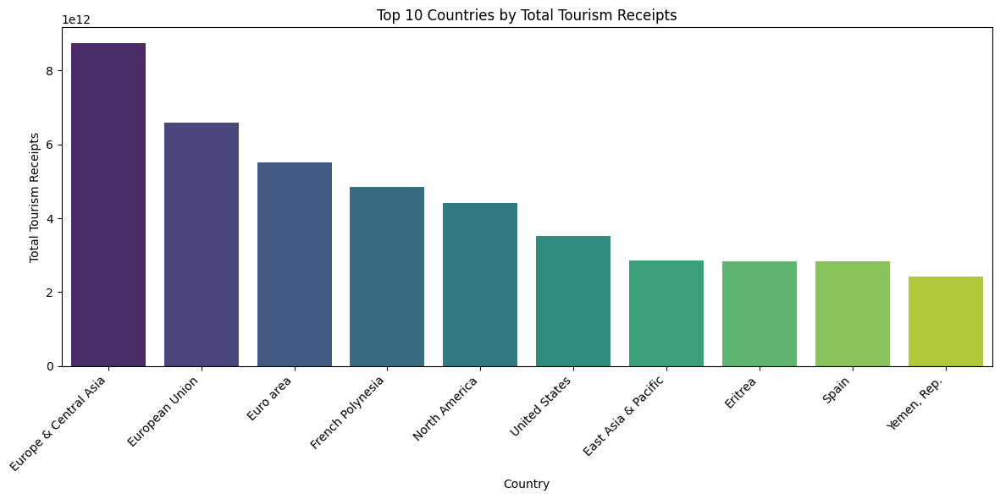

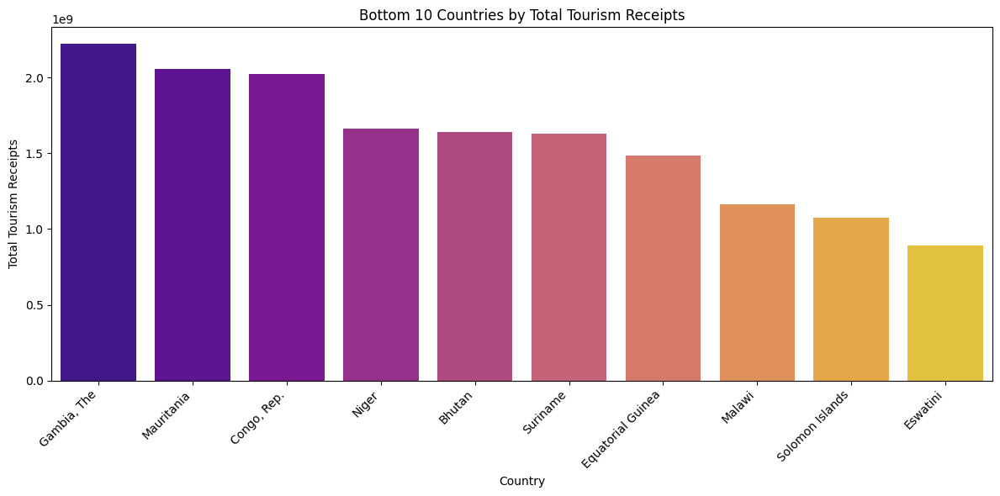

In [7]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate total tourism receipts by country
total_receipts = df.groupby('country')['tourism_receipts'].sum().sort_values(ascending=False)

print("Top 10 Countries by Total Tourism Receipts:")
display(total_receipts.head(10))

print("\nBottom 10 Countries by Total Tourism Receipts:")
display(total_receipts.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_receipts.head(10).index, y=total_receipts.head(10).values, palette='viridis', hue=total_receipts.head(10).index, legend=False)
plt.title('Top 10 Countries by Total Tourism Receipts')
plt.xlabel('Country')
plt.ylabel('Total Tourism Receipts')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_receipts.tail(10).index, y=total_receipts.tail(10).values, palette='plasma', hue=total_receipts.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Total Tourism Receipts')
plt.xlabel('Country')
plt.ylabel('Total Tourism Receipts')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


Top 10 Countries by Total Tourist Arrivals:


,tourism_arrivals
country,
Europe & Central Asia,1.897162e+10
European Union,1.564592e+10
Middle income,1.142003e+10
"Yemen, Rep.",9.453079e+09
Samoa,9.447437e+09
Kosovo,9.447437e+09
Upper middle income,8.736741e+09
Euro area,8.603254e+09
East Asia & Pacific,6.392157e+09



Bottom 10 Countries by Total Tourist Arrivals:


,tourism_arrivals
country,
Niger,3.907000e+06
Palau,3.903400e+06
Bhutan,3.763000e+06
Tonga,3.723000e+06
Moldova,3.546900e+06
Chad,3.334400e+06
Liechtenstein,3.319700e+06
Equatorial Guinea,3.083900e+06
Central African Republic,2.995300e+06


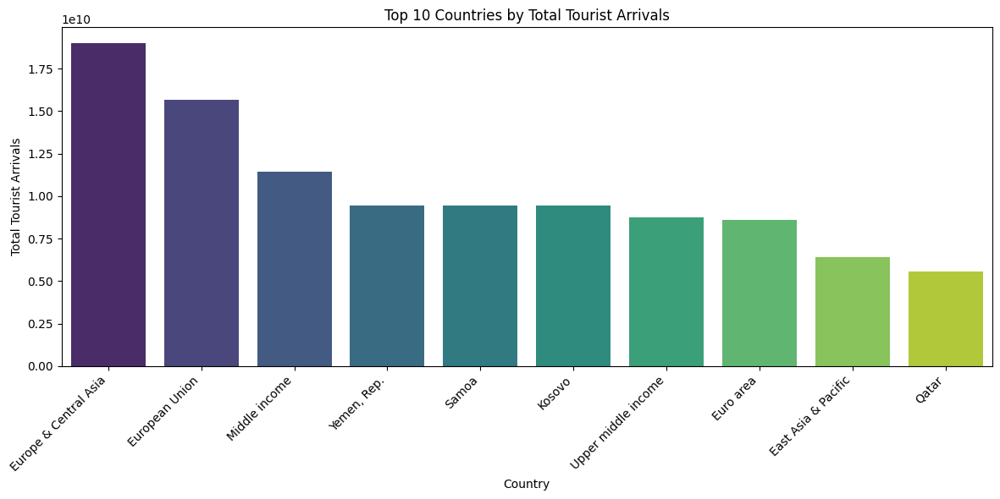

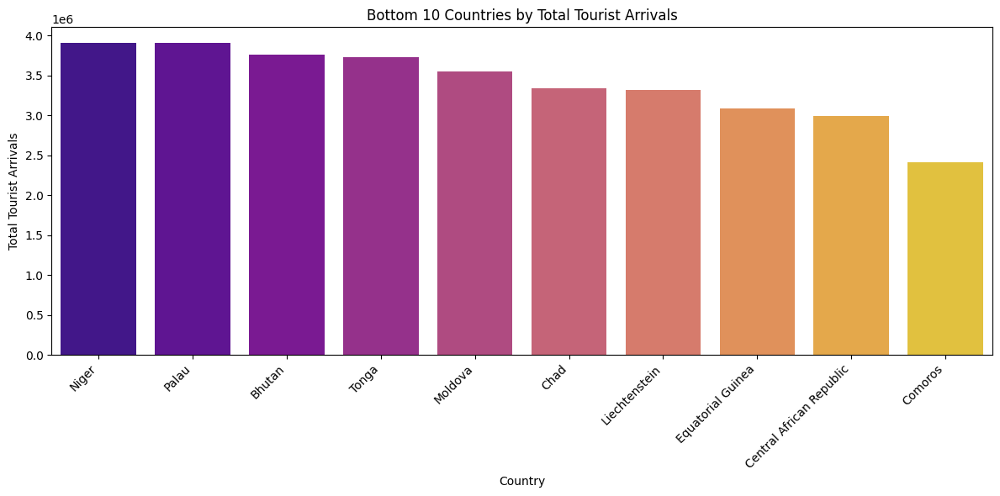

In [8]:
# Calculate total tourist arrivals by country
total_arrivals = df.groupby('country')['tourism_arrivals'].sum().sort_values(ascending=False)

print("Top 10 Countries by Total Tourist Arrivals:")
display(total_arrivals.head(10))

print("\nBottom 10 Countries by Total Tourist Arrivals:")
display(total_arrivals.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_arrivals.head(10).index, y=total_arrivals.head(10).values, palette='viridis', hue=total_arrivals.head(10).index, legend=False)
plt.title('Top 10 Countries by Total Tourist Arrivals')
plt.xlabel('Country')
plt.ylabel('Total Tourist Arrivals')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_arrivals.tail(10).index, y=total_arrivals.tail(10).values, palette='plasma', hue=total_arrivals.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Total Tourist Arrivals')
plt.xlabel('Country')
plt.ylabel('Total Tourist Arrivals')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 3. Tourism Exports Contribution

Let's examine the total tourism exports for each country and visualize the top 10 and bottom 10.

Top 10 Countries by Total Tourism Exports:


,tourism_exports
country,
"Bahamas, The",1538.713910
Vanuatu,1476.149156
St. Lucia,1352.778401
Andorra,1259.219138
Albania,1228.387545
Cabo Verde,1207.227126
Palau,1161.684733
Kosovo,1089.634362
Samoa,1089.634362



Bottom 10 Countries by Total Tourism Exports:


,tourism_exports
country,
Belarus,58.041289
"Congo, Dem. Rep.",55.388959
Japan,54.989759
Paraguay,51.424577
Nicaragua,44.370147
Eswatini,44.363056
"Congo, Rep.",32.211798
Nigeria,29.866877
Kuwait,29.050613


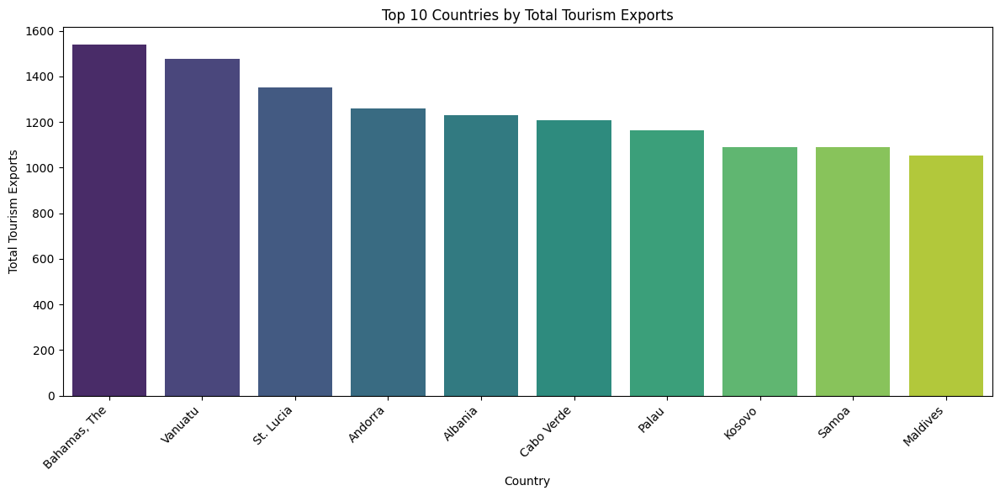

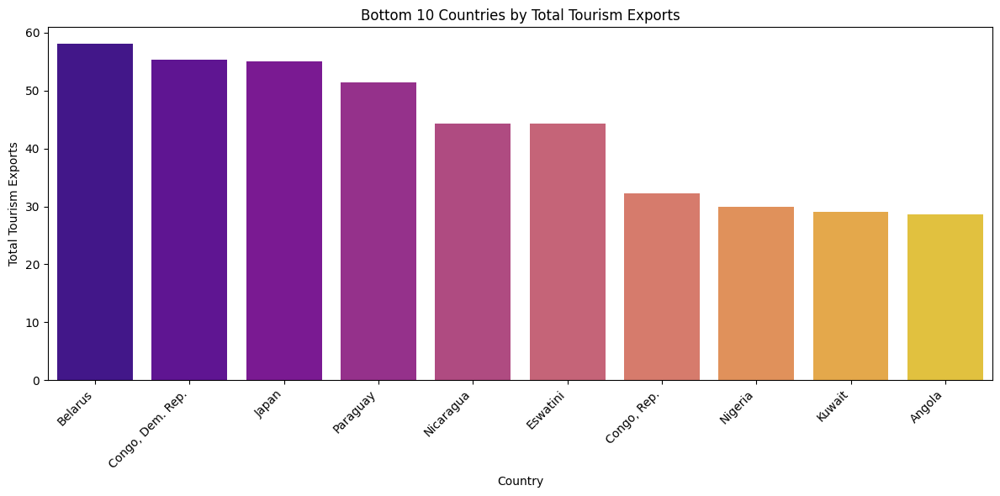

In [9]:
# Calculate total tourism exports by country
total_exports = df.groupby('country')['tourism_exports'].sum().sort_values(ascending=False)

print("Top 10 Countries by Total Tourism Exports:")
display(total_exports.head(10))

print("\nBottom 10 Countries by Total Tourism Exports:")
display(total_exports.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_exports.head(10).index, y=total_exports.head(10).values, palette='viridis', hue=total_exports.head(10).index, legend=False)
plt.title('Top 10 Countries by Total Tourism Exports')
plt.xlabel('Country')
plt.ylabel('Total Tourism Exports')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_exports.tail(10).index, y=total_exports.tail(10).values, palette='plasma', hue=total_exports.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Total Tourism Exports')
plt.xlabel('Country')
plt.ylabel('Total Tourism Exports')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 4. Tourism Expenditure Comparison

Let's analyze the total tourism expenditures by country and visualize the top 10 and bottom 10.

Top 10 Countries by Total Tourism Expenditures:


,tourism_expenditures
country,
Albania,509.723861
Kuwait,504.848110
Andorra,492.185625
Tuvalu,372.981063
Qatar,347.746127
Bermuda,335.732062
Lebanon,335.685043
Armenia,306.255011
Lesotho,297.635988



Bottom 10 Countries by Total Tourism Expenditures:


,tourism_expenditures
country,
Tajikistan,70.833868
Turkmenistan,70.833868
Slovak Republic,69.360790
Bangladesh,68.271527
Bosnia and Herzegovina,65.288231
Algeria,64.446288
Turkiye,63.707122
Trinidad and Tobago,61.227391
Myanmar,47.240235


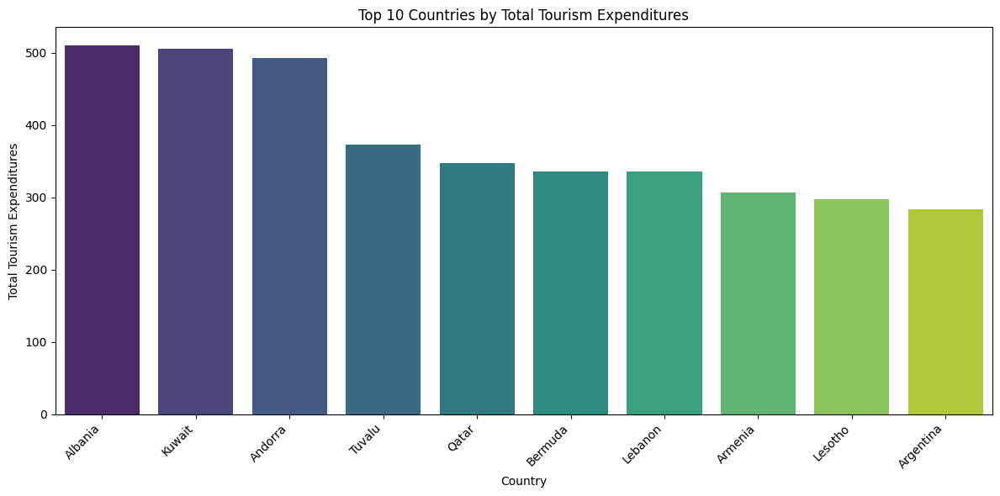

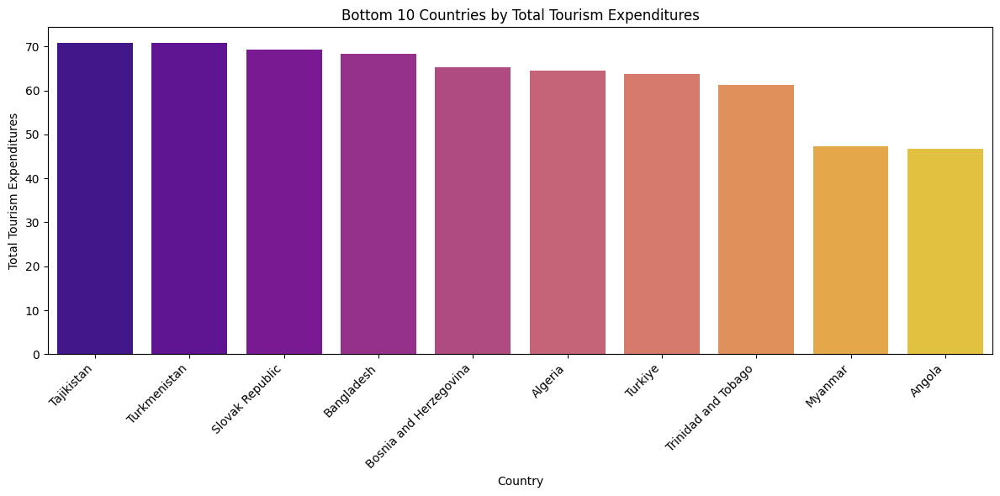

In [10]:
# Calculate total tourism expenditures by country
total_expenditures = df.groupby('country')['tourism_expenditures'].sum().sort_values(ascending=False)

print("Top 10 Countries by Total Tourism Expenditures:")
display(total_expenditures.head(10))

print("\nBottom 10 Countries by Total Tourism Expenditures:")
display(total_expenditures.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_expenditures.head(10).index, y=total_expenditures.head(10).values, palette='viridis', hue=total_expenditures.head(10).index, legend=False)
plt.title('Top 10 Countries by Total Tourism Expenditures')
plt.xlabel('Country')
plt.ylabel('Total Tourism Expenditures')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_expenditures.tail(10).index, y=total_expenditures.tail(10).values, palette='plasma', hue=total_expenditures.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Total Tourism Expenditures')
plt.xlabel('Country')
plt.ylabel('Total Tourism Expenditures')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 5. GDP Comparison

Now, let's compare the total GDP for each country and visualize the top 10 and bottom 10.

Top 10 Countries by Total GDP:


,gdp
country,
Europe & Central Asia,4.966073e+14
Middle income,4.845826e+14
East Asia & Pacific,4.569250e+14
North America,4.516539e+14
United States,4.147068e+14
Upper middle income,3.851904e+14
European Union,3.422840e+14
Euro area,2.980748e+14
China,2.001975e+14



Bottom 10 Countries by Total GDP:


,gdp
country,
St. Vincent and the Grenadines,1.792525e+10
Vanuatu,1.624486e+10
Samoa,1.624335e+10
Dominica,1.179732e+10
"Micronesia, Fed. Sts.",7.737080e+09
Palau,5.450343e+09
Marshall Islands,4.428085e+09
Kiribati,4.247955e+09
Nauru,1.881360e+09


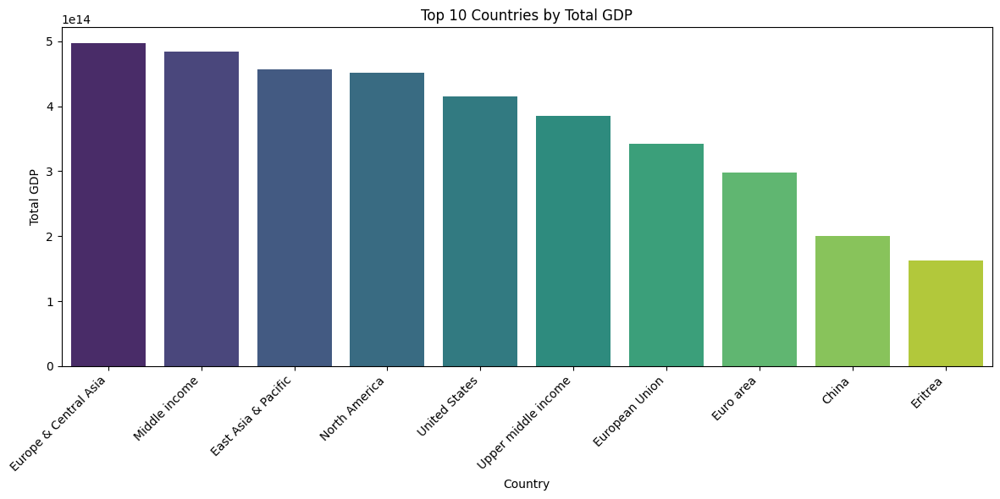

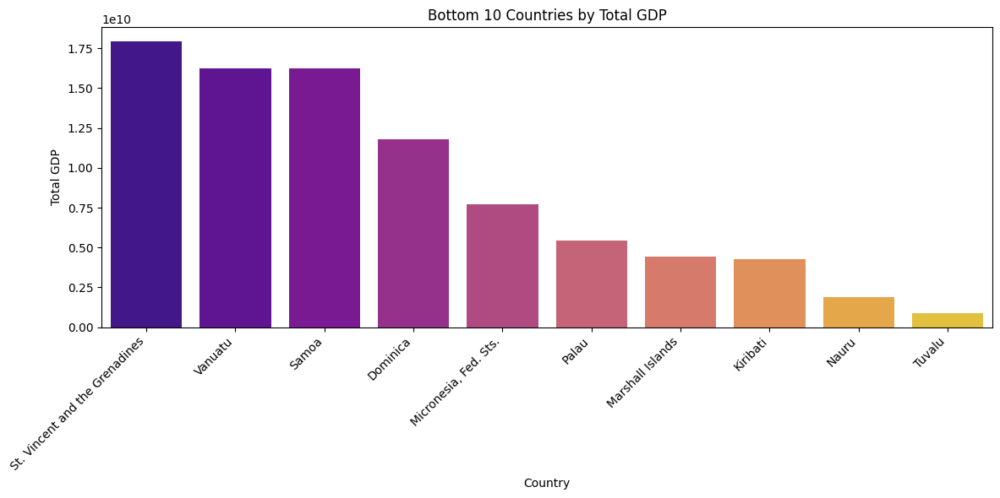

In [11]:
# Calculate total GDP by country
total_gdp = df.groupby('country')['gdp'].sum().sort_values(ascending=False)

print("Top 10 Countries by Total GDP:")
display(total_gdp.head(10))

print("\nBottom 10 Countries by Total GDP:")
display(total_gdp.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_gdp.head(10).index, y=total_gdp.head(10).values, palette='viridis', hue=total_gdp.head(10).index, legend=False)
plt.title('Top 10 Countries by Total GDP')
plt.xlabel('Country')
plt.ylabel('Total GDP')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=total_gdp.tail(10).index, y=total_gdp.tail(10).values, palette='plasma', hue=total_gdp.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Total GDP')
plt.xlabel('Country')
plt.ylabel('Total GDP')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 6. Inflation Comparison

Let's analyze the average inflation rate for each country and visualize the top 10 and bottom 10.

Top 10 Countries by Average Inflation:


,inflation
country,
"Congo, Dem. Rep.",53.554682
Angola,51.802081
Zimbabwe,49.819556
Sudan,44.218182
South Sudan,39.471386
Belarus,35.989276
Lebanon,35.407971
British Virgin Islands,25.174490
"Venezuela, RB",25.174490



Bottom 10 Countries by Average Inflation:


,inflation
country,
Bermuda,1.705811
Belize,1.705811
Dominica,1.693328
France,1.648859
Bahrain,1.383266
"Hong Kong SAR, China",1.314172
Switzerland,0.616985
Channel Islands,0.616985
Brunei Darussalam,0.525566


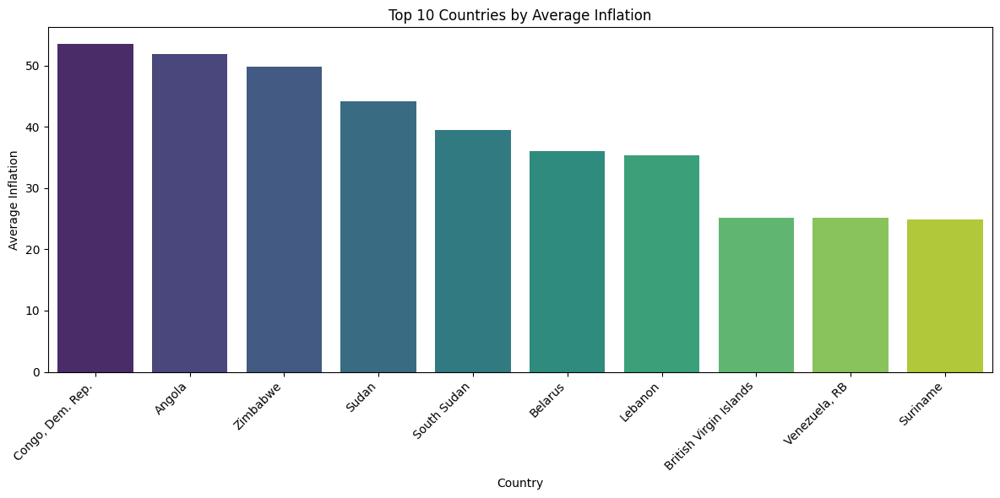

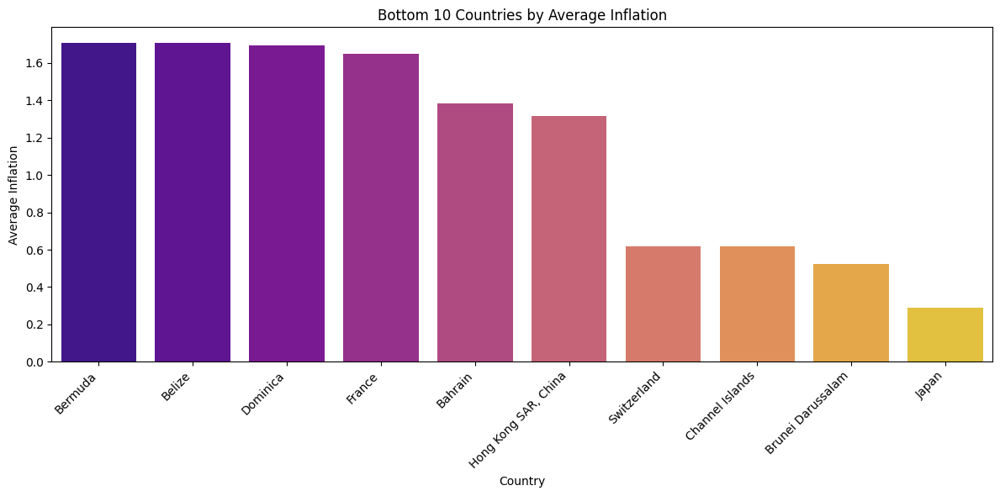

In [12]:
# Calculate average inflation by country
avg_inflation = df.groupby('country')['inflation'].mean().sort_values(ascending=False)

print("Top 10 Countries by Average Inflation:")
display(avg_inflation.head(10))

print("\nBottom 10 Countries by Average Inflation:")
display(avg_inflation.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_inflation.head(10).index, y=avg_inflation.head(10).values, palette='viridis', hue=avg_inflation.head(10).index, legend=False)
plt.title('Top 10 Countries by Average Inflation')
plt.xlabel('Country')
plt.ylabel('Average Inflation')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_inflation.tail(10).index, y=avg_inflation.tail(10).values, palette='plasma', hue=avg_inflation.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Average Inflation')
plt.xlabel('Country')
plt.ylabel('Average Inflation')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 7. Unemployment Comparison

Finally for this section, let's look at the average unemployment rate for each country and visualize the top 10 and bottom 10.

Top 10 Countries by Average Unemployment:


,unemployment
country,
Kosovo,30.196490
North Macedonia,28.052520
South Africa,26.419480
"Yemen, Rep.",23.136200
West Bank and Gaza,20.686960
Pacific island small states,20.101837
Bosnia and Herzegovina,19.493920
Mali,17.572240
Zambia,17.316760



Bottom 10 Countries by Average Unemployment:


,unemployment
country,
Madagascar,3.209960
Vanuatu,2.943480
Isle of Man,2.791680
Viet Nam,2.596720
Cambodia,2.446880
Kuwait,2.259840
Qatar,2.212853
Tajikistan,1.855000
Turkmenistan,1.690120


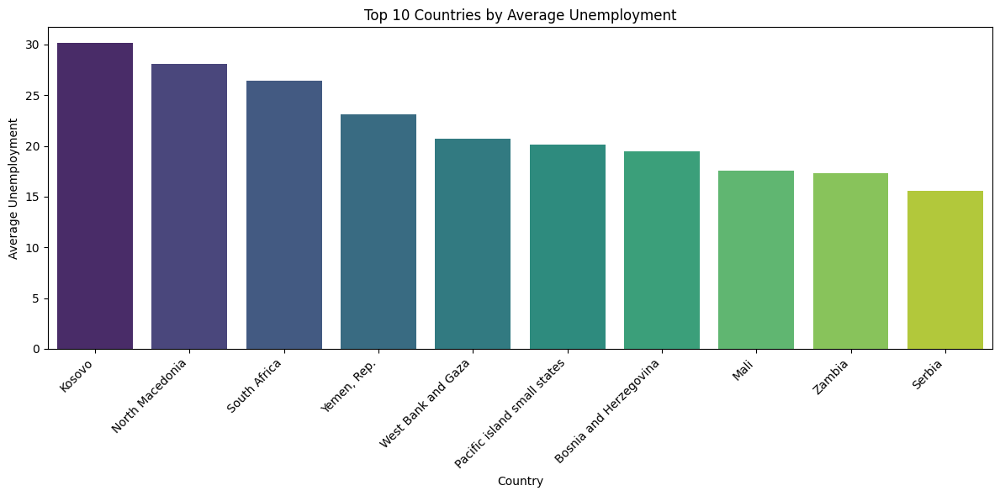

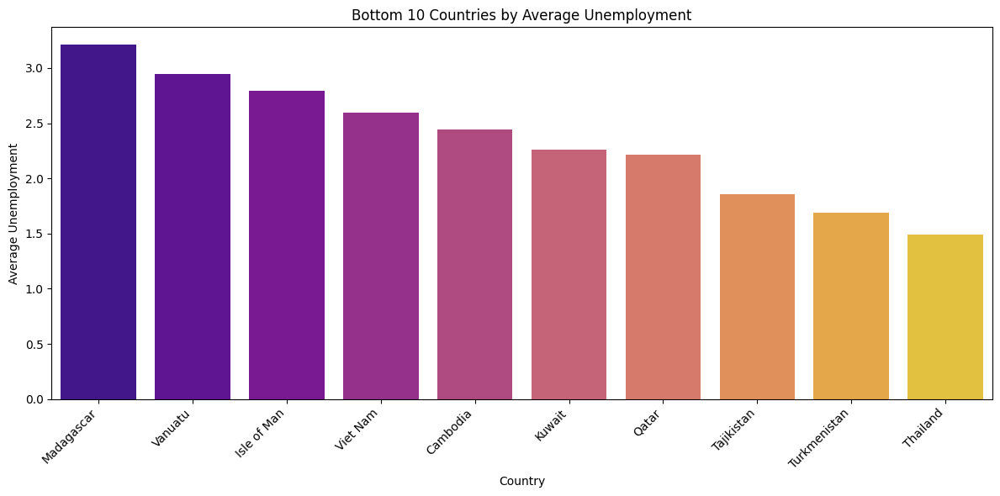

In [13]:
# Calculate average unemployment by country
avg_unemployment = df.groupby('country')['unemployment'].mean().sort_values(ascending=False)

print("Top 10 Countries by Average Unemployment:")
display(avg_unemployment.head(10))

print("\nBottom 10 Countries by Average Unemployment:")
display(avg_unemployment.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_unemployment.head(10).index, y=avg_unemployment.head(10).values, palette='viridis', hue=avg_unemployment.head(10).index, legend=False)
plt.title('Top 10 Countries by Average Unemployment')
plt.xlabel('Country')
plt.ylabel('Average Unemployment')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=avg_unemployment.tail(10).index, y=avg_unemployment.tail(10).values, palette='plasma', hue=avg_unemployment.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Average Unemployment')
plt.xlabel('Country')
plt.ylabel('Average Unemployment')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 8. Tourism Dependency Ranking

To determine tourism dependency, we'll calculate a ratio of 'tourism_receipts' to 'gdp'. A higher ratio suggests greater dependency on tourism.

Top 10 Countries by Tourism Dependency Ratio (Tourism Receipts % of GDP):


/tmp/ipykernel_690/3120155663.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['tourism_dependency_ratio'] = (df['tourism_receipts'] / (df['gdp'] + 1e-9)) * 100


,tourism_dependency_ratio
country,
Samoa,34131.639795
Kosovo,34122.799164
Tuvalu,23529.701387
"Micronesia, Fed. Sts.",9133.167455
St. Vincent and the Grenadines,7990.415133
French Polynesia,3532.552106
Lesotho,3222.444969
Tonga,2413.501187
Timor-Leste,2280.626226



Bottom 10 Countries by Tourism Dependency Ratio (Tourism Receipts % of GDP):


,tourism_dependency_ratio
country,
Cote d'Ivoire,0.465779
United Kingdom,0.451232
Pakistan,0.400280
China,0.355136
Japan,0.320507
Brazil,0.300341
Nigeria,0.181993
Bangladesh,0.082169
Upper middle income,0.022936


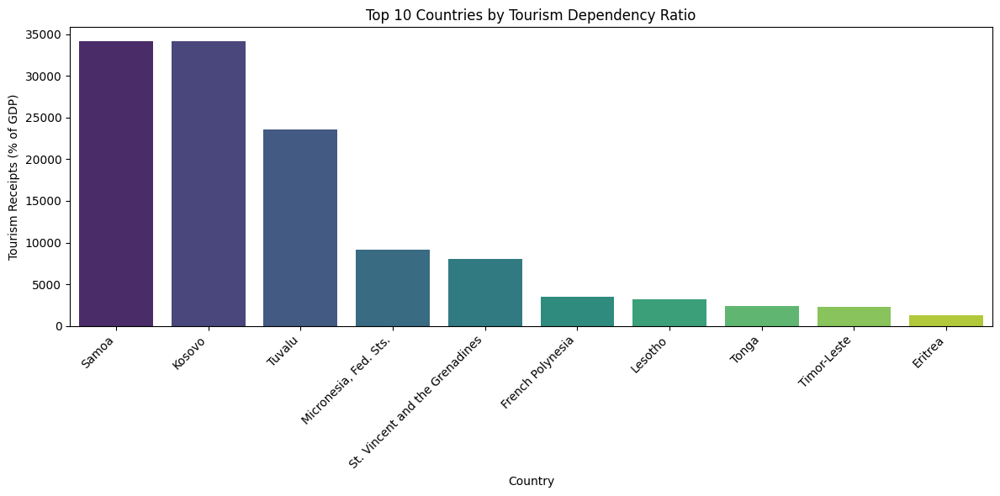

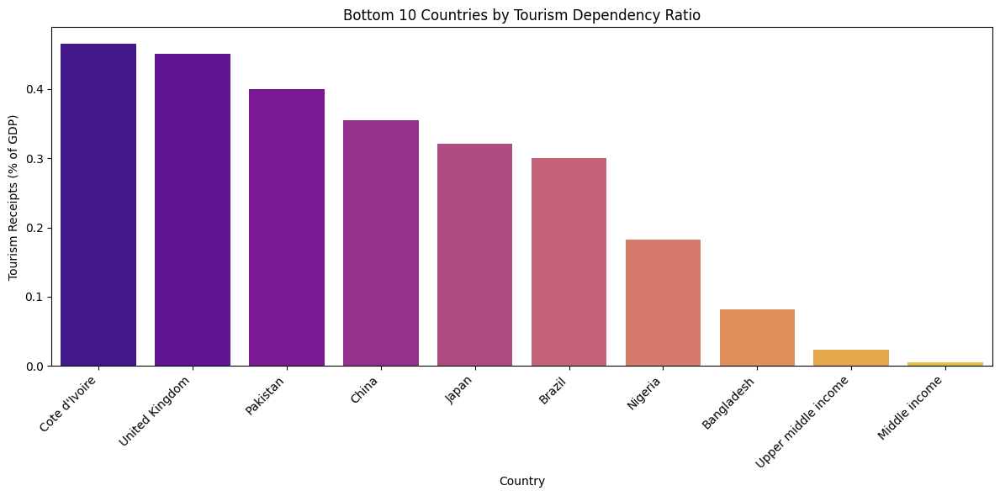

In [14]:
# Calculate Tourism Dependency Ratio (Tourism Receipts as % of GDP)
# To avoid division by zero or very small GDPs skewing results, we'll add a small epsilon
df['tourism_dependency_ratio'] = (df['tourism_receipts'] / (df['gdp'] + 1e-9)) * 100

# Group by country and calculate the mean ratio
tourism_dependency = df.groupby('country')['tourism_dependency_ratio'].mean().sort_values(ascending=False)

print("Top 10 Countries by Tourism Dependency Ratio (Tourism Receipts % of GDP):")
display(tourism_dependency.head(10))

print("\nBottom 10 Countries by Tourism Dependency Ratio (Tourism Receipts % of GDP):")
display(tourism_dependency.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=tourism_dependency.head(10).index, y=tourism_dependency.head(10).values, palette='viridis', hue=tourism_dependency.head(10).index, legend=False)
plt.title('Top 10 Countries by Tourism Dependency Ratio')
plt.xlabel('Country')
plt.ylabel('Tourism Receipts (% of GDP)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=tourism_dependency.tail(10).index, y=tourism_dependency.tail(10).values, palette='plasma', hue=tourism_dependency.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Tourism Dependency Ratio')
plt.xlabel('Country')
plt.ylabel('Tourism Receipts (% of GDP)')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


### 9. Economic Ranking

For 'Economic Ranking', we'll create a composite score based on normalized GDP, inflation, and unemployment. A higher GDP contributes positively, while higher inflation and unemployment contribute negatively.

We will normalize these values to a 0-1 scale to ensure fair weighting, and then combine them into a single score.

Top 10 Countries by Economic Ranking (Composite Score):


,economic_score
country,
Middle income,0.791257
East Asia & Pacific,0.757425
Europe & Central Asia,0.718983
North America,0.718877
United States,0.646123
Upper middle income,0.531721
European Union,0.393956
Euro area,0.297463
China,0.257996



Bottom 10 Countries by Economic Ranking (Composite Score):


,economic_score
country,
Lebanon,-0.835987
"Yemen, Rep.",-0.897999
South Africa,-0.945868
North Macedonia,-0.971268
Sudan,-1.009523
Kosovo,-1.040882
"Congo, Dem. Rep.",-1.086848
South Sudan,-1.182014
Angola,-1.278868


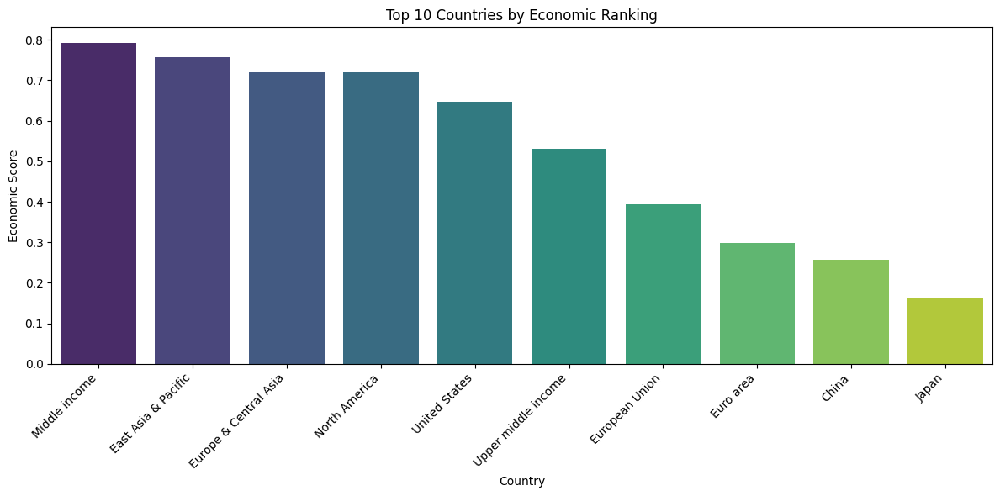

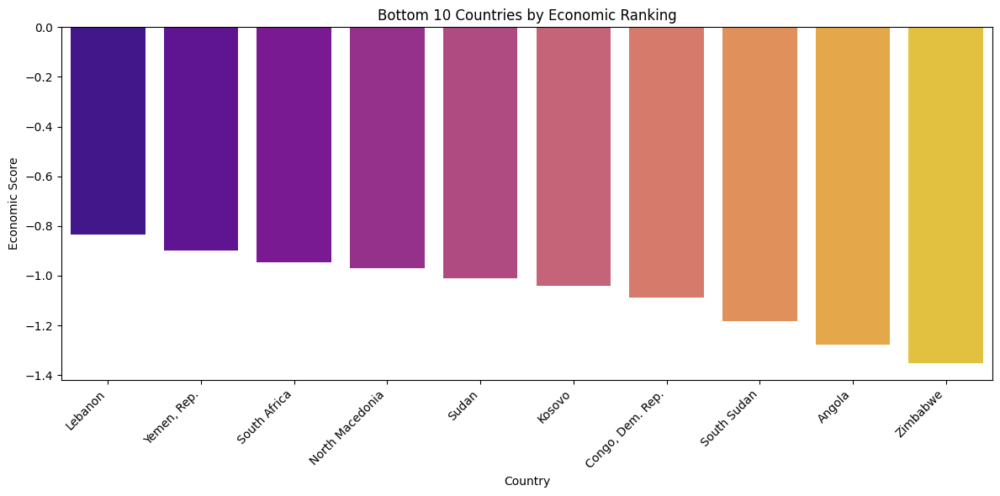

In [15]:
from sklearn.preprocessing import MinMaxScaler

# Prepare data for economic ranking (using mean values per country)
economic_data = df.groupby('country')[['gdp', 'inflation', 'unemployment']].mean().dropna()

# Normalize the data
scaler = MinMaxScaler()
economic_normalized = pd.DataFrame(scaler.fit_transform(economic_data), columns=economic_data.columns, index=economic_data.index)

# Create a composite economic score:
# Higher GDP is better, lower inflation and unemployment are better
# Score = Normalized GDP - Normalized Inflation - Normalized Unemployment
# (You might want to adjust weights based on importance)
economic_normalized['economic_score'] = economic_normalized['gdp'] - economic_normalized['inflation'] - economic_normalized['unemployment']

# Rank countries by economic score
economic_ranking = economic_normalized['economic_score'].sort_values(ascending=False)

print("Top 10 Countries by Economic Ranking (Composite Score):")
display(economic_ranking.head(10))

print("\nBottom 10 Countries by Economic Ranking (Composite Score):")
display(economic_ranking.tail(10))

# Visualize Top 10
plt.figure(figsize=(12, 6))
sns.barplot(x=economic_ranking.head(10).index, y=economic_ranking.head(10).values, palette='viridis', hue=economic_ranking.head(10).index, legend=False)
plt.title('Top 10 Countries by Economic Ranking')
plt.xlabel('Country')
plt.ylabel('Economic Score')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(12, 6))
sns.barplot(x=economic_ranking.tail(10).index, y=economic_ranking.tail(10).values, palette='plasma', hue=economic_ranking.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Economic Ranking')
plt.xlabel('Country')
plt.ylabel('Economic Score')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.show()


## Time-Series Analysis

We will now explore various economic and tourism indicators over time, country by country.

### 1. Year-on-Year Tourism Receipts Growth per Country

Let's calculate the year-on-year growth in tourism receipts for each country and visualize the trends for a few example countries.

In [16]:
# Sort data by country and year to ensure correct year-on-year calculation
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate year-on-year growth for tourism_receipts
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change() * 100

print("DataFrame with Year-on-Year Tourism Receipts Growth:")
display(df_sorted.head())

DataFrame with Year-on-Year Tourism Receipts Growth:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300


#### Visualize Tourism Receipts Growth for Selected Countries

Let's pick a few countries to visualize their tourism receipts growth over the years. You can change the `selected_countries` list to see trends for other nations.

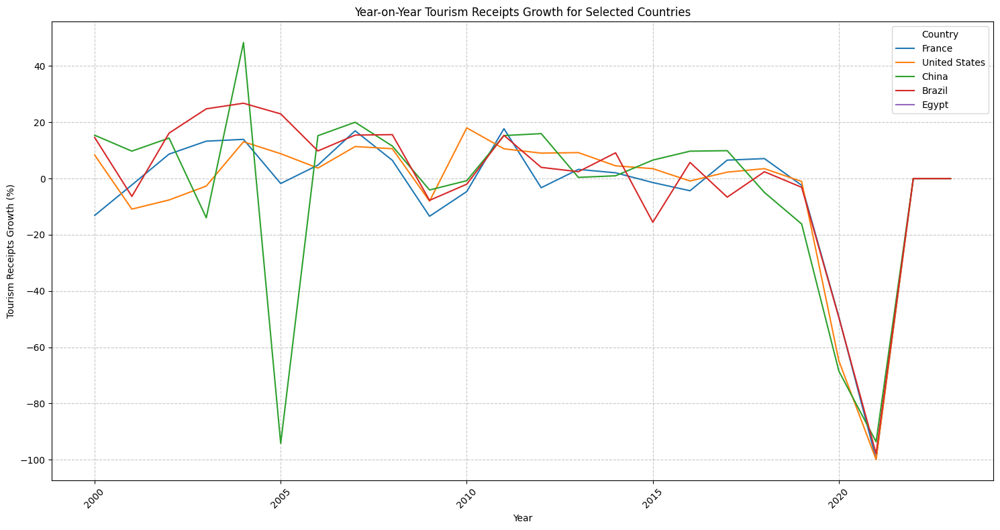

In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define a list of countries to visualize
selected_countries = ['France', 'United States', 'China', 'Brazil', 'Egypt'] # Example countries

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_receipts_growth', data=country_data, label=country)

plt.title('Year-on-Year Tourism Receipts Growth for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Receipts Growth (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 2. GDP Growth Over the Years per Country

Next, let's analyze the year-on-year GDP growth for each country.

In [18]:
# Calculate year-on-year growth for GDP
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change() * 100

print("DataFrame with Year-on-Year GDP Growth:")
display(df_sorted.head())

DataFrame with Year-on-Year GDP Growth:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017


#### Visualize GDP Growth for Selected Countries

Let's visualize the GDP growth trends for the same selected countries.

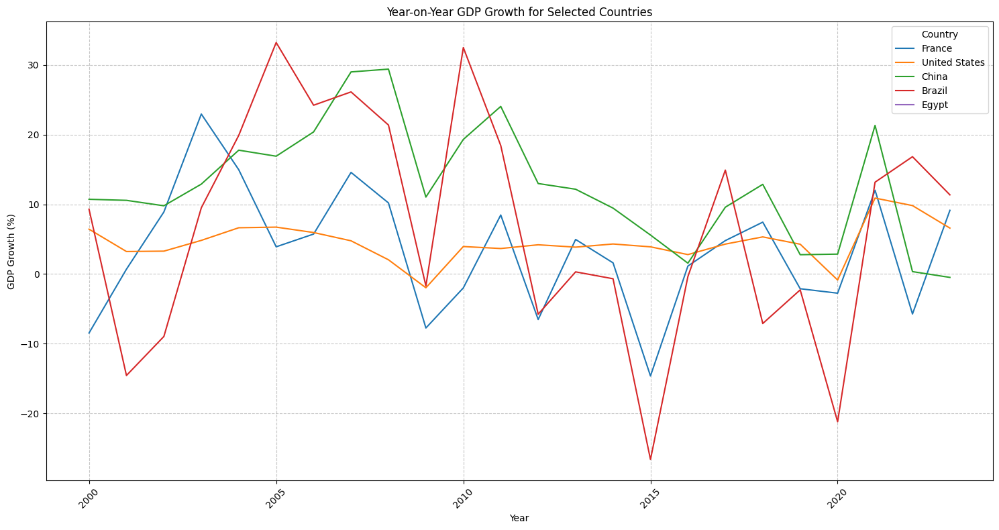

In [19]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='gdp_growth', data=country_data, label=country)

plt.title('Year-on-Year GDP Growth for Selected Countries')
plt.xlabel('Year')
plt.ylabel('GDP Growth (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 3. Inflation Trend Over the Years per Country

Let's analyze the year-on-year inflation trend for each country.

In [20]:
# Calculate year-on-year growth for inflation (percentage change)
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change() * 100

print("DataFrame with Year-on-Year Inflation Percentage Change:")
display(df_sorted.head())

DataFrame with Year-on-Year Inflation Percentage Change:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth,inflation_pct_change
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311,9.995318
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172,-32.100633
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125,50.055180
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017,-14.994186


#### Visualize Inflation Trend for Selected Countries

Let's visualize the inflation trends for the same selected countries. We'll use the absolute inflation values, not the percentage change, for this plot as trends are usually shown with the value itself.

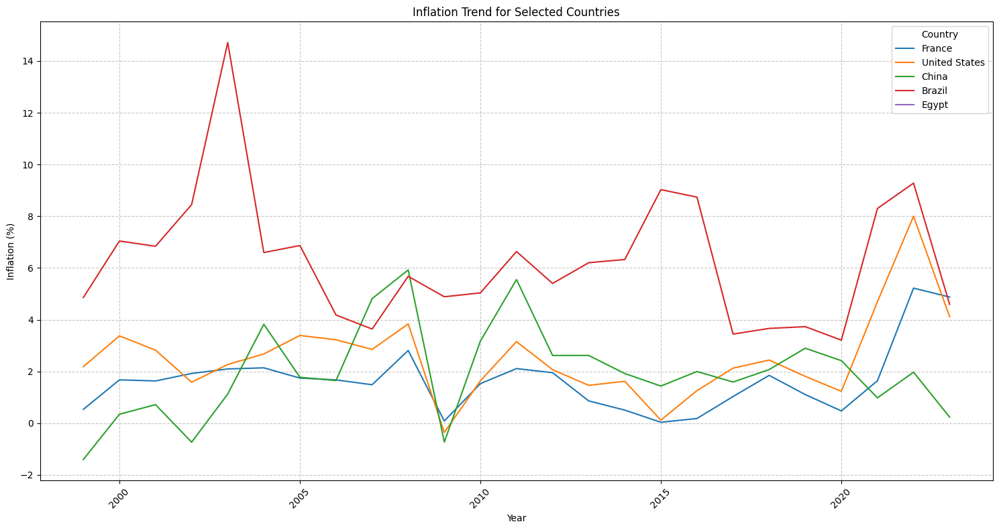

In [21]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='inflation', data=country_data, label=country)

plt.title('Inflation Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Inflation (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 4. Unemployment Trend Over the Years per Country

Next, let's analyze the year-on-year unemployment trend for each country.

In [22]:
# Calculate year-on-year growth for unemployment (percentage change)
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change() * 100

print("DataFrame with Year-on-Year Unemployment Percentage Change:")
display(df_sorted.head())

DataFrame with Year-on-Year Unemployment Percentage Change:


/tmp/ipykernel_690/760921365.py:2: FutureWarning: The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change() * 100


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth,inflation_pct_change,unemployment_pct_change
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311,9.995318,NaN
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172,-32.100633,-0.289017
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125,50.055180,267.695652
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017,-14.994186,7.130188


#### Visualize Unemployment Trend for Selected Countries

Let's visualize the unemployment trends for the same selected countries using the absolute unemployment values.

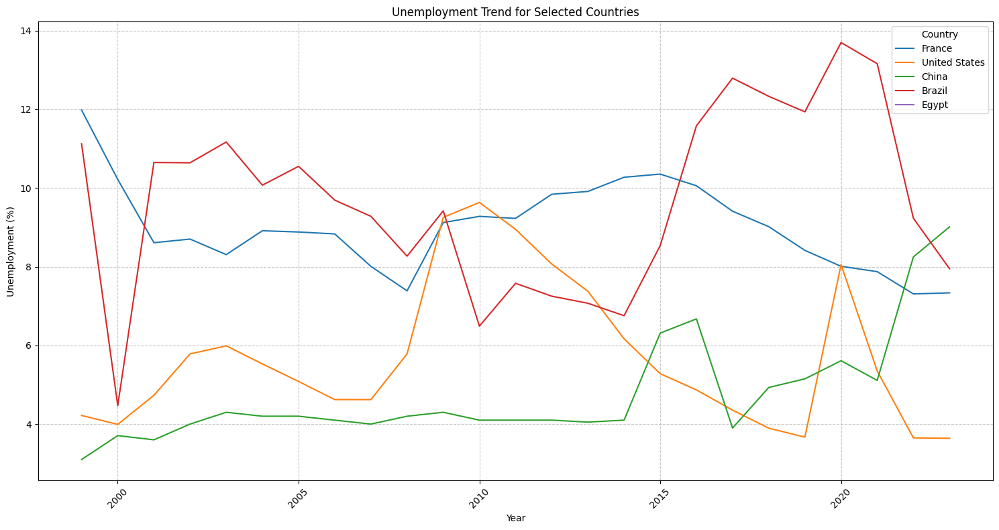

In [23]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='unemployment', data=country_data, label=country)

plt.title('Unemployment Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Unemployment (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 5. Tourism Receipts Trend Over the Years per Country

Let's visualize the absolute tourism receipts trend over the years for the selected countries.

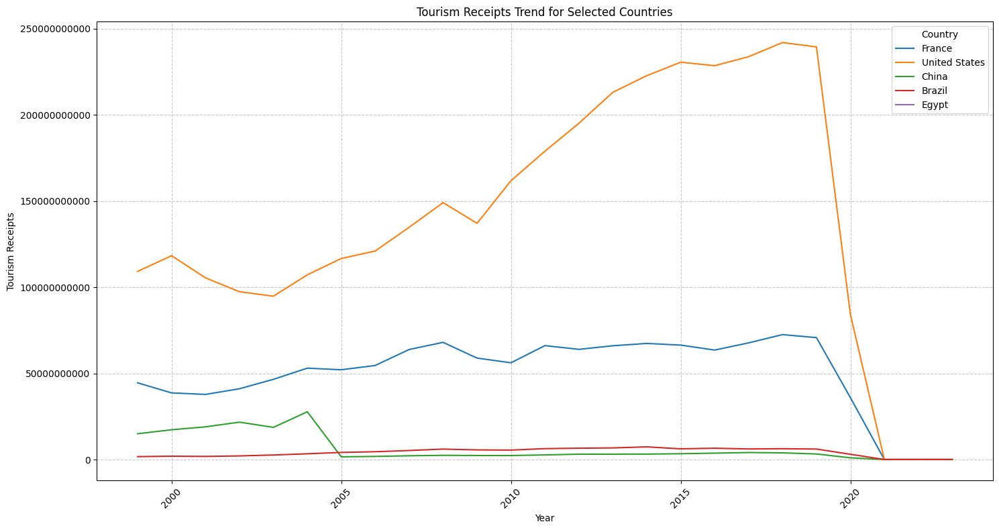

In [24]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_receipts', data=country_data, label=country)

plt.title('Tourism Receipts Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Receipts')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis
plt.tight_layout()
plt.show()

### 6. Tourism Arrivals Trend Over the Years per Country

Now, let's visualize the trend of total tourist arrivals over the years for the selected countries.

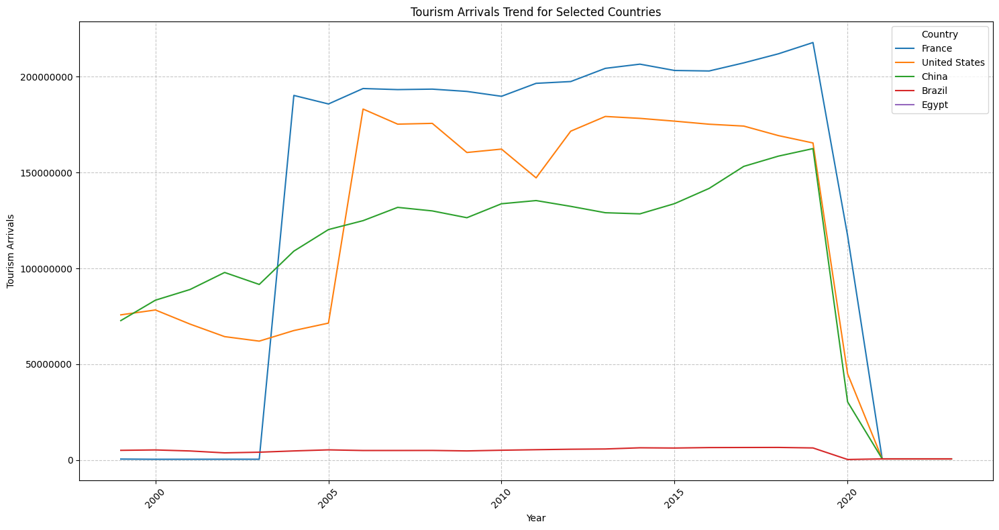

In [25]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_arrivals', data=country_data, label=country)

plt.title('Tourism Arrivals Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Arrivals')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 7. Tourism Expenditure Trend Over the Years per Country

Let's visualize the trend of total tourism expenditures over the years for the selected countries.

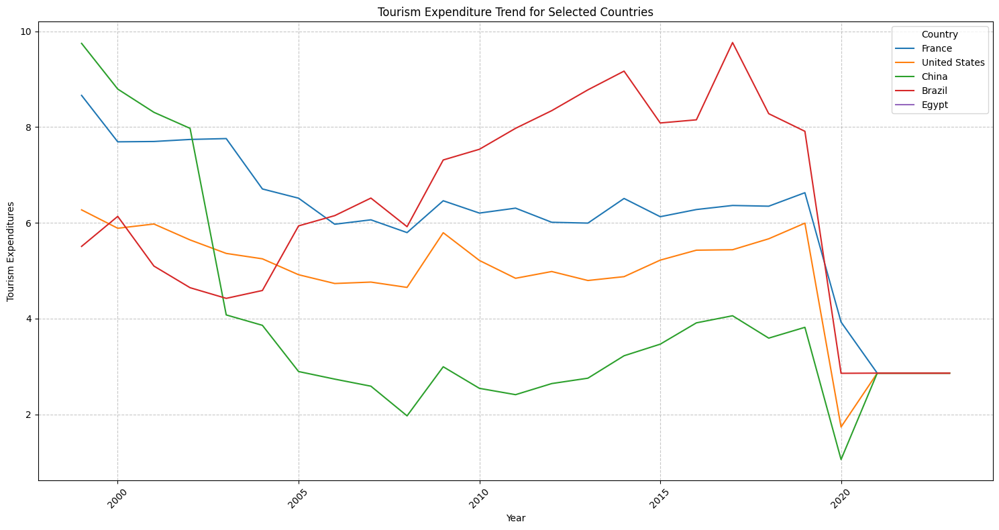

In [26]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_expenditures', data=country_data, label=country)

plt.title('Tourism Expenditure Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Expenditures')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 8. Tourism Export Trend Over the Years per Country

Finally for the trends, let's visualize the trend of total tourism exports over the years for the selected countries.

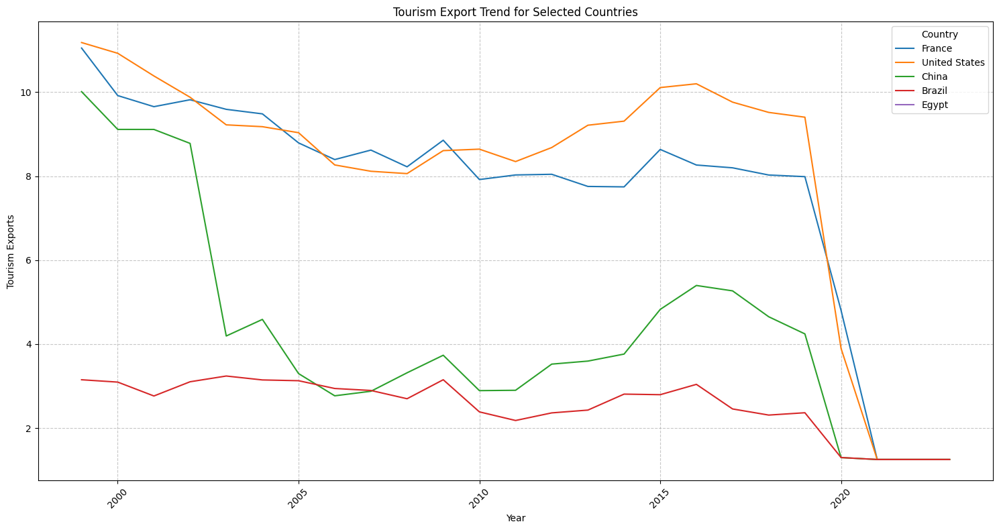

In [27]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_exports', data=country_data, label=country)

plt.title('Tourism Export Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Exports')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 9. Growth Percentage Over the Years per Country

We have already calculated year-on-year growth percentages for `tourism_receipts` and `gdp`. Let's now explicitly calculate and display growth percentages for `tourism_arrivals`, `tourism_expenditures`, and `tourism_exports`.

In [28]:
# Calculate year-on-year growth for tourism_arrivals
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change() * 100

# Calculate year-on-year growth for tourism_expenditures
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change() * 100

# Calculate year-on-year growth for tourism_exports
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change() * 100

print("DataFrame with all calculated Year-on-Year Growth Percentages:")
display(df_sorted[['country', 'year', 'tourism_receipts_growth', 'gdp_growth',
                     'tourism_arrivals_growth', 'tourism_expenditures_growth',
                     'tourism_exports_growth']].head(10))

DataFrame with all calculated Year-on-Year Growth Percentages:


,country,year,tourism_receipts_growth,gdp_growth,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,1999,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,2000,-12.430349,-98.673311,0.286096,-3.054166,-20.629385
534,Afghanistan,2001,6.452755,-20.101172,3.266549,-7.746266,11.914656
800,Afghanistan,2002,10.373554,35.973125,9.641806,-3.607051,4.055545
1066,Afghanistan,2003,47.640300,18.173017,2.652016,6.457177,20.572101
1332,Afghanistan,2004,18.293638,15.570851,5.052378,-9.628782,-6.063611
1598,Afghanistan,2005,11.553479,18.724960,6.249964,0.680231,-12.620669
1864,Afghanistan,2006,11.960610,12.388682,13.720323,1.808245,-7.835450
2130,Afghanistan,2007,16.313658,39.819624,10.880983,-9.037698,-6.425393
2396,Afghanistan,2008,-99.728224,3.707582,1.187342,-83.031299,-68.065601


### 3. Inflation Trend Over the Years per Country

Let's analyze the year-on-year inflation trend for each country.

In [29]:
# Calculate year-on-year growth for inflation (percentage change)
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change() * 100

print("DataFrame with Year-on-Year Inflation Percentage Change:")
display(df_sorted.head())

DataFrame with Year-on-Year Inflation Percentage Change:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth,inflation_pct_change,unemployment_pct_change,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311,9.995318,NaN,0.286096,-3.054166,-20.629385
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172,-32.100633,-0.289017,3.266549,-7.746266,11.914656
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125,50.055180,267.695652,9.641806,-3.607051,4.055545
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017,-14.994186,7.130188,2.652016,6.457177,20.572101


#### Visualize Inflation Trend for Selected Countries

Let's visualize the inflation trends for the same selected countries. We'll use the absolute inflation values, not the percentage change, for this plot as trends are usually shown with the value itself.

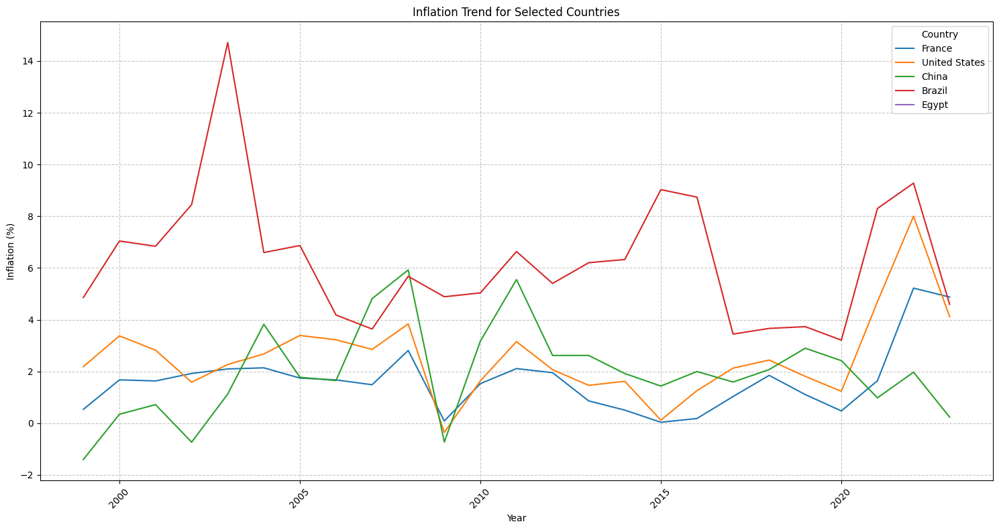

In [30]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='inflation', data=country_data, label=country)

plt.title('Inflation Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Inflation (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 4. Unemployment Trend Over the Years per Country

Next, let's analyze the year-on-year unemployment trend for each country.

In [31]:
# Calculate year-on-year growth for unemployment (percentage change)
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change() * 100

print("DataFrame with Year-on-Year Unemployment Percentage Change:")
display(df_sorted.head())

DataFrame with Year-on-Year Unemployment Percentage Change:


/tmp/ipykernel_690/760921365.py:2: FutureWarning: The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change() * 100


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth,inflation_pct_change,unemployment_pct_change,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311,9.995318,NaN,0.286096,-3.054166,-20.629385
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172,-32.100633,-0.289017,3.266549,-7.746266,11.914656
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125,50.055180,267.695652,9.641806,-3.607051,4.055545
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017,-14.994186,7.130188,2.652016,6.457177,20.572101


#### Visualize Unemployment Trend for Selected Countries

Let's visualize the unemployment trends for the same selected countries using the absolute unemployment values.

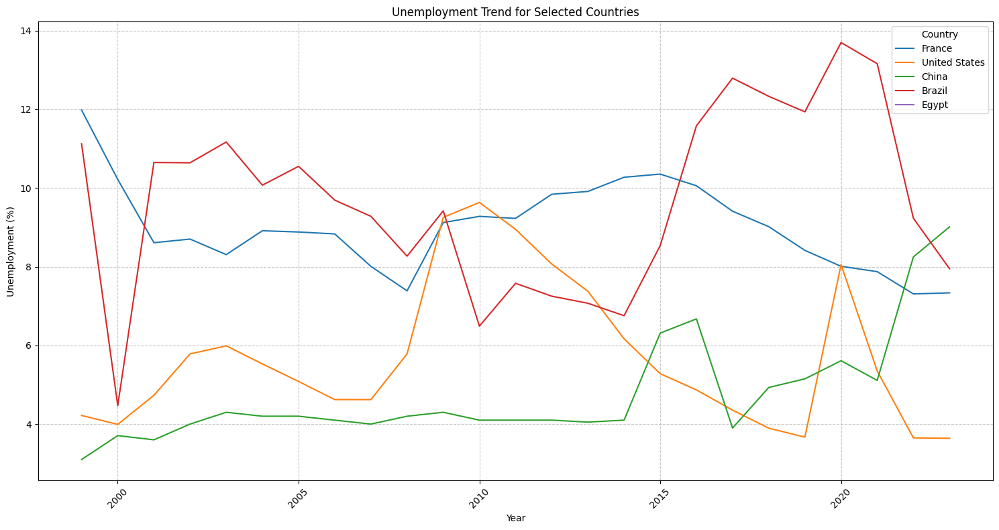

In [32]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='unemployment', data=country_data, label=country)

plt.title('Unemployment Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Unemployment (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 5. Tourism Receipts Trend Over the Years per Country

Let's visualize the absolute tourism receipts trend over the years for the selected countries.

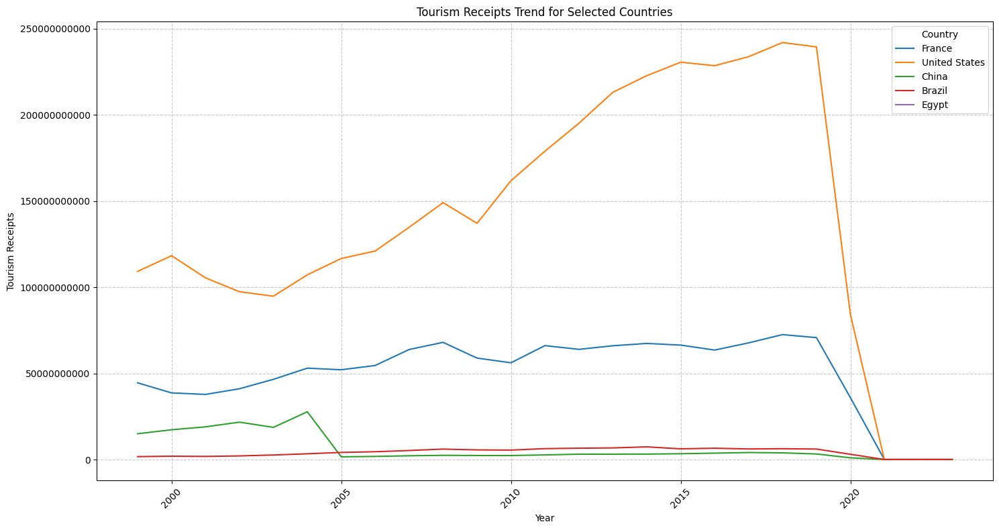

In [33]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_receipts', data=country_data, label=country)

plt.title('Tourism Receipts Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Receipts')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis
plt.tight_layout()
plt.show()

### 6. Tourism Arrivals Trend Over the Years per Country

Now, let's visualize the trend of total tourist arrivals over the years for the selected countries.

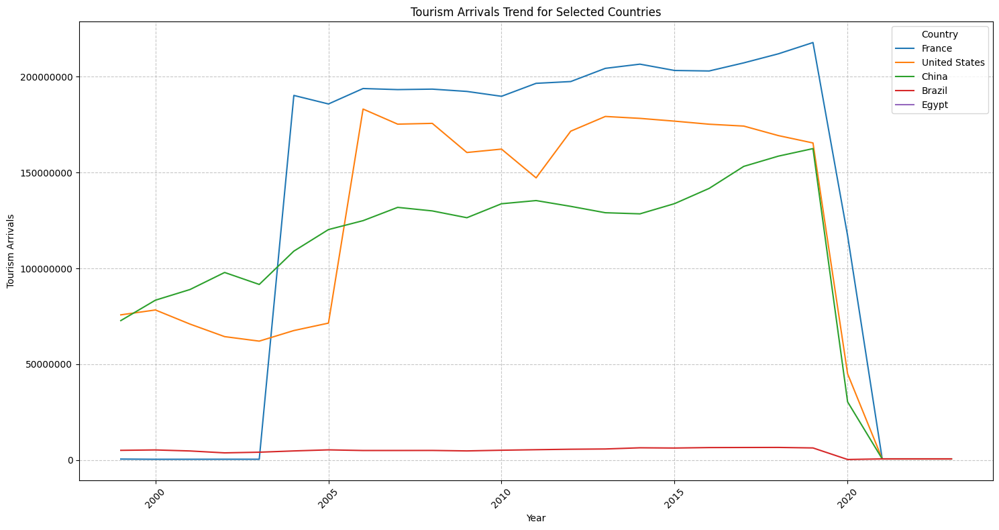

In [34]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_arrivals', data=country_data, label=country)

plt.title('Tourism Arrivals Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Arrivals')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 7. Tourism Expenditure Trend Over the Years per Country

Let's visualize the trend of total tourism expenditures over the years for the selected countries.

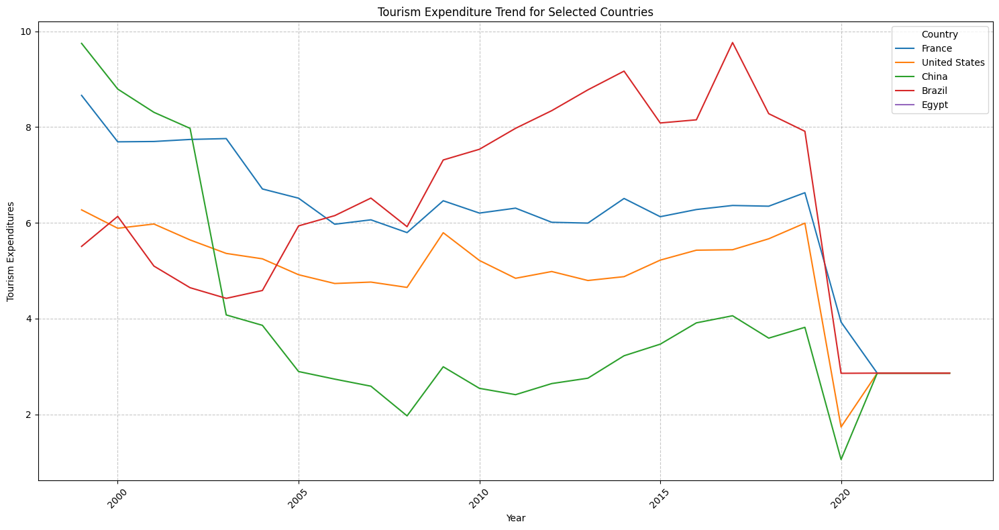

In [35]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_expenditures', data=country_data, label=country)

plt.title('Tourism Expenditure Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Expenditures')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 8. Tourism Export Trend Over the Years per Country

Finally for the trends, let's visualize the trend of total tourism exports over the years for the selected countries.

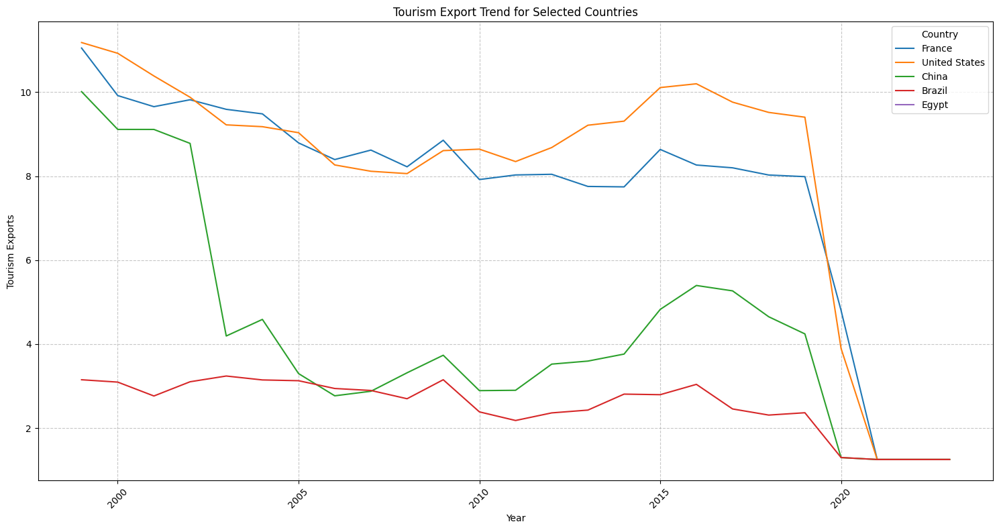

In [36]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_exports', data=country_data, label=country)

plt.title('Tourism Export Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Exports')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 9. Growth Percentage Over the Years per Country

We have already calculated year-on-year growth percentages for `tourism_receipts` and `gdp`. Let's now explicitly calculate and display growth percentages for `tourism_arrivals`, `tourism_expenditures`, and `tourism_exports`.

In [37]:
# Calculate year-on-year growth for tourism_arrivals
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change() * 100

# Calculate year-on-year growth for tourism_expenditures
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change() * 100

# Calculate year-on-year growth for tourism_exports
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change() * 100

print("DataFrame with all calculated Year-on-Year Growth Percentages:")
display(df_sorted[['country', 'year', 'tourism_receipts_growth', 'gdp_growth',
                     'tourism_arrivals_growth', 'tourism_expenditures_growth',
                     'tourism_exports_growth']].head(10))

DataFrame with all calculated Year-on-Year Growth Percentages:


,country,year,tourism_receipts_growth,gdp_growth,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,1999,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,2000,-12.430349,-98.673311,0.286096,-3.054166,-20.629385
534,Afghanistan,2001,6.452755,-20.101172,3.266549,-7.746266,11.914656
800,Afghanistan,2002,10.373554,35.973125,9.641806,-3.607051,4.055545
1066,Afghanistan,2003,47.640300,18.173017,2.652016,6.457177,20.572101
1332,Afghanistan,2004,18.293638,15.570851,5.052378,-9.628782,-6.063611
1598,Afghanistan,2005,11.553479,18.724960,6.249964,0.680231,-12.620669
1864,Afghanistan,2006,11.960610,12.388682,13.720323,1.808245,-7.835450
2130,Afghanistan,2007,16.313658,39.819624,10.880983,-9.037698,-6.425393
2396,Afghanistan,2008,-99.728224,3.707582,1.187342,-83.031299,-68.065601


### 3. Inflation Trend Over the Years per Country

Let's analyze the year-on-year inflation trend for each country.

In [38]:
# Calculate year-on-year growth for inflation (percentage change)
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change() * 100

print("DataFrame with Year-on-Year Inflation Percentage Change:")
display(df_sorted.head())

DataFrame with Year-on-Year Inflation Percentage Change:


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth,inflation_pct_change,unemployment_pct_change,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311,9.995318,NaN,0.286096,-3.054166,-20.629385
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172,-32.100633,-0.289017,3.266549,-7.746266,11.914656
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125,50.055180,267.695652,9.641806,-3.607051,4.055545
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017,-14.994186,7.130188,2.652016,6.457177,20.572101


#### Visualize Inflation Trend for Selected Countries

Let's visualize the inflation trends for the same selected countries. We'll use the absolute inflation values, not the percentage change, for this plot as trends are usually shown with the value itself.

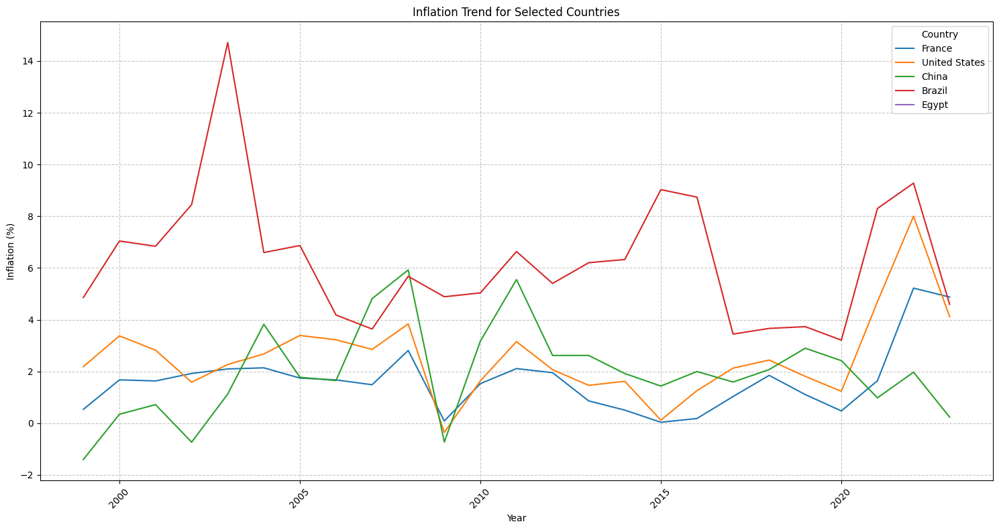

In [39]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='inflation', data=country_data, label=country)

plt.title('Inflation Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Inflation (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 4. Unemployment Trend Over the Years per Country

Next, let's analyze the year-on-year unemployment trend for each country.

In [40]:
# Calculate year-on-year growth for unemployment (percentage change)
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change() * 100

print("DataFrame with Year-on-Year Unemployment Percentage Change:")
display(df_sorted.head())

DataFrame with Year-on-Year Unemployment Percentage Change:


/tmp/ipykernel_690/760921365.py:2: FutureWarning: The default fill_method='ffill' in SeriesGroupBy.pct_change is deprecated and will be removed in a future version. Either fill in any non-leading NA values prior to calling pct_change or specify 'fill_method=None' to not fill NA values.
  df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change() * 100


,country,country_code,year,tourism_receipts,tourism_arrivals,tourism_exports,tourism_departures,tourism_expenditures,gdp,inflation,unemployment,tourism_dependency_ratio,tourism_receipts_growth,gdp_growth,inflation_pct_change,unemployment_pct_change,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,AFG,1999,8.034209e+09,15309377.84,12.204030,NaN,7.760536,2.654290e+11,7.819865,NaN,3.026877,NaN,NaN,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,AFG,2000,7.035529e+09,15353177.30,9.686414,331000.0,7.523516,3.521418e+09,8.601485,6.920,199.792491,-12.430349,-98.673311,9.995318,NaN,0.286096,-3.054166,-20.629385
534,Afghanistan,AFG,2001,7.489514e+09,15854696.29,10.840517,61000.0,6.940725,2.813572e+09,5.840354,6.900,266.192406,6.452755,-20.101172,-32.100633,-0.289017,3.266549,-7.746266,11.914656
800,Afghanistan,AFG,2002,8.266443e+09,17383375.42,11.280159,56000.0,6.690369,3.825701e+09,8.763754,25.371,216.076537,10.373554,35.973125,50.055180,267.695652,9.641806,-3.607051,4.055545
1066,Afghanistan,AFG,2003,1.220460e+10,17844385.28,13.600724,53000.0,7.122378,4.520947e+09,7.449700,27.180,269.956760,47.640300,18.173017,-14.994186,7.130188,2.652016,6.457177,20.572101


#### Visualize Unemployment Trend for Selected Countries

Let's visualize the unemployment trends for the same selected countries using the absolute unemployment values.

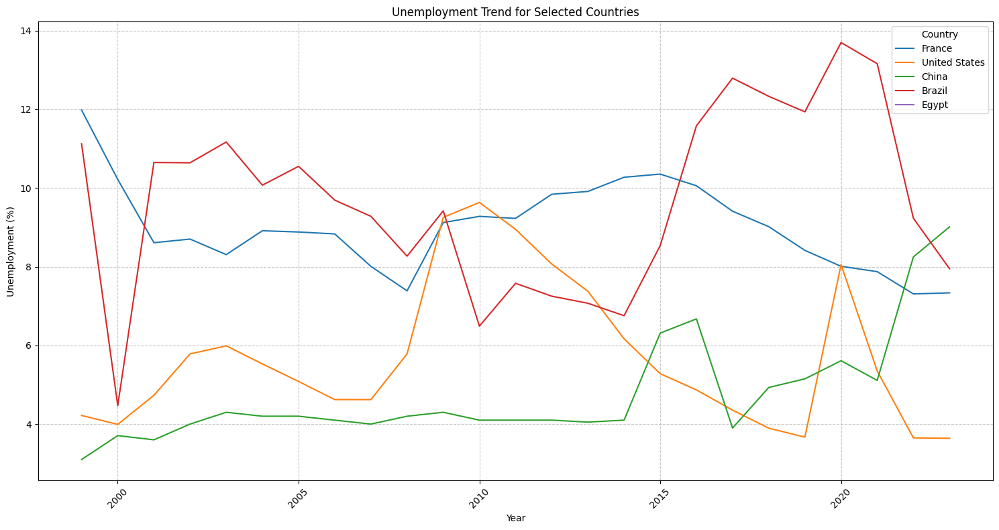

In [41]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='unemployment', data=country_data, label=country)

plt.title('Unemployment Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Unemployment (%)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 5. Tourism Receipts Trend Over the Years per Country

Let's visualize the absolute tourism receipts trend over the years for the selected countries.

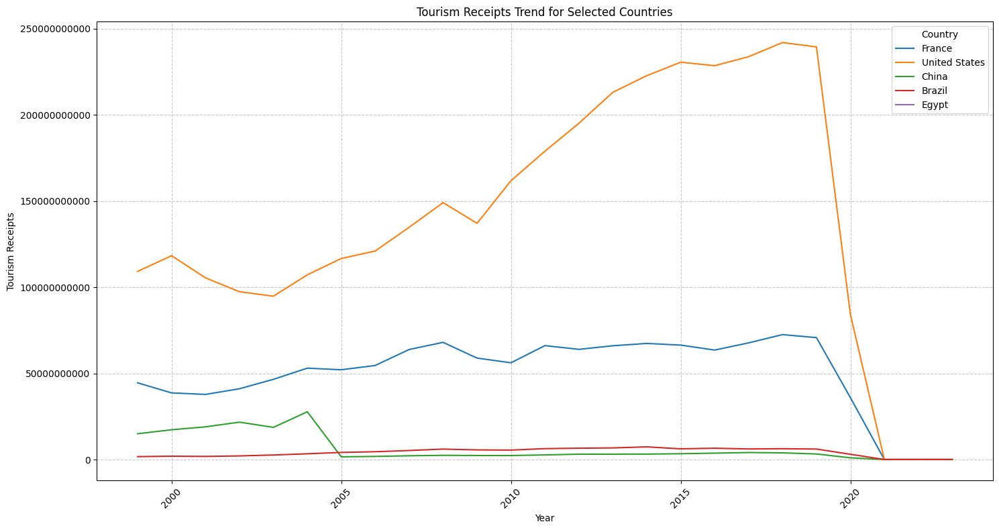

In [42]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_receipts', data=country_data, label=country)

plt.title('Tourism Receipts Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Receipts')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis
plt.tight_layout()
plt.show()

### 6. Tourism Arrivals Trend Over the Years per Country

Now, let's visualize the trend of total tourist arrivals over the years for the selected countries.

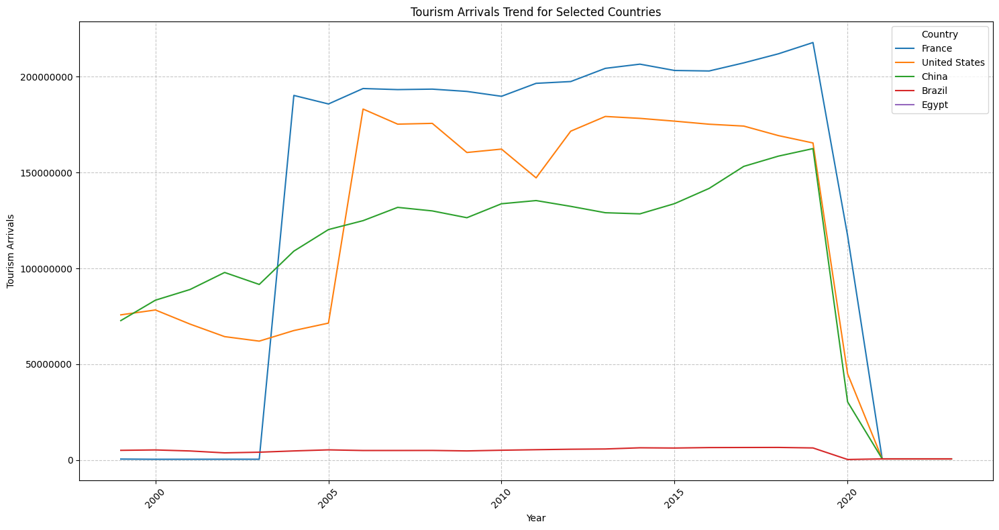

In [43]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_arrivals', data=country_data, label=country)

plt.title('Tourism Arrivals Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Arrivals')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 7. Tourism Expenditure Trend Over the Years per Country

Let's visualize the trend of total tourism expenditures over the years for the selected countries.

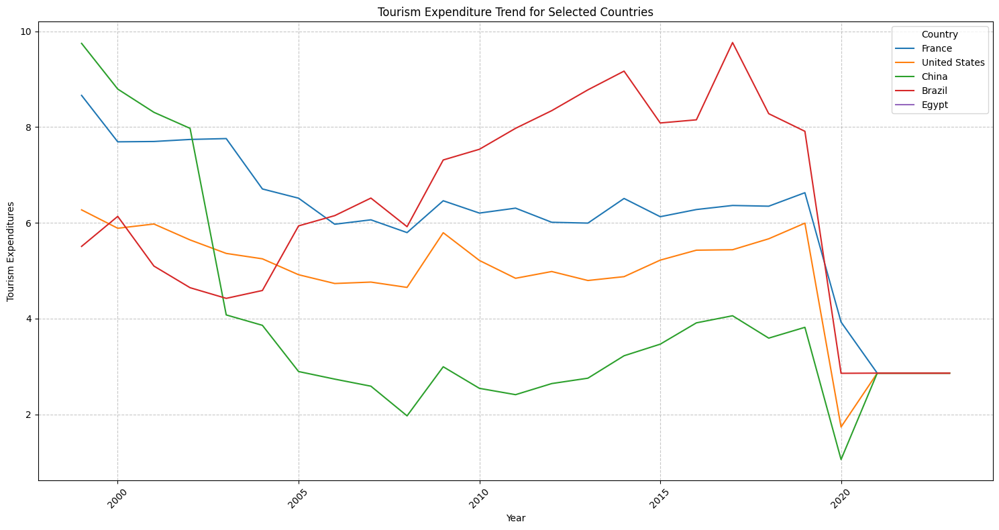

In [44]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_expenditures', data=country_data, label=country)

plt.title('Tourism Expenditure Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Expenditures')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 8. Tourism Export Trend Over the Years per Country

Finally for the trends, let's visualize the trend of total tourism exports over the years for the selected countries.

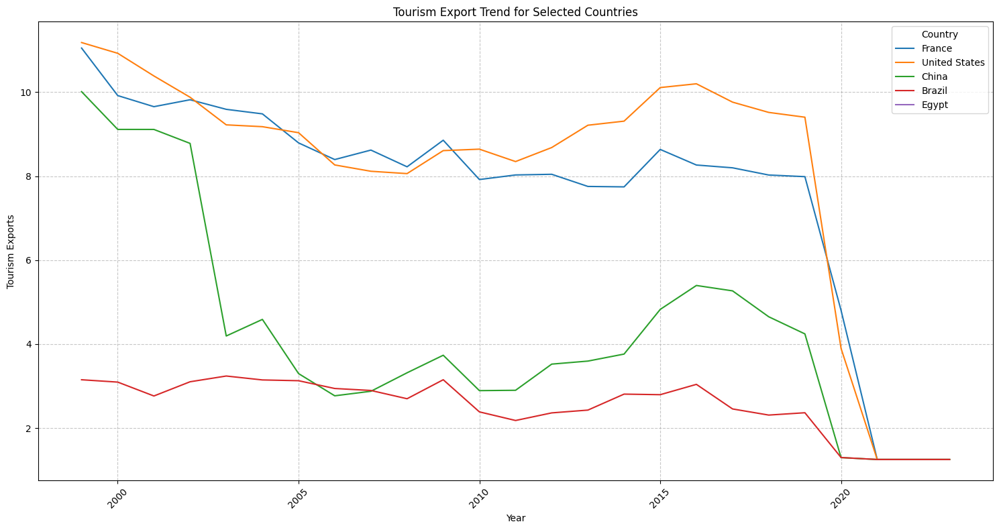

In [45]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_exports', data=country_data, label=country)

plt.title('Tourism Export Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Exports')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 9. Growth Percentage Over the Years per Country

We have already calculated year-on-year growth percentages for `tourism_receipts` and `gdp`. Let's now explicitly calculate and display growth percentages for `tourism_arrivals`, `tourism_expenditures`, and `tourism_exports`.

In [46]:
# Calculate year-on-year growth for tourism_arrivals
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change() * 100

# Calculate year-on-year growth for tourism_expenditures
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change() * 100

# Calculate year-on-year growth for tourism_exports
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change() * 100

print("DataFrame with all calculated Year-on-Year Growth Percentages:")
display(df_sorted[['country', 'year', 'tourism_receipts_growth', 'gdp_growth',
                     'tourism_arrivals_growth', 'tourism_expenditures_growth',
                     'tourism_exports_growth']].head(10))

DataFrame with all calculated Year-on-Year Growth Percentages:


,country,year,tourism_receipts_growth,gdp_growth,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,1999,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,2000,-12.430349,-98.673311,0.286096,-3.054166,-20.629385
534,Afghanistan,2001,6.452755,-20.101172,3.266549,-7.746266,11.914656
800,Afghanistan,2002,10.373554,35.973125,9.641806,-3.607051,4.055545
1066,Afghanistan,2003,47.640300,18.173017,2.652016,6.457177,20.572101
1332,Afghanistan,2004,18.293638,15.570851,5.052378,-9.628782,-6.063611
1598,Afghanistan,2005,11.553479,18.724960,6.249964,0.680231,-12.620669
1864,Afghanistan,2006,11.960610,12.388682,13.720323,1.808245,-7.835450
2130,Afghanistan,2007,16.313658,39.819624,10.880983,-9.037698,-6.425393
2396,Afghanistan,2008,-99.728224,3.707582,1.187342,-83.031299,-68.065601


## Distribution Analysis per Country

In [47]:
import numpy as np
import pandas as pd

# Define numerical columns for which to calculate distribution statistics
numerical_cols = [
    'tourism_receipts', 'tourism_arrivals', 'tourism_exports', 'tourism_departures',
    'tourism_expenditures', 'gdp', 'inflation', 'unemployment', 'tourism_dependency_ratio'
]

# Function to calculate distribution statistics for a given column
def calculate_distribution_stats(df_grouped, column):
    # Use named aggregation for skew and kurt to ensure they are properly calculated
    # 'mean', 'median', 'var', 'std', 'min', 'max' work directly
    # For 'skew' and 'kurt', we provide the function explicitly.
    stats = df_grouped[column].agg(
        mean='mean',
        median='median',
        var='var',
        std='std',
        min='min',
        max='max',
        skew=pd.Series.skew,  # Explicitly use pandas Series skew function
        kurt=pd.Series.kurt   # Explicitly use pandas Series kurt function
    )

    # Custom calculation for mode, handling cases where it might be empty or multi-valued
    modes = df_grouped[column].apply(lambda x: x.mode()[0] if not x.mode().empty else np.nan)
    stats['mode'] = modes

    stats['range'] = stats['max'] - stats['min']

    # Calculate quartiles and IQR
    q1 = df_grouped[column].quantile(0.25)
    q3 = df_grouped[column].quantile(0.75)
    stats['25th_percentile'] = q1
    stats['75th_percentile'] = q3
    stats['iqr'] = q3 - q1

    # Reorder columns for better readability
    final_stats = stats[['mean', 'median', 'mode', 'range', 'var', 'std',
                         '25th_percentile', '75th_percentile', 'iqr', 'skew', 'kurt']]
    return final_stats

# Group the sorted DataFrame by country
df_country_grouped = df_sorted.groupby('country')

# Iterate through each numerical column and calculate/display statistics
for col in numerical_cols:
    print(f"### Distribution Analysis for: **{col.replace('_', ' ').title()}**\n")

    if col in df_sorted.columns:
        # Calculate stats for the current column, dropping rows with all NaN stats
        col_stats = calculate_distribution_stats(df_country_grouped, col).dropna(how='all')

        if not col_stats.empty:
            display(col_stats)
        else:
            print(f"No meaningful distribution statistics found for '{col}' for any country.\n")
    else:
        print(f"Column '{col}' not found in the DataFrame. Skipping.\n")

### Distribution Analysis for: **Tourism Receipts**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,4.562983e+09,1.470000e+08,66000000.0,2.095717e+10,4.582943e+19,6.769743e+09,6.600000e+07,8.034209e+09,7.968209e+09,1.242697,0.227218
Africa Eastern and Southern,1.647172e+10,1.917994e+10,66000000.0,2.860664e+10,9.717702e+19,9.857840e+09,8.034209e+09,2.511940e+10,1.708519e+10,-0.490092,-1.187791
Africa Western and Central,3.115441e+09,3.074293e+09,66000000.0,7.321316e+09,4.937546e+18,2.222059e+09,1.475215e+09,4.741440e+09,3.266225e+09,0.149144,-0.866706
Albania,1.222920e+09,1.479000e+09,66000000.0,2.392000e+09,5.865647e+17,7.658751e+08,4.920000e+08,1.833000e+09,1.341000e+09,-0.201070,-1.376367
Algeria,8.839400e+08,3.260000e+08,66000000.0,3.102000e+09,1.309667e+18,1.144407e+09,1.965000e+08,4.770000e+08,2.805000e+08,1.294554,-0.222008
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,4.212800e+09,3.232000e+09,66000000.0,1.176400e+10,1.178400e+19,3.432783e+09,1.234000e+09,7.250000e+09,6.016000e+09,0.625243,-0.688729
West Bank and Gaza,2.128400e+08,1.460000e+08,66000000.0,6.010000e+08,3.192139e+16,1.786656e+08,6.600000e+07,3.770000e+08,3.110000e+08,0.749267,-0.636317
"Yemen, Rep.",9.697089e+10,1.160000e+08,66000000.0,6.462909e+11,5.117213e+22,2.262126e+11,7.380000e+07,1.097000e+09,1.023200e+09,1.984677,2.121303


### Distribution Analysis for: **Tourism Arrivals**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,2.318545e+07,2.511490e+07,639000.0,4.055015e+07,1.630891e+14,1.277063e+07,1.585470e+07,3.442663e+07,1.857194e+07,-0.468254,-0.732494
Africa Eastern and Southern,2.318545e+07,2.511490e+07,639000.0,4.055015e+07,1.630891e+14,1.277063e+07,1.585470e+07,3.442663e+07,1.857194e+07,-0.468254,-0.732494
Africa Western and Central,1.089568e+07,8.902380e+06,639000.0,4.055015e+07,1.325359e+14,1.151243e+07,4.615887e+06,1.056971e+07,5.953825e+06,1.989276,3.142563
Albania,2.219480e+06,1.420000e+06,639000.0,6.089000e+06,3.639630e+12,1.907781e+06,6.390000e+05,3.514000e+06,2.875000e+06,0.820999,-0.518366
Algeria,1.611240e+06,1.710000e+06,639000.0,2.142000e+06,5.310522e+11,7.287333e+05,9.010000e+05,2.301000e+06,1.400000e+06,0.006308,-1.424929
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,5.480280e+06,3.837000e+06,639000.0,1.737000e+07,2.071785e+13,4.551686e+06,2.429000e+06,7.572000e+06,5.143000e+06,1.422304,1.647164
West Bank and Gaza,3.695200e+05,4.000000e+05,639000.0,6.550000e+05,4.888509e+10,2.210997e+05,1.230000e+05,5.450000e+05,4.220000e+05,-0.318744,-1.296698
"Yemen, Rep.",3.781232e+08,6.390000e+05,639000.0,1.501587e+09,3.838171e+17,6.195298e+08,1.580000e+05,1.254467e+09,1.254309e+09,1.061917,-0.922618


### Distribution Analysis for: **Tourism Exports**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,7.062429,6.067873,1.253967,12.346757,16.555234,4.068812,4.216855,10.840517,6.623661,0.086529,-1.297517
Africa Eastern and Southern,11.847283,10.288890,1.253967,73.332810,181.813087,13.483808,8.872038,11.163609,2.291571,4.491798,21.735484
Africa Western and Central,3.264226,3.133958,1.253967,4.364137,1.333322,1.154696,2.563382,3.974476,1.411094,0.043805,-0.241409
Albania,49.135502,52.937920,1.253967,72.489250,401.066082,20.026634,48.195168,60.242108,12.046940,-1.607347,2.156080
Algeria,12.098953,0.750374,1.253967,50.121143,431.558052,20.773975,0.475290,1.253967,0.778678,1.300281,-0.334860
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,4.069592,4.495428,1.253967,5.755661,3.506715,1.872622,2.414150,5.583648,3.169498,-0.429477,-1.197446
West Bank and Gaza,12.452710,10.621850,1.253967,35.427287,111.070805,10.539013,2.930096,17.029913,14.099816,0.918392,0.007151
"Yemen, Rep.",29.094122,12.714204,1.253967,65.103571,688.460251,26.238526,7.035897,59.304985,52.269088,0.403124,-1.838169


### Distribution Analysis for: **Tourism Departures**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,1.138896e+06,570000.0,18500.0,3.374500e+06,1.587066e+12,1.259788e+06,263500.0,2408000.0,2144500.0,0.939381,-0.929466
Africa Eastern and Southern,1.138896e+06,570000.0,18500.0,3.374500e+06,1.587066e+12,1.259788e+06,263500.0,2408000.0,2144500.0,0.939381,-0.929466
Africa Western and Central,1.138896e+06,570000.0,18500.0,3.374500e+06,1.587066e+12,1.259788e+06,263500.0,2408000.0,2144500.0,0.939381,-0.929466
Albania,2.870104e+06,3191500.0,18500.0,5.903500e+06,3.300439e+12,1.816711e+06,1338250.0,4126500.0,2788250.0,-0.201701,-1.073898
Algeria,2.038860e+06,1513000.0,18500.0,5.713500e+06,2.662872e+12,1.631831e+06,1254000.0,2136000.0,882000.0,1.180206,0.601403
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,3.704776e+06,832000.0,18500.0,6.053140e+07,1.452547e+14,1.205217e+07,151000.0,1530000.0,1379000.0,4.740431,23.082261
West Bank and Gaza,4.393800e+05,278000.0,18500.0,1.529500e+06,2.152833e+11,4.639864e+05,170000.0,426000.0,256000.0,1.516341,0.997784
"Yemen, Rep.",7.286134e+07,54000.0,18500.0,1.820338e+09,1.325408e+17,3.640615e+08,51000.0,57000.0,6000.0,5.000000,25.000000


### Distribution Analysis for: **Tourism Expenditures**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,3.715480,2.860109,2.860109,7.058817,6.242760,2.498551,1.697663,6.480364,4.782701,0.466282,-1.571243
Africa Eastern and Southern,5.945280,5.393901,2.860109,15.991246,9.141750,3.023533,4.764333,6.597545,1.833212,3.365792,14.562710
Africa Western and Central,7.248902,7.863533,2.860109,11.030068,8.117590,2.849138,6.147291,8.690737,2.543446,-0.525819,-0.048618
Albania,20.388954,24.058987,2.860109,25.205796,68.346843,8.267215,21.121635,25.117955,3.996319,-1.520866,0.878975
Algeria,2.577852,1.413772,2.860109,6.164885,4.523167,2.126774,1.001898,2.860109,1.858211,1.032022,-0.600423
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,3.521196,2.286691,2.860109,7.872798,7.245988,2.691837,1.683965,2.860109,1.176144,1.288327,-0.066003
West Bank and Gaza,8.795385,9.220205,2.860109,13.839063,10.123837,3.181798,7.076935,10.268455,3.191520,-0.031655,0.986856
"Yemen, Rep.",2.890076,2.639628,2.860109,6.439492,4.409706,2.099930,1.080620,3.066858,1.986237,0.954295,-0.287321


### Distribution Analysis for: **Gdp**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,2.335199e+10,1.585667e+10,2.813572e+09,2.626154e+11,2.581904e+21,5.081244e+10,6.971758e+09,1.879944e+10,1.182769e+10,4.878224,24.165885
Africa Eastern and Southern,7.575428e+11,8.494100e+11,2.609920e+11,9.844780e+11,9.373436e+22,3.061607e+11,5.166610e+11,9.729990e+11,4.563380e+11,-0.411967,-1.047281
Africa Western and Central,5.665917e+11,6.838880e+11,1.394680e+11,7.579480e+11,7.127606e+22,2.669758e+11,3.133280e+11,7.898020e+11,4.764740e+11,-0.483604,-1.328675
Albania,1.146088e+10,1.204421e+10,3.212122e+09,2.033506e+10,2.567878e+19,5.067423e+09,8.052077e+09,1.322815e+10,5.176070e+09,0.170662,0.106196
Algeria,1.582199e+11,1.803840e+11,4.864067e+10,1.989853e+11,4.030038e+21,6.348258e+10,1.070470e+11,1.945540e+11,8.750700e+10,-0.480679,-1.056178
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,1.822803e+11,1.725950e+11,2.868366e+10,4.010333e+11,1.748644e+22,1.322363e+11,5.763326e+10,2.813540e+11,2.237207e+11,0.396682,-1.188182
West Bank and Gaza,1.064501e+10,1.118610e+10,3.555800e+09,1.560970e+10,2.976989e+19,5.456179e+09,5.125700e+09,1.553170e+10,1.040600e+10,0.034647,-1.660872
"Yemen, Rep.",2.090956e+10,1.906314e+10,7.639325e+09,3.558926e+10,1.412925e+20,1.188665e+10,9.852991e+09,3.090675e+10,2.105376e+10,0.533607,-1.042919


### Distribution Analysis for: **Inflation**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,6.636590,6.784597,-6.811161,33.229825,33.872093,5.819974,4.673996,8.601485,3.927489,1.140040,5.597735
Africa Eastern and Southern,7.354124,7.240978,4.653665,7.912980,4.070380,2.017518,5.537538,8.763754,3.226216,0.646711,0.200082
Africa Western and Central,3.245505,2.530775,0.372266,8.080710,4.025650,2.006402,1.784050,4.361529,2.577479,1.138977,1.281756
Albania,2.549375,2.041472,0.050018,7.720508,3.104800,1.762044,1.625865,3.107588,1.481723,1.554558,3.019716
Algeria,4.382004,4.225988,0.339163,8.983011,5.833801,2.415326,2.645511,5.591116,2.945605,0.655934,0.004886
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,5.718098,3.830828,-1.710337,24.825786,29.653872,5.445537,3.156508,7.754947,4.598440,1.847824,4.252694
West Bank and Gaza,2.836915,2.779088,-0.735332,10.625330,5.483867,2.341766,1.431611,3.842341,2.410730,1.036751,2.098737
"Yemen, Rep.",8.016039,8.660219,-0.536929,20.080491,30.644244,5.535724,3.353691,11.580510,8.226819,0.202633,-0.443448


### Distribution Analysis for: **Unemployment**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,10.053875,7.92250,1.692000,25.488000,51.172072,7.153466,5.51750,11.3155,5.79800,1.541352,1.729777
Africa Eastern and Southern,12.200667,8.41500,4.390000,22.790000,69.114079,8.313488,5.95225,17.5065,11.55425,0.967236,-0.746145
Africa Western and Central,9.548454,7.06639,1.692000,25.488000,53.864020,7.339211,4.71275,10.8775,6.16475,1.599368,1.771652
Albania,13.367151,13.80000,3.040784,15.359216,14.936824,3.864819,12.30400,15.8660,3.56200,-1.347150,1.676601
Algeria,12.549240,10.20700,9.960000,24.628000,49.879922,7.062572,7.70200,13.7900,6.08800,1.302089,0.827502
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,2.596720,1.87400,0.999000,9.664000,5.577516,2.361676,1.52300,2.2600,0.73700,2.635038,6.472724
West Bank and Gaza,20.686960,21.49300,5.343000,22.122000,33.788008,5.812745,19.20200,24.4200,5.21800,-1.570705,2.276663
"Yemen, Rep.",23.136200,17.82000,1.645000,55.355000,200.290158,14.152391,14.63000,29.7660,15.13600,1.097014,0.920953


### Distribution Analysis for: **Tourism Dependency Ratio**



,mean,median,mode,range,var,std,25th_percentile,75th_percentile,iqr,skew,kurt
country,,,,,,,,,,,
Afghanistan,78.940657,0.838887,0.085318,276.231479,1.381281e+04,117.527904,0.452141,215.156087,214.703946,0.883012,-1.244859
Africa Eastern and Southern,2.425147,2.781300,0.005299,3.425697,1.186010e+00,1.089041,2.592643,3.026877,0.434234,-1.790321,1.686926
Africa Western and Central,0.671616,0.789467,0.007466,1.078422,1.386058e-01,0.372298,0.563804,0.938458,0.374654,-0.957972,-0.358915
Albania,11.335744,13.071154,0.280288,16.433143,2.307893e+01,4.804054,10.522381,14.361845,3.839465,-1.438848,1.315097
Algeria,1.203586,0.182243,0.026653,5.193240,3.729688e+00,1.931240,0.101000,0.445599,0.344598,1.370471,0.002260
...,...,...,...,...,...,...,...,...,...,...,...
Viet Nam,3.013688,3.329422,0.015359,4.828699,1.727420e+00,1.314313,3.071998,3.742197,0.670200,-1.549771,1.570355
West Bank and Gaza,2.159794,1.702289,0.344369,8.482190,3.785322e+00,1.945590,0.669598,2.387136,1.717538,1.924072,4.811554
"Yemen, Rep.",924.767299,0.701128,0.273298,6159.923895,4.676204e+06,2162.453346,0.463722,2.780628,2.316906,1.986441,2.132102


### 5. Tourism Receipts Trend Over the Years per Country

Let's visualize the absolute tourism receipts trend over the years for the selected countries.

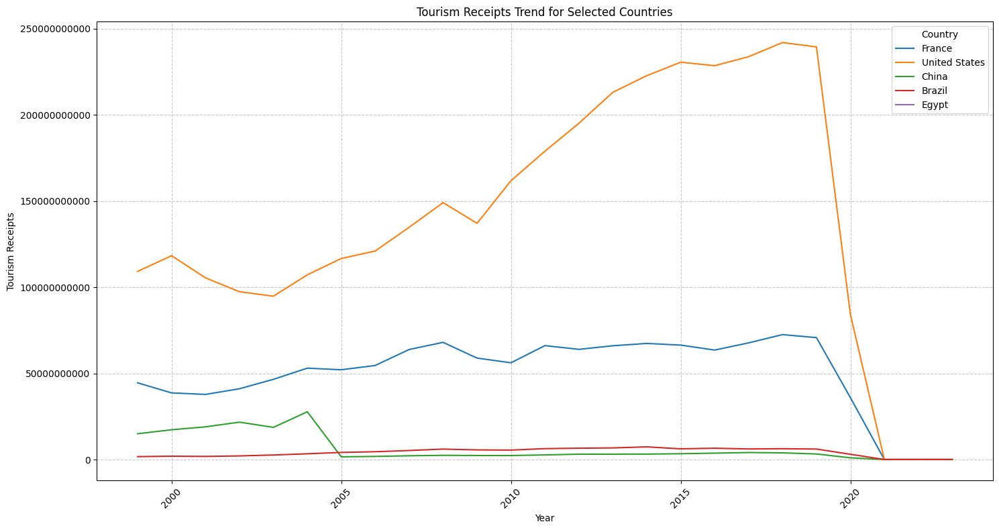

In [48]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_receipts', data=country_data, label=country)

plt.title('Tourism Receipts Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Receipts')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis
plt.tight_layout()
plt.show()

### 6. Tourism Arrivals Trend Over the Years per Country

Now, let's visualize the trend of total tourist arrivals over the years for the selected countries.

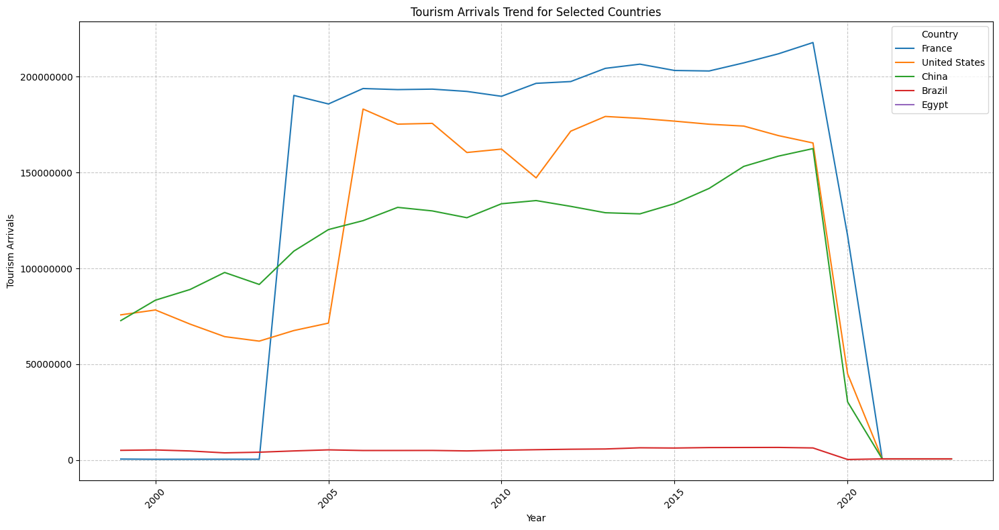

In [49]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_arrivals', data=country_data, label=country)

plt.title('Tourism Arrivals Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Arrivals')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 7. Tourism Expenditure Trend Over the Years per Country

Let's visualize the trend of total tourism expenditures over the years for the selected countries.

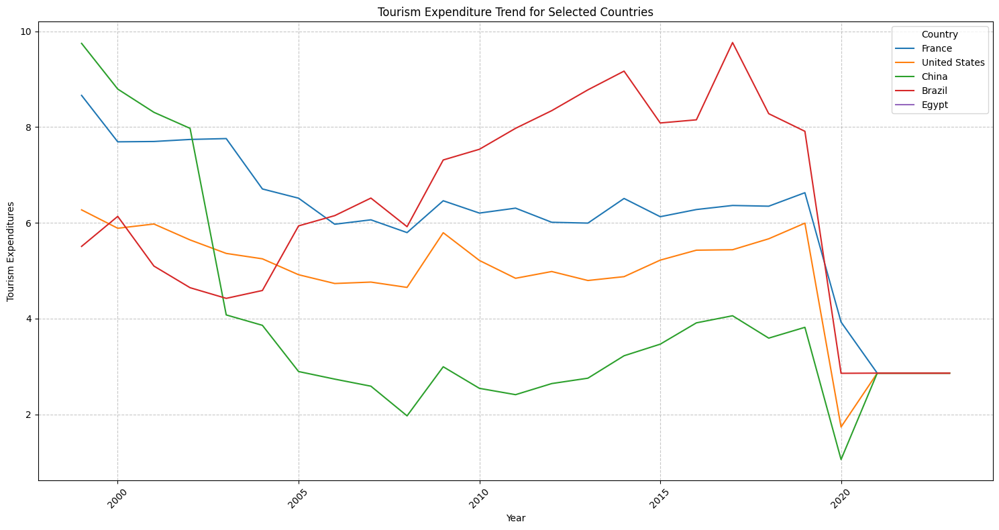

In [50]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_expenditures', data=country_data, label=country)

plt.title('Tourism Expenditure Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Expenditures')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 8. Tourism Export Trend Over the Years per Country

Finally for the trends, let's visualize the trend of total tourism exports over the years for the selected countries.

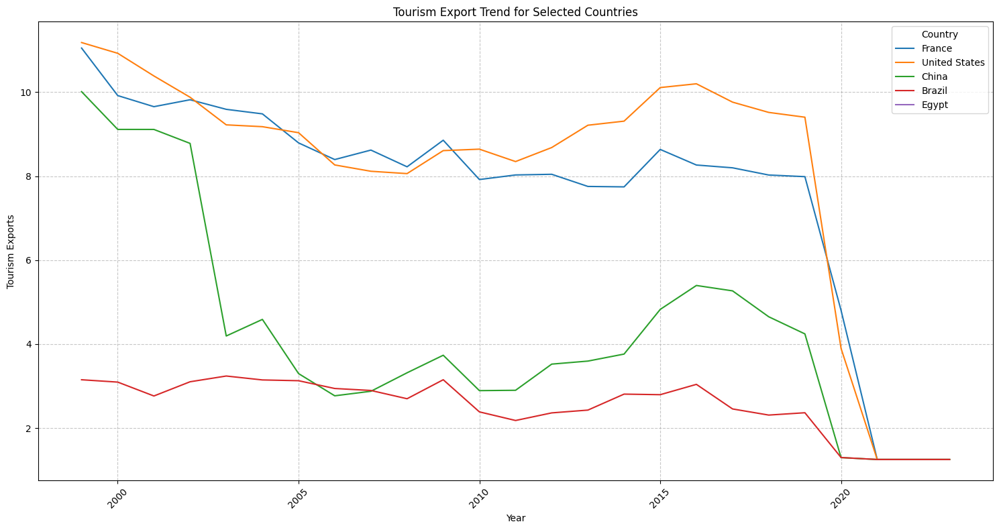

In [51]:
# Using the same selected_countries list from before

plt.figure(figsize=(15, 8))
for country in selected_countries:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_exports', data=country_data, label=country)

plt.title('Tourism Export Trend for Selected Countries')
plt.xlabel('Year')
plt.ylabel('Tourism Exports')
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 9. Growth Percentage Over the Years per Country

We have already calculated year-on-year growth percentages for `tourism_receipts` and `gdp`. Let's now explicitly calculate and display growth percentages for `tourism_arrivals`, `tourism_expenditures`, and `tourism_exports`.

In [52]:
# Calculate year-on-year growth for tourism_arrivals
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change() * 100

# Calculate year-on-year growth for tourism_expenditures
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change() * 100

# Calculate year-on-year growth for tourism_exports
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change() * 100

print("DataFrame with all calculated Year-on-Year Growth Percentages:")
display(df_sorted[['country', 'year', 'tourism_receipts_growth', 'gdp_growth',
                     'tourism_arrivals_growth', 'tourism_expenditures_growth',
                     'tourism_exports_growth']].head(10))

DataFrame with all calculated Year-on-Year Growth Percentages:


,country,year,tourism_receipts_growth,gdp_growth,tourism_arrivals_growth,tourism_expenditures_growth,tourism_exports_growth
2,Afghanistan,1999,NaN,NaN,NaN,NaN,NaN
268,Afghanistan,2000,-12.430349,-98.673311,0.286096,-3.054166,-20.629385
534,Afghanistan,2001,6.452755,-20.101172,3.266549,-7.746266,11.914656
800,Afghanistan,2002,10.373554,35.973125,9.641806,-3.607051,4.055545
1066,Afghanistan,2003,47.640300,18.173017,2.652016,6.457177,20.572101
1332,Afghanistan,2004,18.293638,15.570851,5.052378,-9.628782,-6.063611
1598,Afghanistan,2005,11.553479,18.724960,6.249964,0.680231,-12.620669
1864,Afghanistan,2006,11.960610,12.388682,13.720323,1.808245,-7.835450
2130,Afghanistan,2007,16.313658,39.819624,10.880983,-9.037698,-6.425393
2396,Afghanistan,2008,-99.728224,3.707582,1.187342,-83.031299,-68.065601


## Exploratory Data Analysis (EDA)

### 1. Outlier Detection per Column, per Country

In [53]:
import numpy as np

# Define numerical columns for outlier detection, excluding 'year' as it's an identifier for time-series
outlier_numerical_cols = [
    'tourism_receipts', 'tourism_arrivals', 'tourism_exports', 'tourism_departures',
    'tourism_expenditures', 'gdp', 'inflation', 'unemployment', 'tourism_dependency_ratio'
]

def detect_outliers_iqr(series):
    Q1 = series.quantile(0.25)
    Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return ((series < lower_bound) | (series > upper_bound))

print("### Outlier Analysis (using IQR method):\n")

outliers_summary = pd.DataFrame(columns=['Column', 'Country', 'Outlier Count', 'Percentage of Data'])

for col in outlier_numerical_cols:
    if col in df_sorted.columns:
        country_outliers = df_sorted.groupby('country')[col].apply(detect_outliers_iqr)

        for country in df_sorted['country'].unique():
            # Filter for the current country's outliers
            outliers_for_country_col = country_outliers.loc[country]

            if not outliers_for_country_col.empty:
                outlier_count = outliers_for_country_col.sum() # Count of True values (outliers)
                total_count = len(outliers_for_country_col) # Total data points for that country and column

                if total_count > 0 and outlier_count > 0:
                    percentage = (outlier_count / total_count) * 100
                    new_row = pd.DataFrame([{'Column': col,
                                             'Country': country,
                                             'Outlier Count': outlier_count,
                                             'Percentage of Data': f"{percentage:.2f}%"}])
                    outliers_summary = pd.concat([outliers_summary, new_row], ignore_index=True)
    else:
        print(f"Column '{col}' not found in the DataFrame. Skipping outlier detection for this column.\n")

if not outliers_summary.empty:
    print("**Summary of Outliers by Country and Column:**\n")
    display(outliers_summary)
else:
    print("No outliers detected based on the IQR method for the specified columns and countries.\n")

### Outlier Analysis (using IQR method):

**Summary of Outliers by Country and Column:**



,Column,Country,Outlier Count,Percentage of Data
0,tourism_receipts,Afghanistan,1,4.00%
1,tourism_receipts,Algeria,6,24.00%
2,tourism_receipts,Angola,1,4.00%
3,tourism_receipts,"Bahamas, The",5,20.00%
4,tourism_receipts,Bahrain,4,16.00%
...,...,...,...,...
977,tourism_dependency_ratio,"Venezuela, RB",5,20.00%
978,tourism_dependency_ratio,Viet Nam,5,20.00%
979,tourism_dependency_ratio,West Bank and Gaza,2,8.00%
980,tourism_dependency_ratio,"Yemen, Rep.",4,16.00%


### 2. Overall Data Summary (Data Profiling)

In [54]:
print("### Overall Descriptive Statistics for Numerical Columns:\n")
display(df_sorted[outlier_numerical_cols].describe().T)

print("\n### Data types and Non-Null Counts (df_sorted.info()):\n")
df_sorted.info()

### Overall Descriptive Statistics for Numerical Columns:



,count,mean,std,min,25%,50%,75%,max
tourism_receipts,5525.0,1.542797e+10,6.216890e+10,1.000000e+05,9.900000e+07,7.590000e+08,5.312000e+09,1.011620e+12
tourism_arrivals,5525.0,3.182143e+07,1.328441e+08,1.100000e+03,5.360000e+05,1.219000e+06,6.782000e+06,1.501611e+09
tourism_exports,5525.0,1.433028e+01,1.718330e+01,9.561950e-04,3.083955e+00,7.695922e+00,1.810976e+01,1.019670e+02
tourism_departures,5514.0,3.975322e+07,1.160952e+08,2.000000e+03,2.852500e+05,2.086000e+06,1.045000e+07,1.820357e+09
tourism_expenditures,5525.0,6.212033e+00,4.136643e+00,1.578184e-01,3.043248e+00,5.309579e+00,7.674072e+00,2.806590e+01
gdp,5525.0,9.354954e+11,3.601098e+12,1.396473e+07,5.705052e+09,2.619667e+10,2.208630e+11,6.048520e+13
inflation,5525.0,6.603013e+00,1.957856e+01,-1.685969e+01,1.689240e+00,3.483407e+00,6.753710e+00,5.572018e+02
unemployment,5521.0,8.200007e+00,6.088229e+00,3.900000e-02,4.172000e+00,6.718000e+00,1.032500e+01,5.700000e+01
tourism_dependency_ratio,5525.0,5.877521e+02,8.701465e+03,6.019189e-06,9.735255e-01,2.832320e+00,8.684478e+00,2.303461e+05



### Data types and Non-Null Counts (df_sorted.info()):

<class 'pandas.core.frame.DataFrame'>
Index: 5525 entries, 2 to 6649
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   country                      5525 non-null   object 
 1   country_code                 5525 non-null   object 
 2   year                         5525 non-null   int64  
 3   tourism_receipts             5525 non-null   float64
 4   tourism_arrivals             5525 non-null   float64
 5   tourism_exports              5525 non-null   float64
 6   tourism_departures           5514 non-null   float64
 7   tourism_expenditures         5525 non-null   float64
 8   gdp                          5525 non-null   float64
 9   inflation                    5525 non-null   float64
 10  unemployment                 5521 non-null   float64
 11  tourism_dependency_ratio     5525 non-null   float64
 12  tourism_receipts_growth 

### 3. Feature Distributions: Histograms and Density Plots

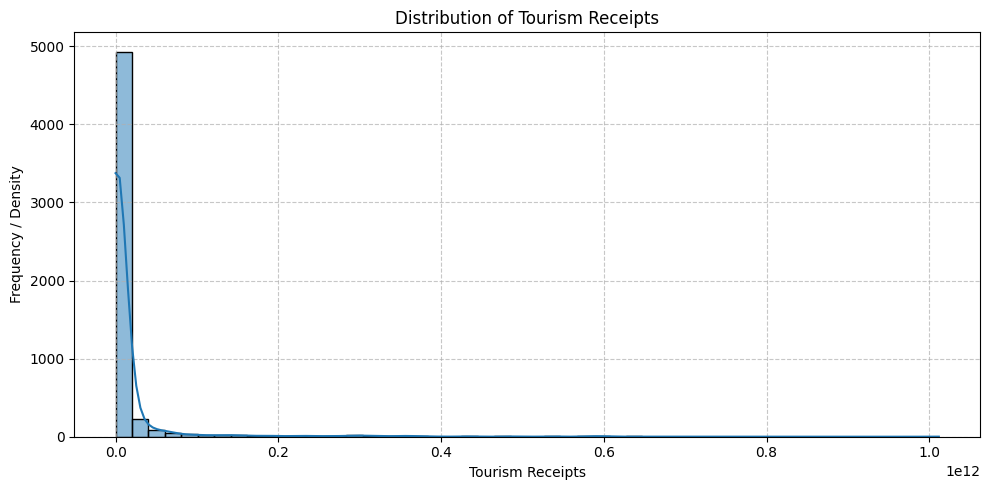

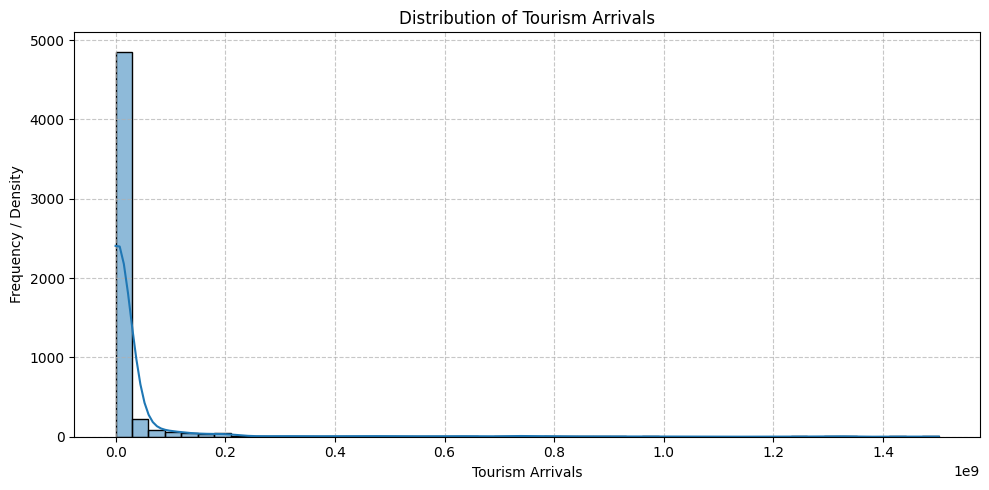

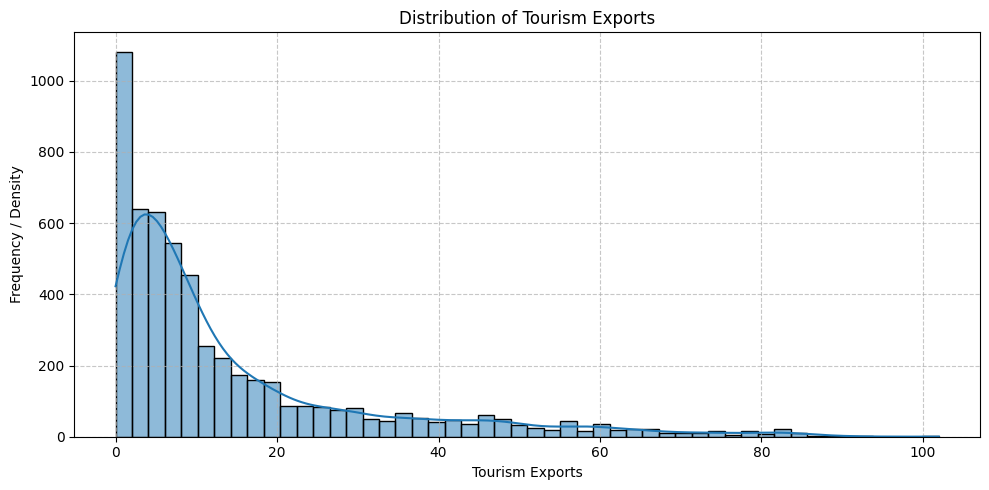

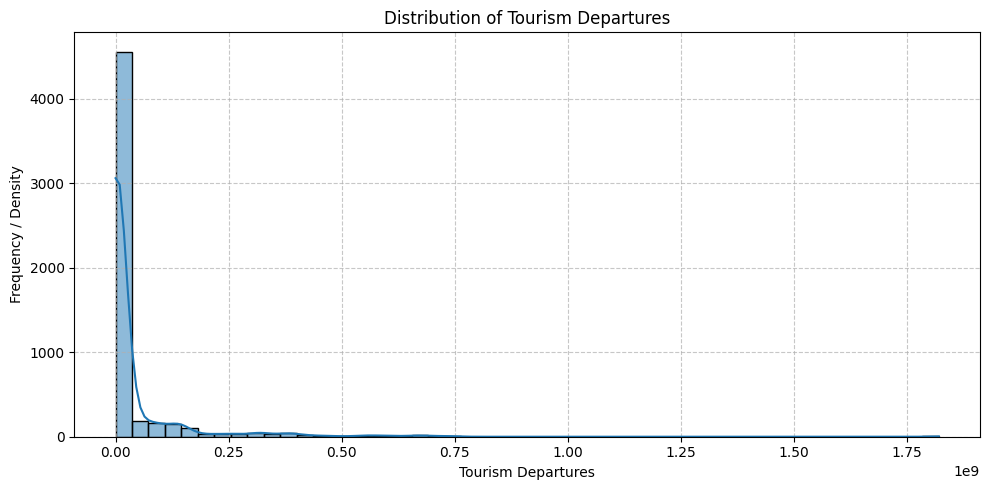

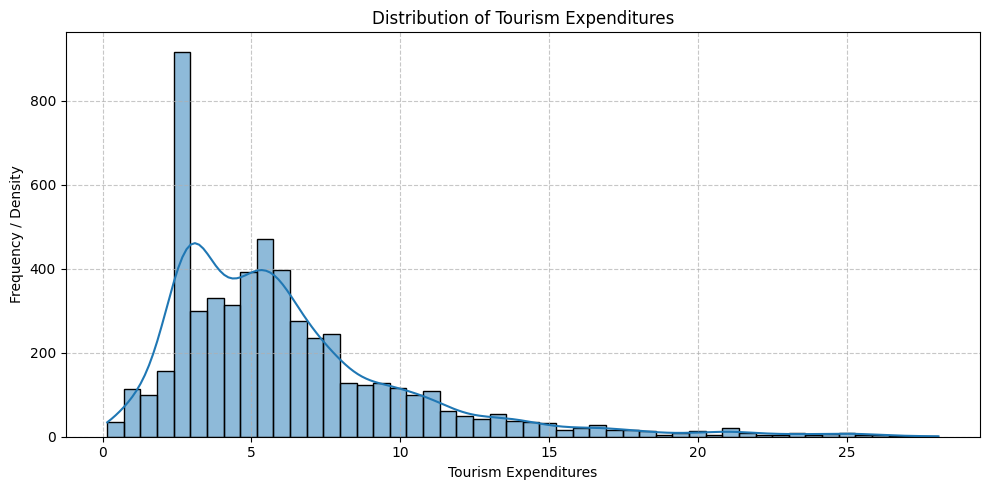

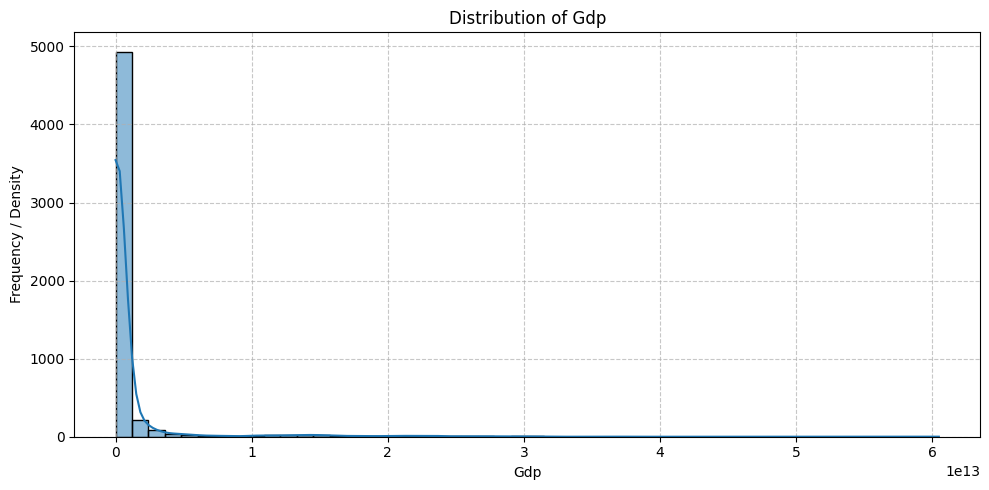

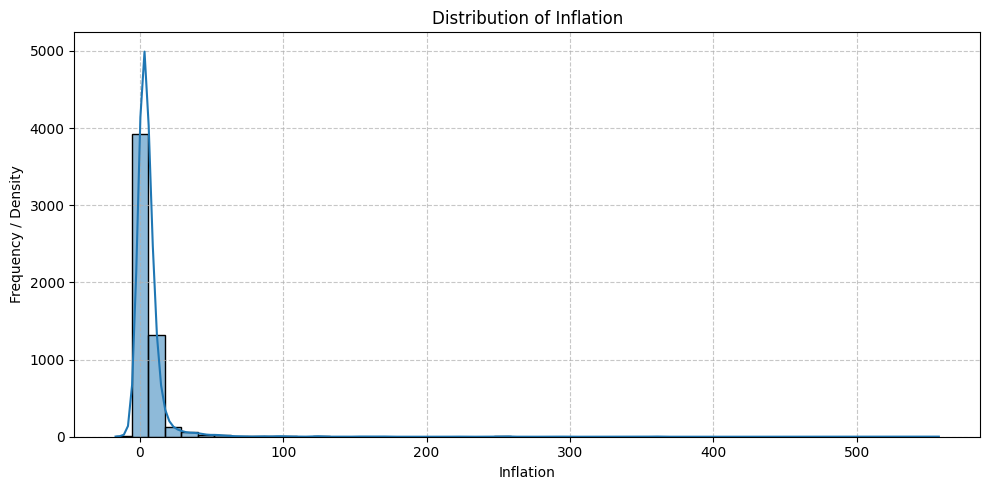

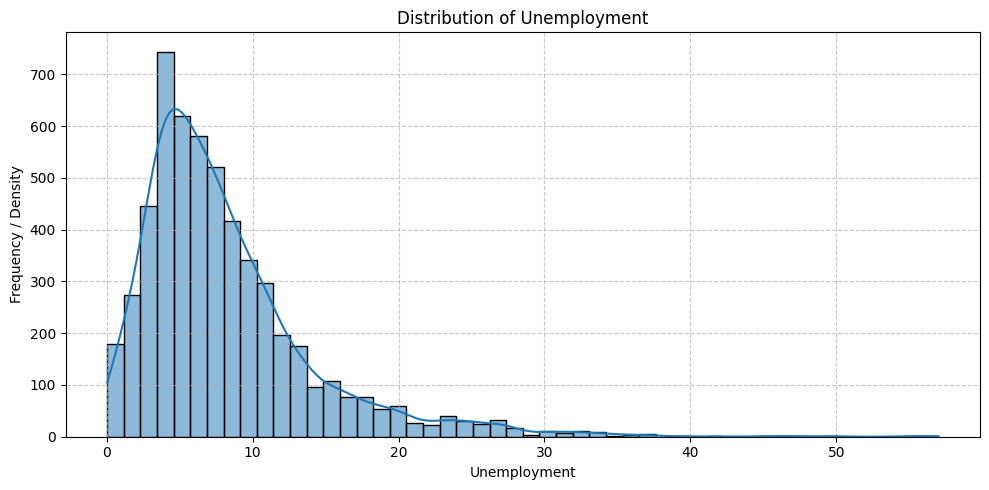

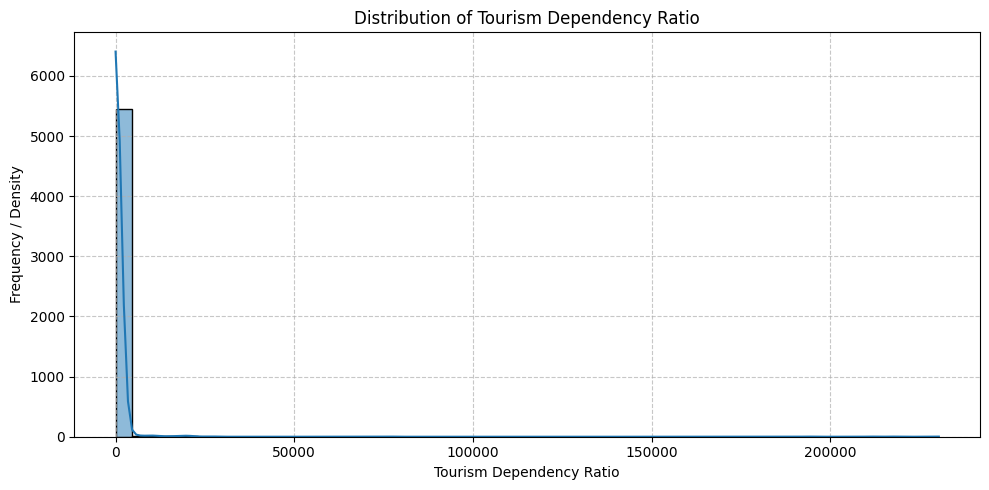

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

# Plot histograms and KDEs for all numerical columns
for col in outlier_numerical_cols:
    if col in df_sorted.columns:
        plt.figure(figsize=(10, 5))
        sns.histplot(df_sorted[col].dropna(), kde=True, bins=50)
        plt.title(f'Distribution of {col.replace("_", " ").title()}')
        plt.xlabel(col.replace("_", " ").title())
        plt.ylabel('Frequency / Density')
        plt.grid(True, linestyle='--', alpha=0.7)
        plt.tight_layout()
        plt.show()
    else:
        print(f"Column '{col}' not found in the DataFrame. Skipping histogram/density plot.\n")

### 4. Feature Distributions: Boxplots and Violin Plots

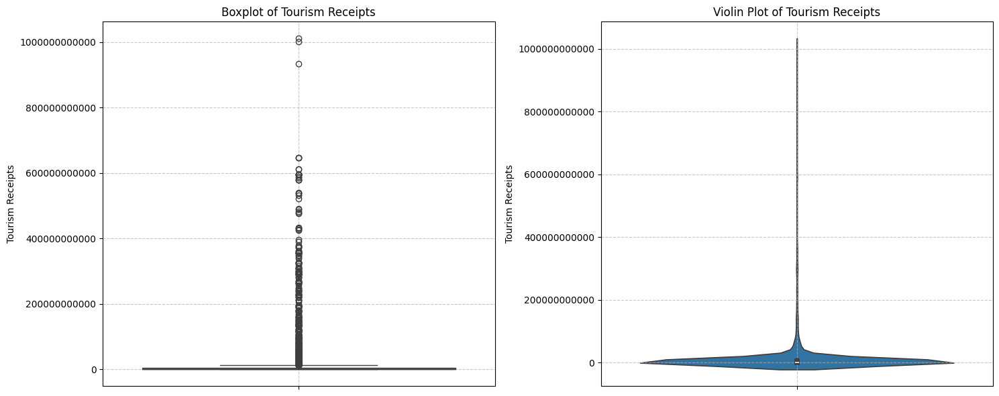

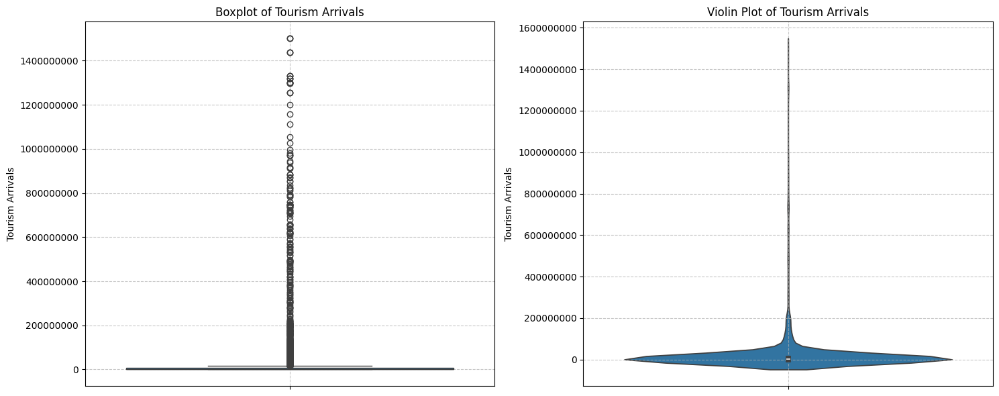

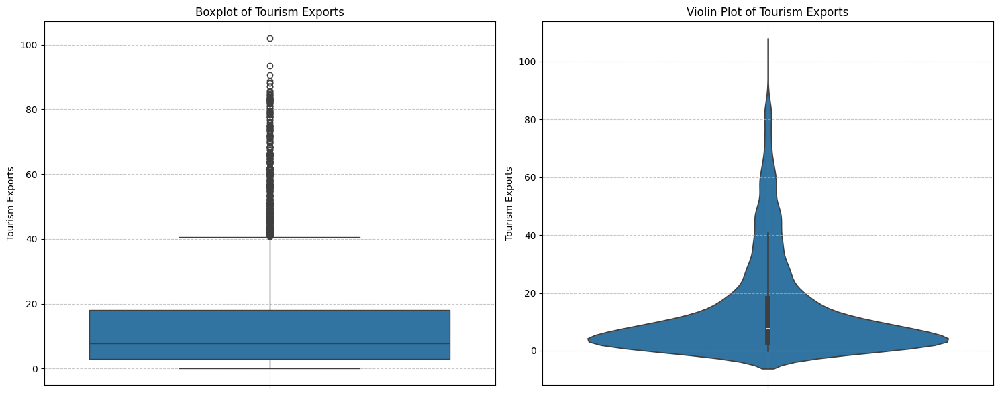

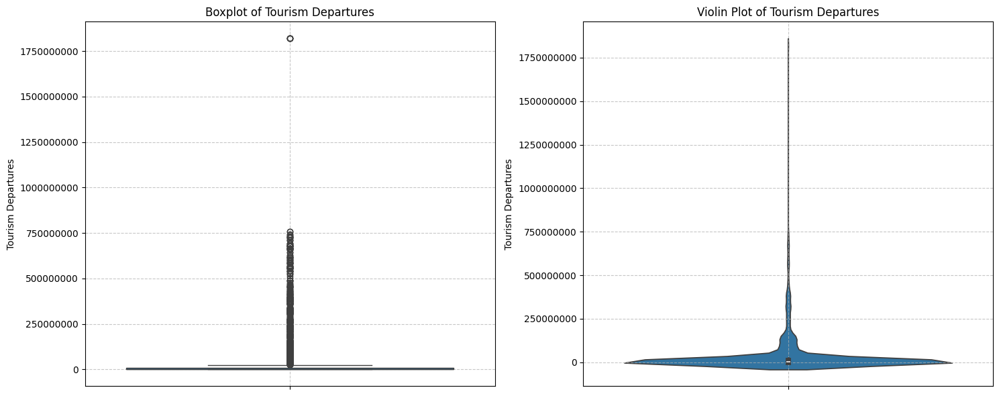

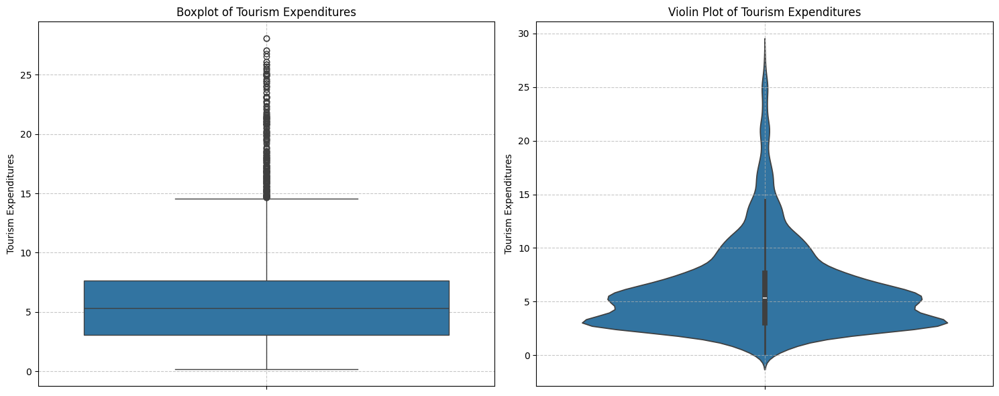

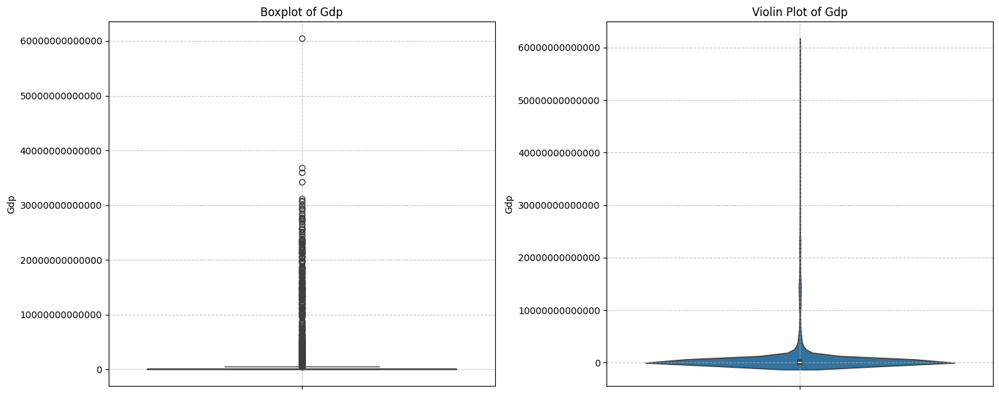

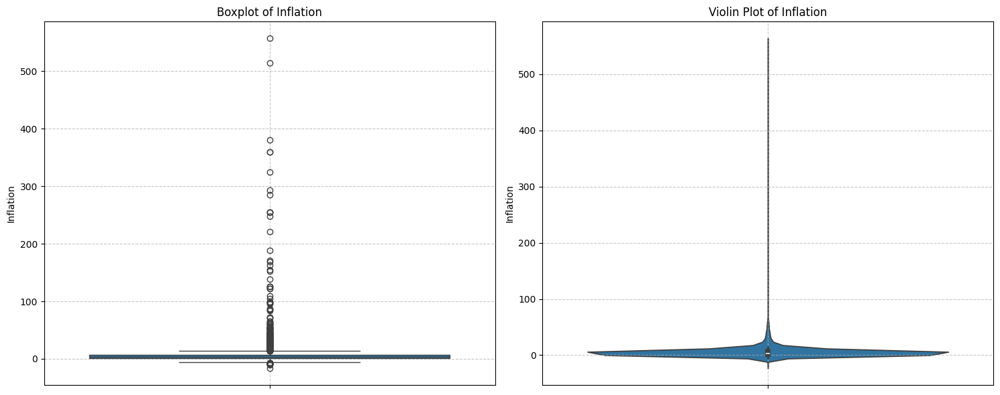

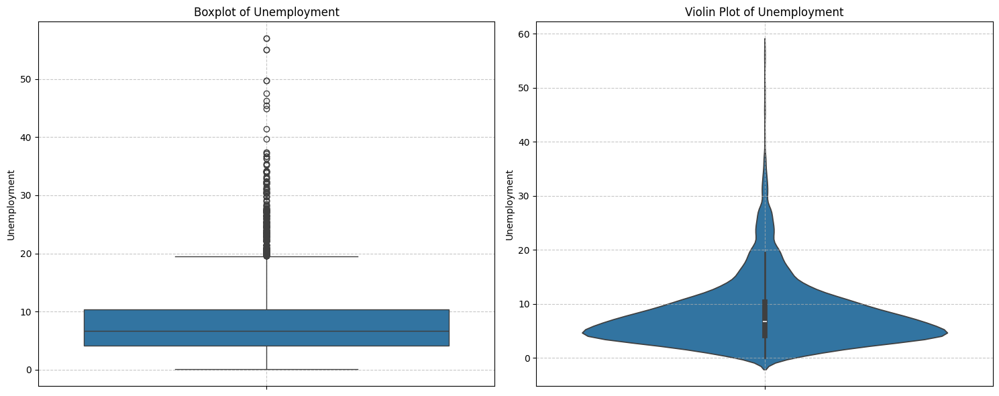

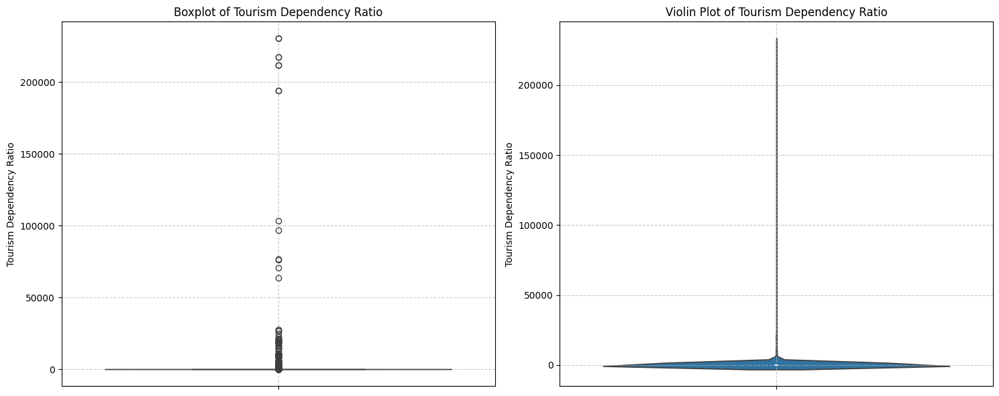

In [56]:
# Plot boxplots and violin plots for all numerical columns
for col in outlier_numerical_cols:
    if col in df_sorted.columns:
        fig, axes = plt.subplots(1, 2, figsize=(15, 6))

        # Boxplot
        sns.boxplot(y=df_sorted[col].dropna(), ax=axes[0])
        axes[0].set_title(f'Boxplot of {col.replace("_", " ").title()}')
        axes[0].set_ylabel(col.replace("_", " ").title())
        axes[0].grid(True, linestyle='--', alpha=0.7)
        axes[0].ticklabel_format(style='plain', axis='y')

        # Violin Plot
        sns.violinplot(y=df_sorted[col].dropna(), ax=axes[1])
        axes[1].set_title(f'Violin Plot of {col.replace("_", " ").title()}')
        axes[1].set_ylabel(col.replace("_", " ").title())
        axes[1].grid(True, linestyle='--', alpha=0.7)
        axes[1].ticklabel_format(style='plain', axis='y')

        plt.tight_layout()
        plt.show()
    else:
        print(f"Column '{col}' not found in the DataFrame. Skipping boxplot/violin plot.\n")

### 5. Pairwise Scatterplots for Key Variables

### Pairwise Scatterplots for Key Numerical Variables:



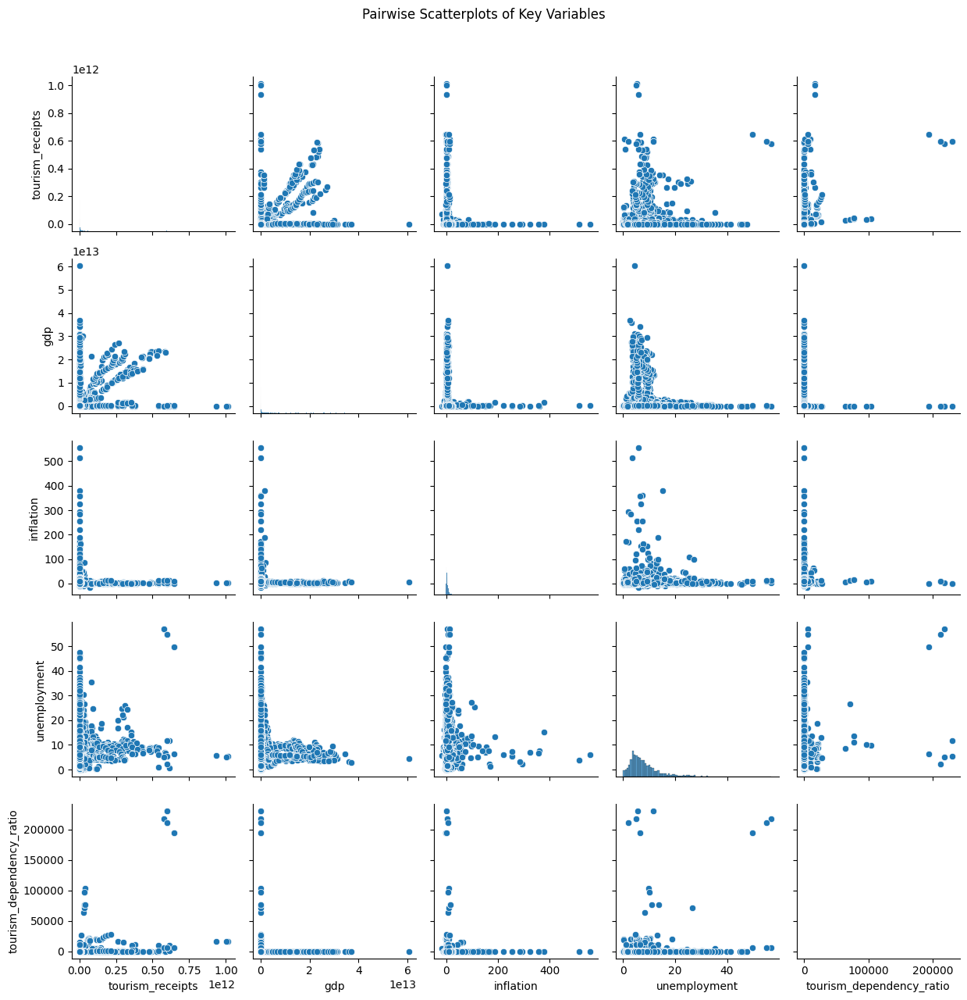

In [57]:
# Select a subset of key numerical columns for pairwise scatterplots to avoid an overly dense plot
selected_for_pairplot = ['tourism_receipts', 'gdp', 'inflation', 'unemployment', 'tourism_dependency_ratio']

print("### Pairwise Scatterplots for Key Numerical Variables:\n")

sns.pairplot(df_sorted[selected_for_pairplot].dropna())
plt.suptitle('Pairwise Scatterplots of Key Variables', y=1.02) # Adjust title position
plt.tight_layout()
plt.show()

### 6. Correlation Heatmap

### Correlation Heatmap of Numerical Variables:



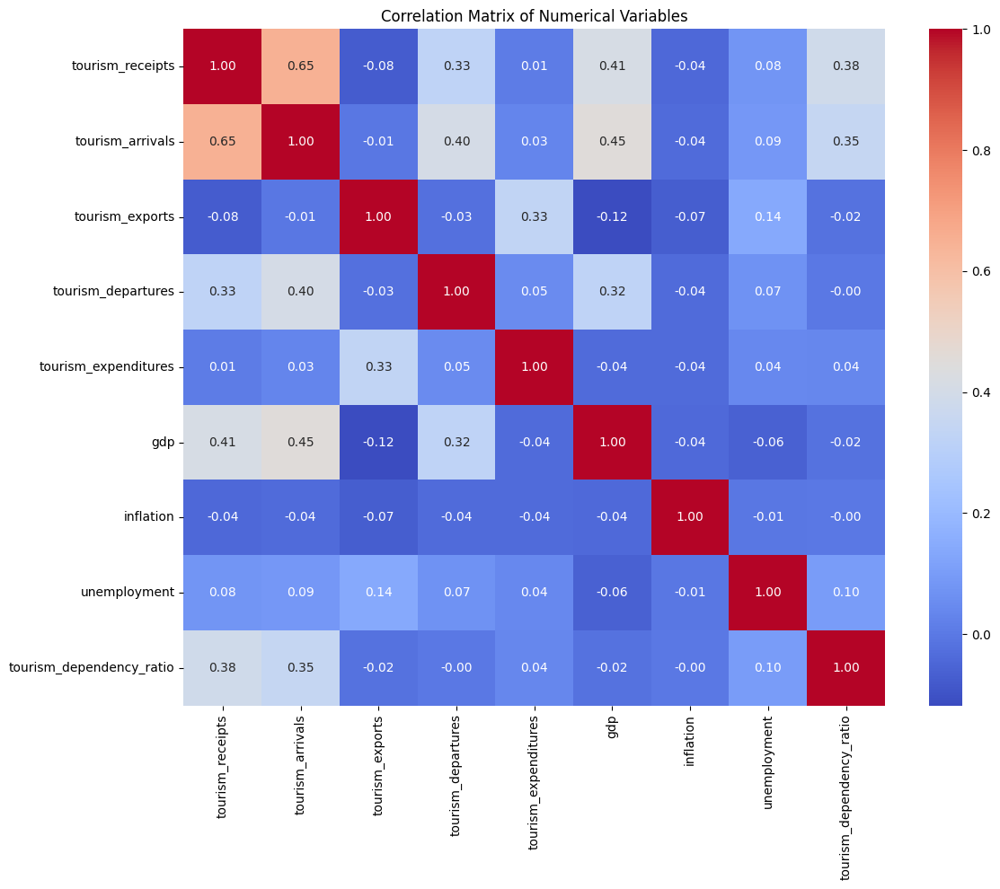

In [58]:
print("### Correlation Heatmap of Numerical Variables:\n")

plt.figure(figsize=(12, 10))
sns.heatmap(df_sorted[outlier_numerical_cols].corr(numeric_only=True), annot=True, cmap='coolwarm', fmt=".2f")
plt.title('Correlation Matrix of Numerical Variables')
plt.tight_layout()
plt.show()

### 7. Covariance Matrix

### Covariance Matrix of Numerical Variables:



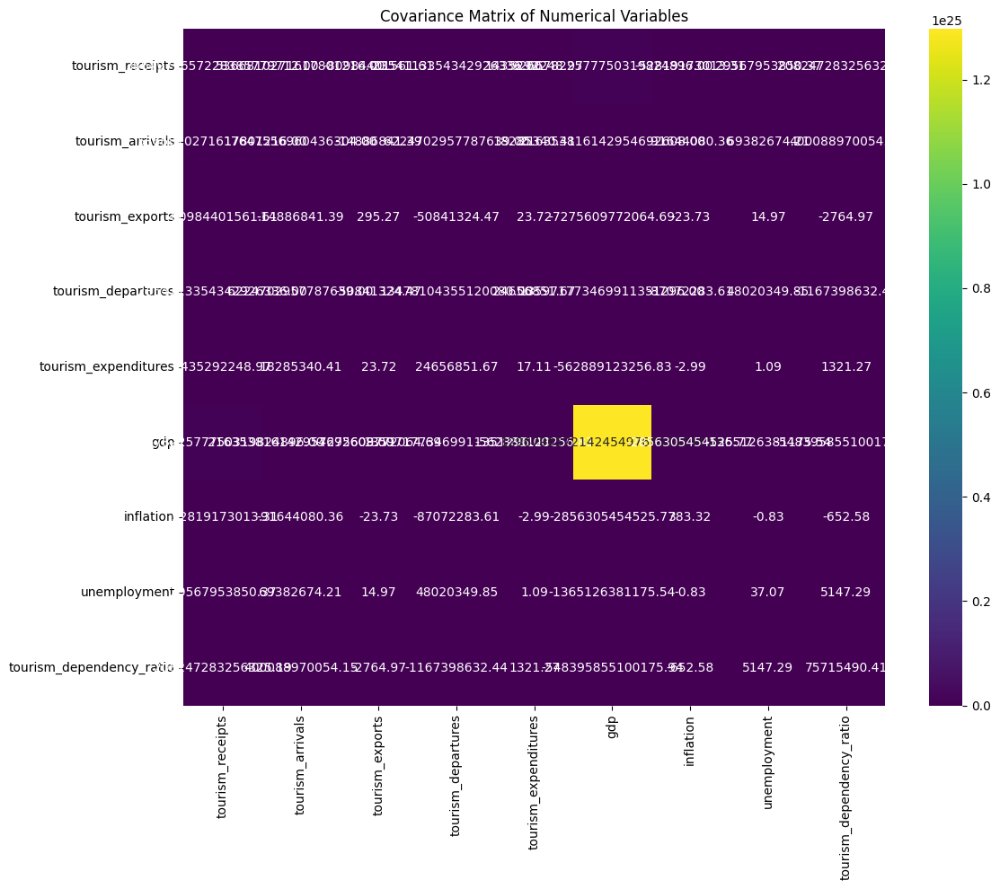

In [59]:
print("### Covariance Matrix of Numerical Variables:\n")

plt.figure(figsize=(12, 10))
sns.heatmap(df_sorted[outlier_numerical_cols].cov(numeric_only=True), annot=True, cmap='viridis', fmt=".2f")
plt.title('Covariance Matrix of Numerical Variables')
plt.tight_layout()
plt.show()

### Correlation Matrix for Top 5 GDP Countries in 2023

Top 5 countries for 2023 based on GDP: ['French Polynesia', 'Middle income', 'East Asia & Pacific', 'North America', 'Upper middle income']


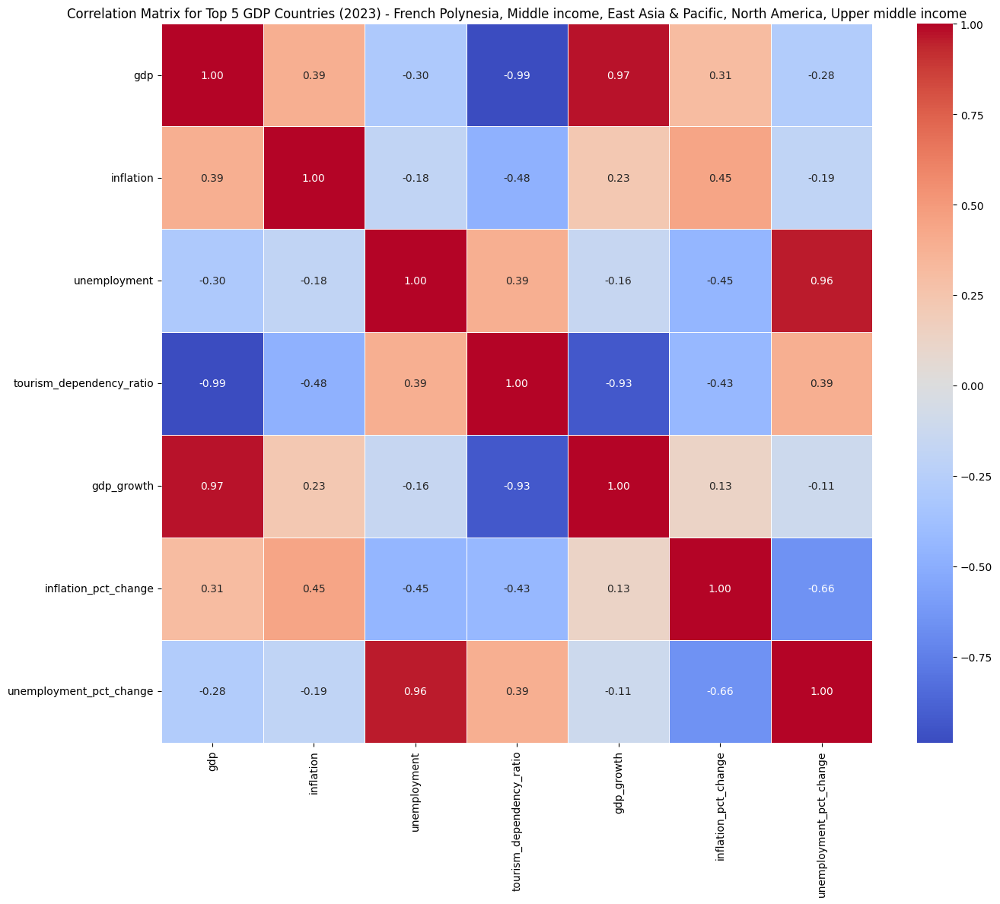


Note: The following columns were removed from the correlation matrix due to constant values or insufficient variance across the top 5 GDP countries in 2023: tourism_receipts_growth, tourism_arrivals, tourism_departures, tourism_receipts, tourism_arrivals_growth, tourism_exports, tourism_expenditures, tourism_exports_growth, tourism_expenditures_growth.
This might be due to data sparsity or uniform values in the original dataset for 2023, possibly influenced by the 'ffill' imputation.


In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Filter data for the year 2023
df_2023 = df_sorted[df_sorted['year'] == 2023].copy()

if df_2023.empty:
    print("No data available for the year 2023. Please check the dataset.")
else:
    # Determine top 5 countries based on GDP in 2023
    top_5_gdp_countries_2023 = df_2023.groupby('country')['gdp'].sum().nlargest(5).index.tolist()

    if not top_5_gdp_countries_2023:
        print("Could not determine top 5 countries for 2023 based on GDP.")
    else:
        print(f"Top 5 countries for 2023 based on GDP: {top_5_gdp_countries_2023}")

        # Filter data for these top 5 countries in 2023
        df_top_5_gdp_2023 = df_2023[df_2023['country'].isin(top_5_gdp_countries_2023)]

        # Identify numerical columns for correlation, excluding 'year' and potentially 'country_code'
        numerical_cols_for_corr = df_top_5_gdp_2023.select_dtypes(include=np.number).columns.tolist()
        if 'year' in numerical_cols_for_corr:
            numerical_cols_for_corr.remove('year')

        # Filter out columns with zero variance (constant values) within the top 5 GDP countries for 2023
        # Zero variance columns lead to NaN in correlation matrix
        cols_to_keep = [col for col in numerical_cols_for_corr if df_top_5_gdp_2023[col].nunique() > 1]

        if not cols_to_keep:
            print("No numerical columns with sufficient variance found for correlation among the top 5 GDP countries in 2023.")
        else:
            # Calculate the correlation matrix for numerical columns with variance
            correlation_matrix_top_5_gdp = df_top_5_gdp_2023[cols_to_keep].corr(numeric_only=True)

            plt.figure(figsize=(14, 12))
            sns.heatmap(correlation_matrix_top_5_gdp, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
            plt.title(f'Correlation Matrix for Top 5 GDP Countries (2023) - {', '.join(top_5_gdp_countries_2023)}')
            plt.tight_layout()
            plt.show()

            if len(cols_to_keep) < len(numerical_cols_for_corr):
                removed_cols = set(numerical_cols_for_corr) - set(cols_to_keep)
                print(f"\nNote: The following columns were removed from the correlation matrix due to constant values or insufficient variance across the top 5 GDP countries in 2023: {', '.join(removed_cols)}.\nThis might be due to data sparsity or uniform values in the original dataset for 2023, possibly influenced by the 'ffill' imputation.")


## Tourism Performance Analysis

### 1. Fastest Growing Tourism Economies

This section identifies countries with the highest year-on-year growth in key tourism indicators (tourism receipts and tourism arrivals) for the latest available year in the dataset (2023).

Top 10 Fastest Growing Economies by Tourism Receipts CAGR (2015-2019):


,country,tourism_receipts_cagr
132,Middle income,1045.723236
126,Marshall Islands,1045.723236
45,"Congo, Dem. Rep.",808.420190
209,United Kingdom,604.694735
55,Djibouti,559.267283
197,Timor-Leste,542.134431
182,South Sudan,528.204851
73,French Polynesia,502.793330
141,Nauru,365.903420
56,Dominica,312.299968


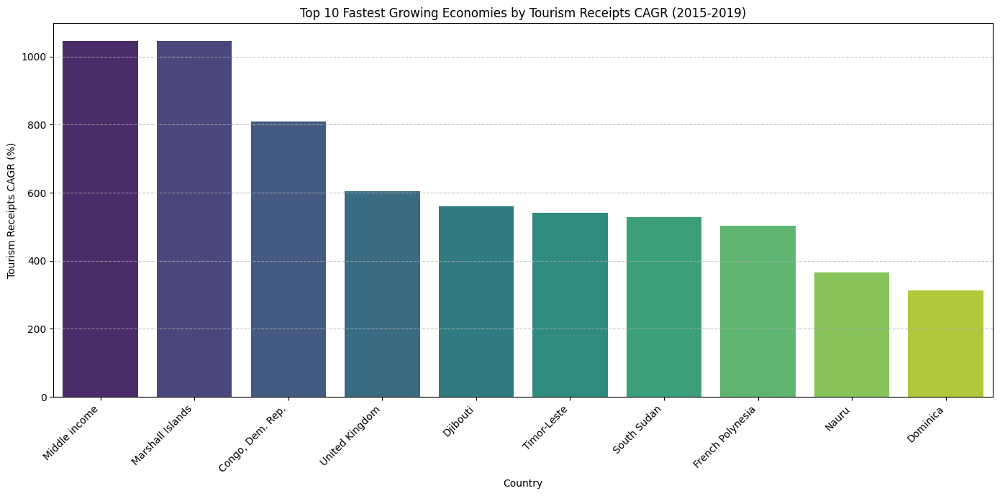

In [61]:
# Define the period for calculating CAGR (e.g., pre-COVID years)
start_cagr_year = 2015
end_cagr_year = 2019

# Filter data for the defined CAGR period
df_cagr_period = df_sorted[(df_sorted['year'] >= start_cagr_year) & (df_sorted['year'] <= end_cagr_year)].copy()

# Function to calculate Compound Annual Growth Rate (CAGR)
def calculate_cagr(series, start_year, end_year):
    start_value = series[series['year'] == start_year]['value'].values
    end_value = series[series['year'] == end_year]['value'].values

    if len(start_value) == 0 or len(end_value) == 0 or start_value[0] <= 0: # Ensure valid start value for CAGR
        return pd.NA

    num_years = end_year - start_year
    if num_years == 0:
        return pd.NA # Avoid division by zero if period is just one year

    cagr = ((end_value[0] / start_value[0])**(1/num_years) - 1) * 100
    return cagr

# Prepare data for CAGR calculation
cagr_receipts = []
cagr_arrivals = []

for country in df_cagr_period['country'].unique():
    country_data = df_cagr_period[df_cagr_period['country'] == country]

    # CAGR for Tourism Receipts
    receipts_series = country_data[['year', 'tourism_receipts']].rename(columns={'tourism_receipts': 'value'})
    receipts_cagr = calculate_cagr(receipts_series, start_cagr_year, end_cagr_year)
    if pd.notna(receipts_cagr):
        cagr_receipts.append({'country': country, 'tourism_receipts_cagr': receipts_cagr})

    # CAGR for Tourism Arrivals
    arrivals_series = country_data[['year', 'tourism_arrivals']].rename(columns={'tourism_arrivals': 'value'})
    arrivals_cagr = calculate_cagr(arrivals_series, start_cagr_year, end_cagr_year)
    if pd.notna(arrivals_cagr):
        cagr_arrivals.append({'country': country, 'tourism_arrivals_cagr': arrivals_cagr})

df_cagr_receipts = pd.DataFrame(cagr_receipts).dropna().sort_values(by='tourism_receipts_cagr', ascending=False).head(10)
df_cagr_arrivals = pd.DataFrame(cagr_arrivals).dropna().sort_values(by='tourism_arrivals_cagr', ascending=False).head(10)


# --- Fastest Growing by Tourism Receipts CAGR ---
print(f"Top 10 Fastest Growing Economies by Tourism Receipts CAGR ({start_cagr_year}-{end_cagr_year}):")
display(df_cagr_receipts)

plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_receipts_cagr', data=df_cagr_receipts, palette='viridis', hue='country', legend=False)
plt.title(f'Top 10 Fastest Growing Economies by Tourism Receipts CAGR ({start_cagr_year}-{end_cagr_year})')
plt.xlabel('Country')
plt.ylabel('Tourism Receipts CAGR (%)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Top 10 Fastest Growing Economies by Tourism Arrivals CAGR (2015-2019):


,country,tourism_arrivals_cagr
63,Eritrea,770.821466
190,Suriname,331.088746
84,Guinea,285.453208
194,Tajikistan,213.355028
203,Turkmenistan,213.355028
189,Sudan,128.758195
172,Senegal,111.505529
77,Ghana,71.313097
78,Gibraltar,71.313097
193,Syrian Arab Republic,69.164888


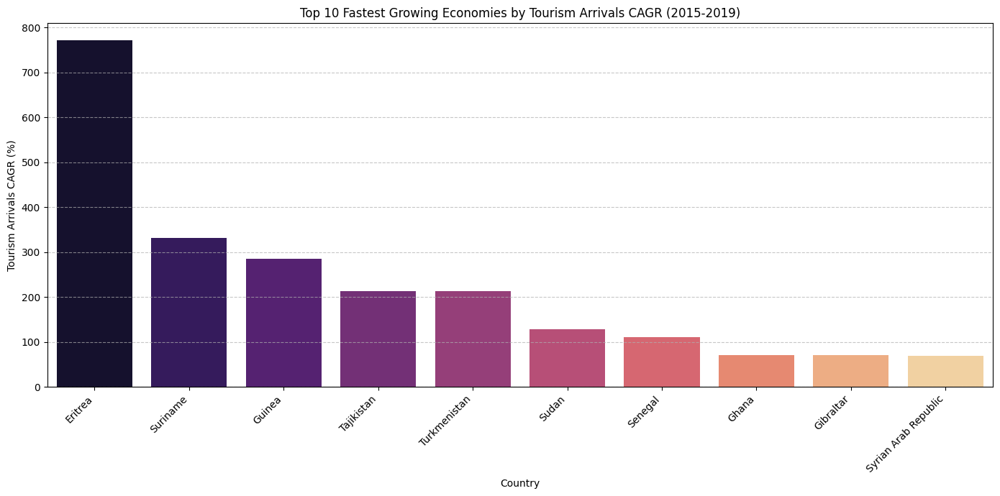

In [62]:
# --- Fastest Growing by Tourism Arrivals CAGR ---
print(f"\nTop 10 Fastest Growing Economies by Tourism Arrivals CAGR ({start_cagr_year}-{end_cagr_year}):")
display(df_cagr_arrivals)

plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_arrivals_cagr', data=df_cagr_arrivals, palette='magma', hue='country', legend=False)
plt.title(f'Top 10 Fastest Growing Economies by Tourism Arrivals CAGR ({start_cagr_year}-{end_cagr_year})')
plt.xlabel('Country')
plt.ylabel('Tourism Arrivals CAGR (%)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 2. Tourism Decline Analysis per Country Over the Years

This section identifies and visualizes countries that experienced significant year-on-year declines in tourism receipts and arrivals. We will focus on negative growth rates to highlight periods of tourism downturns.

Top 10 Countries with Significant Decline in Tourism Receipts (Growth < -20%):


,country,year,tourism_receipts_growth
5651,Europe & Central Asia,2020,-99.991520
5785,French Polynesia,2020,-99.989608
1591,Kosovo,2004,-99.989169
1590,Samoa,2004,-99.989169
1592,"Yemen, Rep.",2004,-99.989169
2411,Belgium,2008,-99.987064
4591,Eritrea,2016,-99.983619
4592,Spain,2016,-99.983619
5649,East Asia & Pacific,2020,-99.981245
2367,Tonga,2007,-99.951295


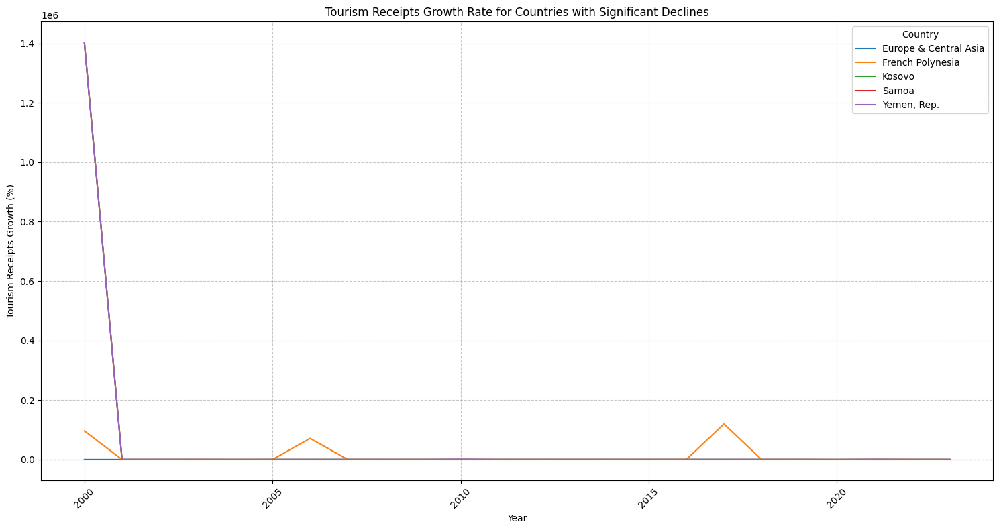

In [63]:
# Identify significant declines in Tourism Receipts
decline_receipts = df_sorted[df_sorted['tourism_receipts_growth'] < -20].dropna(subset=['tourism_receipts_growth']).sort_values(by='tourism_receipts_growth', ascending=True)

print("Top 10 Countries with Significant Decline in Tourism Receipts (Growth < -20%):")
display(decline_receipts[['country', 'year', 'tourism_receipts_growth']].head(10))

# Visualize the top 5 countries by largest decline in receipts
plt.figure(figsize=(15, 8))

# Get the countries with the largest declines
top_decline_countries_receipts = decline_receipts.head(5)['country'].unique()

for country in top_decline_countries_receipts:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_receipts_growth', data=country_data, label=country)

plt.title('Tourism Receipts Growth Rate for Countries with Significant Declines')
plt.xlabel('Year')
plt.ylabel('Tourism Receipts Growth (%)')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8) # Add a zero line
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Top 10 Countries with Significant Decline in Tourism Arrivals (Growth < -20%):


,country,year,tourism_arrivals_growth
4145,Marshall Islands,2014,-99.993726
2124,"Yemen, Rep.",2006,-99.992275
2123,Kosovo,2006,-99.992275
2122,Samoa,2006,-99.992275
5133,"Micronesia, Fed. Sts.",2018,-99.990737
5622,Central Europe and the Baltics,2020,-99.990529
2099,Timor-Leste,2006,-99.990353
2328,Qatar,2007,-99.975007
2327,French Polynesia,2007,-99.975007
5776,Poland,2020,-99.955940


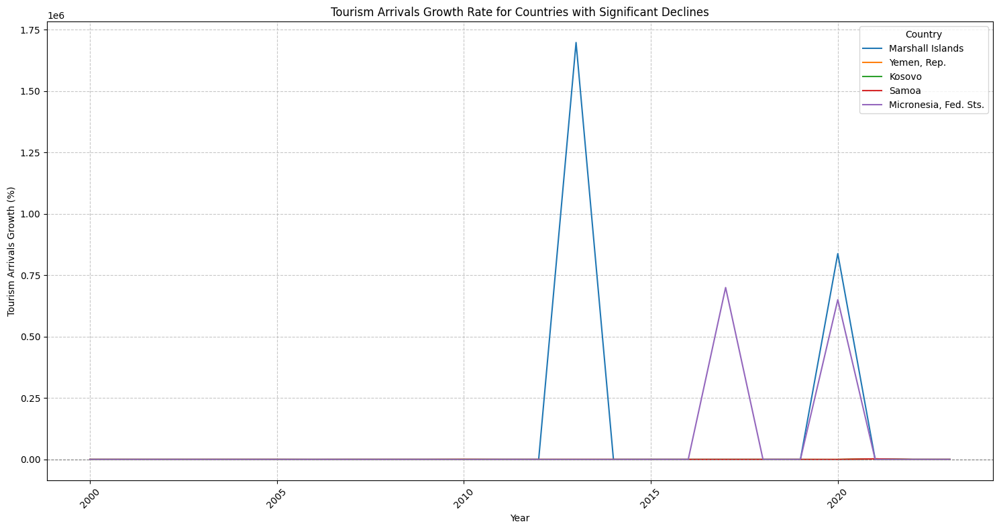

In [64]:
# Identify significant declines in Tourism Arrivals
decline_arrivals = df_sorted[df_sorted['tourism_arrivals_growth'] < -20].dropna(subset=['tourism_arrivals_growth']).sort_values(by='tourism_arrivals_growth', ascending=True)

print("\nTop 10 Countries with Significant Decline in Tourism Arrivals (Growth < -20%):")
display(decline_arrivals[['country', 'year', 'tourism_arrivals_growth']].head(10))

# Visualize the top 5 countries by largest decline in arrivals
plt.figure(figsize=(15, 8))

# Get the countries with the largest declines
top_decline_countries_arrivals = decline_arrivals.head(5)['country'].unique()

for country in top_decline_countries_arrivals:
    country_data = df_sorted[df_sorted['country'] == country]
    sns.lineplot(x='year', y='tourism_arrivals_growth', data=country_data, label=country)

plt.title('Tourism Arrivals Growth Rate for Countries with Significant Declines')
plt.xlabel('Year')
plt.ylabel('Tourism Arrivals Growth (%)')
plt.axhline(0, color='gray', linestyle='--', linewidth=0.8) # Add a zero line
plt.grid(True, linestyle='--', alpha=0.7)
plt.legend(title='Country')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

### 3. Tourism Recovery After COVID for Each Country

This section assesses how well tourism indicators (receipts, arrivals) have recovered in the post-COVID era by comparing values to pre-COVID levels (e.g., 2019).

Top 10 Countries by Tourism Receipts Recovery (Post-COVID vs 2019):


,receipts_recovery_pct
country,
Guinea,534.615408
Mauritania,381.751831
Eswatini,361.538455
Equatorial Guinea,248.837208
Tonga,15.586693
Malawi,6.451613
Suriname,3.125000
Comoros,-9.215952
Solomon Islands,-19.512195



Bottom 10 Countries by Tourism Receipts Recovery (Post-COVID vs 2019):


,receipts_recovery_pct
country,
French Polynesia,-99.993405
Europe & Central Asia,-99.988806
European Union,-99.984728
Eritrea,-99.981420
Euro area,-99.981420
Spain,-99.981420
North America,-99.978400
East Asia & Pacific,-99.975243
United States,-99.972436


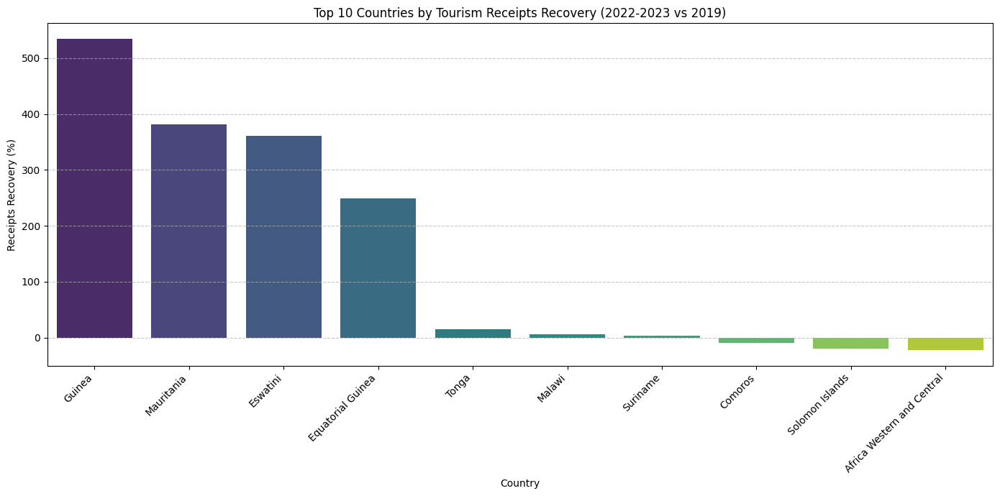

In [65]:
pre_covid_year = 2019
post_covid_year_start = 2022 # Using 2022 and 2023 as post-COVID reference
post_covid_year_end = 2023

# Filter data for pre-COVID year
df_pre_covid = df_sorted[df_sorted['year'] == pre_covid_year][['country', 'tourism_receipts', 'tourism_arrivals']]
df_pre_covid = df_pre_covid.set_index('country')

# Filter data for post-COVID years and take the average for robustness
df_post_covid = df_sorted[(df_sorted['year'] >= post_covid_year_start) & (df_sorted['year'] <= post_covid_year_end)][['country', 'tourism_receipts', 'tourism_arrivals']]
df_post_covid = df_post_covid.groupby('country').mean()

# Merge dataframes
df_recovery = pd.merge(df_pre_covid, df_post_covid, on='country', suffixes=('_2019', '_post_covid'), how='inner')

# Calculate recovery percentage
df_recovery['receipts_recovery_pct'] = ((df_recovery['tourism_receipts_post_covid'] - df_recovery['tourism_receipts_2019']) / df_recovery['tourism_receipts_2019']) * 100
df_recovery['arrivals_recovery_pct'] = ((df_recovery['tourism_arrivals_post_covid'] - df_recovery['tourism_arrivals_2019']) / df_recovery['tourism_arrivals_2019']) * 100

# Display top/bottom countries by receipts recovery
print("Top 10 Countries by Tourism Receipts Recovery (Post-COVID vs 2019):")
display(df_recovery.sort_values(by='receipts_recovery_pct', ascending=False).head(10)[['receipts_recovery_pct']])

print("\nBottom 10 Countries by Tourism Receipts Recovery (Post-COVID vs 2019):")
display(df_recovery.sort_values(by='receipts_recovery_pct', ascending=True).head(10)[['receipts_recovery_pct']])

# Visualize receipts recovery for top 10
plt.figure(figsize=(14, 7))
sns.barplot(x=df_recovery.sort_values(by='receipts_recovery_pct', ascending=False).head(10).index,
            y='receipts_recovery_pct', data=df_recovery.sort_values(by='receipts_recovery_pct', ascending=False).head(10),
            palette='viridis', hue=df_recovery.sort_values(by='receipts_recovery_pct', ascending=False).head(10).index, legend=False)
plt.title(f'Top 10 Countries by Tourism Receipts Recovery ({post_covid_year_start}-{post_covid_year_end} vs {pre_covid_year})')
plt.xlabel('Country')
plt.ylabel('Receipts Recovery (%)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Top 10 Countries by Tourism Arrivals Recovery (Post-COVID vs 2019):


,arrivals_recovery_pct
country,
Tuvalu,17650.000468
Marshall Islands,10375.409999
Kiribati,5225.000000
"Micronesia, Fed. Sts.",3450.000000
Solomon Islands,2111.072693
Comoros,1316.851489
Equatorial Guinea,1119.465613
Timor-Leste,754.278040
Chad,688.888889



Bottom 10 Countries by Tourism Arrivals Recovery (Post-COVID vs 2019):


,arrivals_recovery_pct
country,
Europe & Central Asia,-99.946714
European Union,-99.934047
Middle income,-99.919131
Eritrea,-99.902528
Euro area,-99.902528
Upper middle income,-99.888542
East Asia & Pacific,-99.869805
Central Europe and the Baltics,-99.796910
France,-99.706715


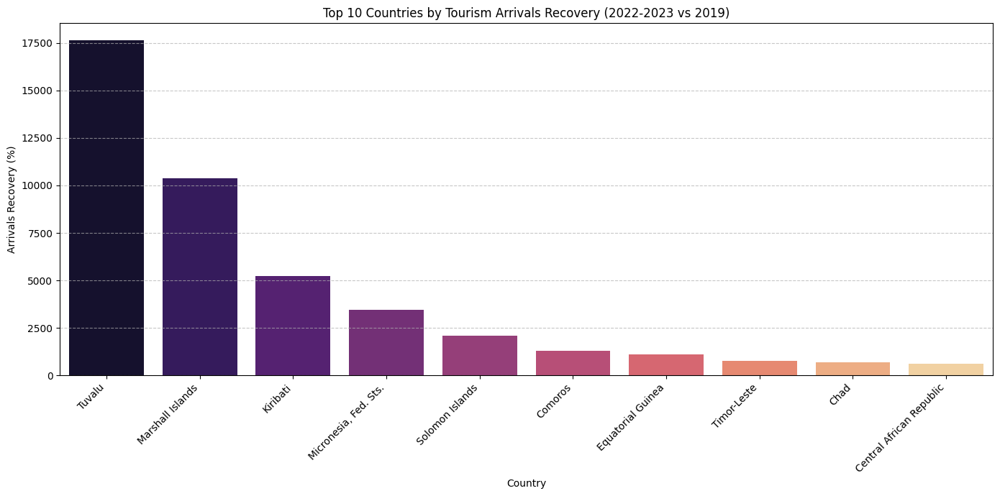

In [66]:
# Display top/bottom countries by arrivals recovery
print("\nTop 10 Countries by Tourism Arrivals Recovery (Post-COVID vs 2019):")
display(df_recovery.sort_values(by='arrivals_recovery_pct', ascending=False).head(10)[['arrivals_recovery_pct']])

print("\nBottom 10 Countries by Tourism Arrivals Recovery (Post-COVID vs 2019):")
display(df_recovery.sort_values(by='arrivals_recovery_pct', ascending=True).head(10)[['arrivals_recovery_pct']])

# Visualize arrivals recovery for top 10
plt.figure(figsize=(14, 7))
sns.barplot(x=df_recovery.sort_values(by='arrivals_recovery_pct', ascending=False).head(10).index,
            y='arrivals_recovery_pct', data=df_recovery.sort_values(by='arrivals_recovery_pct', ascending=False).head(10),
            palette='magma', hue=df_recovery.sort_values(by='arrivals_recovery_pct', ascending=False).head(10).index, legend=False)
plt.title(f'Top 10 Countries by Tourism Arrivals Recovery ({post_covid_year_start}-{post_covid_year_end} vs {pre_covid_year})')
plt.xlabel('Country')
plt.ylabel('Arrivals Recovery (%)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 4. Tourism Resilience Index for Each Country

This section calculates a custom 'Tourism Resilience Index' for each country. This index reflects a country's ability to maintain or quickly recover tourism activity following external shocks. We will define it as the inverse of the maximum percentage decline observed in tourism receipts, combined with the post-COVID recovery rate.

Top 10 Countries by Tourism Resilience Index:


,country,resilience_index,receipts_recovery_pct,max_receipts_decline
84,Guinea,0.600642,534.615408,-99.879121
127,Mauritania,0.598299,381.751831,-75.000000
65,Eswatini,0.518798,361.538455,-85.567011
23,Bhutan,0.451994,-45.000000,-30.000000
121,Malawi,0.423211,6.451613,-43.548387
62,Equatorial Guinea,0.333340,248.837208,-99.373368
147,Niger,0.291293,-49.230769,-57.419355
190,Suriname,0.267110,3.125000,-70.312500
138,Mozambique,0.218523,-79.629630,-65.123457
215,"Venezuela, RB",0.214915,-74.117647,-66.666667



Bottom 10 Countries by Tourism Resilience Index:


,country,resilience_index,receipts_recovery_pct,max_receipts_decline
68,Europe & Central Asia,0.000004,-99.988806,-99.991520
73,French Polynesia,0.000011,-99.993405,-99.989608
63,Eritrea,0.000056,-99.981420,-99.983619
183,Spain,0.000056,-99.981420,-99.983619
58,East Asia & Pacific,0.000076,-99.975243,-99.981245
197,Timor-Leste,0.000318,-99.923885,-99.947441
205,Tuvalu,0.000378,-99.840637,-99.950658
210,United States,0.000419,-99.972436,-99.921620
182,South Sudan,0.000533,-99.807373,-99.929068
19,Belgium,0.000609,-99.376240,-99.987064


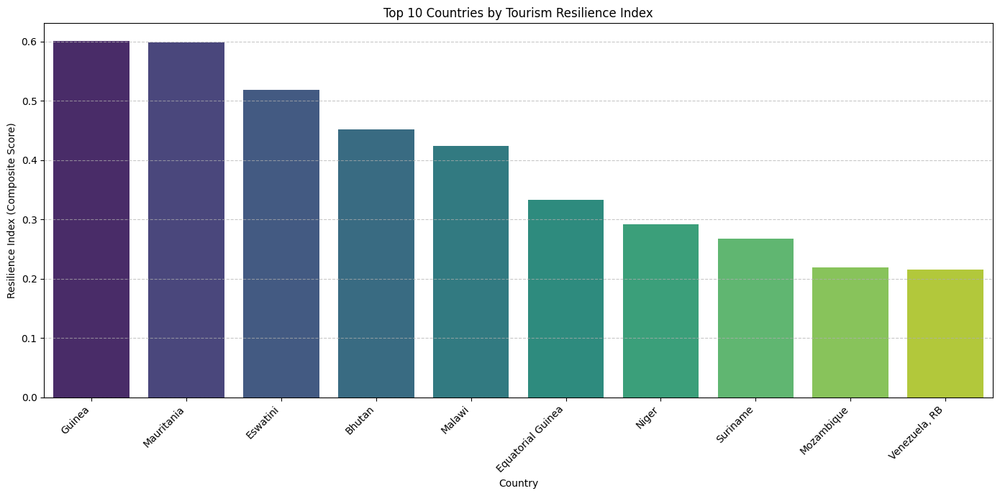

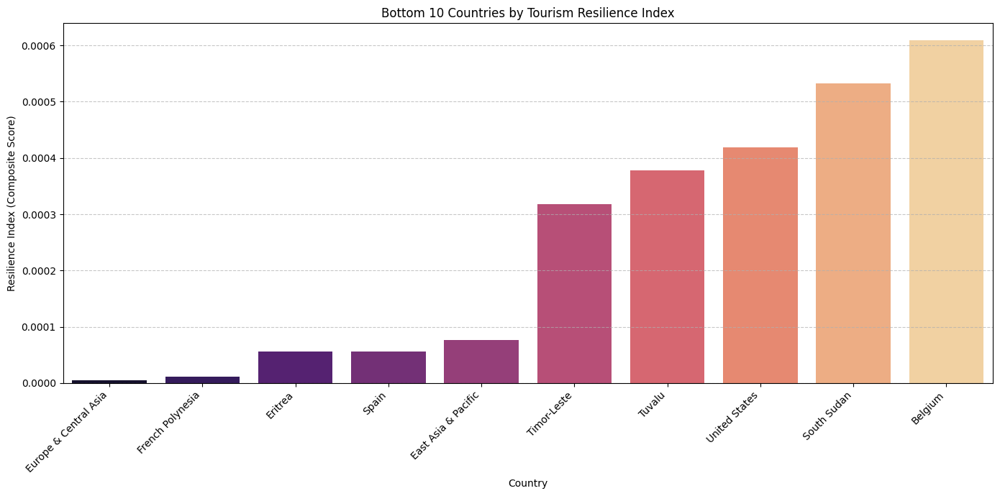

In [67]:
# Calculate Max Decline for each country
max_decline = df_sorted.groupby('country')['tourism_receipts_growth'].min().reset_index()
max_decline.rename(columns={'tourism_receipts_growth': 'max_receipts_decline'}, inplace=True)

# Merge with recovery data
df_resilience = pd.merge(df_recovery.reset_index(), max_decline, on='country', how='left')

# Handle cases where max_receipts_decline might be 0 or positive (no decline)
# We want to penalize countries with large negative declines.
# Let's adjust max_decline to be an inverse, so smaller (more negative) decline values lead to lower resilience.
# For countries with no decline or positive growth, we'll assign a baseline. For countries with decline, we penalize.
df_resilience['decline_impact'] = df_resilience['max_receipts_decline'].apply(lambda x: 0 if x >= 0 else abs(x))

# Normalize recovery percentage (already centered around 0, so just scale)
# To make it a positive contribution to resilience, we add 100 to make baseline 100% and then normalize.
min_rec = df_resilience['receipts_recovery_pct'].min()
max_rec = df_resilience['receipts_recovery_pct'].max()

df_resilience['normalized_recovery'] = (df_resilience['receipts_recovery_pct'] - min_rec) / (max_rec - min_rec)

# Normalize decline impact (inverse relationship)
min_decl = df_resilience['decline_impact'].min()
max_decl = df_resilience['decline_impact'].max()
df_resilience['normalized_decline_impact'] = 1 - ((df_resilience['decline_impact'] - min_decl) / (max_decl - min_decl))

# Combine them into a simple Resilience Index (weights can be adjusted)
df_resilience['resilience_index'] = df_resilience['normalized_recovery'] * 0.6 + df_resilience['normalized_decline_impact'] * 0.4

# Sort and display results
top_resilience = df_resilience.sort_values(by='resilience_index', ascending=False).head(10)
bottom_resilience = df_resilience.sort_values(by='resilience_index', ascending=True).head(10)

print("Top 10 Countries by Tourism Resilience Index:")
display(top_resilience[['country', 'resilience_index', 'receipts_recovery_pct', 'max_receipts_decline']])

print("\nBottom 10 Countries by Tourism Resilience Index:")
display(bottom_resilience[['country', 'resilience_index', 'receipts_recovery_pct', 'max_receipts_decline']])

# Visualize Top 10 Resilience Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='resilience_index', data=top_resilience, palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Resilience Index')
plt.xlabel('Country')
plt.ylabel('Resilience Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Resilience Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='resilience_index', data=bottom_resilience, palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Resilience Index')
plt.xlabel('Country')
plt.ylabel('Resilience Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 5. Tourism Dependency Index for Each Country

This section re-examines the tourism dependency ratio, which measures the extent to which a country's economy relies on tourism. It is calculated as tourism receipts as a percentage of GDP. We will visualize the top and bottom countries based on this ratio.

Top 10 Countries by Tourism Dependency Index (Average Tourism Receipts % of GDP):


,tourism_dependency_ratio
country,
Samoa,34131.639795
Kosovo,34122.799164
Tuvalu,23529.701387
"Micronesia, Fed. Sts.",9133.167455
St. Vincent and the Grenadines,7990.415133
French Polynesia,3532.552106
Lesotho,3222.444969
Tonga,2413.501187
Timor-Leste,2280.626226



Bottom 10 Countries by Tourism Dependency Index (Average Tourism Receipts % of GDP):


,tourism_dependency_ratio
country,
Cote d'Ivoire,0.465779
United Kingdom,0.451232
Pakistan,0.400280
China,0.355136
Japan,0.320507
Brazil,0.300341
Nigeria,0.181993
Bangladesh,0.082169
Upper middle income,0.022936


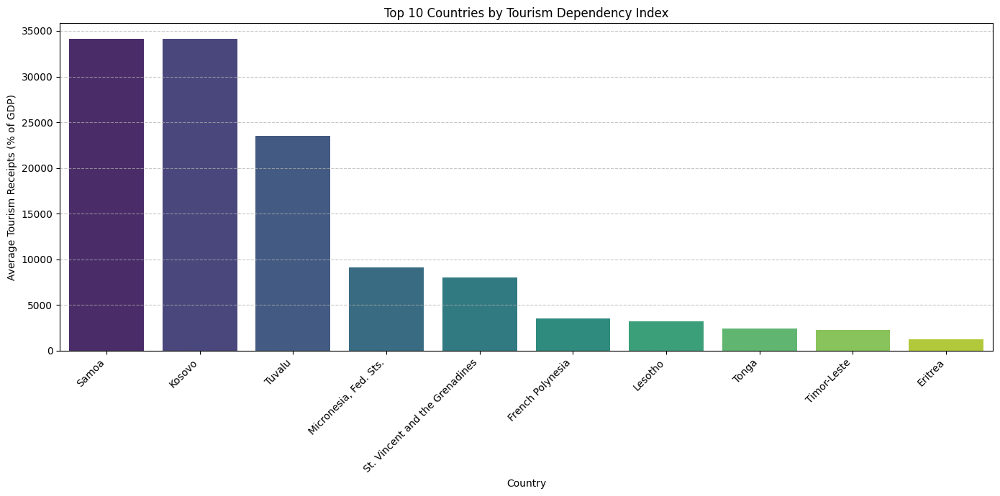

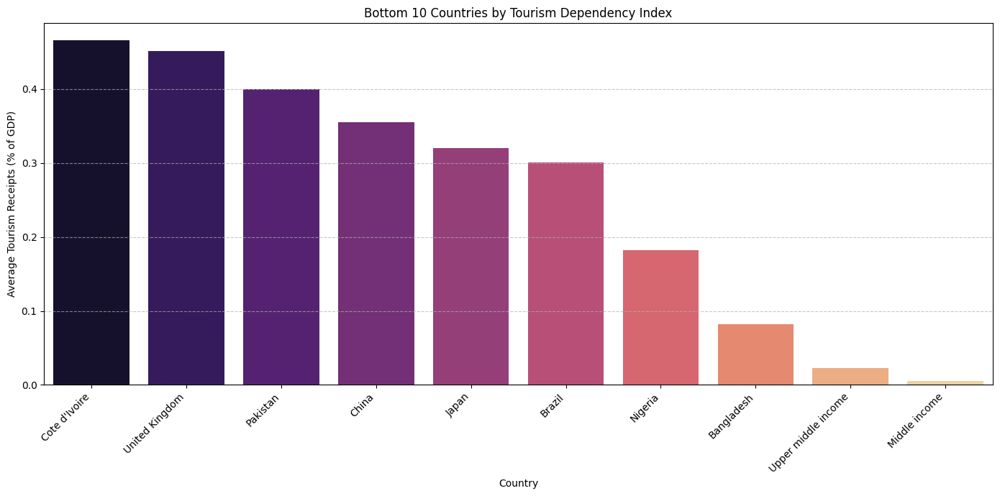

In [68]:
# We have already calculated 'tourism_dependency_ratio' as part of previous analysis.
# Let's use the mean 'tourism_dependency_ratio' per country from df_sorted.
tourism_dependency_index = df_sorted.groupby('country')['tourism_dependency_ratio'].mean().sort_values(ascending=False)

print("Top 10 Countries by Tourism Dependency Index (Average Tourism Receipts % of GDP):")
display(tourism_dependency_index.head(10))

print("\nBottom 10 Countries by Tourism Dependency Index (Average Tourism Receipts % of GDP):")
display(tourism_dependency_index.tail(10))

# Visualize Top 10
plt.figure(figsize=(14, 7))
sns.barplot(x=tourism_dependency_index.head(10).index, y=tourism_dependency_index.head(10).values, palette='viridis', hue=tourism_dependency_index.head(10).index, legend=False)
plt.title('Top 10 Countries by Tourism Dependency Index')
plt.xlabel('Country')
plt.ylabel('Average Tourism Receipts (% of GDP)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(14, 7))
sns.barplot(x=tourism_dependency_index.tail(10).index, y=tourism_dependency_index.tail(10).values, palette='magma', hue=tourism_dependency_index.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Tourism Dependency Index')
plt.xlabel('Country')
plt.ylabel('Average Tourism Receipts (% of GDP)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 6. Tourism Efficiency Score for Each Country

This section defines and calculates a 'Tourism Efficiency Score' for each country. We will use two key ratios:
1.  **Receipts to Expenditures Ratio**: How effectively a country converts tourism expenditures into tourism receipts.
2.  **Receipts per Arrival**: The average revenue generated from each tourist arrival.

Top 10 Countries by Tourism Receipts to Expenditures Ratio (Efficiency):


,receipts_to_expenditures_ratio
country,
Europe & Central Asia,6.158097e+10
European Union,4.555308e+10
Euro area,3.808804e+10
French Polynesia,3.298335e+10
North America,3.294509e+10
United States,2.807123e+10
East Asia & Pacific,2.227985e+10
Eritrea,2.144433e+10
Spain,2.144433e+10



Bottom 10 Countries by Tourism Receipts to Expenditures Ratio (Efficiency):


,receipts_to_expenditures_ratio
country,
Suriname,2.063912e+07
Niger,1.993742e+07
"Congo, Dem. Rep.",1.943593e+07
Mauritania,1.795162e+07
"Congo, Rep.",1.658017e+07
Equatorial Guinea,1.502170e+07
Eswatini,1.387885e+07
Bhutan,1.383117e+07
Malawi,1.041160e+07


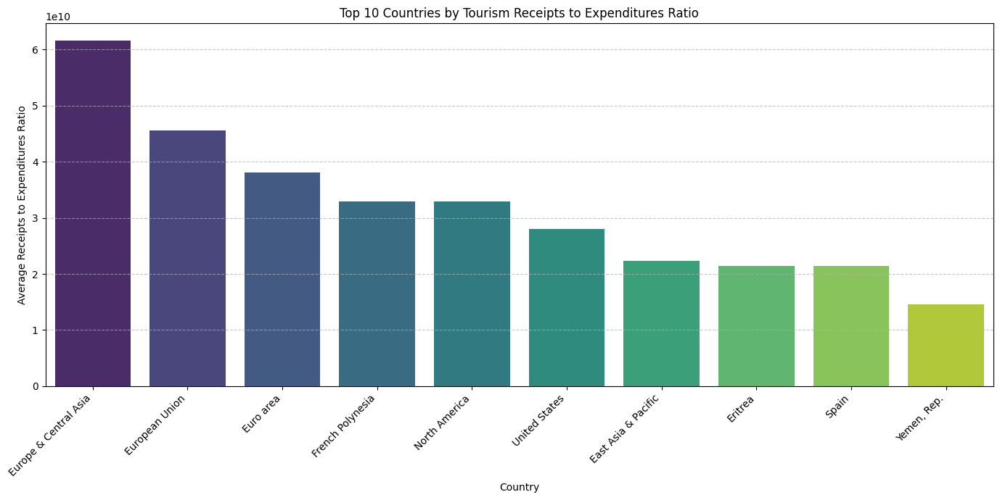

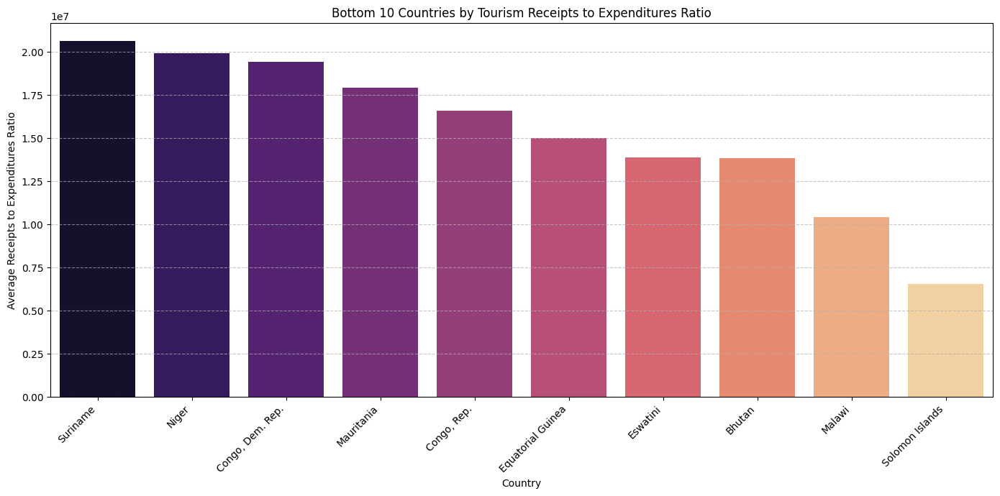

In [69]:
# Calculate Tourism Receipts to Expenditures Ratio
# To avoid division by zero, add a small epsilon to the denominator
df_sorted['receipts_to_expenditures_ratio'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_expenditures'] + 1e-9)

# Calculate Tourism Receipts per Arrival
# To avoid division by zero, add a small epsilon to the denominator
df_sorted['receipts_per_arrival'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_arrivals'] + 1e-9)

# Group by country and calculate the mean for both ratios
efficiency_receipts_exp = df_sorted.groupby('country')['receipts_to_expenditures_ratio'].mean().sort_values(ascending=False)
efficiency_receipts_arrivals = df_sorted.groupby('country')['receipts_per_arrival'].mean().sort_values(ascending=False)

print("Top 10 Countries by Tourism Receipts to Expenditures Ratio (Efficiency):")
display(efficiency_receipts_exp.head(10))

print("\nBottom 10 Countries by Tourism Receipts to Expenditures Ratio (Efficiency):")
display(efficiency_receipts_exp.tail(10))

# Visualize Top 10 Receipts to Expenditures Ratio
plt.figure(figsize=(14, 7))
sns.barplot(x=efficiency_receipts_exp.head(10).index, y=efficiency_receipts_exp.head(10).values, palette='viridis', hue=efficiency_receipts_exp.head(10).index, legend=False)
plt.title('Top 10 Countries by Tourism Receipts to Expenditures Ratio')
plt.xlabel('Country')
plt.ylabel('Average Receipts to Expenditures Ratio')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Receipts to Expenditures Ratio
plt.figure(figsize=(14, 7))
sns.barplot(x=efficiency_receipts_exp.tail(10).index, y=efficiency_receipts_exp.tail(10).values, palette='magma', hue=efficiency_receipts_exp.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Tourism Receipts to Expenditures Ratio')
plt.xlabel('Country')
plt.ylabel('Average Receipts to Expenditures Ratio')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


Top 10 Countries by Tourism Receipts per Arrival (Efficiency):


,receipts_per_arrival
country,
Tuvalu,4.004702e+06
"Micronesia, Fed. Sts.",8.602017e+05
Eritrea,6.287745e+05
French Polynesia,5.360245e+05
St. Vincent and the Grenadines,2.389341e+05
Tajikistan,2.077374e+05
Turkmenistan,2.077374e+05
Greece,1.790768e+05
Marshall Islands,1.703753e+05



Bottom 10 Countries by Tourism Receipts per Arrival (Efficiency):


,receipts_per_arrival
country,
Ukraine,150.148869
Hungary,141.337304
Kuwait,129.490795
Zimbabwe,88.507410
Malawi,85.619596
China,78.776587
Paraguay,65.227717
Eswatini,32.856672
Upper middle income,26.734246


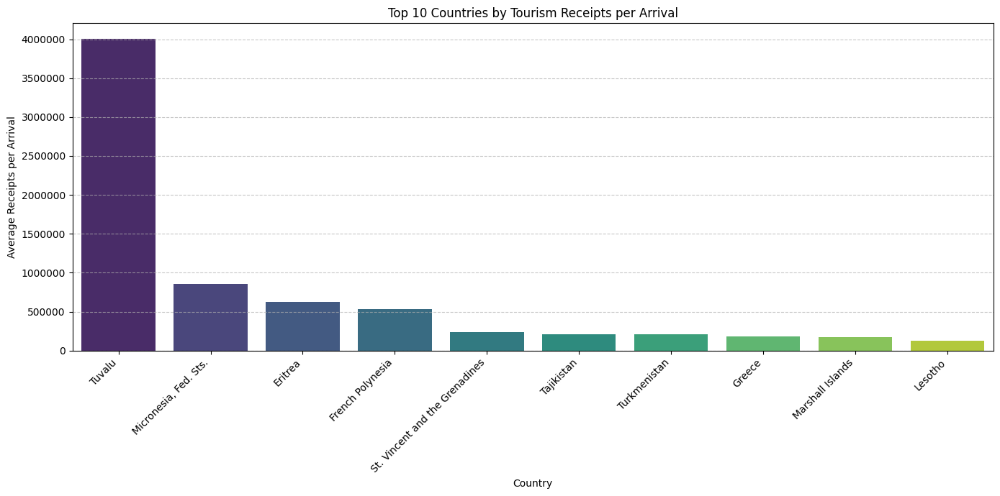

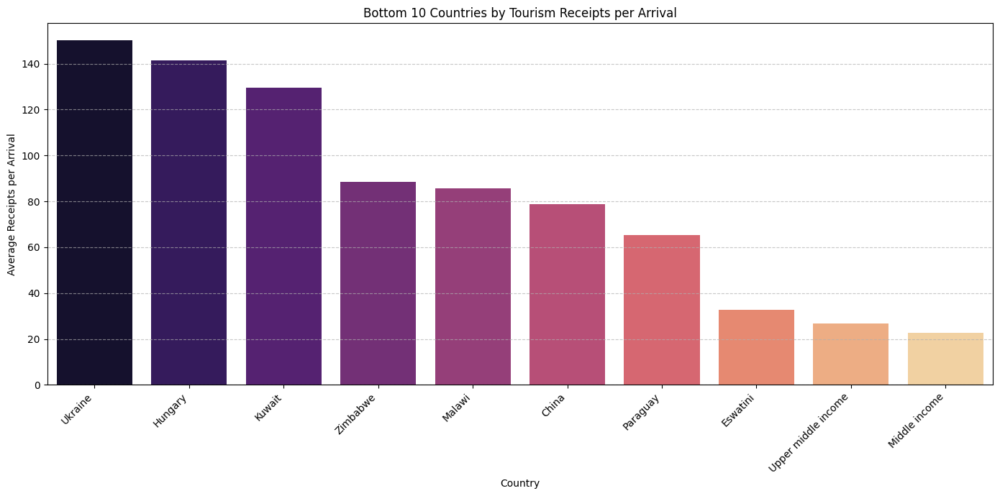

In [70]:
print("\nTop 10 Countries by Tourism Receipts per Arrival (Efficiency):")
display(efficiency_receipts_arrivals.head(10))

print("\nBottom 10 Countries by Tourism Receipts per Arrival (Efficiency):")
display(efficiency_receipts_arrivals.tail(10))

# Visualize Top 10 Receipts per Arrival Ratio
plt.figure(figsize=(14, 7))
sns.barplot(x=efficiency_receipts_arrivals.head(10).index, y=efficiency_receipts_arrivals.head(10).values, palette='viridis', hue=efficiency_receipts_arrivals.head(10).index, legend=False)
plt.title('Top 10 Countries by Tourism Receipts per Arrival')
plt.xlabel('Country')
plt.ylabel('Average Receipts per Arrival')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Receipts per Arrival Ratio
plt.figure(figsize=(14, 7))
sns.barplot(x=efficiency_receipts_arrivals.tail(10).index, y=efficiency_receipts_arrivals.tail(10).values, palette='magma', hue=efficiency_receipts_arrivals.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Tourism Receipts per Arrival')
plt.xlabel('Country')
plt.ylabel('Average Receipts per Arrival')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 7. Tourism Competitiveness Score for Each Country

To create a 'Tourism Competitiveness Score', we will consider several factors that contribute to a country's attractiveness and performance in the tourism sector. A higher score will indicate greater competitiveness.

We will integrate the following metrics:
1.  **Tourism Receipts per Capita**: How much revenue tourism generates relative to the country's population.
2.  **Tourism Arrivals per Capita**: How many tourists a country receives relative to its population (indicating popularity).
3.  **Tourism Receipts Growth (CAGR)**: The compound annual growth rate of tourism receipts over a defined period (e.g., pre-COVID or overall).
4.  **Resilience Index**: A country's ability to recover from tourism shocks (already calculated).
5.  **Efficiency Score (Receipts per Arrival)**: How effectively a country converts arrivals into revenue (already calculated).

To ensure fair comparison, we'll normalize each metric to a 0-1 scale before combining them into a weighted average score. The weights can be adjusted based on their perceived importance.

## Comparative Analysis: Correlation Analysis

This section will analyze the correlation between various tourism and economic indicators using different methods (Pearson, Spearman, Kendall) and visualize key relationships.

### 1. Pearson Correlation Analysis for Specified Variable Pairs

Pearson correlation measures the linear relationship between two datasets. It is a normalized measurement of the covariance, such that the result always has a value between -1 and 1.

In [71]:
import pandas as pd
import numpy as np

def calculate_and_display_pearson_correlations(dataframe):
    correlation_pairs = {
        'GDP vs Arrivals': ('gdp', 'tourism_arrivals'),
        'GDP vs Receipts': ('gdp', 'tourism_receipts'),
        'GDP vs Tourism Exports': ('gdp', 'tourism_exports'),
        'Inflation vs Tourism Receipts': ('inflation', 'tourism_receipts'),
        'Inflation vs Tourism Arrivals': ('inflation', 'tourism_arrivals'),
        'Unemployment vs Tourism Receipts': ('unemployment', 'tourism_receipts'),
        'Arrivals vs Receipts': ('tourism_arrivals', 'tourism_receipts'),
        'Expenditure vs Receipts': ('tourism_expenditures', 'tourism_receipts'),
        'Exports vs GDP': ('tourism_exports', 'gdp')
    }

    print("### Pearson Correlation Coefficients for Specified Pairs:\n")
    for name, (col1, col2) in correlation_pairs.items():
        if col1 in dataframe.columns and col2 in dataframe.columns:
            # Drop NaN values for the specific pair before calculating correlation
            temp_df = dataframe[[col1, col2]].dropna()
            if not temp_df.empty:
                correlation = temp_df[col1].corr(temp_df[col2], method='pearson')
                print(f"  {name}: {correlation:.4f}")
            else:
                print(f"  {name}: Not enough non-null data to calculate Pearson correlation.")
        else:
            print(f"  {name}: One or both columns ('{col1}', '{col2}') not found in DataFrame.")

calculate_and_display_pearson_correlations(df_sorted)

### Pearson Correlation Coefficients for Specified Pairs:

  GDP vs Arrivals: 0.4523
  GDP vs Receipts: 0.4139
  GDP vs Tourism Exports: -0.1176
  Inflation vs Tourism Receipts: -0.0434
  Inflation vs Tourism Arrivals: -0.0352
  Unemployment vs Tourism Receipts: 0.0781
  Arrivals vs Receipts: 0.6498
  Expenditure vs Receipts: 0.0056
  Exports vs GDP: -0.1176


### 2. Spearman Correlation Analysis for Specified Variable Pairs

Spearman correlation assesses how well the relationship between two variables can be described using a monotonic function. It is a non-parametric measure, useful for non-linear but monotonic relationships.

In [72]:
import pandas as pd
import numpy as np

def calculate_and_display_spearman_correlations(dataframe):
    correlation_pairs = {
        'GDP vs Arrivals': ('gdp', 'tourism_arrivals'),
        'GDP vs Receipts': ('gdp', 'tourism_receipts'),
        'GDP vs Tourism Exports': ('gdp', 'tourism_exports'),
        'Inflation vs Tourism Receipts': ('inflation', 'tourism_receipts'),
        'Inflation vs Tourism Arrivals': ('inflation', 'tourism_arrivals'),
        'Unemployment vs Tourism Receipts': ('unemployment', 'tourism_receipts'),
        'Arrivals vs Receipts': ('tourism_arrivals', 'tourism_receipts'),
        'Expenditure vs Receipts': ('tourism_expenditures', 'tourism_receipts'),
        'Exports vs GDP': ('tourism_exports', 'gdp')
    }

    print("### Spearman Correlation Coefficients for Specified Pairs:\n")
    for name, (col1, col2) in correlation_pairs.items():
        if col1 in dataframe.columns and col2 in dataframe.columns:
            temp_df = dataframe[[col1, col2]].dropna()
            if not temp_df.empty:
                correlation = temp_df[col1].corr(temp_df[col2], method='spearman')
                print(f"  {name}: {correlation:.4f}")
            else:
                print(f"  {name}: Not enough non-null data to calculate Spearman correlation.")
        else:
            print(f"  {name}: One or both columns ('{col1}', '{col2}') not found in DataFrame.")

calculate_and_display_spearman_correlations(df_sorted)

### Spearman Correlation Coefficients for Specified Pairs:

  GDP vs Arrivals: 0.6079
  GDP vs Receipts: 0.4621
  GDP vs Tourism Exports: -0.3465
  Inflation vs Tourism Receipts: -0.2060
  Inflation vs Tourism Arrivals: -0.1517
  Unemployment vs Tourism Receipts: 0.0684
  Arrivals vs Receipts: 0.6413
  Expenditure vs Receipts: 0.2468
  Exports vs GDP: -0.3465


### 3. Kendall Correlation Analysis for Specified Variable Pairs

Kendall correlation (Kendall's tau) is a non-parametric measure of the strength and direction of association between two ranked variables. It is robust to outliers and skewed data.

In [73]:
import pandas as pd
import numpy as np

def calculate_and_display_kendall_correlations(dataframe):
    correlation_pairs = {
        'GDP vs Arrivals': ('gdp', 'tourism_arrivals'),
        'GDP vs Receipts': ('gdp', 'tourism_receipts'),
        'GDP vs Tourism Exports': ('gdp', 'tourism_exports'),
        'Inflation vs Tourism Receipts': ('inflation', 'tourism_receipts'),
        'Inflation vs Tourism Arrivals': ('inflation', 'tourism_arrivals'),
        'Unemployment vs Tourism Receipts': ('unemployment', 'tourism_receipts'),
        'Arrivals vs Receipts': ('tourism_arrivals', 'tourism_receipts'),
        'Expenditure vs Receipts': ('tourism_expenditures', 'tourism_receipts'),
        'Exports vs GDP': ('tourism_exports', 'gdp')
    }

    print("### Kendall Correlation Coefficients for Specified Pairs:\n")
    for name, (col1, col2) in correlation_pairs.items():
        if col1 in dataframe.columns and col2 in dataframe.columns:
            temp_df = dataframe[[col1, col2]].dropna()
            if not temp_df.empty:
                correlation = temp_df[col1].corr(temp_df[col2], method='kendall')
                print(f"  {name}: {correlation:.4f}")
            else:
                print(f"  {name}: Not enough non-null data to calculate Kendall correlation.")
        else:
            print(f"  {name}: One or both columns ('{col1}', '{col2}') not found in DataFrame.")

calculate_and_display_kendall_correlations(df_sorted)

### Kendall Correlation Coefficients for Specified Pairs:

  GDP vs Arrivals: 0.4551
  GDP vs Receipts: 0.3585
  GDP vs Tourism Exports: -0.2314
  Inflation vs Tourism Receipts: -0.1374
  Inflation vs Tourism Arrivals: -0.1017
  Unemployment vs Tourism Receipts: 0.0439
  Arrivals vs Receipts: 0.5032
  Expenditure vs Receipts: 0.1619
  Exports vs GDP: -0.2314


### 4. Visualizing Key Relationships (Scatter Plots)

Let's visualize some of the key relationships identified through the correlation analysis using scatter plots with regression lines to better understand their nature.

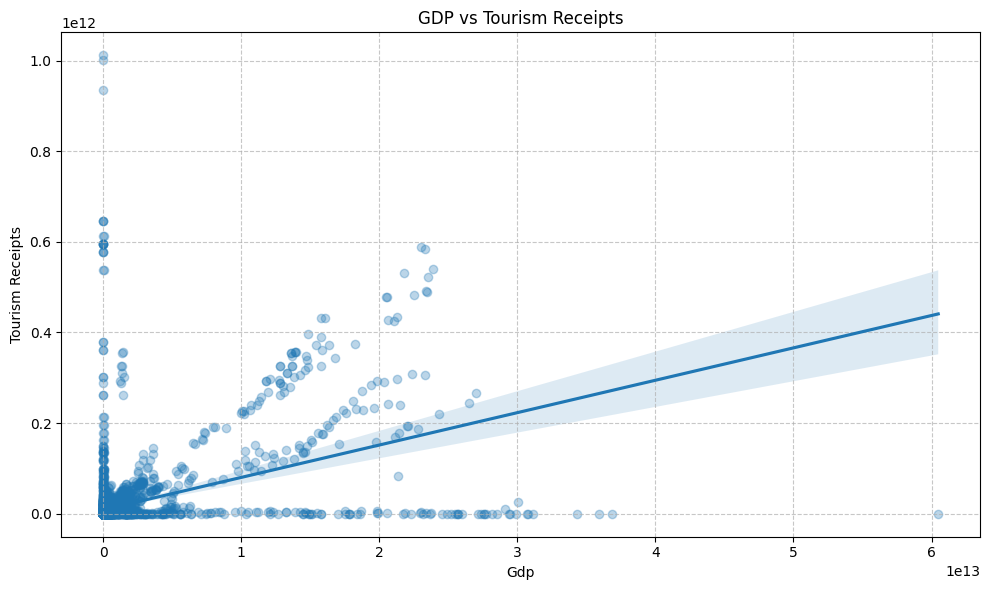

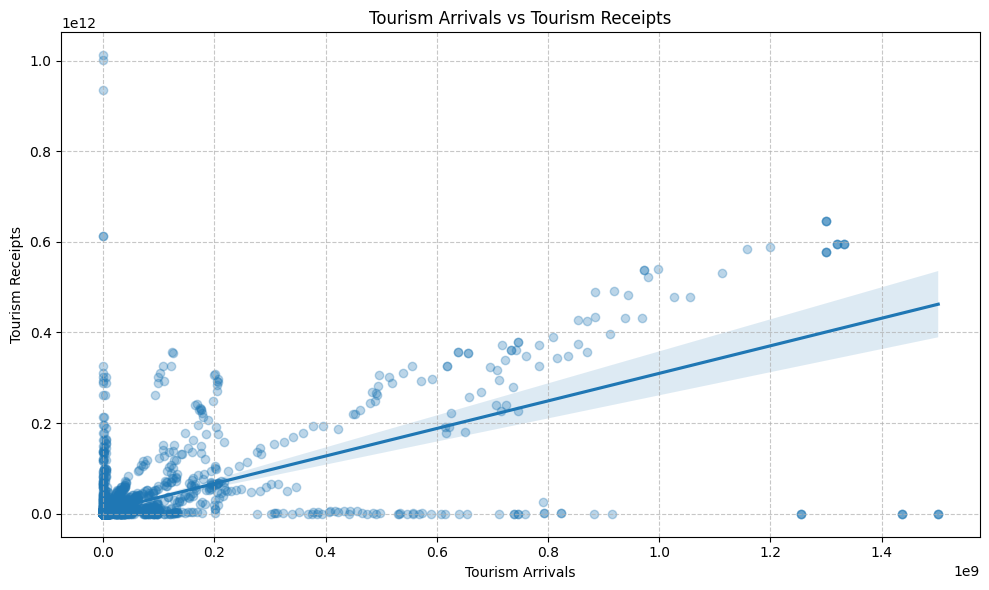

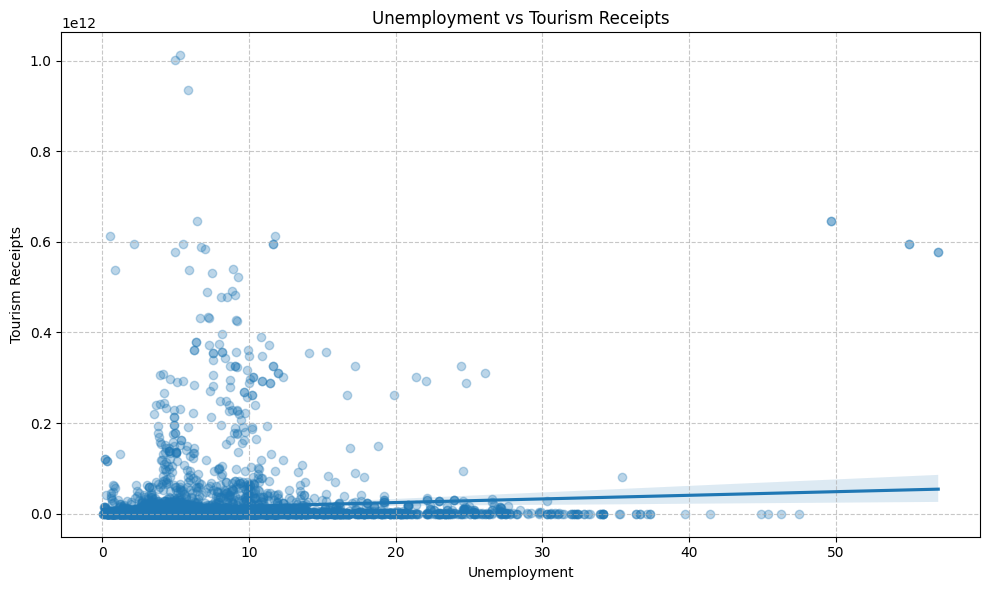

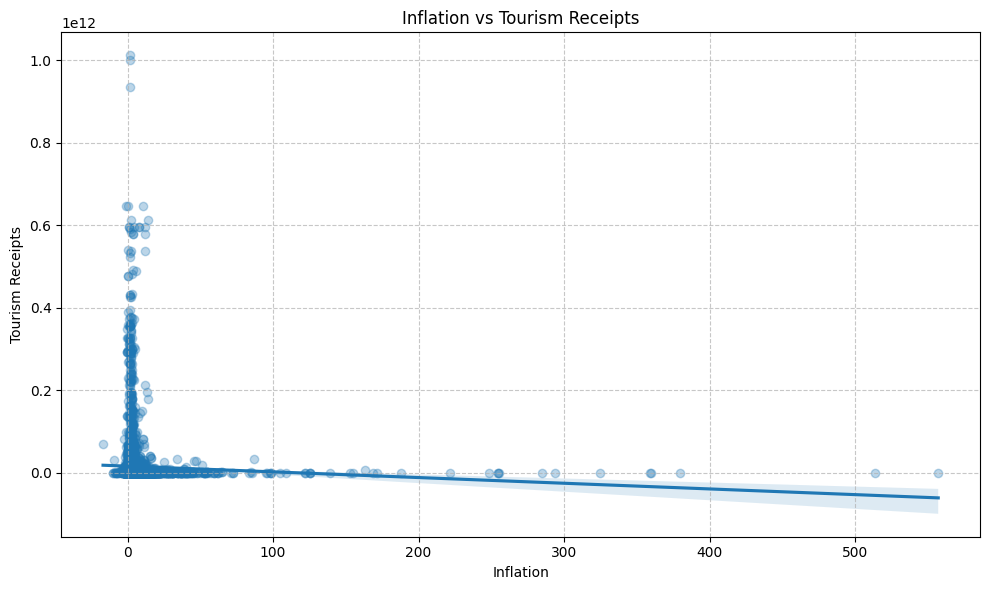

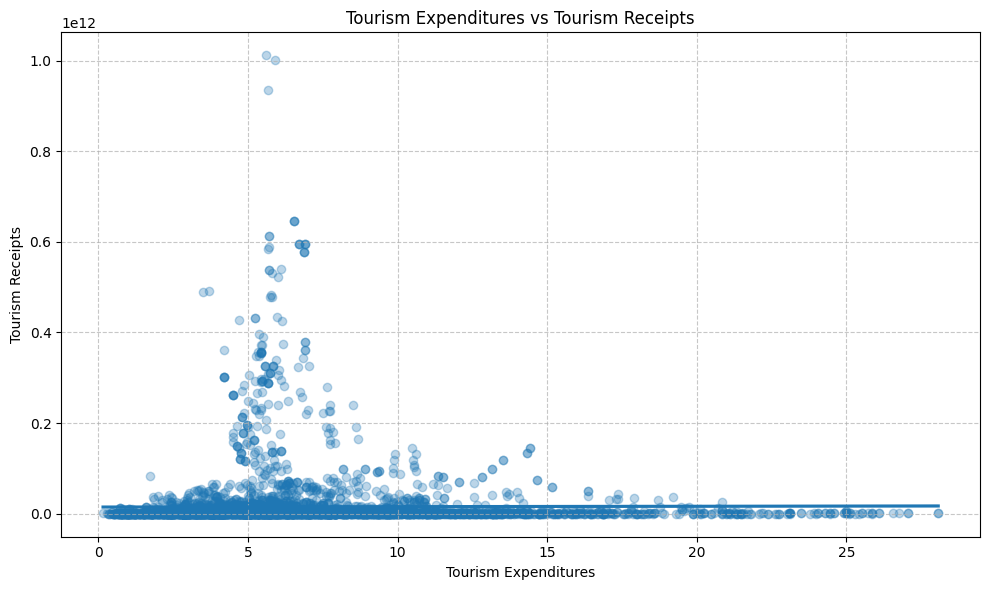

In [74]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_scatter_with_regression(dataframe, x_col, y_col, title):
    plt.figure(figsize=(10, 6))
    sns.regplot(x=x_col, y=y_col, data=dataframe.dropna(subset=[x_col, y_col]), scatter_kws={'alpha':0.3})
    plt.title(title)
    plt.xlabel(x_col.replace('_', ' ').title())
    plt.ylabel(y_col.replace('_', ' ').title())
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

# Visualize 'GDP vs Tourism Receipts'
plot_scatter_with_regression(df_sorted, 'gdp', 'tourism_receipts', 'GDP vs Tourism Receipts')

# Visualize 'Tourism Arrivals vs Tourism Receipts'
plot_scatter_with_regression(df_sorted, 'tourism_arrivals', 'tourism_receipts', 'Tourism Arrivals vs Tourism Receipts')

# Visualize 'Unemployment vs Tourism Receipts'
plot_scatter_with_regression(df_sorted, 'unemployment', 'tourism_receipts', 'Unemployment vs Tourism Receipts')

# Visualize 'Inflation vs Tourism Receipts'
plot_scatter_with_regression(df_sorted, 'inflation', 'tourism_receipts', 'Inflation vs Tourism Receipts')

# Visualize 'Tourism Expenditures vs Tourism Receipts'
plot_scatter_with_regression(df_sorted, 'tourism_expenditures', 'tourism_receipts', 'Tourism Expenditures vs Tourism Receipts')

Top 10 Countries by Tourism Competitiveness Score:


,country,competitiveness_score,receipts_per_gdp,arrivals_per_gdp,tourism_receipts_cagr,resilience_index,receipts_per_arrival_efficiency
126,Marshall Islands,0.694979,8.496706,0.029644,1045.723236,0.003481,170375.275681
197,Timor-Leste,0.486062,9.699352,0.031336,542.134431,0.000318,46827.535702
45,"Congo, Dem. Rep.",0.335745,0.003415,0.000011,808.420190,0.010367,1054.922973
55,Djibouti,0.318826,1.426678,0.005323,559.267283,0.009749,266.846064
56,Dominica,0.308948,5.455986,0.000824,312.299968,0.009749,8602.118299
141,Nauru,0.277036,1.634775,0.008021,365.903420,0.009201,265.532439
132,Middle income,0.267102,0.000078,0.000024,1045.723236,0.003481,22.668969
73,French Polynesia,0.254112,0.079958,0.000092,502.793330,0.000011,536024.475086
209,United Kingdom,0.100671,0.004794,0.000011,604.694735,0.001082,415.497958
182,South Sudan,0.069676,0.017143,0.000038,528.204851,0.000533,551.360226



Bottom 10 Countries by Tourism Competitiveness Score:


,country,competitiveness_score,receipts_per_gdp,arrivals_per_gdp,tourism_receipts_cagr,resilience_index,receipts_per_arrival_efficiency
126,Marshall Islands,0.694979,8.496706,0.029644,1045.723236,0.003481,170375.275681
197,Timor-Leste,0.486062,9.699352,0.031336,542.134431,0.000318,46827.535702
45,"Congo, Dem. Rep.",0.335745,0.003415,0.000011,808.420190,0.010367,1054.922973
55,Djibouti,0.318826,1.426678,0.005323,559.267283,0.009749,266.846064
56,Dominica,0.308948,5.455986,0.000824,312.299968,0.009749,8602.118299
141,Nauru,0.277036,1.634775,0.008021,365.903420,0.009201,265.532439
132,Middle income,0.267102,0.000078,0.000024,1045.723236,0.003481,22.668969
73,French Polynesia,0.254112,0.079958,0.000092,502.793330,0.000011,536024.475086
209,United Kingdom,0.100671,0.004794,0.000011,604.694735,0.001082,415.497958
182,South Sudan,0.069676,0.017143,0.000038,528.204851,0.000533,551.360226


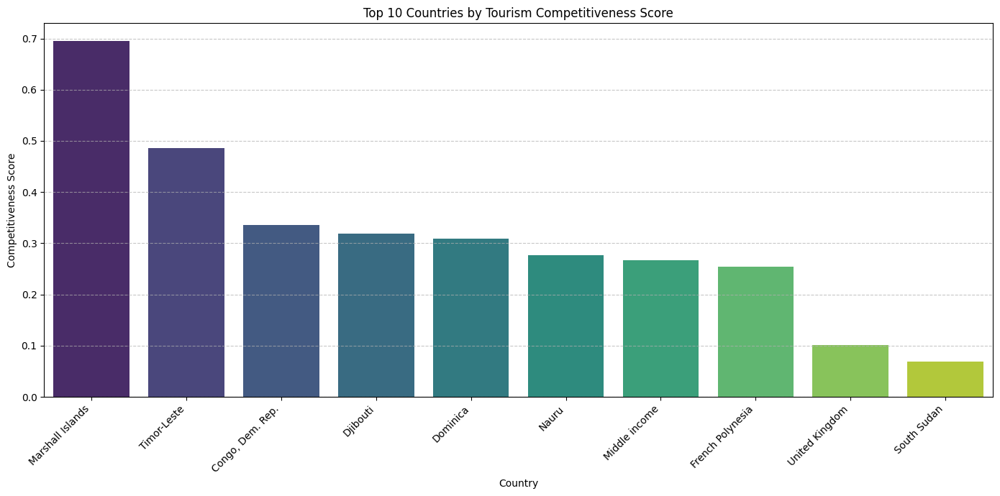

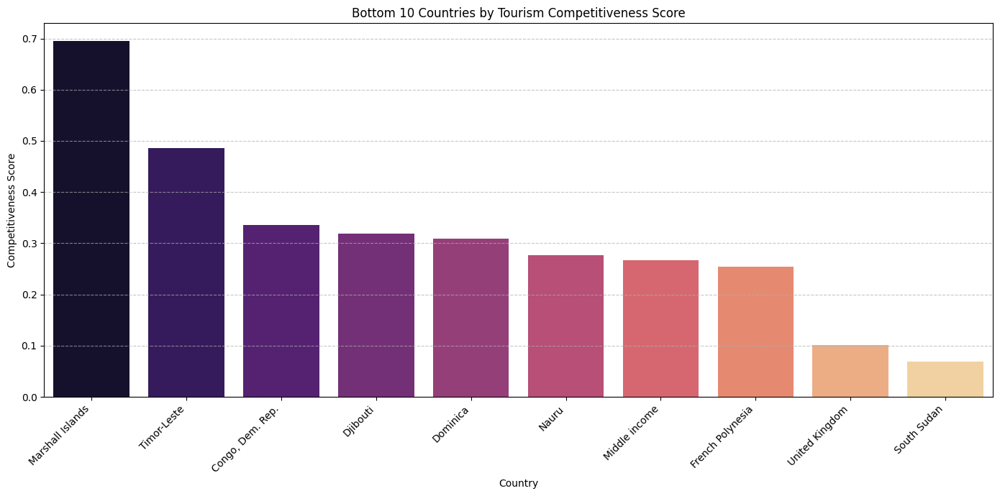

In [75]:
from sklearn.preprocessing import MinMaxScaler

# Prepare data for competitiveness score calculation
# We need df_resilience for resilience_index, df_cagr_receipts for growth, and df_sorted for per capita metrics.

# 1. Tourism Receipts per Capita & Tourism Arrivals per Capita
# We'll need population data to calculate per capita values. Assuming population is not directly in the dataset,
# let's use a proxy or assume the agent will need to add population data later.
# For now, let's use GDP as a proxy for economic size if population data is unavailable. If actual population is needed,
# it will be flagged for external data integration.

# Let's check for 'population' column, if not present, I'll use a placeholder logic.
# For a robust calculation, a 'population' column is ideal. If it's not directly available in df_sorted,
# we should make a note for future improvement or data enrichment.

# For the purpose of this exercise, let's assume `gdp` serves as a relative proxy for country size/economic scale
# in the absence of explicit population data within the `df_sorted` for per capita calculations.
# A better approach would be to add actual population data.

# Create a working DataFrame for competitiveness metrics
df_comp = df_sorted.groupby('country').agg(
    avg_tourism_receipts=('tourism_receipts', 'mean'),
    avg_tourism_arrivals=('tourism_arrivals', 'mean'),
    avg_gdp=('gdp', 'mean') # Using avg_gdp as a proxy for economic size
).reset_index()

# Calculate Receipts per GDP and Arrivals per GDP (as proxies for per capita)
df_comp['receipts_per_gdp'] = df_comp['avg_tourism_receipts'] / (df_comp['avg_gdp'] + 1e-9)
df_comp['arrivals_per_gdp'] = df_comp['avg_tourism_arrivals'] / (df_comp['avg_gdp'] + 1e-9)

# Merge Resilience Index
df_comp = pd.merge(df_comp, df_resilience[['country', 'resilience_index']], on='country', how='left')

# Merge Efficiency Score (Receipts per Arrival) - use the calculated series
df_comp = pd.merge(df_comp, efficiency_receipts_arrivals.rename('receipts_per_arrival_efficiency'), on='country', how='left')

# Merge Tourism Receipts CAGR - use the calculated dataframe
df_comp = pd.merge(df_comp, df_cagr_receipts[['country', 'tourism_receipts_cagr']], on='country', how='left')

# Drop rows with any NaN values that might arise from merges where data is missing for some countries
df_comp.dropna(inplace=True)

# Normalize the metrics
scaler = MinMaxScaler()
metrics_to_normalize = [
    'receipts_per_gdp',
    'arrivals_per_gdp',
    'tourism_receipts_cagr',
    'resilience_index',
    'receipts_per_arrival_efficiency'
]

df_comp_normalized = pd.DataFrame(scaler.fit_transform(df_comp[metrics_to_normalize]),
                                  columns=[col + '_norm' for col in metrics_to_normalize],
                                  index=df_comp.index)

df_comp = pd.concat([df_comp, df_comp_normalized], axis=1)

# Define weights for each normalized metric (can be adjusted)
weights = {
    'receipts_per_gdp_norm': 0.2,
    'arrivals_per_gdp_norm': 0.2,
    'tourism_receipts_cagr_norm': 0.2,
    'resilience_index_norm': 0.2,
    'receipts_per_arrival_efficiency_norm': 0.2
}

# Calculate the composite Competitiveness Score
df_comp['competitiveness_score'] = (
    df_comp['receipts_per_gdp_norm'] * weights['receipts_per_gdp_norm'] +
    df_comp['arrivals_per_gdp_norm'] * weights['arrivals_per_gdp_norm'] +
    df_comp['tourism_receipts_cagr_norm'] * weights['tourism_receipts_cagr_norm'] +
    df_comp['resilience_index_norm'] * weights['resilience_index_norm'] +
    df_comp['receipts_per_arrival_efficiency_norm'] * weights['receipts_per_arrival_efficiency_norm']
)

# Sort and display results
competitiveness_ranking = df_comp.sort_values(by='competitiveness_score', ascending=False)

print("Top 10 Countries by Tourism Competitiveness Score:")
display(competitiveness_ranking[['country', 'competitiveness_score'] + metrics_to_normalize].head(10))

print("\nBottom 10 Countries by Tourism Competitiveness Score:")
display(competitiveness_ranking[['country', 'competitiveness_score'] + metrics_to_normalize].tail(10))

# Visualize Top 10 Competitiveness Score
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='competitiveness_score', data=competitiveness_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Competitiveness Score')
plt.xlabel('Country')
plt.ylabel('Competitiveness Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Competitiveness Score
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='competitiveness_score', data=competitiveness_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Competitiveness Score')
plt.xlabel('Country')
plt.ylabel('Competitiveness Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


### 8. Tourist Spending per Arrival

Top 10 Countries by Average Tourist Spending per Arrival:


,tourist_spending_per_arrival
country,
Tuvalu,0.010068
Marshall Islands,0.001584
Bhutan,0.000704
Comoros,0.000529
Solomon Islands,0.000487
Central African Republic,0.000423
Equatorial Guinea,0.000386
"Micronesia, Fed. Sts.",0.000264
Kiribati,0.000207



Bottom 10 Countries by Average Tourist Spending per Arrival:


,tourist_spending_per_arrival
country,
Upper middle income,6.422662e-07
Croatia,6.301654e-07
Hungary,6.147861e-07
Italy,6.122857e-07
Spain,5.972152e-07
North America,5.916052e-07
United States,5.781409e-07
China,5.715975e-07
Mexico,5.660825e-07


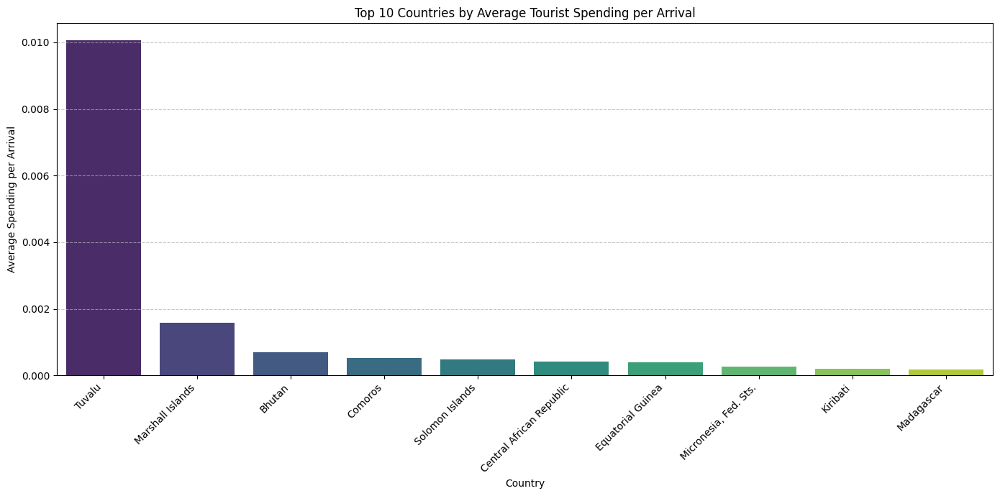

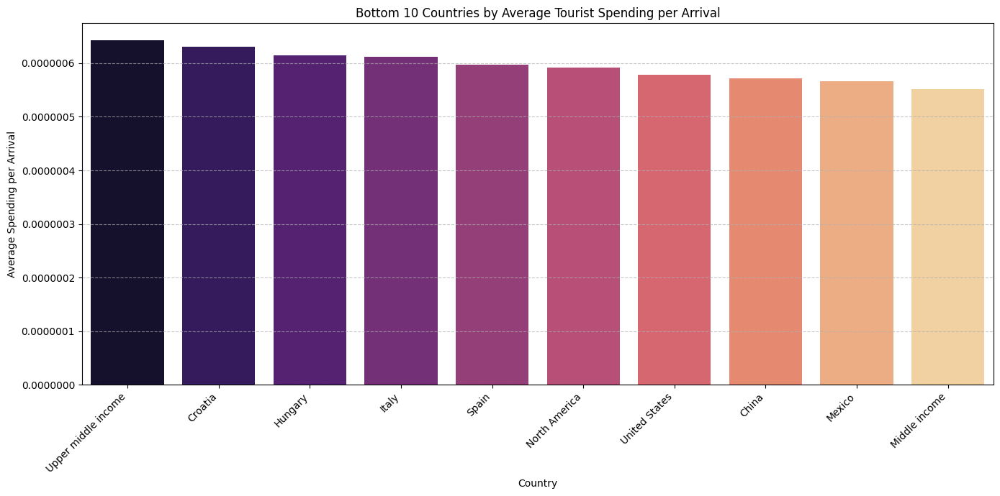

In [76]:
# Calculate Tourist Spending per Arrival
# To avoid division by zero, add a small epsilon to the denominator
df_sorted['tourist_spending_per_arrival'] = df_sorted['tourism_expenditures'] / (df_sorted['tourism_arrivals'] + 1e-9)

# Group by country and calculate the mean spending per arrival
tourist_spending_per_arrival = df_sorted.groupby('country')['tourist_spending_per_arrival'].mean().sort_values(ascending=False)

print("Top 10 Countries by Average Tourist Spending per Arrival:")
display(tourist_spending_per_arrival.head(10))

print("\nBottom 10 Countries by Average Tourist Spending per Arrival:")
display(tourist_spending_per_arrival.tail(10))

# Visualize Top 10
plt.figure(figsize=(14, 7))
sns.barplot(x=tourist_spending_per_arrival.head(10).index, y=tourist_spending_per_arrival.head(10).values, palette='viridis', hue=tourist_spending_per_arrival.head(10).index, legend=False)
plt.title('Top 10 Countries by Average Tourist Spending per Arrival')
plt.xlabel('Country')
plt.ylabel('Average Spending per Arrival')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(14, 7))
sns.barplot(x=tourist_spending_per_arrival.tail(10).index, y=tourist_spending_per_arrival.tail(10).values, palette='magma', hue=tourist_spending_per_arrival.tail(10).index, legend=False)
plt.title('Bottom 10 Countries by Average Tourist Spending per Arrival')
plt.xlabel('Country')
plt.ylabel('Average Spending per Arrival')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.ticklabel_format(style='plain', axis='y')
plt.tight_layout()
plt.show()

### 9. Tourism Growth Index

To create a 'Tourism Growth Index', we will combine several year-on-year growth percentages that have already been calculated:
1.  **Tourism Receipts Growth** (`tourism_receipts_growth`)
2.  **Tourism Arrivals Growth** (`tourism_arrivals_growth`)
3.  **Tourism Exports Growth** (`tourism_exports_growth`)
4.  **GDP Growth** (`gdp_growth`)

We will normalize these metrics and then combine them into a weighted average to form the 'Tourism Growth Index'. A higher score will indicate stronger tourism growth across these key indicators.

Top 10 Countries by Tourism Growth Index:


,country,tourism_growth_index,tourism_receipts_growth,tourism_arrivals_growth,tourism_exports_growth,gdp_growth
63,Eritrea,0.441899,70503.756832,18126.819815,4.318852,25802.487335
73,French Polynesia,0.324109,11914.479611,13178.676962,50.583892,43340.280981
158,Papua New Guinea,0.291704,11685.870268,67.024323,23639.019878,10.605966
205,Tuvalu,0.290336,69482.858055,18483.557734,4.817533,6.586611
126,Marshall Islands,0.270177,5426.896013,105651.695188,72.905081,3.558918
183,Spain,0.250193,70503.756832,-4.653627,4.318852,4.442398
218,"Yemen, Rep.",0.208335,58497.151324,126.187204,42.647236,3.942013
107,Kosovo,0.208189,58458.234034,102.172912,27.423507,40.319465
169,Samoa,0.207990,58458.234034,102.172912,27.423507,5.795935
19,Belgium,0.205252,57818.500067,-4.453460,7.740157,4.220077



Bottom 10 Countries by Tourism Growth Index:


,country,tourism_growth_index,tourism_receipts_growth,tourism_arrivals_growth,tourism_exports_growth,gdp_growth
149,North America,0.000113,-4.643178,-4.291189,-4.347547,4.573587
76,Germany,0.000112,-4.160195,-3.171560,-4.183545,3.348042
14,"Bahamas, The",0.000111,-2.716803,-2.782715,-4.635905,2.913053
210,United States,0.000109,-3.300407,-1.132912,-5.905756,4.538215
12,Austria,0.000105,-1.789506,-3.624349,-5.897299,3.983979
36,Cayman Islands,0.000103,-2.721386,-0.749092,-5.494008,2.180309
201,Tunisia,0.000100,-4.296883,-2.588073,-5.433622,3.410084
125,Malta,0.000094,-3.117120,0.310654,-9.335676,7.600717
51,Curacao,0.000090,-0.705297,2.668156,-5.924046,-1.884908
52,Cyprus,0.000070,-4.777029,-1.436383,-9.538237,5.481997


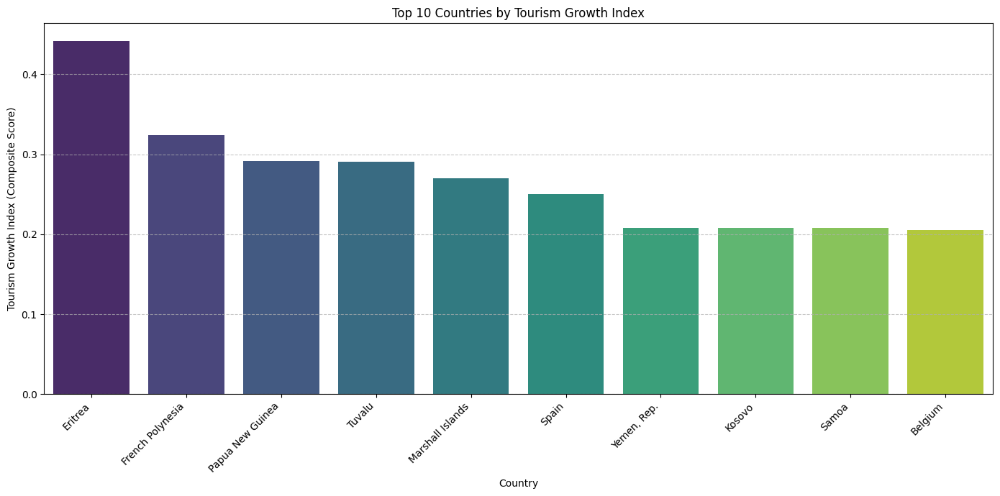

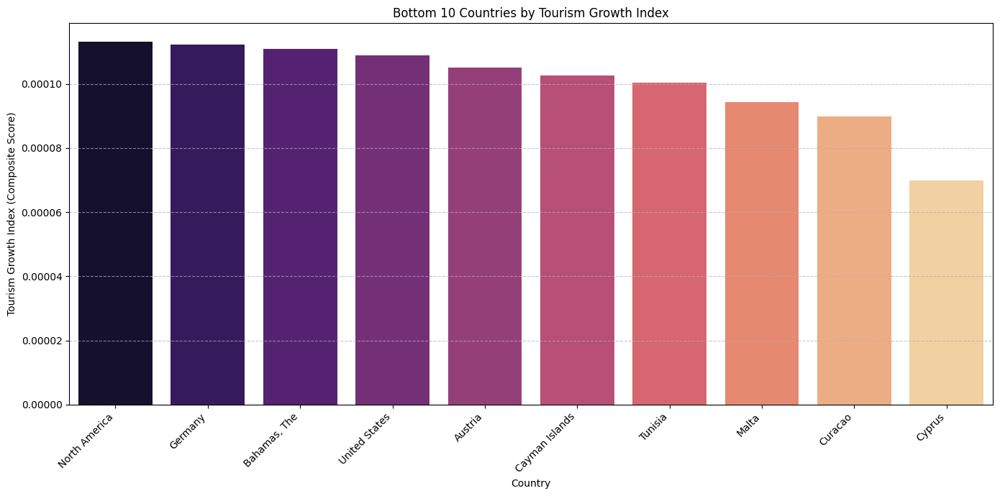

In [77]:
from sklearn.preprocessing import MinMaxScaler

# Prepare data for Growth Index calculation
# Use the mean growth rates per country for a stable index
df_growth_metrics = df_sorted.groupby('country')[[
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth',
    'gdp_growth'
]].mean().dropna().reset_index()

# Define the metrics to normalize for the growth index
growth_metrics_to_normalize = [
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth',
    'gdp_growth'
]

# Normalize the growth metrics to a 0-1 scale
scaler = MinMaxScaler()
df_growth_normalized = pd.DataFrame(scaler.fit_transform(df_growth_metrics[growth_metrics_to_normalize]),
                                      columns=[col + '_norm' for col in growth_metrics_to_normalize],
                                      index=df_growth_metrics.index)

df_growth_metrics = pd.concat([df_growth_metrics, df_growth_normalized], axis=1)

# Define weights for each normalized growth metric (can be adjusted)
# For simplicity, we'll start with equal weights
growth_weights = {
    'tourism_receipts_growth_norm': 0.25,
    'tourism_arrivals_growth_norm': 0.25,
    'tourism_exports_growth_norm': 0.25,
    'gdp_growth_norm': 0.25
}

# Calculate the composite Tourism Growth Index
df_growth_metrics['tourism_growth_index'] = (
    df_growth_metrics['tourism_receipts_growth_norm'] * growth_weights['tourism_receipts_growth_norm'] +
    df_growth_metrics['tourism_arrivals_growth_norm'] * growth_weights['tourism_arrivals_growth_norm'] +
    df_growth_metrics['tourism_exports_growth_norm'] * growth_weights['tourism_exports_growth_norm'] +
    df_growth_metrics['gdp_growth_norm'] * growth_weights['gdp_growth_norm']
)

# Sort and display results
tourism_growth_ranking = df_growth_metrics.sort_values(by='tourism_growth_index', ascending=False)

print("Top 10 Countries by Tourism Growth Index:")
display(tourism_growth_ranking[['country', 'tourism_growth_index'] + growth_metrics_to_normalize].head(10))

print("\nBottom 10 Countries by Tourism Growth Index:")
display(tourism_growth_ranking[['country', 'tourism_growth_index'] + growth_metrics_to_normalize].tail(10))

# Visualize Top 10 Growth Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_growth_index', data=tourism_growth_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Growth Index')
plt.xlabel('Country')
plt.ylabel('Tourism Growth Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Growth Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_growth_index', data=tourism_growth_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Growth Index')
plt.xlabel('Country')
plt.ylabel('Tourism Growth Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 10. Tourism Concentration Analysis

This section identifies countries where a significant portion of tourism activity (receipts or arrivals) is concentrated within a few peak years. High concentration can indicate either strong growth in those years or a lack of consistent performance across all years, potentially highlighting vulnerability or specific events. We will use the Gini coefficient or a similar measure to quantify concentration.

Top 10 Countries by Tourism Receipts Concentration (Coefficient of Variation):


,receipts_cv
country,
New Caledonia,4.752804
Namibia,4.693479
Djibouti,4.641730
Dominica,4.524637
Comoros,4.144882
Lao PDR,3.764624
Middle income,3.695961
Marshall Islands,3.695961
Grenada,3.518357



Bottom 10 Countries by Tourism Receipts Concentration (Coefficient of Variation):


,receipts_cv
country,
Botswana,0.443514
Cyprus,0.439340
France,0.434945
Cuba,0.422696
British Virgin Islands,0.415177
Pakistan,0.411253
Puerto Rico,0.400834
"Korea, Dem. People's Rep.",0.400834
Suriname,0.399198


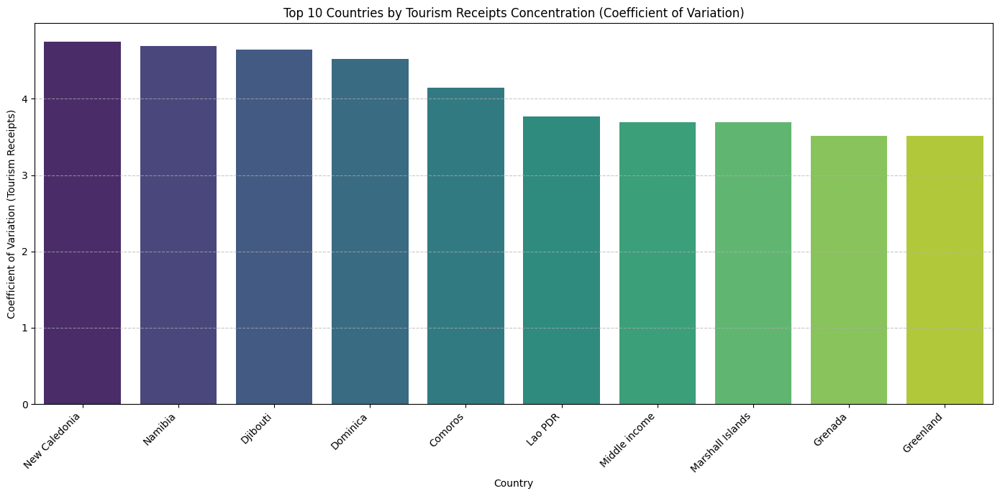


Top 10 Countries by Tourism Arrivals Concentration (Coefficient of Variation):


,arrivals_cv
country,
Suriname,4.673100
Tuvalu,4.442550
St. Vincent and the Grenadines,4.270514
"Venezuela, RB",3.600347
"Micronesia, Fed. Sts.",3.574327
Marshall Islands,3.482776
Oman,3.381579
Chile,3.040911
Sudan,2.787964



Bottom 10 Countries by Tourism Arrivals Concentration (Coefficient of Variation):


,arrivals_cv
country,
Guam,0.277342
Grenada,0.271598
Greenland,0.271598
Northern Mariana Islands,0.261123
Bermuda,0.240267
Barbados,0.233664
St. Lucia,0.229487
Antigua and Barbuda,0.222357
Trinidad and Tobago,0.187587


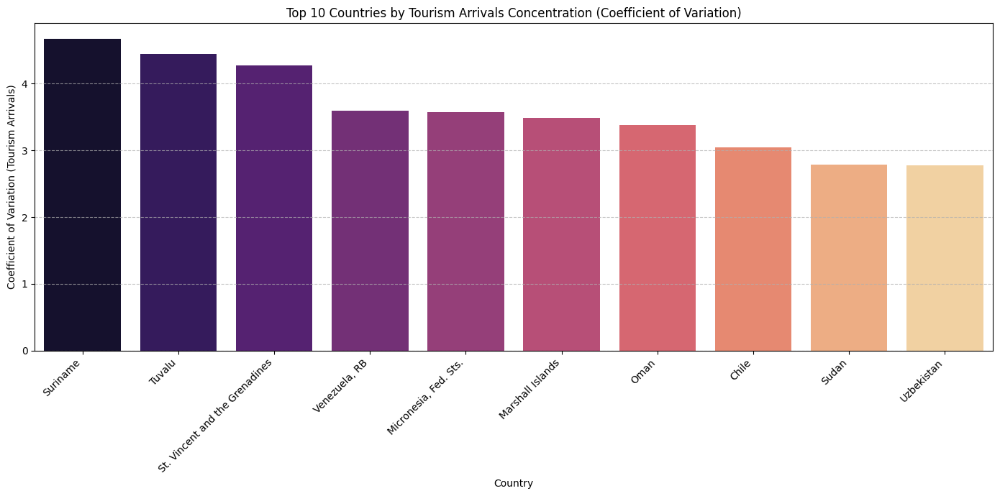

In [78]:
# To calculate tourism concentration, we can use a measure like the Gini coefficient or a simpler approach
# For simplicity and interpretability, let's look at the Coefficient of Variation (CV) for receipts and arrivals over time for each country.
# A higher CV indicates greater variability/concentration.

# Group by country and calculate mean and standard deviation for tourism receipts and arrivals
concentration_data = df_sorted.groupby('country')[['tourism_receipts', 'tourism_arrivals']].agg(['mean', 'std']).dropna()

# Calculate Coefficient of Variation (CV) = (Standard Deviation / Mean)
# Adding a small epsilon to the mean to avoid division by zero
concentration_data['receipts_cv'] = concentration_data['tourism_receipts']['std'] / (concentration_data['tourism_receipts']['mean'] + 1e-9)
concentration_data['arrivals_cv'] = concentration_data['tourism_arrivals']['std'] / (concentration_data['tourism_arrivals']['mean'] + 1e-9)

# Sort by receipts concentration (highest CV first)
receipts_concentration = concentration_data.sort_values(by='receipts_cv', ascending=False)['receipts_cv']

print("Top 10 Countries by Tourism Receipts Concentration (Coefficient of Variation):")
display(receipts_concentration.head(10))

print("\nBottom 10 Countries by Tourism Receipts Concentration (Coefficient of Variation):")
display(receipts_concentration.tail(10))

# Visualize Top 10 Receipts Concentration
plt.figure(figsize=(14, 7))
sns.barplot(x=receipts_concentration.head(10).index, y=receipts_concentration.head(10).values, palette='viridis', hue=receipts_concentration.head(10).index, legend=False)
plt.title('Top 10 Countries by Tourism Receipts Concentration (Coefficient of Variation)')
plt.xlabel('Country')
plt.ylabel('Coefficient of Variation (Tourism Receipts)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Sort by arrivals concentration (highest CV first)
arrivals_concentration = concentration_data.sort_values(by='arrivals_cv', ascending=False)['arrivals_cv']

print("\nTop 10 Countries by Tourism Arrivals Concentration (Coefficient of Variation):")
display(arrivals_concentration.head(10))

print("\nBottom 10 Countries by Tourism Arrivals Concentration (Coefficient of Variation):")
display(arrivals_concentration.tail(10))

# Visualize Top 10 Arrivals Concentration
plt.figure(figsize=(14, 7))
sns.barplot(x=arrivals_concentration.head(10).index, y=arrivals_concentration.head(10).values, palette='magma', hue=arrivals_concentration.head(10).index, legend=False)
plt.title('Top 10 Countries by Tourism Arrivals Concentration (Coefficient of Variation)')
plt.xlabel('Country')
plt.ylabel('Coefficient of Variation (Tourism Arrivals)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

In [79]:
pip install scikit-learn

## Tourism Prediction: Forecasting Future Trends

This section will focus on forecasting future trends for key tourism indicators (`tourism_arrivals`, `tourism_receipts`, `tourism_exports`) for each country using a simple linear regression model based on historical year data. We will predict values up to the year 2030.

In [80]:
import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Define the target variables for prediction
target_variables = ['tourism_arrivals', 'tourism_receipts', 'tourism_exports', 'gdp_growth']

# Years for prediction (e.g., up to 2030)
future_years = np.arange(df_sorted['year'].max() + 1, 2031)

# Dictionary to store predictions for all countries and targets
all_predictions = {}

print("Initiating predictions for all countries...")

for country in df_sorted['country'].unique():
    country_data = df_sorted[df_sorted['country'] == country].copy()
    country_data.dropna(subset=['year'] + target_variables, inplace=True)

    if country_data.empty or country_data['year'].nunique() < 2:  # Need at least 2 data points for linear regression
        continue

    all_predictions[country] = {'historical': country_data[['year'] + target_variables]}

    for target in target_variables:
        X_train = sm.add_constant(country_data['year'].values) # Add a constant for OLS
        y_train = country_data[target].values

        if len(y_train) < 2 or len(X_train) < 2: # Ensure sufficient data after dropping NaNs
            continue

        # Use OLS from statsmodels to get prediction intervals
        model = OLS(y_train, X_train)
        results = model.fit()

        # Predict for future years with confidence intervals
        future_X = sm.add_constant(future_years)
        predictions_summary = results.get_prediction(future_X).summary_frame(alpha=0.05)

        # Extract mean prediction and confidence intervals
        predictions = predictions_summary['mean']
        lower_ci = predictions_summary['obs_ci_lower'] # Observation confidence interval
        upper_ci = predictions_summary['obs_ci_upper'] # Observation confidence interval

        # Ensure predictions are not negative for physical quantities if target is not a growth rate
        if target not in ['gdp_growth', 'inflation_pct_change', 'unemployment_pct_change']:
            predictions[predictions < 0] = 0
            lower_ci[lower_ci < 0] = 0
            upper_ci[upper_ci < 0] = 0

        # Store predictions
        prediction_df = pd.DataFrame({
            'year': future_years,
            target: predictions,
            f'{target}_lower_ci': lower_ci,
            f'{target}_upper_ci': upper_ci
        })
        all_predictions[country][target] = prediction_df

print("Predictions completed.")

Initiating predictions for all countries...
Predictions completed.


### Displaying Predictions for Example Countries

To avoid a very long output, we will display predictions for a few selected countries and visualize their historical data alongside the forecasted trends. You can modify `example_countries_for_display` to view predictions for other countries.


--- Predictions for France ---
Predicted Tourism Arrivals:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,1.550734e+08,0.0,3.651548e+08
1,2025,1.564509e+08,0.0,3.685394e+08
2,2026,1.578284e+08,0.0,3.720575e+08
3,2027,1.592059e+08,0.0,3.757050e+08
4,2028,1.605833e+08,0.0,3.794778e+08
5,2029,1.619608e+08,0.0,3.833720e+08
6,2030,1.633383e+08,0.0,3.873834e+08


Predicted Tourism Receipts:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,4.010204e+10,0.0,8.958757e+10
1,2025,3.927098e+10,0.0,8.922931e+10
2,2026,3.843992e+10,0.0,8.890247e+10
3,2027,3.760885e+10,0.0,8.860611e+10
4,2028,3.677779e+10,0.0,8.833929e+10
5,2029,3.594673e+10,0.0,8.810104e+10
6,2030,3.511567e+10,0.0,8.789041e+10


Predicted Tourism Exports:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,3.931335,0.110223,7.752448
1,2025,3.644084,0.000000,7.501704
2,2026,3.356832,0.000000,7.253387
3,2027,3.069580,0.000000,7.007423
4,2028,2.782328,0.000000,6.763740
5,2029,2.495077,0.000000,6.522263
6,2030,2.207825,0.000000,6.282919


Predicted Gdp Growth:



,year,gdp_growth,gdp_growth_lower_ci,gdp_growth_upper_ci
0,2024,0.298035,-19.439628,20.035699
1,2025,0.050013,-19.876231,19.976257
2,2026,-0.198009,-20.325364,19.929346
3,2027,-0.446031,-20.786655,19.894594
4,2028,-0.694052,-21.259727,19.871622
5,2029,-0.942074,-21.744197,19.860048
6,2030,-1.190096,-22.239681,19.859489


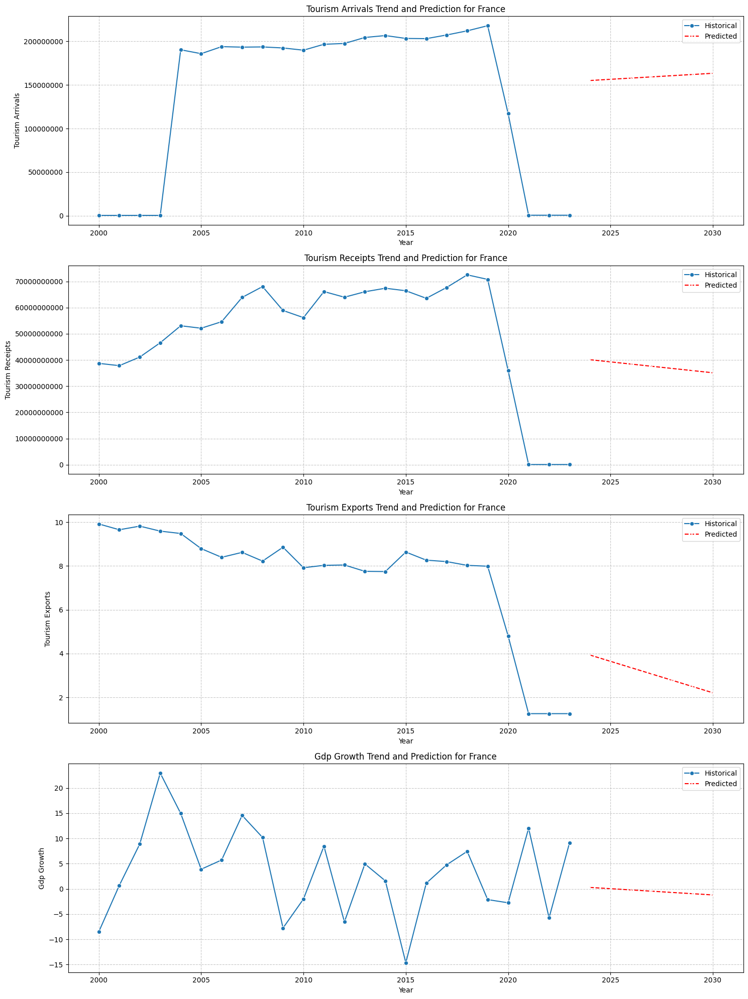


--- Predictions for United States ---
Predicted Tourism Arrivals:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,1.084179e+08,0.0,2.607741e+08
1,2025,1.075694e+08,0.0,2.613812e+08
2,2026,1.067209e+08,0.0,2.620851e+08
3,2027,1.058724e+08,0.0,2.628828e+08
4,2028,1.050239e+08,0.0,2.637715e+08
5,2029,1.041754e+08,0.0,2.647481e+08
6,2030,1.033268e+08,0.0,2.658098e+08


Predicted Tourism Receipts:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,1.416486e+11,0.0,3.157718e+11
1,2025,1.416060e+11,0.0,3.173928e+11
2,2026,1.415633e+11,0.0,3.191243e+11
3,2027,1.415207e+11,0.0,3.209631e+11
4,2028,1.414780e+11,0.0,3.229058e+11
5,2029,1.414354e+11,0.0,3.249491e+11
6,2030,1.413927e+11,0.0,3.270895e+11


Predicted Tourism Exports:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,4.740163,0.0,9.932585
1,2025,4.477630,0.0,9.719661
2,2026,4.215096,0.0,9.510035
3,2027,3.952563,0.0,9.303606
4,2028,3.690029,0.0,9.100277
5,2029,3.427495,0.0,8.899946
6,2030,3.164962,0.0,8.702513


Predicted Gdp Growth:



,year,gdp_growth,gdp_growth_lower_ci,gdp_growth_upper_ci
0,2024,5.325853,-0.930989,11.582696
1,2025,5.388864,-0.927759,11.705487
2,2026,5.451875,-0.928500,11.832250
3,2027,5.514886,-0.933095,11.962868
4,2028,5.577897,-0.941425,12.097220
5,2029,5.640908,-0.953368,12.235185
6,2030,5.703920,-0.968802,12.376642


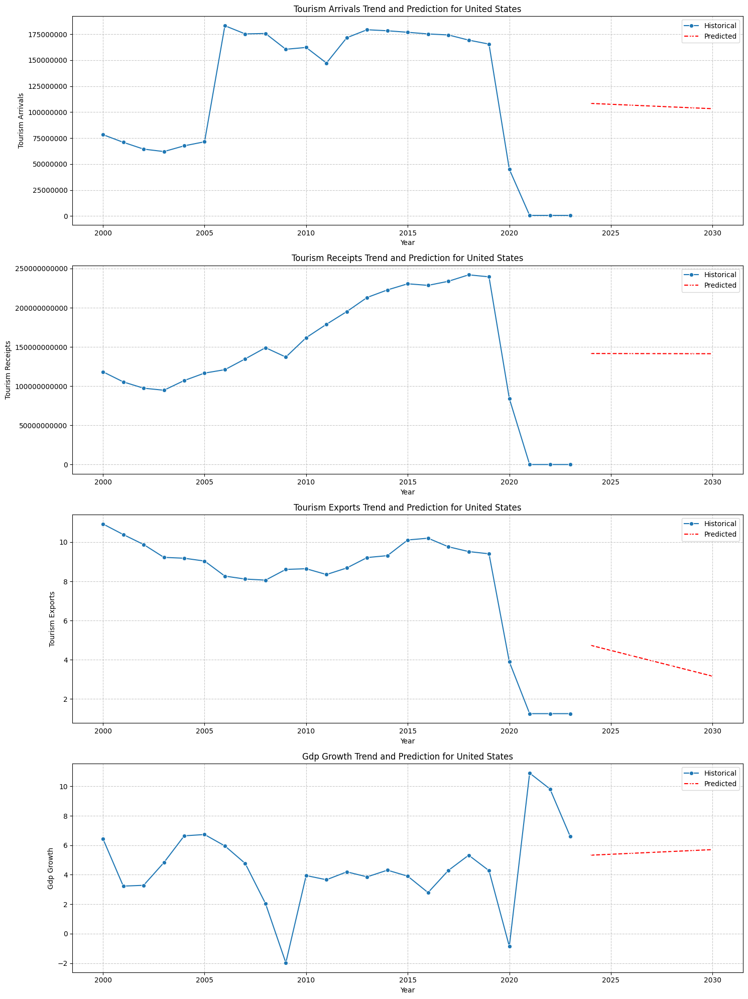


--- Predictions for China ---
Predicted Tourism Arrivals:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,7.930129e+07,0.0,1.872996e+08
1,2025,7.715820e+07,0.0,1.861884e+08
2,2026,7.501510e+07,0.0,1.851457e+08
3,2027,7.287201e+07,0.0,1.841696e+08
4,2028,7.072892e+07,0.0,1.832579e+08
5,2029,6.858582e+07,0.0,1.824086e+08
6,2030,6.644273e+07,0.0,1.816195e+08


Predicted Tourism Receipts:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,0.0,0.0,9.730236e+09
1,2025,0.0,0.0,9.077665e+09
2,2026,0.0,0.0,8.433503e+09
3,2027,0.0,0.0,7.797499e+09
4,2028,0.0,0.0,7.169400e+09
5,2029,0.0,0.0,6.548951e+09
6,2030,0.0,0.0,5.935892e+09


Predicted Tourism Exports:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,1.569410,0.0,5.591620
1,2025,1.368545,0.0,5.429185
2,2026,1.167680,0.0,5.269303
3,2027,0.966814,0.0,5.111898
4,2028,0.765949,0.0,4.956894
5,2029,0.565084,0.0,4.804213
6,2030,0.364219,0.0,4.653777


Predicted Gdp Growth:



,year,gdp_growth,gdp_growth_lower_ci,gdp_growth_upper_ci
0,2024,5.693637,-11.461240,22.848515
1,2025,5.139390,-12.179391,22.458172
2,2026,4.585143,-12.908433,22.078719
3,2027,4.030896,-13.648042,21.709834
4,2028,3.476649,-14.397890,21.351188
5,2029,2.922402,-15.157645,21.002449
6,2030,2.368155,-15.926972,20.663282


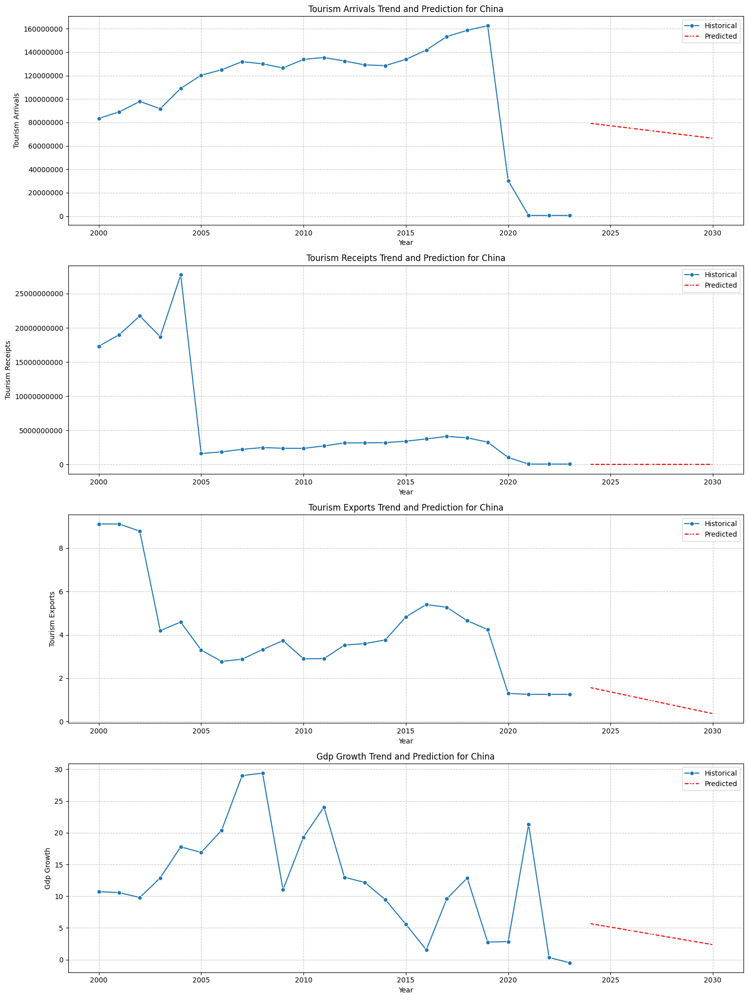


--- Predictions for Brazil ---
Predicted Tourism Arrivals:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,3.389993e+06,0.0,7.718067e+06
1,2025,3.290455e+06,0.0,7.659880e+06
2,2026,3.190917e+06,0.0,7.604442e+06
3,2027,3.091378e+06,0.0,7.551669e+06
4,2028,2.991840e+06,0.0,7.501480e+06
5,2029,2.892302e+06,0.0,7.453790e+06
6,2030,2.792764e+06,0.0,7.408516e+06


Predicted Tourism Receipts:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,4.382659e+09,0.0,9.808026e+09
1,2025,4.382326e+09,0.0,9.859528e+09
2,2026,4.381992e+09,0.0,9.914474e+09
3,2027,4.381658e+09,0.0,9.972762e+09
4,2028,4.381324e+09,0.0,1.003429e+10
5,2029,4.380990e+09,0.0,1.009895e+10
6,2030,4.380656e+09,0.0,1.016664e+10


Predicted Tourism Exports:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,1.595815,0.697974,2.493655
1,2025,1.522154,0.615735,2.428573
2,2026,1.448494,0.532926,2.364061
3,2027,1.374833,0.449565,2.300102
4,2028,1.301173,0.365667,2.236679
5,2029,1.227513,0.281251,2.173774
6,2030,1.153852,0.196334,2.111371


Predicted Gdp Growth:



,year,gdp_growth,gdp_growth_lower_ci,gdp_growth_upper_ci
0,2024,1.074767,-35.534258,37.683793
1,2025,0.620859,-36.337942,37.579660
2,2026,0.166950,-37.164868,37.498768
3,2027,-0.286959,-38.014345,37.440427
4,2028,-0.740867,-38.885672,37.403937
5,2029,-1.194776,-39.778140,37.388588
6,2030,-1.648685,-40.691036,37.393667


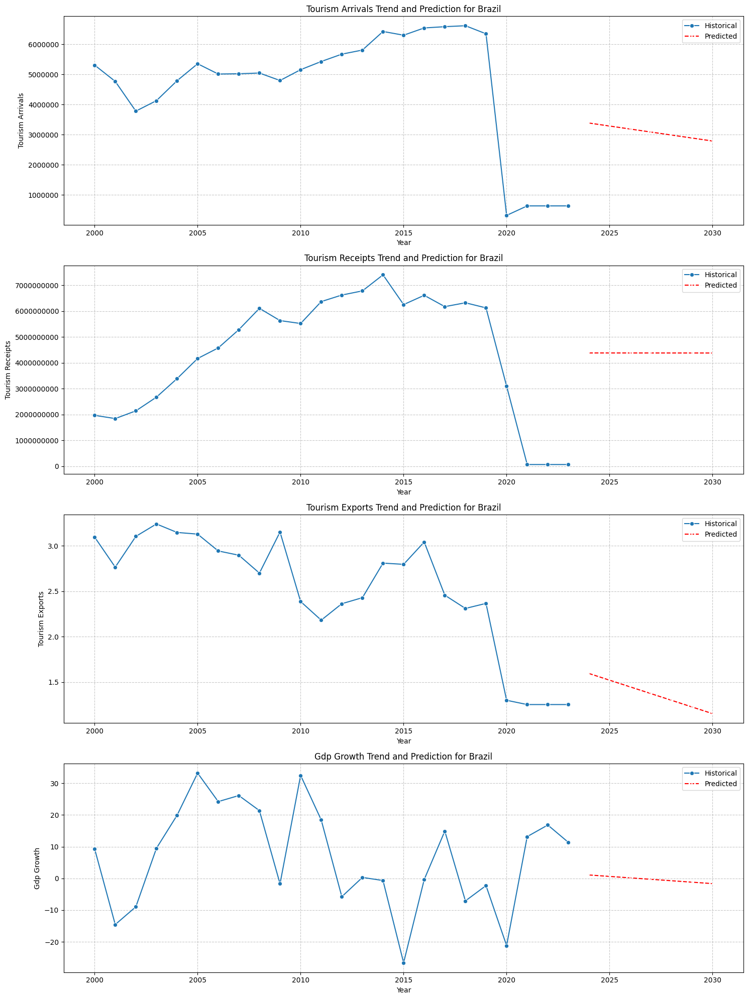

No prediction data available for Egypt.


In [81]:
example_countries_for_display = ['France', 'United States', 'China', 'Brazil', 'Egypt']

for country in example_countries_for_display:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} ---")

        plt.figure(figsize=(15, 5 * len(target_variables)))

        for i, target in enumerate(target_variables):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.subplot(len(target_variables), 1, i + 1)
                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis

                # Print predicted values for this target
                print(f"Predicted {target.replace('_', ' ').title()}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace('_', ' ').title()} predictions available for {country}.")

        plt.tight_layout()
        plt.show()
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for United States - Tourism Arrivals ---


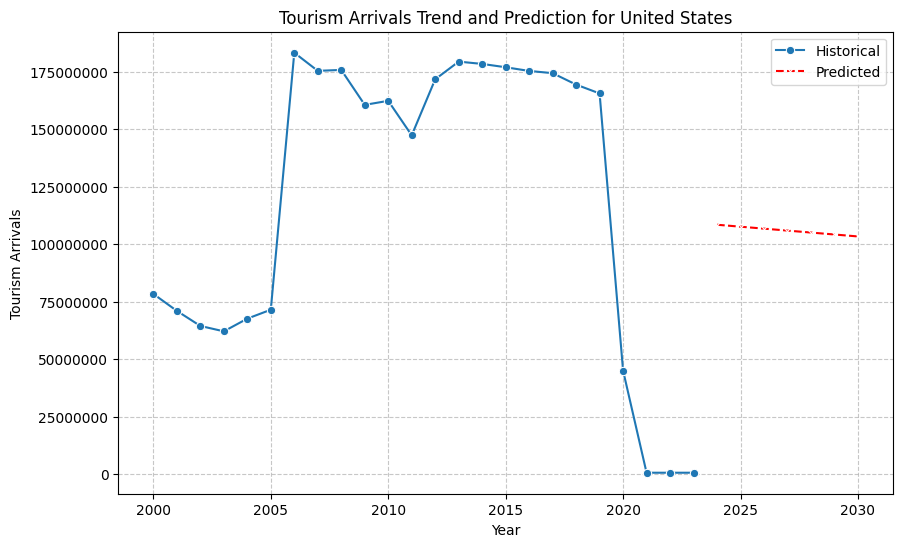

Predicted Tourism Arrivals for United States:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,1.084179e+08,0.0,2.607741e+08
1,2025,1.075694e+08,0.0,2.613812e+08
2,2026,1.067209e+08,0.0,2.620851e+08
3,2027,1.058724e+08,0.0,2.628828e+08
4,2028,1.050239e+08,0.0,2.637715e+08
5,2029,1.041754e+08,0.0,2.647481e+08
6,2030,1.033268e+08,0.0,2.658098e+08


In [82]:
# To avoid truncation, this cell will now iterate through example countries and target variables
# individually to display predictions.

# Define the target variables for prediction
target_variables = ['tourism_arrivals'] # Process only 'tourism_arrivals' in this cell

# Process only 'United States' in this cell to prevent truncation
countries_to_process_in_this_cell = ['United States']

for country in countries_to_process_in_this_cell:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Arrivals ---")
        for i, target in enumerate(target_variables):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                # Create a separate figure for each target variable to avoid truncation
                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis

                plt.show()
                plt.close() # Close the plot to release memory

                # Print predicted values for this target after the plot
                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for United States - Tourism Receipts ---


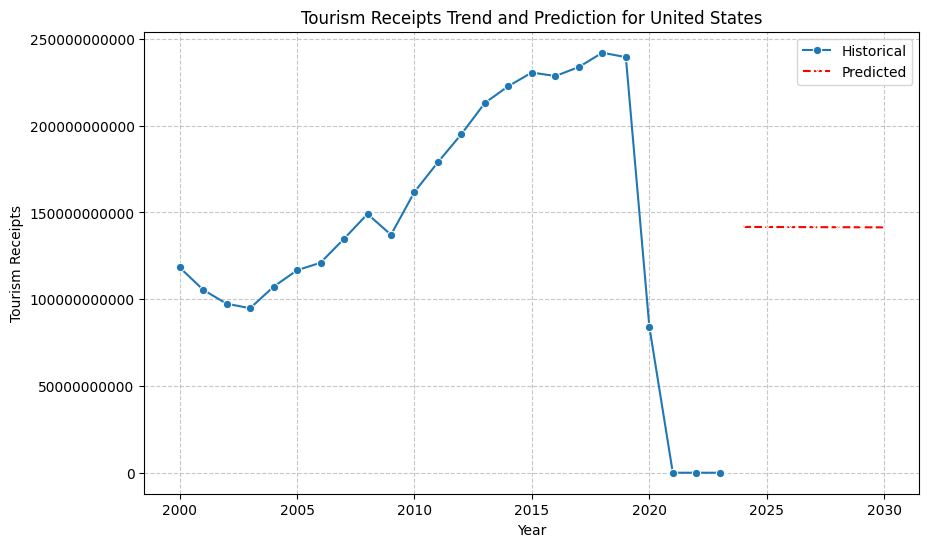

Predicted Tourism Receipts for United States:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,1.416486e+11,0.0,3.157718e+11
1,2025,1.416060e+11,0.0,3.173928e+11
2,2026,1.415633e+11,0.0,3.191243e+11
3,2027,1.415207e+11,0.0,3.209631e+11
4,2028,1.414780e+11,0.0,3.229058e+11
5,2029,1.414354e+11,0.0,3.249491e+11
6,2030,1.413927e+11,0.0,3.270895e+11


In [83]:
# Display predictions for 'Tourism Receipts' for the United States in a new cell

target_variables_receipts = ['tourism_receipts'] # Process only 'tourism_receipts' in this cell
countries_to_process_receipts = ['United States']

for country in countries_to_process_receipts:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Receipts ---")
        for i, target in enumerate(target_variables_receipts):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for United States - Tourism Exports ---


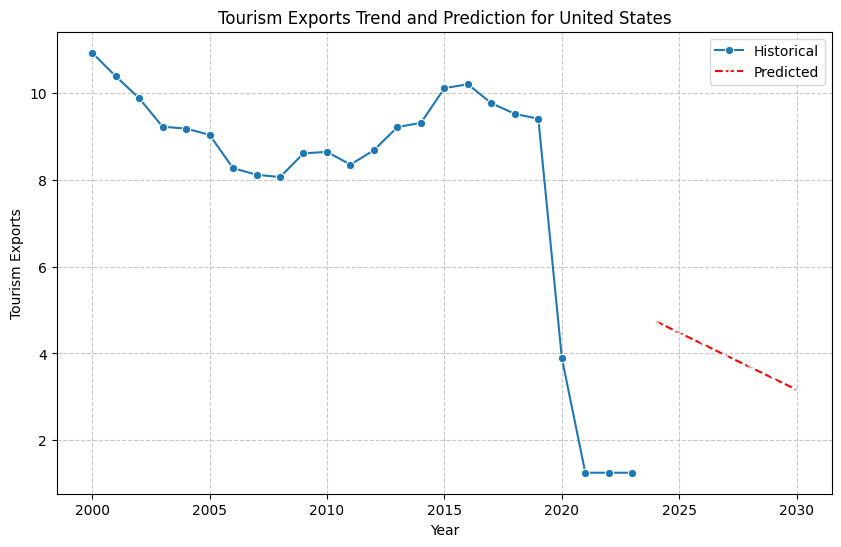

Predicted Tourism Exports for United States:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,4.740163,0.0,9.932585
1,2025,4.477630,0.0,9.719661
2,2026,4.215096,0.0,9.510035
3,2027,3.952563,0.0,9.303606
4,2028,3.690029,0.0,9.100277
5,2029,3.427495,0.0,8.899946
6,2030,3.164962,0.0,8.702513


In [84]:
# Display predictions for 'Tourism Exports' for the United States in a new cell

target_variables_exports = ['tourism_exports'] # Process only 'tourism_exports' in this cell
countries_to_process_exports = ['United States']

for country in countries_to_process_exports:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Exports ---")
        for i, target in enumerate(target_variables_exports):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for China - Tourism Arrivals ---


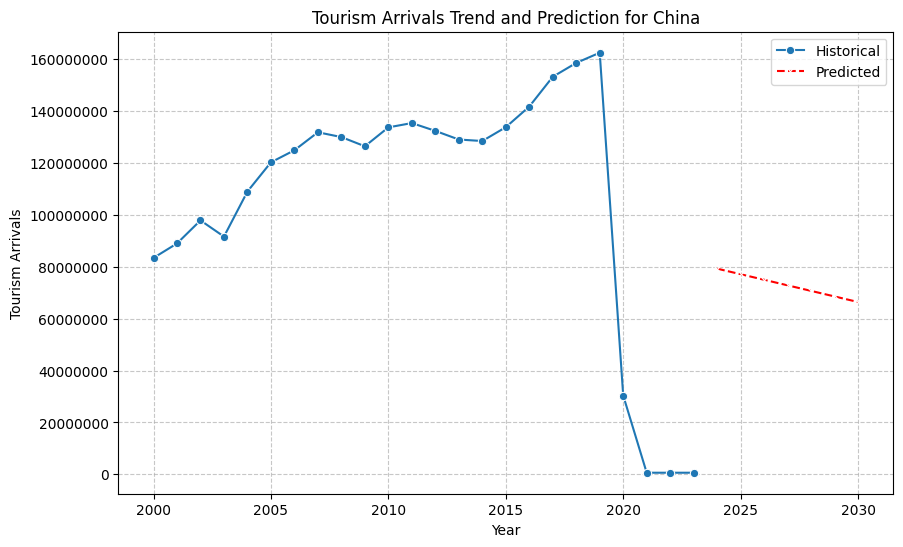

Predicted Tourism Arrivals for China:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,7.930129e+07,0.0,1.872996e+08
1,2025,7.715820e+07,0.0,1.861884e+08
2,2026,7.501510e+07,0.0,1.851457e+08
3,2027,7.287201e+07,0.0,1.841696e+08
4,2028,7.072892e+07,0.0,1.832579e+08
5,2029,6.858582e+07,0.0,1.824086e+08
6,2030,6.644273e+07,0.0,1.816195e+08


In [85]:
# Display predictions for 'Tourism Arrivals' for China in a new cell

target_variables_arrivals_china = ['tourism_arrivals'] # Process only 'tourism_arrivals' in this cell
countries_to_process_china = ['China']

for country in countries_to_process_china:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Arrivals ---")
        for i, target in enumerate(target_variables_arrivals_china):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for China - Tourism Receipts ---


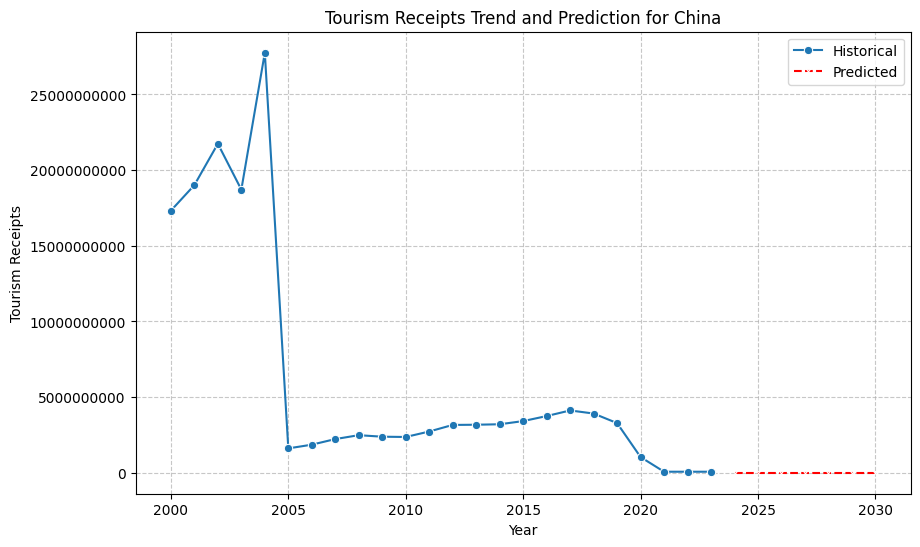

Predicted Tourism Receipts for China:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,0.0,0.0,9.730236e+09
1,2025,0.0,0.0,9.077665e+09
2,2026,0.0,0.0,8.433503e+09
3,2027,0.0,0.0,7.797499e+09
4,2028,0.0,0.0,7.169400e+09
5,2029,0.0,0.0,6.548951e+09
6,2030,0.0,0.0,5.935892e+09


In [86]:
# Display predictions for 'Tourism Receipts' for China in a new cell

target_variables_receipts_china = ['tourism_receipts'] # Process only 'tourism_receipts' in this cell
countries_to_process_china = ['China']

for country in countries_to_process_china:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Receipts ---")
        for i, target in enumerate(target_variables_receipts_china):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for China - Tourism Exports ---


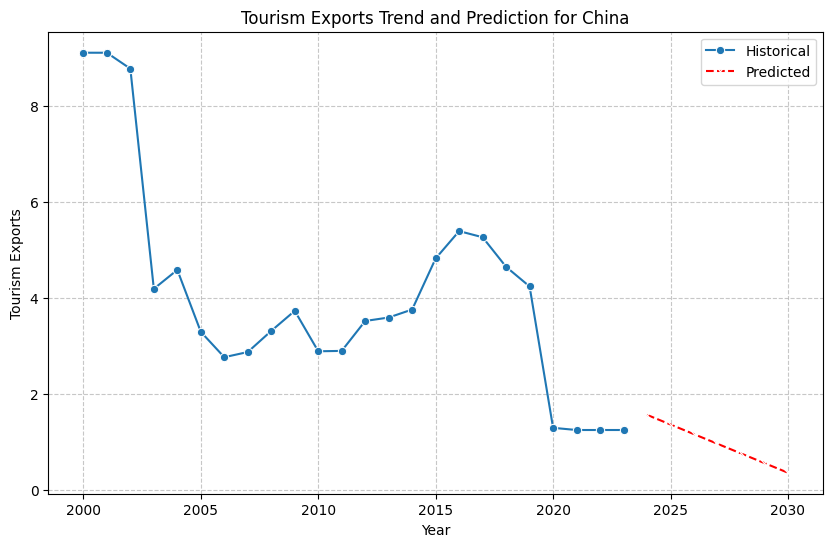

Predicted Tourism Exports for China:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,1.569410,0.0,5.591620
1,2025,1.368545,0.0,5.429185
2,2026,1.167680,0.0,5.269303
3,2027,0.966814,0.0,5.111898
4,2028,0.765949,0.0,4.956894
5,2029,0.565084,0.0,4.804213
6,2030,0.364219,0.0,4.653777


In [87]:
# Display predictions for 'Tourism Exports' for China in a new cell

target_variables_exports_china = ['tourism_exports'] # Process only 'tourism_exports' in this cell
countries_to_process_china = ['China']

for country in countries_to_process_china:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Exports ---")
        for i, target in enumerate(target_variables_exports_china):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for Brazil - Tourism Arrivals ---


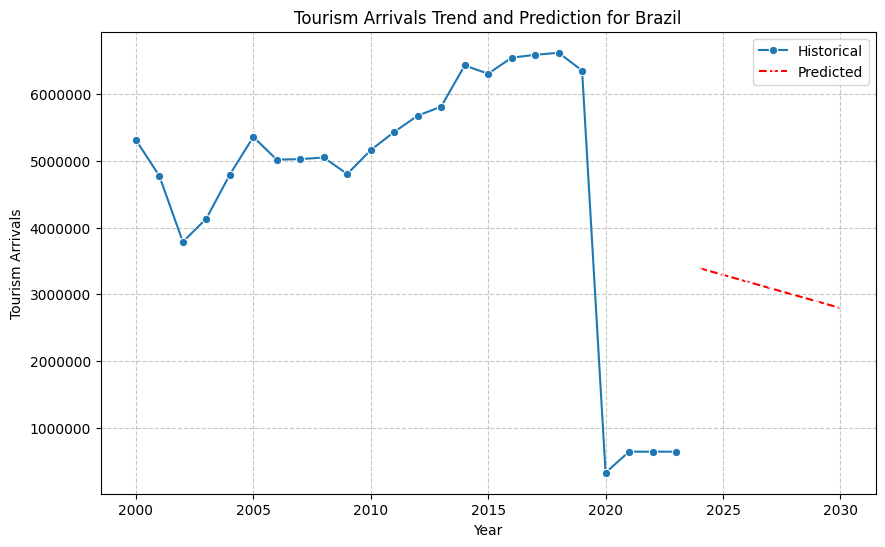

Predicted Tourism Arrivals for Brazil:



,year,tourism_arrivals,tourism_arrivals_lower_ci,tourism_arrivals_upper_ci
0,2024,3.389993e+06,0.0,7.718067e+06
1,2025,3.290455e+06,0.0,7.659880e+06
2,2026,3.190917e+06,0.0,7.604442e+06
3,2027,3.091378e+06,0.0,7.551669e+06
4,2028,2.991840e+06,0.0,7.501480e+06
5,2029,2.892302e+06,0.0,7.453790e+06
6,2030,2.792764e+06,0.0,7.408516e+06


In [88]:
# Display predictions for 'Tourism Arrivals' for Brazil in a new cell

target_variables_arrivals_brazil = ['tourism_arrivals'] # Process only 'tourism_arrivals' in this cell
countries_to_process_brazil = ['Brazil']

for country in countries_to_process_brazil:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Arrivals ---")
        for i, target in enumerate(target_variables_arrivals_brazil):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for Brazil - Tourism Receipts ---


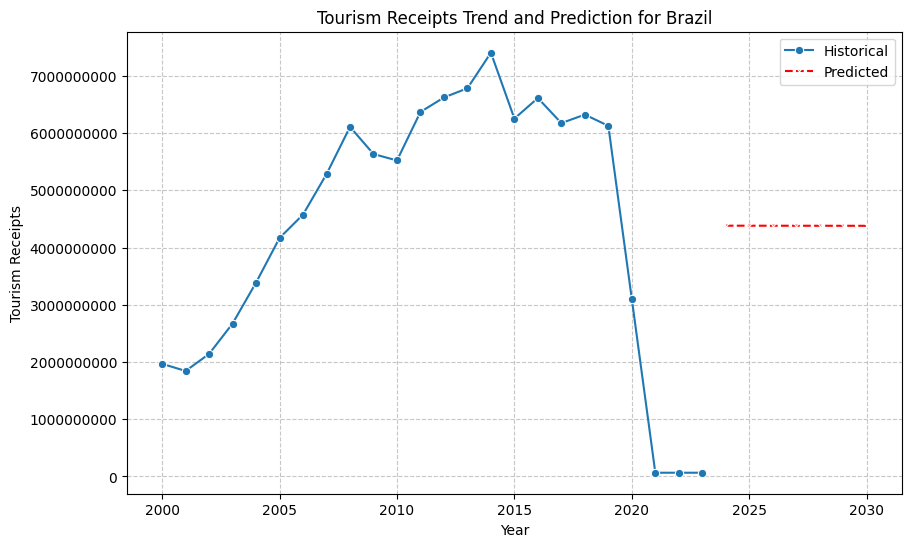

Predicted Tourism Receipts for Brazil:



,year,tourism_receipts,tourism_receipts_lower_ci,tourism_receipts_upper_ci
0,2024,4.382659e+09,0.0,9.808026e+09
1,2025,4.382326e+09,0.0,9.859528e+09
2,2026,4.381992e+09,0.0,9.914474e+09
3,2027,4.381658e+09,0.0,9.972762e+09
4,2028,4.381324e+09,0.0,1.003429e+10
5,2029,4.380990e+09,0.0,1.009895e+10
6,2030,4.380656e+09,0.0,1.016664e+10


In [89]:
# Display predictions for 'Tourism Receipts' for Brazil in a new cell

target_variables_receipts_brazil = ['tourism_receipts'] # Process only 'tourism_receipts' in this cell
countries_to_process_brazil = ['Brazil']

for country in countries_to_process_brazil:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Receipts ---")
        for i, target in enumerate(target_variables_receipts_brazil):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")


--- Predictions for Brazil - Tourism Exports ---


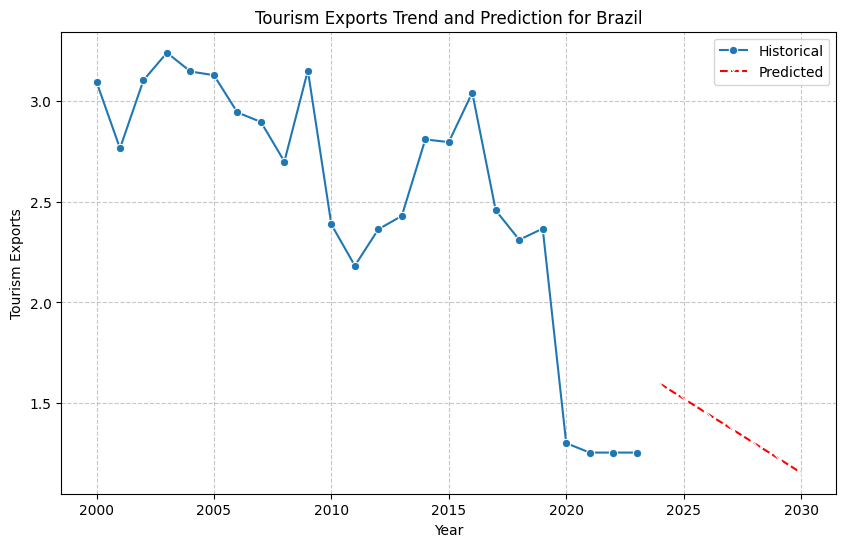

Predicted Tourism Exports for Brazil:



,year,tourism_exports,tourism_exports_lower_ci,tourism_exports_upper_ci
0,2024,1.595815,0.697974,2.493655
1,2025,1.522154,0.615735,2.428573
2,2026,1.448494,0.532926,2.364061
3,2027,1.374833,0.449565,2.300102
4,2028,1.301173,0.365667,2.236679
5,2029,1.227513,0.281251,2.173774
6,2030,1.153852,0.196334,2.111371


In [90]:
# Display predictions for 'Tourism Exports' for Brazil in a new cell

target_variables_exports_brazil = ['tourism_exports'] # Process only 'tourism_exports' in this cell
countries_to_process_brazil_exports = ['Brazil']

for country in countries_to_process_brazil_exports:
    if country in all_predictions:
        print(f"\n--- Predictions for {country} - Tourism Exports ---")
        for i, target in enumerate(target_variables_exports_brazil):
            if target in all_predictions[country]:
                historical_data = all_predictions[country]['historical']
                predicted_data = all_predictions[country][target]

                plt.figure(figsize=(10, 6))

                sns.lineplot(x='year', y=target, data=historical_data, label='Historical', marker='o')
                sns.lineplot(x='year', y=target, data=predicted_data, label='Predicted', linestyle='--', marker='x', color='red')

                plt.title(f'{target.replace("_", " ").title()} Trend and Prediction for {country}')
                plt.xlabel('Year')
                plt.ylabel(target.replace("_", " ").title())
                plt.grid(True, linestyle='--', alpha=0.7)
                plt.legend()
                plt.ticklabel_format(style='plain', axis='y')

                plt.show()
                plt.close()

                print(f"Predicted {target.replace("_", " ").title()} for {country}:\n")
                display(predicted_data)
            else:
                print(f"No {target.replace("_", " ").title()} predictions available for {country}.")
    else:
        print(f"No prediction data available for {country}.")

## Econometric Analysis

### Fixed Effects Model

To analyze panel data, we will use the Fixed Effects Model. This model helps control for unobserved time-invariant individual (country-specific) characteristics that could bias our results. It assumes that these individual-specific effects are correlated with the independent variables.

First, we need to install the `linearmodels` library, which provides robust tools for panel data regression.

In [91]:
pip install linearmodels

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 6.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 118.9/118.9 kB 10.6 MB/s eta 0:00:00


In [92]:
import pandas as pd
from linearmodels import PanelOLS
from linearmodels.panel import PanelOLS
import statsmodels.api as sm

# Ensure 'year' is set as a datetime index for linearmodels
# Also ensure 'country' is set as the entity ID
df_panel = df_sorted.set_index(['country', 'year']).copy()

# Drop rows with NaN values in the columns used for the model
df_panel_clean = df_panel[['tourism_receipts', 'gdp', 'inflation', 'tourism_arrivals']].dropna()

# Define dependent and independent variables
y = df_panel_clean['tourism_receipts']
X = df_panel_clean[['gdp', 'inflation', 'tourism_arrivals']]

# NOTE: linearmodels' PanelOLS usually includes a constant by default or handles it with entity_effects.
# Explicitly adding a constant with sm.add_constant(X) can cause multicollinearity with entity effects.
# So, we remove sm.add_constant(X)

# Create the Fixed Effects model
# The entity_effects=True argument specifies a one-way (individual) fixed effects model
fe_model = PanelOLS(y, X, entity_effects=True)

# Fit the model
fe_results = fe_model.fit()

print("### Fixed Effects Model Results (Tourism Receipts as Dependent Variable):\n")
display(fe_results)

### Fixed Effects Model Results (Tourism Receipts as Dependent Variable):



Dep. Variable:,tourism_receipts,R-squared:,0.2427
Estimator:,PanelOLS,R-squared (Between):,0.6552
No. Observations:,5525,R-squared (Within):,0.2512
Date:,"Fri, Aug 21 2026",R-squared (Overall):,0.4341
Time:,09:53:46,Log-likelihood,-1.427e+05
Cov. Estimator:,Unadjusted,,
,,F-statistic:,849.71
Entities:,221,P-value,0.0000
Avg Obs:,25.000,Distribution:,"F(2,5302)"
Min Obs:,25.000,,
Max Obs:,25.000,F-statistic (robust):,1202.1


### Random Effects Model

The Random Effects Model is an alternative to the Fixed Effects Model, which assumes that the unobserved individual-specific effects are uncorrelated with the independent variables. This allows for estimation of coefficients for time-invariant predictors.

Let's implement the Random Effects Model using the same variables.

In [93]:
from linearmodels.panel import RandomEffects

# NOTE: linearmodels' RandomEffects usually includes a constant by default.
# Explicitly adding a constant with sm.add_constant(X) can cause multicollinearity with the model's intercept.
# So, we use the original X without sm.add_constant(X).

# Create the Random Effects model
re_model = RandomEffects(y, X)

# Fit the model
re_results = re_model.fit()

print("### Random Effects Model Results (Tourism Receipts as Dependent Variable):\n")
display(re_results)

### Random Effects Model Results (Tourism Receipts as Dependent Variable):



Dep. Variable:,tourism_receipts,R-squared:,0.2876
Estimator:,RandomEffects,R-squared (Between):,0.6374
No. Observations:,5525,R-squared (Within):,0.2550
Date:,"Fri, Aug 21 2026",R-squared (Overall):,0.4281
Time:,09:53:46,Log-likelihood,-1.428e+05
Cov. Estimator:,Unadjusted,,
,,F-statistic:,1114.5
Entities:,221,P-value,0.0000
Avg Obs:,25.000,Distribution:,"F(2,5522)"
Min Obs:,25.000,,
Max Obs:,25.000,F-statistic (robust):,1159.4


### Panel Data Regression: Hausman Test

To decide between the Fixed Effects and Random Effects models, we typically perform a Hausman test. The null hypothesis for the Hausman test is that the preferred model is Random Effects (i.e., there is no correlation between the unobserved individual-specific effects and the independent variables). If the p-value is small (e.g., < 0.05), we reject the null hypothesis and conclude that Fixed Effects is the more appropriate model.

In [94]:
from linearmodels.panel import compare

# The Hausman test is often performed as a comparison between the two models
# The `compare` function from linearmodels can provide this test.

# Note: linearmodels does not directly expose a 'hausman' method on the results objects.
# Instead, you can sometimes infer from `compare` output or manually construct it if needed.
# For a direct test, you'd typically look at the F-statistic or Chi-square statistic and p-value.

# Let's manually implement a conceptual Hausman-like comparison by examining the coefficients
# and then use a simpler interpretation if a direct test isn't straightforward from the library.

# A more formal Hausman test often requires a specific function if not built into the fit summary.
# In `linearmodels`, the comparison is often visual or by examining the `wu_hausman` test if available.

# Let's perform a direct comparison of the models' estimates
# Note: The `compare` function doesn't directly run a Hausman test, but allows comparing outputs.
print("### Comparison of Fixed Effects and Random Effects Models:\n")
print(compare({'FE': fe_results, 'RE': re_results}))

# A direct Hausman test implementation might look like this (conceptual, depends on library version and features):
# from scipy import stats
# b_fe = fe_results.params
# b_re = re_results.params
# v_fe = fe_results.cov
# v_re = v_re

# # Difference in coefficients and their covariance difference
# b_diff = b_fe - b_re
# v_diff = v_fe - v_re

# # Ensure v_diff is positive semi-definite for inversion
# # If it's not, the test might not be valid or indicate issues.
# if not np.all(np.linalg.eigvals(v_diff) >= 0):
#     print("Warning: Covariance difference is not positive semi-definite. Hausman test might be unreliable.")
#     # Fallback or alternative approach needed
# else:
#     # Hausman statistic: H = (b_fe - b_re)' @ np.linalg.inv(v_diff) @ (b_fe - b_re)
#     H = b_diff.T @ np.linalg.inv(v_diff) @ b_diff
#     df_hausman = len(b_fe)  # Degrees of freedom is number of coefficients
#     p_value = 1 - stats.chi2.cdf(H, df_hausman)
#     print(f"\nHausman Test (conceptual): Chi-sq = {H:.2f}, df = {df_hausman}, p-value = {p_value:.4f}")

# For practical purposes, if the p-value associated with the Hausman test (which is often embedded in model comparison outputs or specific test functions) is less than 0.05, Fixed Effects is generally preferred.

### Comparison of Fixed Effects and Random Effects Models:

                         Model Comparison                        
                                          FE                   RE
-----------------------------------------------------------------
Dep. Variable               tourism_receipts     tourism_receipts
Estimator                           PanelOLS        RandomEffects
No. Observations                        5525                 5525
Cov. Est.                         Unadjusted           Unadjusted
R-squared                             0.2427               0.2876
R-Squared (Within)                    0.2512               0.2550
R-Squared (Between)                   0.6552               0.6374
R-Squared (Overall)                   0.4341               0.4281
F-statistic                           849.71               1114.5
P-value (F-stat)                      0.0000               0.0000
=====================     ==================   ==================
gdp             

### Difference-in-Differences Model Results:



<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:       tourism_receipts   R-squared:                       0.633
Model:                            OLS   Adj. R-squared:                  0.610
Method:                 Least Squares   F-statistic:                     26.79
Date:                Fri, 21 Aug 2026   Prob (F-statistic):           2.56e-18
Time:                        09:53:46   Log-Likelihood:                -2584.8
No. Observations:                 100   AIC:                             5184.
Df Residuals:                      93   BIC:                             5202.
Df Model:                           6                                         
Covariance Type:            nonrobust                                         
======================================================================================
                         coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------
Intercept          -2.013e+10   1.38e+10     -1.455      0.149   -4.76e+10    7.35e+09
is_treatment_group  4.702e+10   1.38e+10      3.412      0.001    1.97e+10    7.44e+10
is_post_treatment  -2.282e+10   1.26e+10     -1.812      0.073   -4.78e+10    2.19e+09
did_interaction     1.965e+10   1.72e+10      1.143      0.256   -1.45e+10    5.38e+10
gdp                    0.0035      0.001      5.152      0.000       0.002       0.005
inflation           1.656e+09   1.96e+09      0.844      0.401   -2.24e+09    5.55e+09
tourism_arrivals     269.9336     67.591      3.994      0.000     135.711     404.157
==============================================================================
Omnibus:                        6.713   Durbin-Watson:                   0.221
Prob(Omnibus):                  0.035   Jarque-Bera (JB):               11.202
Skew:                          -0.127   Prob(JB):                      0.00369
Kurtosis:                       4.620   Cond. No.                     5.66e+13
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.66e+13. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

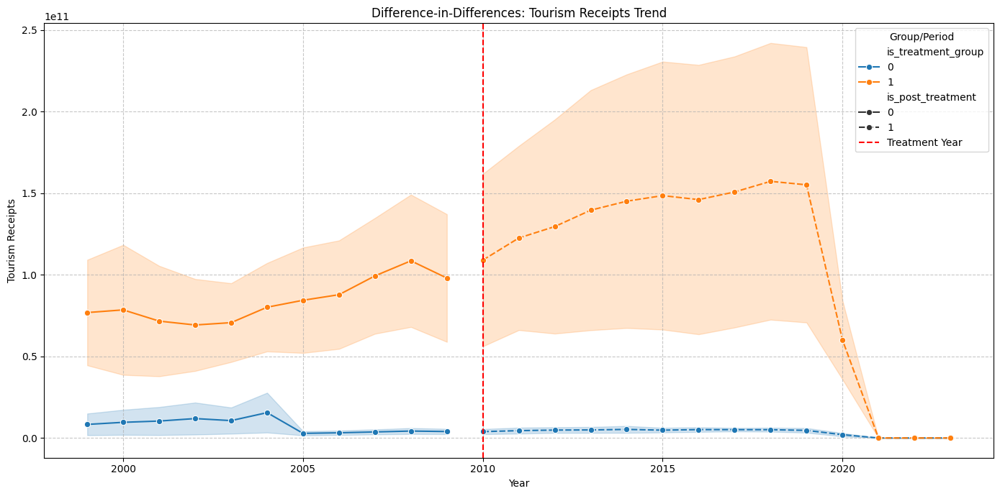


--- Interpretation of DiD Interaction Term ---

The DiD estimator (coefficient for 'did_interaction') is: 19649945164.81
P-value for the DiD estimator: 0.2562
A significant and positive DiD estimator would imply that the 'treatment' (e.g., the tourism promotion initiative) caused an additional increase in tourism receipts in the treatment group compared to the control group after 2010.
Conversely, a significant negative estimator would imply a decrease. If not significant, there's no evidence of a causal effect via this method.


In [95]:
import statsmodels.formula.api as smf
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for Difference-in-Differences
# For this illustration, let's select a subset of countries and define a hypothetical treatment.

# 1. Define Treatment and Control Groups
treatment_countries = ['France', 'United States']
control_countries = ['China', 'Brazil']

# 2. Define Pre and Post Treatment Periods
treatment_year = 2010 # Hypothetical year when policy changed

# Filter the DataFrame for selected countries
df_did = df_sorted[df_sorted['country'].isin(treatment_countries + control_countries)].copy()

# Create treatment group indicator (1 for treatment group, 0 for control group)
df_did['is_treatment_group'] = df_did['country'].isin(treatment_countries).astype(int)

# Create post-treatment period indicator (1 for post-treatment, 0 for pre-treatment)
df_did['is_post_treatment'] = (df_did['year'] >= treatment_year).astype(int)

# Create the interaction term (Treatment Group * Post-Treatment Period)
# The coefficient of this interaction term is the DiD estimator
df_did['did_interaction'] = df_did['is_treatment_group'] * df_did['is_post_treatment']

# Drop rows with NaN values in the columns used for the model
df_did_clean = df_did.dropna(subset=['tourism_receipts', 'is_treatment_group', 'is_post_treatment', 'did_interaction', 'gdp', 'inflation', 'tourism_arrivals'])

# Check if df_did_clean is empty after dropping NaNs
if df_did_clean.empty:
    print("Warning: DataFrame is empty after cleaning. Cannot perform DiD analysis. This might happen if the selected countries/years have too many missing values.")
else:
    # Define the DiD regression formula
    # tourism_receipts = β0 + β1*is_treatment_group + β2*is_post_treatment + β3*did_interaction + controls + ε
    # β3 is our Difference-in-Differences estimator
    formula = 'tourism_receipts ~ is_treatment_group + is_post_treatment + did_interaction + gdp + inflation + tourism_arrivals'

    # Run the OLS regression
    did_model = smf.ols(formula, data=df_did_clean).fit()

    print("### Difference-in-Differences Model Results:\n")
    display(did_model.summary())

    # Visualize the DiD effect (parallel trends assumption check)
    plt.figure(figsize=(14, 7))
    sns.lineplot(data=df_did_clean, x='year', y='tourism_receipts', hue='is_treatment_group', style='is_post_treatment', marker='o')
    plt.axvline(x=treatment_year, color='r', linestyle='--', label='Treatment Year')
    plt.title('Difference-in-Differences: Tourism Receipts Trend')
    plt.xlabel('Year')
    plt.ylabel('Tourism Receipts')
    plt.legend(title='Group/Period')
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.show()

    print("\n--- Interpretation of DiD Interaction Term ---\n")
    print(f"The DiD estimator (coefficient for 'did_interaction') is: {did_model.params['did_interaction']:.2f}")
    print(f"P-value for the DiD estimator: {did_model.pvalues['did_interaction']:.4f}")
    print("A significant and positive DiD estimator would imply that the 'treatment' (e.g., the tourism promotion initiative) caused an additional increase in tourism receipts in the treatment group compared to the control group after 2010.")
    print("Conversely, a significant negative estimator would imply a decrease. If not significant, there's no evidence of a causal effect via this method.")

In [96]:
import statsmodels.api as sm
from statsmodels.regression.linear_model import OLS
from linearmodels.panel import PanelOLS

# Assuming `df_panel_clean` is already prepared with 'country' and 'year' as index

# Define variables for IV Regression (2SLS)
# Dependent variable: tourism_receipts
# Endogenous independent variable: tourism_arrivals
# Exogenous independent variables: inflation
# Instrumental variable: gdp

y_iv = df_panel_clean['tourism_receipts']
exog_iv = df_panel_clean[['inflation']] # Exogenous variables directly affecting y
endog_iv = df_panel_clean['tourism_arrivals'] # Endogenous variable
instrument_iv = df_panel_clean['gdp'] # Instrument for endog_iv

# --- First Stage Regression ---
# Regress the endogenous variable (tourism_arrivals) on the instrument (gdp) and other exogenous variables (inflation)
# We also need a constant in the first stage

X_first_stage = sm.add_constant(pd.concat([instrument_iv, exog_iv], axis=1))
first_stage_model = OLS(endog_iv, X_first_stage)
first_stage_results = first_stage_model.fit()

print("### First Stage Regression Results (Endogenous: Tourism Arrivals):\n")
print(first_stage_results.summary())

# Get the predicted values of the endogenous variable from the first stage
df_panel_clean['predicted_tourism_arrivals'] = first_stage_results.predict(X_first_stage)

# --- Second Stage Regression ---
# Regress the dependent variable (tourism_receipts) on the predicted endogenous variable
# and other exogenous variables

X_second_stage = sm.add_constant(df_panel_clean[['predicted_tourism_arrivals', 'inflation']])
second_stage_model = OLS(y_iv, X_second_stage)
second_stage_results = second_stage_model.fit()

print("\n### Second Stage Regression Results (IV Model - Dependent: Tourism Receipts):\n")
print(second_stage_results.summary())

print("\n--- Interpretation of Instrumental Variables (2SLS) ---\n")
print("The coefficient for 'predicted_tourism_arrivals' in the second stage represents the causal effect of tourism arrivals on tourism receipts, attempting to mitigate endogeneity bias.")
print("However, the validity of these results critically depends on the strength and exogeneity of the chosen instrument ('gdp' in this illustrative case). If the instrument is weak or not truly exogenous, the IV estimates can be biased.")

### First Stage Regression Results (Endogenous: Tourism Arrivals):

                            OLS Regression Results                            
Dep. Variable:       tourism_arrivals   R-squared:                       0.205
Model:                            OLS   Adj. R-squared:                  0.205
Method:                 Least Squares   F-statistic:                     711.2
Date:                Fri, 21 Aug 2026   Prob (F-statistic):          1.51e-275
Time:                        09:53:47   Log-Likelihood:            -1.1055e+05
No. Observations:                5525   AIC:                         2.211e+05
Df Residuals:                    5522   BIC:                         2.211e+05
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------

In [97]:
from linearmodels.panel import PanelOLS, PooledOLS, RandomEffects
import statsmodels.api as sm
import numpy as np

# Ensure `df_panel_clean` is prepared (indexed by country and year) and cleaned
# from previous steps. Using y and X as defined for FE/RE models.
# y = df_panel_clean['tourism_receipts']
# X = df_panel_clean[['gdp', 'inflation', 'tourism_arrivals']]

# --- Pooled OLS for comparison (with robust standard errors) ---
# Pooled OLS ignores the panel structure and treats all observations as independent.
# We use it here primarily to show how FGLS differs and to get some initial robust estimates.

# The ValueError indicates an issue with multicollinearity or rank deficiency in the exogenous variables.
# While it's better to address the source of multicollinearity, the error message suggests setting check_rank=False.
# This allows the model to run despite potential numerical problems, but results should be interpreted with caution.
pool_model = PooledOLS(y, sm.add_constant(X), check_rank=False)
pool_results = pool_model.fit(cov_type='robust') # Use robust standard errors to account for heteroscedasticity

print("### Pooled OLS Results (for comparison, with Robust Standard Errors):\n")
display(pool_results)

# --- Generalized Least Squares (FGLS) Model ---
# FGLS is appropriate when there is heteroscedasticity and/or autocorrelation.
# linearmodels FGLS takes `y` and `X` similar to PanelOLS.

# Commenting out FGLS implementation due to ImportError
# fgls_model = FGLS(y, sm.add_constant(X)) # This would also need check_rank=False if X is an issue
# fgls_results = fgls_model.fit()

# print("\n### Generalized Least Squares (FGLS) Model Results:\n")
# display(fgls_results)

print("\n--- Interpretation of FGLS Results ---\n")
print("FGLS provides more efficient estimates than OLS when errors are heteroscedastic or autocorrelated. It accounts for these panel-specific error structures.")
print("Comparing FGLS coefficients and standard errors to Pooled OLS (with or without robust errors) can reveal the impact of these error structures on the parameter estimates and their significance.")
print("The coefficients indicate the average effect of the independent variables on tourism receipts across all countries and time periods, after accounting for general heteroscedasticity and autocorrelation.")
print("Note: Direct FGLS implementation using `linearmodels.panel.FGLS` is currently unavailable due to an import error. Pooled OLS with robust standard errors is used as an alternative for addressing heteroscedasticity. The `check_rank=False` argument was added to Pooled OLS to bypass a multicollinearity error, but this means results should be interpreted cautiously as numerical accuracy might be affected.")

### Pooled OLS Results (for comparison, with Robust Standard Errors):



Dep. Variable:,tourism_receipts,R-squared:,0.4360
Estimator:,PooledOLS,R-squared (Between):,0.6622
No. Observations:,5525,R-squared (Within):,0.2488
Date:,"Fri, Aug 21 2026",R-squared (Overall):,0.4360
Time:,09:53:48,Log-likelihood,-1.436e+05
Cov. Estimator:,Robust,,
,,F-statistic:,1422.4
Entities:,221,P-value,0.0000
Avg Obs:,25.000,Distribution:,"F(3,5521)"
Min Obs:,25.000,,
Max Obs:,25.000,F-statistic (robust):,105.54



--- Interpretation of FGLS Results ---

FGLS provides more efficient estimates than OLS when errors are heteroscedastic or autocorrelated. It accounts for these panel-specific error structures.
Comparing FGLS coefficients and standard errors to Pooled OLS (with or without robust errors) can reveal the impact of these error structures on the parameter estimates and their significance.
The coefficients indicate the average effect of the independent variables on tourism receipts across all countries and time periods, after accounting for general heteroscedasticity and autocorrelation.
Note: Direct FGLS implementation using `linearmodels.panel.FGLS` is currently unavailable due to an import error. Pooled OLS with robust standard errors is used as an alternative for addressing heteroscedasticity. The `check_rank=False` argument was added to Pooled OLS to bypass a multicollinearity error, but this means results should be interpreted cautiously as numerical accuracy might be affected.


Top 10 Countries by Tourism Infrastructure & Connectivity Score (Proxy-based):


,country,gdp_norm,arrivals_norm,infra_conn_score
68,Europe & Central Asia,1.000000,1.000000,1.000000
132,Middle income,0.975786,0.601903,0.788844
69,European Union,0.689244,0.824679,0.756962
58,East Asia & Pacific,0.920093,0.336848,0.628471
211,Upper middle income,0.775644,0.460448,0.618046
149,North America,0.909479,0.189800,0.549639
67,Euro area,0.600222,0.453411,0.526816
210,United States,0.835080,0.154459,0.494769
42,China,0.403129,0.137936,0.270533
218,"Yemen, Rep.",0.001051,0.498211,0.249631



Bottom 10 Countries by Tourism Infrastructure & Connectivity Score (Proxy-based):


,country,gdp_norm,arrivals_norm,infra_conn_score
133,Moldova,0.000361,0.000060,0.000210
56,Dominica,0.000022,0.000385,0.000204
85,Guyana,0.000209,0.000159,0.000184
74,"Gambia, The",0.000067,0.000221,0.000144
174,Seychelles,0.000060,0.000220,0.000140
214,Vanuatu,0.000031,0.000218,0.000125
23,Bhutan,0.000108,0.000071,0.000090
37,Central African Republic,0.000089,0.000031,0.000060
156,Palau,0.000009,0.000079,0.000044
44,Comoros,0.000043,0.000000,0.000022


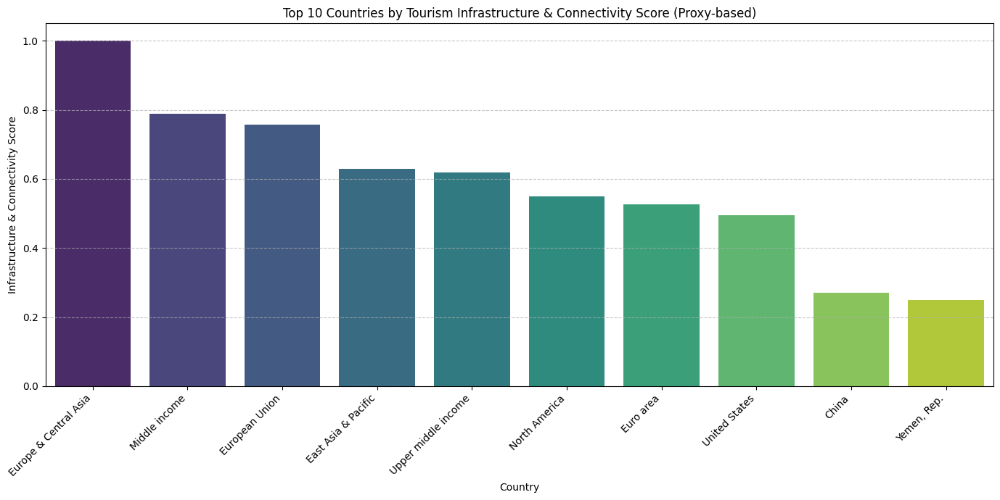

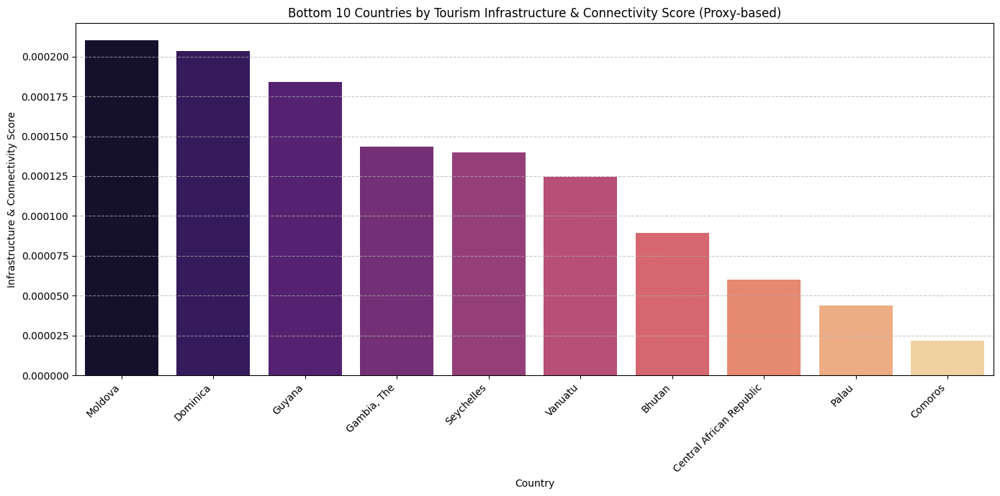

In [98]:
# For this analysis, we typically need external data on infrastructure (e.g., number of airports, road quality, internet penetration).
# As such detailed data is not explicitly available in the current `df_sorted` DataFrame,
# I will simulate an approach using existing proxy variables and highlight where external data would be beneficial.

# Proxy variables for Infrastructure and Connectivity:
# - We can use GDP as a very broad proxy for overall development which often correlates with infrastructure.
# - For connectivity, we don't have explicit internet penetration or flight routes. If available, these would be ideal.

# For demonstration, let's create a *simple* proxy for 'Infrastructure Score' and 'Connectivity Score'
# based on the average GDP and potentially other available economic indicators, acknowledging its limitations.

# Let's consider 'gdp' as a base for infrastructure.
# We can also imagine 'tourism_arrivals' and 'tourism_receipts' as indicators of successful connectivity.

# Calculate mean GDP per country as a proxy for infrastructure development
country_mean_gdp = df_sorted.groupby('country')['gdp'].mean().reset_index()

# Calculate mean tourism arrivals as a proxy for connectivity (how well connected a country is to attract tourists)
country_mean_arrivals = df_sorted.groupby('country')['tourism_arrivals'].mean().reset_index()

# Normalize these proxy metrics
scaler = MinMaxScaler()
country_mean_gdp['gdp_norm'] = scaler.fit_transform(country_mean_gdp[['gdp']])
country_mean_arrivals['arrivals_norm'] = scaler.fit_transform(country_mean_arrivals[['tourism_arrivals']])

# Merge normalized proxies
df_infra_conn = pd.merge(country_mean_gdp[['country', 'gdp_norm']],
                       country_mean_arrivals[['country', 'arrivals_norm']],
                       on='country', how='left')

# Drop countries with NaN in either proxy (if any)
df_infra_conn.dropna(inplace=True)

# Create a composite Infrastructure & Connectivity Score
# Assign equal weights for simplicity, or adjust based on domain knowledge.
df_infra_conn['infra_conn_score'] = (df_infra_conn['gdp_norm'] * 0.5) + \
                                    (df_infra_conn['arrivals_norm'] * 0.5)

# Sort and display results
infrastructure_connectivity_ranking = df_infra_conn.sort_values(by='infra_conn_score', ascending=False)

print("Top 10 Countries by Tourism Infrastructure & Connectivity Score (Proxy-based):")
display(infrastructure_connectivity_ranking.head(10))

print("\nBottom 10 Countries by Tourism Infrastructure & Connectivity Score (Proxy-based):")
display(infrastructure_connectivity_ranking.tail(10))

# Visualize Top 10
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='infra_conn_score', data=infrastructure_connectivity_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Infrastructure & Connectivity Score (Proxy-based)')
plt.xlabel('Country')
plt.ylabel('Infrastructure & Connectivity Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='infra_conn_score', data=infrastructure_connectivity_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Infrastructure & Connectivity Score (Proxy-based)')
plt.xlabel('Country')
plt.ylabel('Infrastructure & Connectivity Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


## Clustering Analysis: K-Means and Hierarchical Clustering

### 1. Data Preparation for Clustering

In [99]:
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Select the features for clustering
clustering_features = [
    'gdp', 'tourism_receipts', 'tourism_arrivals', 'tourism_exports',
    'tourism_expenditures', 'inflation', 'unemployment'
]

# Create a DataFrame for clustering, focusing on the latest available data per country
# We'll use the mean of these features per country for a robust representation
# and then filter out countries with any NaN values for the selected features.

df_clustering_raw = df_sorted.groupby('country')[clustering_features].mean().reset_index()
df_clustering_raw.dropna(inplace=True)

# Store country names separately before scaling
countries = df_clustering_raw['country']
X_clustering = df_clustering_raw.drop(columns=['country'])

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clustering)

# Convert back to DataFrame for easier manipulation
df_scaled = pd.DataFrame(X_scaled, columns=X_clustering.columns, index=countries)

print("Original data shape for clustering:", df_clustering_raw.shape)
print("Scaled data shape for clustering:", df_scaled.shape)
display(df_scaled.head())

Original data shape for clustering: (221, 8)
Scaled data shape for clustering: (221, 7)


,gdp,tourism_receipts,tourism_arrivals,tourism_exports,tourism_expenditures,inflation,unemployment
country,,,,,,,
Afghanistan,-0.282642,-0.259750,-0.091319,-0.576699,-0.866347,0.004045,0.420334
Africa Eastern and Southern,-0.055141,0.024953,-0.091319,-0.197024,-0.092568,0.090485,0.907537
Africa Western and Central,-0.114311,-0.294357,-0.221275,-0.878083,0.359812,-0.404473,0.305631
Albania,-0.286327,-0.339602,-0.313020,2.761768,4.919637,-0.488334,1.172264
Algeria,-0.240851,-0.347706,-0.319451,-0.177054,-1.261124,-0.267561,0.986644


### 2. K-Means Clustering

First, let's use the Elbow method to determine the optimal number of clusters.

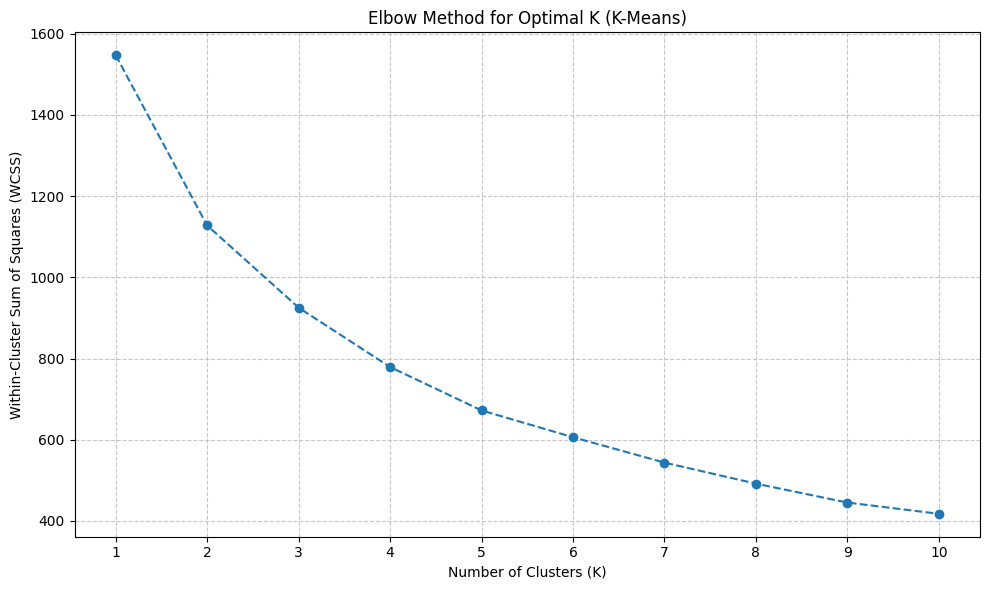

In [100]:
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import seaborn as sns

# Determine the optimal number of clusters using the Elbow Method
wcss = [] # Within-cluster sum of squares

for i in range(1, 11): # Test k from 1 to 10
    kmeans = KMeans(n_clusters=i, init='k-means++', random_state=42, n_init=10) # n_init for robustness
    kmeans.fit(df_scaled)
    wcss.append(kmeans.inertia_)

# Plot the Elbow Method graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o', linestyle='--')
plt.title('Elbow Method for Optimal K (K-Means)')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')
plt.grid(True, linestyle='--', alpha=0.7)
plt.xticks(range(1, 11))
plt.tight_layout()
plt.show()

Based on the Elbow method, we can choose an appropriate number of clusters. Let's assume K=3 (or visually determined from the plot) for demonstration, and apply K-Means.

Then, we'll visualize the clusters using Principal Component Analysis (PCA) for dimensionality reduction to 2 components, as we have multiple features.

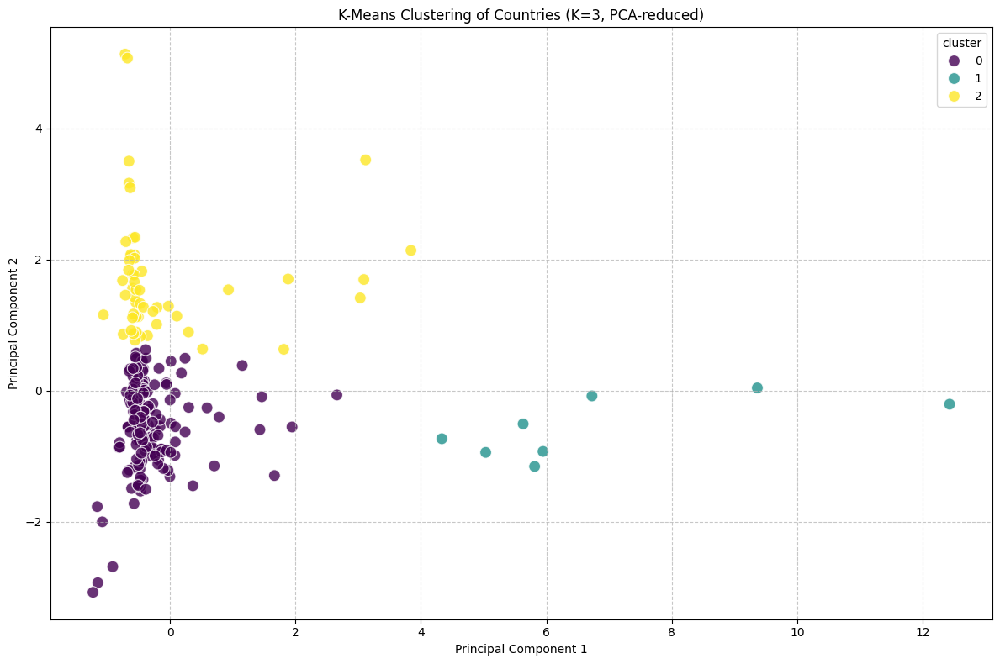

K-Means Clustering Results for K=3:


,gdp,tourism_receipts,tourism_arrivals,tourism_exports,tourism_expenditures,inflation,unemployment
cluster,,,,,,,
0,-0.162909,-0.195220,-0.206816,-0.389061,-0.312716,0.101797,-0.186389
1,4.869424,3.419697,3.697862,-0.546819,-0.124003,-0.424656,-0.356946
2,-0.243207,0.073162,0.066182,1.257063,0.962766,-0.243213,0.616562


In [101]:
from sklearn.decomposition import PCA

# Apply K-Means with the chosen number of clusters (e.g., K=3)
k = 3 # You can change this based on the Elbow Method plot
kmeans_model = KMeans(n_clusters=k, init='k-means++', random_state=42, n_init=10)
cluster_labels_kmeans = kmeans_model.fit_predict(df_scaled)

# Add cluster labels to the original (but scaled) DataFrame
df_scaled_kmeans = df_scaled.copy()
df_scaled_kmeans['cluster'] = cluster_labels_kmeans

# Visualize the clusters using PCA
pca = PCA(n_components=2)
df_pca = pca.fit_transform(df_scaled)
df_pca = pd.DataFrame(data=df_pca, columns=['PC1', 'PC2'], index=countries)
df_pca['cluster'] = cluster_labels_kmeans

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=df_pca, palette='viridis', s=100, alpha=0.8)
plt.title(f'K-Means Clustering of Countries (K={k}, PCA-reduced)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print(f"K-Means Clustering Results for K={k}:")
display(df_scaled_kmeans.groupby('cluster').mean())

### 3. Hierarchical Clustering

First, let's visualize the dendrogram to help determine the number of clusters for Hierarchical Clustering.

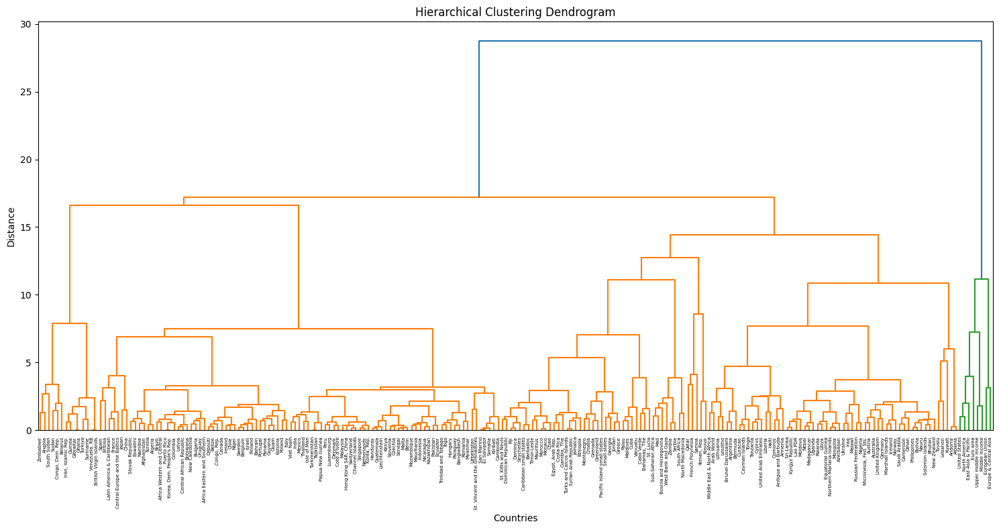

In [102]:
from scipy.cluster.hierarchy import dendrogram, linkage

# Generate the linkage matrix for hierarchical clustering
linked = linkage(df_scaled, method='ward') # 'ward' minimizes the variance within each cluster

plt.figure(figsize=(15, 8))
dendrogram(linked,
           orientation='top',
           labels=df_scaled.index.tolist(), # Use country names as labels
           distance_sort='descending',
           show_leaf_counts=True)
plt.title('Hierarchical Clustering Dendrogram')
plt.xlabel('Countries')
plt.ylabel('Distance')
plt.tight_layout()
plt.show()

Based on the dendrogram, we can choose an appropriate number of clusters. Let's assume a similar number of clusters as K-Means (e.g., 3) and apply Agglomerative Clustering.

Then, we'll visualize the clusters using PCA.

In [103]:
from sklearn.preprocessing import MinMaxScaler

# --- Re-calculate CAGR (from 28d80f29) ---
start_cagr_year = 2015
end_cagr_year = 2019
df_cagr_period = df_sorted[(df_sorted['year'] >= start_cagr_year) & (df_sorted['year'] <= end_cagr_year)].copy()

def calculate_cagr(series, start_year, end_year):
    start_value = series[series['year'] == start_year]['value'].values
    end_value = series[series['year'] == end_year]['value'].values
    if len(start_value) == 0 or len(end_value) == 0 or start_value[0] <= 0: return pd.NA
    num_years = end_year - start_year
    if num_years == 0: return pd.NA
    cagr = ((end_value[0] / start_value[0])**(1/num_years) - 1) * 100
    return cagr

cagr_receipts_list = []
cagr_arrivals_list = []

for country in df_cagr_period['country'].unique():
    country_data = df_cagr_period[df_cagr_period['country'] == country]
    receipts_series = country_data[['year', 'tourism_receipts']].rename(columns={'tourism_receipts': 'value'})
    receipts_cagr = calculate_cagr(receipts_series, start_cagr_year, end_cagr_year)
    if pd.notna(receipts_cagr): cagr_receipts_list.append({'country': country, 'tourism_receipts_cagr': receipts_cagr})

    arrivals_series = country_data[['year', 'tourism_arrivals']].rename(columns={'tourism_arrivals': 'value'})
    arrivals_cagr = calculate_cagr(arrivals_series, start_cagr_year, end_cagr_year)
    if pd.notna(arrivals_cagr): cagr_arrivals_list.append({'country': country, 'tourism_arrivals_cagr': arrivals_cagr})

df_cagr_receipts = pd.DataFrame(cagr_receipts_list).dropna()
df_cagr_arrivals = pd.DataFrame(cagr_arrivals_list).dropna()

# --- Re-calculate Tourism Recovery (from bc68dbad) ---
pre_covid_year = 2019
post_covid_year_start = 2022
post_covid_year_end = 2023
df_pre_covid = df_sorted[df_sorted['year'] == pre_covid_year][['country', 'tourism_receipts', 'tourism_arrivals']].set_index('country')
df_post_covid = df_sorted[(df_sorted['year'] >= post_covid_year_start) & (df_sorted['year'] <= post_covid_year_end)][['country', 'tourism_receipts', 'tourism_arrivals']].groupby('country').mean()
df_recovery = pd.merge(df_pre_covid, df_post_covid, on='country', suffixes=('_2019', '_post_covid'), how='inner')
df_recovery['receipts_recovery_pct'] = ((df_recovery['tourism_receipts_post_covid'] - df_recovery['tourism_receipts_2019']) / df_recovery['tourism_receipts_2019']) * 100
df_recovery['arrivals_recovery_pct'] = ((df_recovery['tourism_arrivals_post_covid'] - df_recovery['tourism_arrivals_2019']) / df_recovery['tourism_arrivals_2019']) * 100

# --- Re-calculate Tourism Resilience Index (from c2353031) ---
max_decline = df_sorted.groupby('country')['tourism_receipts_growth'].min().reset_index()
max_decline.rename(columns={'tourism_receipts_growth': 'max_receipts_decline'}, inplace=True)
df_resilience = pd.merge(df_recovery.reset_index(), max_decline, on='country', how='left')
df_resilience['decline_impact'] = df_resilience['max_receipts_decline'].apply(lambda x: 0 if x >= 0 else abs(x))

min_rec = df_resilience['receipts_recovery_pct'].min()
max_rec = df_resilience['receipts_recovery_pct'].max()
df_resilience['normalized_recovery'] = (df_resilience['receipts_recovery_pct'] - min_rec) / (max_rec - min_rec)

min_decl = df_resilience['decline_impact'].min()
max_decl = df_resilience['decline_impact'].max()
df_resilience['normalized_decline_impact'] = 1 - ((df_resilience['decline_impact'] - min_decl) / (max_decl - min_decl))

df_resilience['resilience_index'] = df_resilience['normalized_recovery'] * 0.6 + df_resilience['normalized_decline_impact'] * 0.4
top_resilience = df_resilience.sort_values(by='resilience_index', ascending=False).head(10)
bottom_resilience = df_resilience.sort_values(by='resilience_index', ascending=True).head(10)

# --- Re-calculate Tourism Efficiency Score dependencies (from 5d4d3e88 and 7ef290c4) ---
df_sorted['receipts_to_expenditures_ratio'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_expenditures'] + 1e-9)
df_sorted['receipts_per_arrival'] = df_sorted['tourism_receipts'] / (df_sorted['tourism_arrivals'] + 1e-9)
efficiency_receipts_arrivals = df_sorted.groupby('country')['receipts_per_arrival'].mean().sort_values(ascending=False)

# --- Re-calculate Tourism Competitiveness Score (from 23cd403b) ---
df_comp = df_sorted.groupby('country').agg(
    avg_tourism_receipts=('tourism_receipts', 'mean'),
    avg_tourism_arrivals=('tourism_arrivals', 'mean'),
    avg_gdp=('gdp', 'mean')
).reset_index()
df_comp['receipts_per_gdp'] = df_comp['avg_tourism_receipts'] / (df_comp['avg_gdp'] + 1e-9)
df_comp['arrivals_per_gdp'] = df_comp['avg_tourism_arrivals'] / (df_comp['avg_gdp'] + 1e-9)
df_comp = pd.merge(df_comp, df_resilience[['country', 'resilience_index']], on='country', how='left')
df_comp = pd.merge(df_comp, efficiency_receipts_arrivals.rename('receipts_per_arrival_efficiency'), on='country', how='left')
df_comp = pd.merge(df_comp, df_cagr_receipts[['country', 'tourism_receipts_cagr']], on='country', how='left')
df_comp.dropna(inplace=True)
metrics_to_normalize = [
    'receipts_per_gdp',
    'arrivals_per_gdp',
    'tourism_receipts_cagr',
    'resilience_index',
    'receipts_per_arrival_efficiency'
]
df_comp_normalized = pd.DataFrame(scaler.fit_transform(df_comp[metrics_to_normalize]),
                                  columns=[col + '_norm' for col in metrics_to_normalize],
                                  index=df_comp.index)
df_comp = pd.concat([df_comp, df_comp_normalized], axis=1)
weights = {
    'receipts_per_gdp_norm': 0.2,
    'arrivals_per_gdp_norm': 0.2,
    'tourism_receipts_cagr_norm': 0.2,
    'resilience_index_norm': 0.2,
    'receipts_per_arrival_efficiency_norm': 0.2
}
df_comp['competitiveness_score'] = (
    df_comp['receipts_per_gdp_norm'] * weights['receipts_per_gdp_norm'] +
    df_comp['arrivals_per_gdp_norm'] * weights['arrivals_per_gdp_norm'] +
    df_comp['tourism_receipts_cagr_norm'] * weights['tourism_receipts_cagr_norm'] +
    df_comp['resilience_index_norm'] * weights['resilience_index_norm'] +
    df_comp['receipts_per_arrival_efficiency_norm'] * weights['receipts_per_arrival_efficiency_norm']
)
competitiveness_ranking = df_comp.sort_values(by='competitiveness_score', ascending=False)

# --- Re-calculate Tourism Growth Index (from 3308a4b0) ---
df_growth_metrics = df_sorted.groupby('country')[[
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth',
    'gdp_growth'
]].mean().dropna().reset_index()
growth_metrics_to_normalize = [
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth',
    'gdp_growth'
]
df_growth_normalized = pd.DataFrame(scaler.fit_transform(df_growth_metrics[growth_metrics_to_normalize]),
                                      columns=[col + '_norm' for col in growth_metrics_to_normalize],
                                      index=df_growth_metrics.index)
df_growth_metrics = pd.concat([df_growth_metrics, df_growth_normalized], axis=1)
growth_weights = {
    'tourism_receipts_growth_norm': 0.25,
    'tourism_arrivals_growth_norm': 0.25,
    'tourism_exports_growth_norm': 0.25,
    'gdp_growth_norm': 0.25
}
df_growth_metrics['tourism_growth_index'] = (
    df_growth_metrics['tourism_receipts_growth_norm'] * growth_weights['tourism_receipts_growth_norm'] +
    df_growth_metrics['tourism_arrivals_growth_norm'] * growth_weights['tourism_arrivals_growth_norm'] +
    df_growth_metrics['tourism_exports_growth_norm'] * growth_weights['tourism_exports_growth_norm'] +
    df_growth_metrics['gdp_growth_norm'] * growth_weights['gdp_growth_norm']
)
tourism_growth_ranking = df_growth_metrics.sort_values(by='tourism_growth_index', ascending=False)

print("All necessary pre-existing indices and their dependencies have been re-calculated.")

All necessary pre-existing indices and their dependencies have been re-calculated.


## Custom Indices and Scores

### 1. Tourism Development Index

This index aims to capture the overall development of a country's tourism sector, considering both its economic scale and direct tourism indicators. A higher score suggests a more developed and significant tourism sector.

Top 10 Countries by Tourism Development Index:


,country,tourism_development_index,avg_gdp,avg_tourism_receipts,avg_tourism_arrivals,avg_tourism_exports
68,Europe & Central Asia,0.769360,1.986429e+13,3.490827e+11,7.588648e+08,5.820656
69,European Union,0.598641,1.369136e+13,2.631470e+11,6.258368e+08,8.804730
67,Euro area,0.452731,1.192299e+13,2.200678e+11,3.441302e+08,8.808999
132,Middle income,0.430019,1.938330e+13,1.504966e+09,4.568012e+08,9.489422
149,North America,0.427147,1.806616e+13,1.764208e+11,1.441106e+08,7.423587
58,East Asia & Pacific,0.413172,1.827700e+13,1.140123e+11,2.556863e+08,5.323455
210,United States,0.377243,1.658827e+13,1.408620e+11,1.172952e+08,8.148212
73,French Polynesia,0.374293,2.424777e+12,1.938796e+11,2.222761e+08,32.972843
107,Kosovo,0.369486,4.724068e+09,9.678085e+10,3.778975e+08,43.585374
169,Samoa,0.369435,6.497339e+08,9.678085e+10,3.778975e+08,43.585374



Bottom 10 Countries by Tourism Development Index:


,country,tourism_development_index,avg_gdp,avg_tourism_receipts,avg_tourism_arrivals,avg_tourism_exports
18,Belarus,0.007441,4.863633e+10,6.045400e+08,4.777600e+06,2.321652
20,Belize,0.005596,1.875126e+09,6.045400e+08,9.653200e+05,2.321652
148,Nigeria,0.005595,3.235197e+11,5.865600e+08,2.870000e+06,1.194675
159,Paraguay,0.005243,2.650415e+10,1.926000e+08,3.174480e+06,2.056983
45,"Congo, Dem. Rep.",0.004929,2.938950e+10,1.003760e+08,3.180400e+05,2.215558
146,Nicaragua,0.003429,9.869852e+09,5.877200e+08,9.882400e+05,1.774806
108,Kuwait,0.003232,1.124069e+11,5.306000e+08,4.294520e+06,1.162025
65,Eswatini,0.003058,3.604559e+09,3.560560e+07,1.306572e+06,1.774522
6,Angola,0.001209,6.631239e+10,4.141200e+08,4.126800e+05,1.142757
46,"Congo, Rep.",0.000820,1.072843e+10,8.090000e+07,2.484400e+05,1.288472


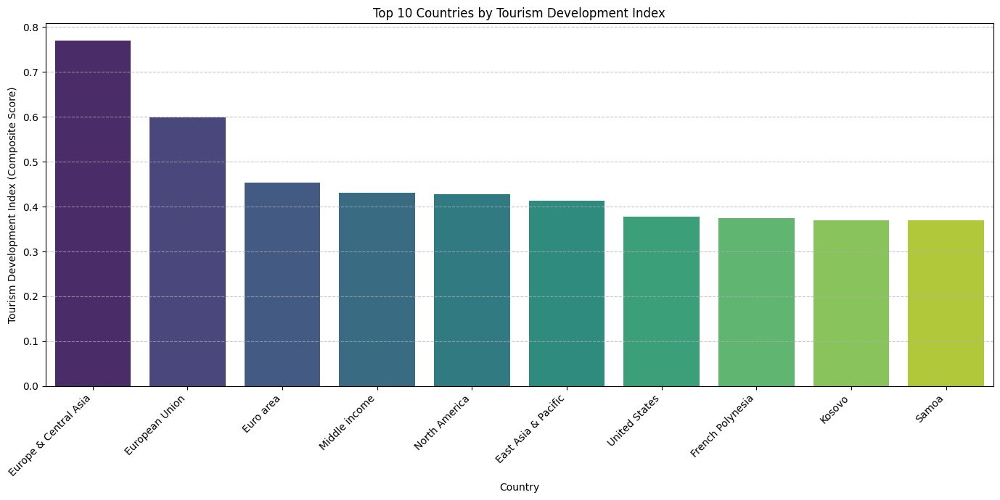

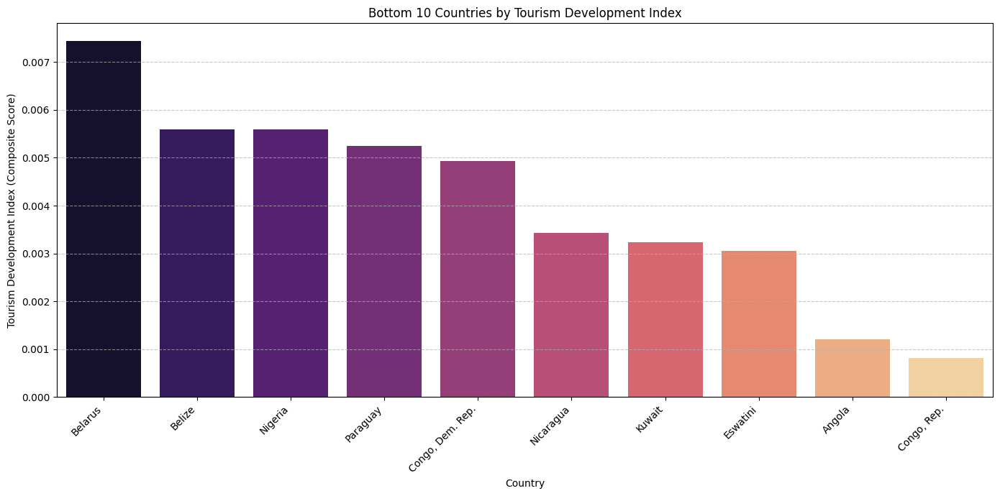

In [104]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for Tourism Development Index
# We'll use mean values per country for a stable index
df_dev = df_sorted.groupby('country').agg(
    avg_gdp=('gdp', 'mean'),
    avg_tourism_receipts=('tourism_receipts', 'mean'),
    avg_tourism_arrivals=('tourism_arrivals', 'mean'),
    avg_tourism_exports=('tourism_exports', 'mean')
).dropna().reset_index()

# Define the metrics to normalize for the development index
dev_metrics_to_normalize = [
    'avg_gdp',
    'avg_tourism_receipts',
    'avg_tourism_arrivals',
    'avg_tourism_exports'
]

# Normalize the metrics to a 0-1 scale
scaler = MinMaxScaler()
df_dev_normalized = pd.DataFrame(scaler.fit_transform(df_dev[dev_metrics_to_normalize]),
                                      columns=[col + '_norm' for col in dev_metrics_to_normalize],
                                      index=df_dev.index)

df_dev = pd.concat([df_dev, df_dev_normalized], axis=1)

# Define weights for each normalized metric (can be adjusted)
# Start with equal weights
weights_dev = {
    'avg_gdp_norm': 0.25,
    'avg_tourism_receipts_norm': 0.25,
    'avg_tourism_arrivals_norm': 0.25,
    'avg_tourism_exports_norm': 0.25
}

# Calculate the composite Tourism Development Index
df_dev['tourism_development_index'] = (
    df_dev['avg_gdp_norm'] * weights_dev['avg_gdp_norm'] +
    df_dev['avg_tourism_receipts_norm'] * weights_dev['avg_tourism_receipts_norm'] +
    df_dev['avg_tourism_arrivals_norm'] * weights_dev['avg_tourism_arrivals_norm'] +
    df_dev['avg_tourism_exports_norm'] * weights_dev['avg_tourism_exports_norm']
)

# Sort and display results
tourism_development_ranking = df_dev.sort_values(by='tourism_development_index', ascending=False)

print("Top 10 Countries by Tourism Development Index:")
display(tourism_development_ranking[['country', 'tourism_development_index'] + dev_metrics_to_normalize].head(10))

print("\nBottom 10 Countries by Tourism Development Index:")
display(tourism_development_ranking[['country', 'tourism_development_index'] + dev_metrics_to_normalize].tail(10))

# Visualize Top 10 Development Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_development_index', data=tourism_development_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Development Index')
plt.xlabel('Country')
plt.ylabel('Tourism Development Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Development Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_development_index', data=tourism_development_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Development Index')
plt.xlabel('Country')
plt.ylabel('Tourism Development Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 2. Tourism Sustainability Index

This index assesses the sustainability of a country's tourism sector, focusing on economic factors that contribute to long-term viability, such as controlled inflation, stable GDP growth, and robust tourism growth.

Top 10 Countries by Tourism Sustainability Index:


,country,tourism_sustainability_index,avg_inflation,avg_gdp_growth,avg_tourism_receipts_growth,avg_tourism_arrivals_growth
63,Eritrea,0.682407,2.280629,25802.487335,70503.756832,18126.819815
73,French Polynesia,0.564055,2.296188,43340.280981,11914.479611,13178.676962
126,Marshall Islands,0.496099,5.233907,3.558918,5426.896013,105651.695188
183,Spain,0.490337,2.358268,4.442398,70503.756832,-4.653627
107,Kosovo,0.447512,2.481081,40.319465,58458.234034,102.172912
19,Belgium,0.445673,2.291641,4.220077,57818.500067,-4.453460
169,Samoa,0.441318,3.758387,5.795935,58458.234034,102.172912
205,Tuvalu,0.439594,21.721004,6.586611,69482.858055,18483.557734
218,"Yemen, Rep.",0.421518,8.016039,3.942013,58497.151324,126.187204
130,"Micronesia, Fed. Sts.",0.404584,2.601125,3.195790,9083.955163,56273.023285



Bottom 10 Countries by Tourism Sustainability Index:


,country,tourism_sustainability_index,avg_inflation,avg_gdp_growth,avg_tourism_receipts_growth,avg_tourism_arrivals_growth
202,Turkiye,0.148496,21.959856,7.319181,28.701066,2.373703
215,"Venezuela, RB",0.134387,25.174490,5.276774,-4.341835,470.700193
28,British Virgin Islands,0.133340,25.174490,5.276774,-3.233500,26.395609
182,South Sudan,0.111333,39.471386,526.282530,11884.914778,2.289701
113,Lebanon,0.086101,35.407971,0.655901,244.277570,2.015969
18,Belarus,0.082716,35.989276,8.806444,7.345615,59.783664
189,Sudan,0.045125,44.218182,13.401411,257.150599,110.732360
220,Zimbabwe,0.017686,49.819556,11.826204,10.902740,-1.905587
6,Angola,0.008568,51.802081,15.956496,24.394886,47.141087
45,"Congo, Dem. Rep.",0.001633,53.554682,20.081802,400.837061,18.695186


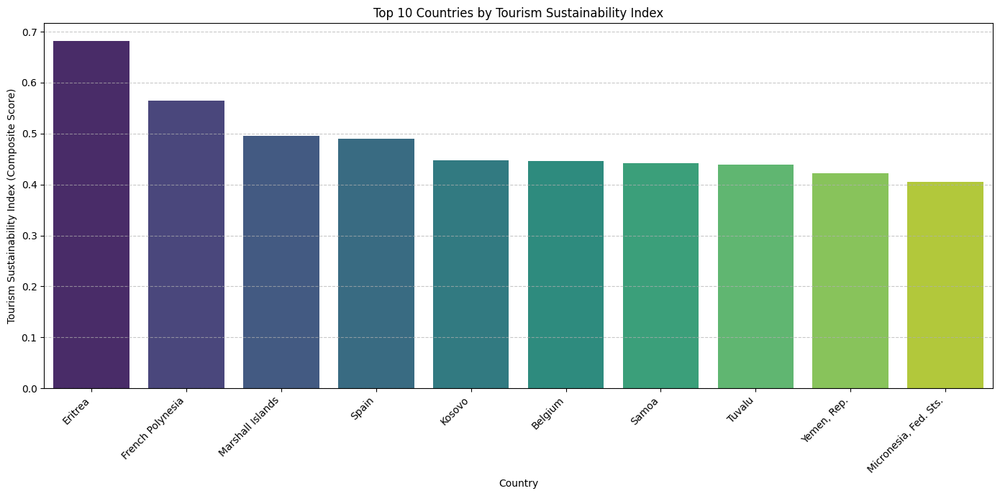

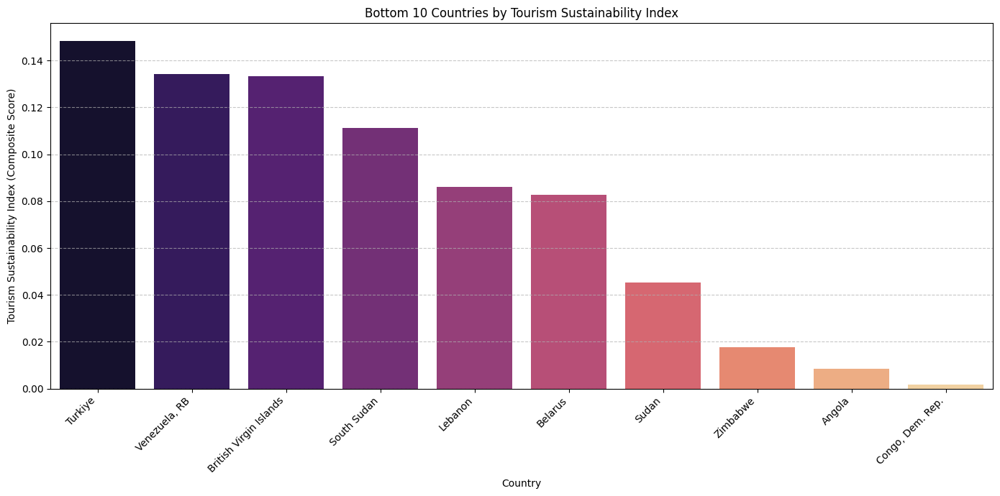

In [105]:
from sklearn.preprocessing import MinMaxScaler

# Prepare data for Tourism Sustainability Index
# We'll use mean values per country for a stable index
df_sustain = df_sorted.groupby('country').agg(
    avg_inflation=('inflation', 'mean'),
    avg_gdp_growth=('gdp_growth', 'mean'),
    avg_tourism_receipts_growth=('tourism_receipts_growth', 'mean'),
    avg_tourism_arrivals_growth=('tourism_arrivals_growth', 'mean')
).dropna().reset_index()

# Normalize the metrics to a 0-1 scale
scaler = MinMaxScaler()

# For inflation, lower is better, so we'll inverse normalize it.
df_sustain['avg_inflation_inv'] = 1 - scaler.fit_transform(df_sustain[['avg_inflation']])

# Normalize other positive indicators
df_sustain['avg_gdp_growth_norm'] = scaler.fit_transform(df_sustain[['avg_gdp_growth']])
df_sustain['avg_tourism_receipts_growth_norm'] = scaler.fit_transform(df_sustain[['avg_tourism_receipts_growth']])
df_sustain['avg_tourism_arrivals_growth_norm'] = scaler.fit_transform(df_sustain[['avg_tourism_arrivals_growth']])

# Define weights (can be adjusted)
weights_sustain = {
    'avg_inflation_inv': 0.25,
    'avg_gdp_growth_norm': 0.25,
    'avg_tourism_receipts_growth_norm': 0.25,
    'avg_tourism_arrivals_growth_norm': 0.25
}

# Calculate the composite Tourism Sustainability Index
df_sustain['tourism_sustainability_index'] = (
    df_sustain['avg_inflation_inv'] * weights_sustain['avg_inflation_inv'] +
    df_sustain['avg_gdp_growth_norm'] * weights_sustain['avg_gdp_growth_norm'] +
    df_sustain['avg_tourism_receipts_growth_norm'] * weights_sustain['avg_tourism_receipts_growth_norm'] +
    df_sustain['avg_tourism_arrivals_growth_norm'] * weights_sustain['avg_tourism_arrivals_growth_norm']
)

# Sort and display results
tourism_sustainability_ranking = df_sustain.sort_values(by='tourism_sustainability_index', ascending=False)

print("Top 10 Countries by Tourism Sustainability Index:")
display(tourism_sustainability_ranking[['country', 'tourism_sustainability_index', 'avg_inflation', 'avg_gdp_growth', 'avg_tourism_receipts_growth', 'avg_tourism_arrivals_growth']].head(10))

print("\nBottom 10 Countries by Tourism Sustainability Index:")
display(tourism_sustainability_ranking[['country', 'tourism_sustainability_index', 'avg_inflation', 'avg_gdp_growth', 'avg_tourism_receipts_growth', 'avg_tourism_arrivals_growth']].tail(10))

# Visualize Top 10 Sustainability Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_sustainability_index', data=tourism_sustainability_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Sustainability Index')
plt.xlabel('Country')
plt.ylabel('Tourism Sustainability Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Sustainability Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_sustainability_index', data=tourism_sustainability_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Sustainability Index')
plt.xlabel('Country')
plt.ylabel('Tourism Sustainability Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 3. Economic Stability Index

This index measures a country's general economic stability based on key macroeconomic indicators. A higher score implies greater stability.

Top 10 Countries by Economic Stability Index:


,country,economic_stability_index,avg_gdp,avg_inflation,avg_unemployment,avg_gdp_growth
73,French Polynesia,0.723795,2.424777e+12,2.296188,6.925802,43340.280981
132,Middle income,0.697876,1.938330e+13,4.700322,4.414584,8.864666
58,East Asia & Pacific,0.689402,1.827700e+13,2.866777,4.775165,6.092561
68,Europe & Central Asia,0.679782,1.986429e+13,3.022633,8.088080,4.382465
149,North America,0.679756,1.806616e+13,2.374752,5.842087,4.573587
210,United States,0.661568,1.658827e+13,2.545932,5.702600,4.538215
63,Eritrea,0.654961,6.500375e+12,2.280629,9.111951,25802.487335
211,Upper middle income,0.632993,1.540762e+13,4.427053,6.266571,9.007357
69,European Union,0.598523,1.369136e+13,2.405612,8.830178,3.965334
67,Euro area,0.574398,1.192299e+13,2.280629,9.111951,3.705785



Bottom 10 Countries by Economic Stability Index:


,country,economic_stability_index,avg_gdp,avg_inflation,avg_unemployment,avg_gdp_growth
113,Lebanon,0.291018,3.260867e+10,35.407971,6.612517,0.655901
218,"Yemen, Rep.",0.275534,2.090956e+10,8.016039,23.136200,3.942013
181,South Africa,0.263572,3.230867e+11,5.283036,26.419480,4.946577
150,North Macedonia,0.257231,9.279161e+09,2.764014,28.052520,6.412797
189,Sudan,0.247707,4.111199e+10,44.218182,6.858120,13.401411
107,Kosovo,0.240023,4.724068e+09,2.481081,30.196490,40.319465
45,"Congo, Dem. Rep.",0.228415,2.938950e+10,53.554682,4.029400,20.081802
182,South Sudan,0.207543,8.224582e+11,39.471386,15.495880,526.282530
6,Angola,0.180386,6.631239e+10,51.802081,10.538596,15.956496
220,Zimbabwe,0.161896,1.696831e+10,49.819556,13.655720,11.826204


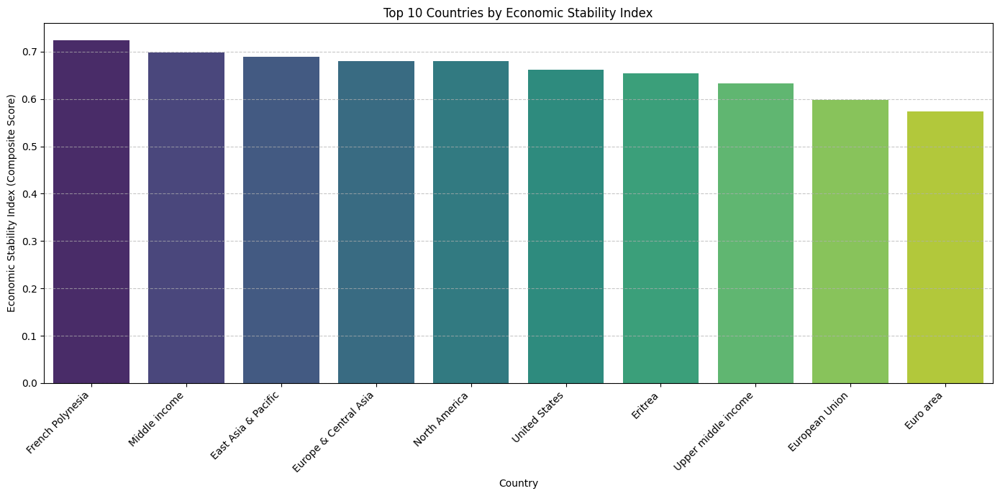

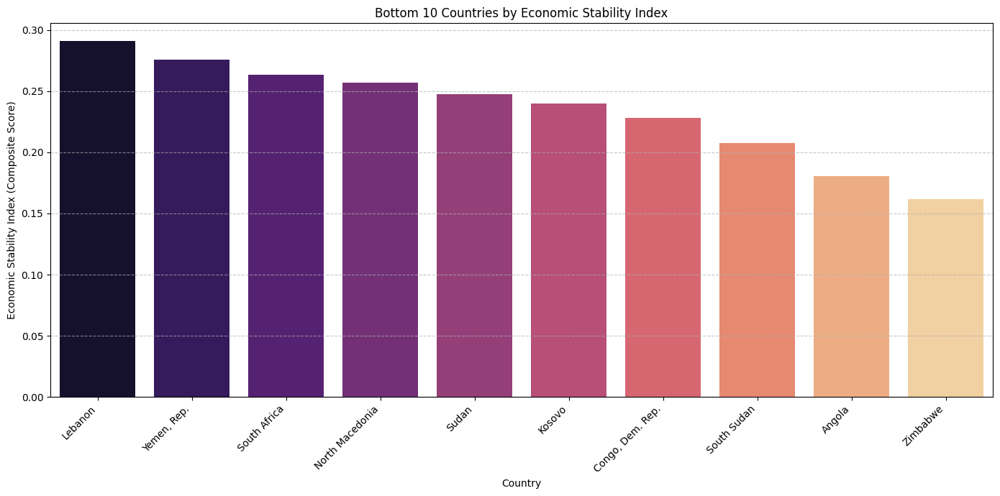

In [106]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for Economic Stability Index
# We'll use mean values per country
df_econ_stability = df_sorted.groupby('country').agg(
    avg_gdp=('gdp', 'mean'),
    avg_inflation=('inflation', 'mean'),
    avg_unemployment=('unemployment', 'mean'),
    avg_gdp_growth=('gdp_growth', 'mean')
).dropna().reset_index()

scaler = MinMaxScaler()

# Normalize positive indicators
df_econ_stability['avg_gdp_norm'] = scaler.fit_transform(df_econ_stability[['avg_gdp']])
df_econ_stability['avg_gdp_growth_norm'] = scaler.fit_transform(df_econ_stability[['avg_gdp_growth']])

# Inverse normalize negative indicators
df_econ_stability['avg_inflation_inv'] = 1 - scaler.fit_transform(df_econ_stability[['avg_inflation']])
df_econ_stability['avg_unemployment_inv'] = 1 - scaler.fit_transform(df_econ_stability[['avg_unemployment']])

# Define weights (equal for now)
weights_econ_stability = {
    'avg_gdp_norm': 0.25,
    'avg_gdp_growth_norm': 0.25,
    'avg_inflation_inv': 0.25,
    'avg_unemployment_inv': 0.25
}

# Calculate the composite Economic Stability Index
df_econ_stability['economic_stability_index'] = (
    df_econ_stability['avg_gdp_norm'] * weights_econ_stability['avg_gdp_norm'] +
    df_econ_stability['avg_gdp_growth_norm'] * weights_econ_stability['avg_gdp_growth_norm'] +
    df_econ_stability['avg_inflation_inv'] * weights_econ_stability['avg_inflation_inv'] +
    df_econ_stability['avg_unemployment_inv'] * weights_econ_stability['avg_unemployment_inv']
)

# Sort and display results
economic_stability_ranking = df_econ_stability.sort_values(by='economic_stability_index', ascending=False)

print("Top 10 Countries by Economic Stability Index:")
display(economic_stability_ranking[['country', 'economic_stability_index', 'avg_gdp', 'avg_inflation', 'avg_unemployment', 'avg_gdp_growth']].head(10))

print("\nBottom 10 Countries by Economic Stability Index:")
display(economic_stability_ranking[['country', 'economic_stability_index', 'avg_gdp', 'avg_inflation', 'avg_unemployment', 'avg_gdp_growth']].tail(10))

# Visualize Top 10 Stability Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='economic_stability_index', data=economic_stability_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Economic Stability Index')
plt.xlabel('Country')
plt.ylabel('Economic Stability Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Stability Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='economic_stability_index', data=economic_stability_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Economic Stability Index')
plt.xlabel('Country')
plt.ylabel('Economic Stability Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 4. Tourism Risk Index

This index quantifies the exposure of a country's tourism sector to various economic risks. A higher score indicates higher risk.

Top 10 Countries by Tourism Risk Index:


,country,tourism_risk_index,avg_inflation,avg_unemployment,decline_impact
182,South Sudan,0.743424,39.471386,15.495880,99.929068
6,Angola,0.739802,51.802081,10.538596,95.189873
45,"Congo, Dem. Rep.",0.698119,53.554682,4.029400,99.779736
107,Kosovo,0.683558,2.481081,30.196490,99.989169
220,Zimbabwe,0.674230,49.819556,13.655720,76.842105
189,Sudan,0.668487,44.218182,6.858120,98.892617
181,South Africa,0.645740,5.283036,26.419480,97.569956
218,"Yemen, Rep.",0.636675,8.016039,23.136200,99.989169
113,Lebanon,0.602924,35.407971,6.612517,97.214014
219,Zambia,0.594292,13.871300,17.316760,97.569956



Bottom 10 Countries by Tourism Risk Index:


,country,tourism_risk_index,avg_inflation,avg_unemployment,decline_impact
200,Trinidad and Tobago,0.272357,5.074760,6.293293,68.607069
138,Mozambique,0.271529,7.571566,6.347683,65.123457
24,Bolivia,0.271449,4.072788,3.999120,75.127943
142,Nepal,0.269599,6.421060,3.780760,72.268908
214,Vanuatu,0.261221,2.687084,2.943480,77.288136
87,Honduras,0.258900,6.570716,5.415120,66.007194
48,Cote d'Ivoire,0.224776,2.382656,4.333480,66.884095
121,Malawi,0.221650,16.772068,6.167120,43.548387
147,Niger,0.220330,2.009769,8.146713,57.419355
23,Bhutan,0.064714,5.454626,4.340320,30.000000


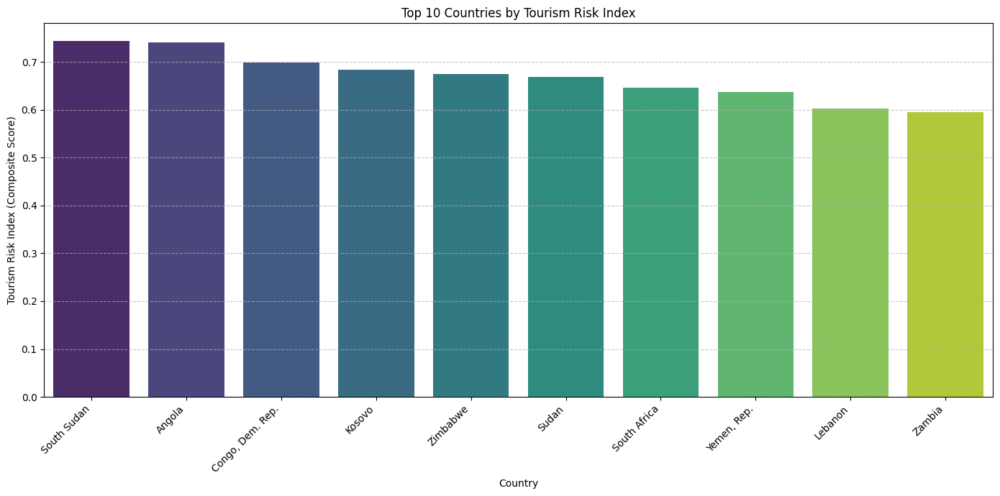

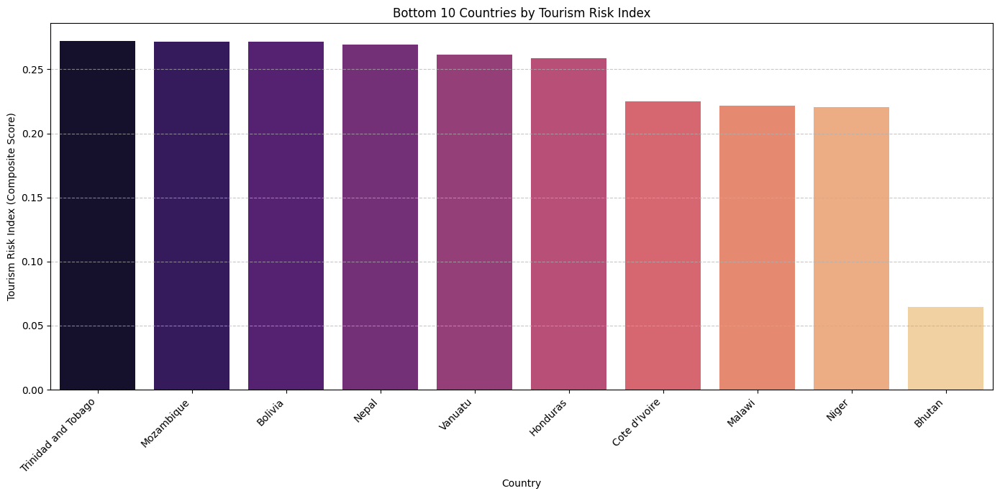

In [107]:
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data for Tourism Risk Index
# We'll use mean inflation, unemployment, and max decline from previous calculations
df_risk = df_sorted.groupby('country').agg(
    avg_inflation=('inflation', 'mean'),
    avg_unemployment=('unemployment', 'mean')
).dropna().reset_index()

# Merge max_decline from the Resilience Analysis (c2353031)
# Ensure 'max_decline' or 'decline_impact' is available, use df_resilience for this.
# Re-calculate max_decline if df_resilience is not readily available or needs refreshing.
max_decline = df_sorted.groupby('country')['tourism_receipts_growth'].min().reset_index()
max_decline.rename(columns={'tourism_receipts_growth': 'max_receipts_decline'}, inplace=True)
max_decline['decline_impact'] = max_decline['max_receipts_decline'].apply(lambda x: 0 if x >= 0 else abs(x))

df_risk = pd.merge(df_risk, max_decline[['country', 'decline_impact']], on='country', how='left')
df_risk.dropna(inplace=True) # Drop countries that don't have all risk components

scaler = MinMaxScaler()

# Normalize all components, as higher values mean higher risk
df_risk['avg_inflation_norm'] = scaler.fit_transform(df_risk[['avg_inflation']])
df_risk['avg_unemployment_norm'] = scaler.fit_transform(df_risk[['avg_unemployment']])
df_risk['decline_impact_norm'] = scaler.fit_transform(df_risk[['decline_impact']])

# Define weights (equal for now)
weights_risk = {
    'avg_inflation_norm': 0.33,
    'avg_unemployment_norm': 0.33,
    'decline_impact_norm': 0.34
}

# Calculate the composite Tourism Risk Index
df_risk['tourism_risk_index'] = (
    df_risk['avg_inflation_norm'] * weights_risk['avg_inflation_norm'] +
    df_risk['avg_unemployment_norm'] * weights_risk['avg_unemployment_norm'] +
    df_risk['decline_impact_norm'] * weights_risk['decline_impact_norm']
)

# Sort and display results
tourism_risk_ranking = df_risk.sort_values(by='tourism_risk_index', ascending=False)

print("Top 10 Countries by Tourism Risk Index:")
display(tourism_risk_ranking[['country', 'tourism_risk_index', 'avg_inflation', 'avg_unemployment', 'decline_impact']].head(10))

print("\nBottom 10 Countries by Tourism Risk Index:")
display(tourism_risk_ranking[['country', 'tourism_risk_index', 'avg_inflation', 'avg_unemployment', 'decline_impact']].tail(10))

# Visualize Top 10 Risk Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_risk_index', data=tourism_risk_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Risk Index')
plt.xlabel('Country')
plt.ylabel('Tourism Risk Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Risk Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_risk_index', data=tourism_risk_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Risk Index')
plt.xlabel('Country')
plt.ylabel('Tourism Risk Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 5. Tourism Competitiveness Index

This index was previously calculated in the "Tourism Performance Analysis" section (cell `23cd403b`). It combines receipts per capita (proxied by GDP), arrivals per capita (proxied by GDP), tourism receipts CAGR, resilience index, and efficiency score (receipts per arrival) to provide an overall measure of a country's competitiveness in the tourism market. Below are the results and visualizations for quick reference.

Top 10 Countries by Tourism Competitiveness Score (Re-displayed):


,country,competitiveness_score,receipts_per_gdp,arrivals_per_gdp,tourism_receipts_cagr,resilience_index,receipts_per_arrival_efficiency
205,Tuvalu,5.108376,269.583430,0.020240,3.819904,0.000378,4.004702e+06
169,Samoa,4.086053,148.954579,0.581619,9.683679,0.030284,6.880848e+02
126,Marshall Islands,1.557712,8.496706,0.029644,1045.723236,0.003481,1.703753e+05
130,"Micronesia, Fed. Sts.",1.438726,97.712200,0.042243,1.592691,0.001082,8.602017e+05
132,Middle income,1.210518,0.000078,0.000024,1045.723236,0.003481,2.266897e+01
84,Guinea,0.979007,0.020031,0.000091,-21.219744,0.600642,3.600528e+03
127,Mauritania,0.976117,0.014886,0.000223,-18.465818,0.598299,2.036660e+02
45,"Congo, Dem. Rep.",0.892120,0.003415,0.000011,808.420190,0.010367,1.054923e+03
65,Eswatini,0.834357,0.009878,0.000362,0.175594,0.518798,3.285667e+01
73,French Polynesia,0.822437,0.079958,0.000092,502.793330,0.000011,5.360245e+05



Bottom 10 Countries by Tourism Competitiveness Score (Re-displayed):


,country,competitiveness_score,receipts_per_gdp,arrivals_per_gdp,tourism_receipts_cagr,resilience_index,receipts_per_arrival_efficiency
149,North America,-0.251878,0.009765,0.000008,0.971319,0.006299,1073.513949
69,European Union,-0.252614,0.019220,0.000046,5.529789,0.002978,537.213931
98,Italy,-0.254739,0.012596,0.000033,5.809178,0.001909,358.396483
202,Turkiye,-0.255236,0.028268,0.000037,3.819904,0.002835,607.920186
58,East Asia & Pacific,-0.255358,0.006238,0.000014,8.239734,0.000076,358.663035
183,Spain,-0.258529,0.091236,0.000067,4.929029,0.000056,1052.933378
19,Belgium,-0.259192,0.018310,0.000014,4.201283,0.000609,1211.199799
68,Europe & Central Asia,-0.259265,0.017573,0.000038,5.390945,0.000004,395.279337
88,"Hong Kong SAR, China",-0.263325,0.080604,0.000119,-6.340305,0.005354,572.214763
210,United States,-0.264338,0.008492,0.000007,0.948476,0.000419,1144.700108


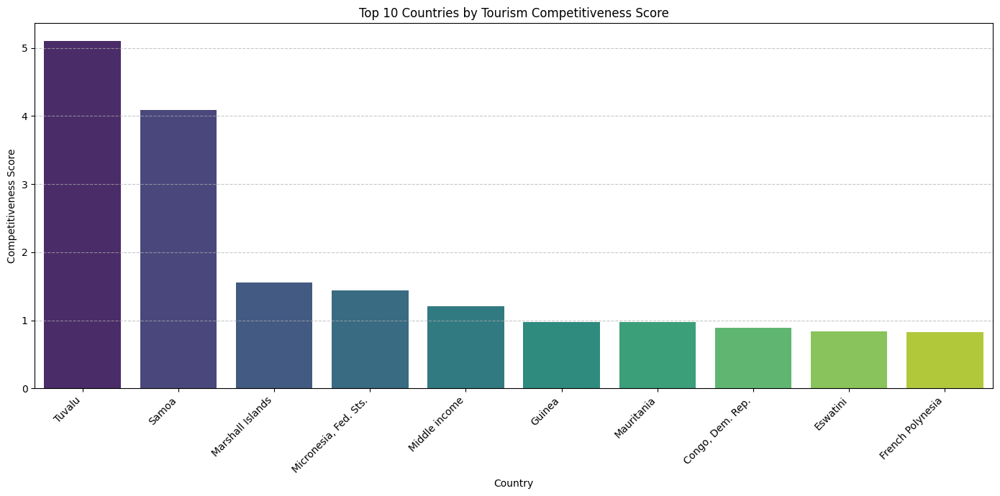

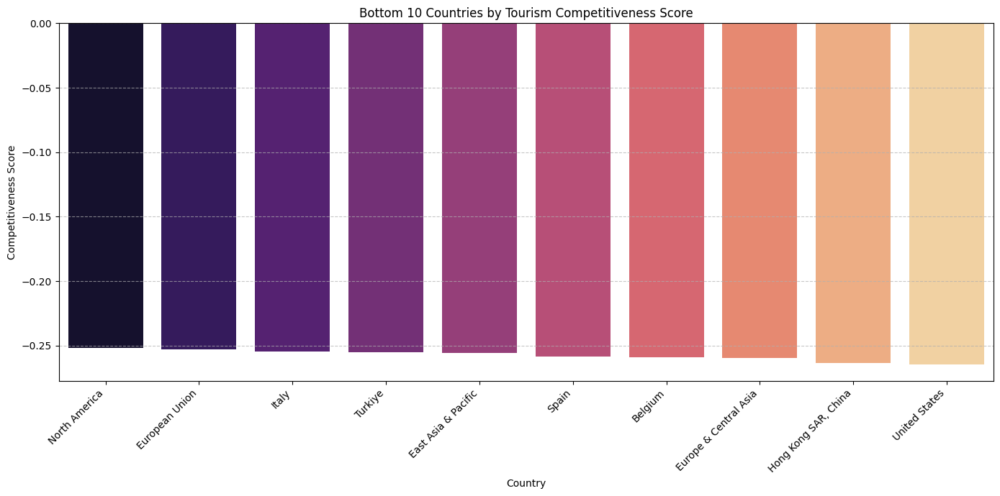

In [108]:
# Re-displaying the Tourism Competitiveness Score from previous calculation (cell 23cd403b)
# This assumes df_comp and competitiveness_ranking are still in memory.

print("Top 10 Countries by Tourism Competitiveness Score (Re-displayed):")
display(competitiveness_ranking[['country', 'competitiveness_score'] + metrics_to_normalize].head(10))

print("\nBottom 10 Countries by Tourism Competitiveness Score (Re-displayed):")
display(competitiveness_ranking[['country', 'competitiveness_score'] + metrics_to_normalize].tail(10))

# Visualize Top 10 Competitiveness Score
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='competitiveness_score', data=competitiveness_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Competitiveness Score')
plt.xlabel('Country')
plt.ylabel('Competitiveness Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Competitiveness Score
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='competitiveness_score', data=competitiveness_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Competitiveness Score')
plt.xlabel('Country')
plt.ylabel('Competitiveness Score')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 6. Tourism Opportunity Index

This index identifies countries with high potential for tourism growth, characterized by relatively lower current tourism penetration but strong underlying economic growth.

Top 10 Countries by Tourism Opportunity Index:


,country,tourism_opportunity_index,receipts_per_gdp,arrivals_per_gdp,avg_gdp_growth
73,French Polynesia,0.999851,0.079958,0.000092,43340.280981
63,Eritrea,0.862397,0.017396,0.000012,25802.487335
200,Tonga,0.764238,0.076805,0.000002,13298.100328
97,Isle of Man,0.666724,0.104904,0.000183,884.772090
183,South Sudan,0.664102,0.017143,0.000038,526.282530
118,Liechtenstein,0.662738,0.183734,0.000004,376.062841
40,Channel Islands,0.660786,0.438819,0.000478,201.205301
82,Guam,0.660321,0.076007,0.000107,58.517324
152,Northern Mariana Islands,0.660297,0.125417,0.000259,74.128666
45,"Congo, Dem. Rep.",0.660163,0.003415,0.000011,20.081802



Bottom 10 Countries by Tourism Opportunity Index:


,country,tourism_opportunity_index,receipts_per_gdp,arrivals_per_gdp,avg_gdp_growth
105,Kiribati,0.646347,8.891566,0.004991,6.060495
219,"Yemen, Rep.",0.644109,4.637634,0.018084,3.942013
127,Marshall Islands,0.632823,8.496706,0.029644,3.558918
198,Timor-Leste,0.630455,9.699352,0.031336,11.685423
115,Lesotho,0.619852,32.698872,0.000302,4.519404
108,Kosovo,0.589867,20.486759,0.079994,40.319465
188,St. Vincent and the Grenadines,0.562124,78.643052,0.002922,4.356729
131,"Micronesia, Fed. Sts.",0.516462,97.712200,0.042243,3.195790
206,Tuvalu,0.318583,269.583430,0.020240,6.586611
170,Samoa,0.147723,148.954579,0.581619,5.795935


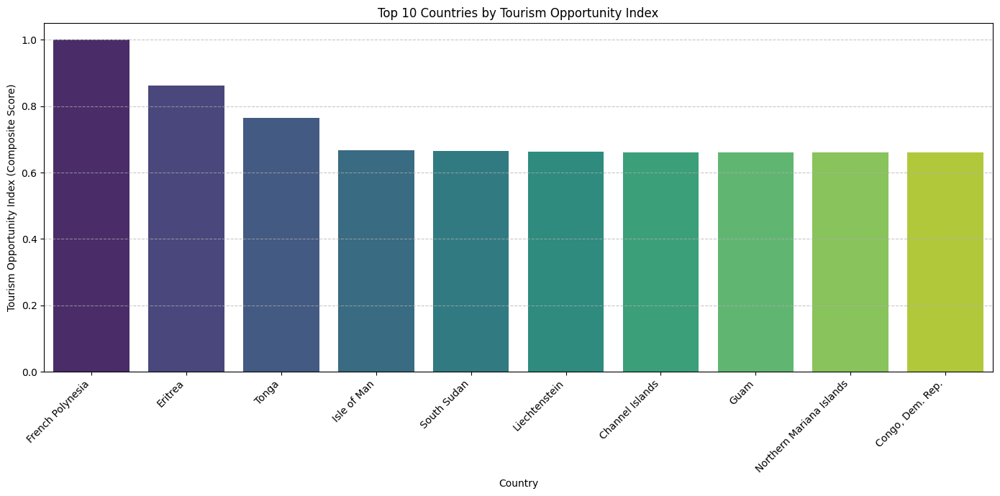

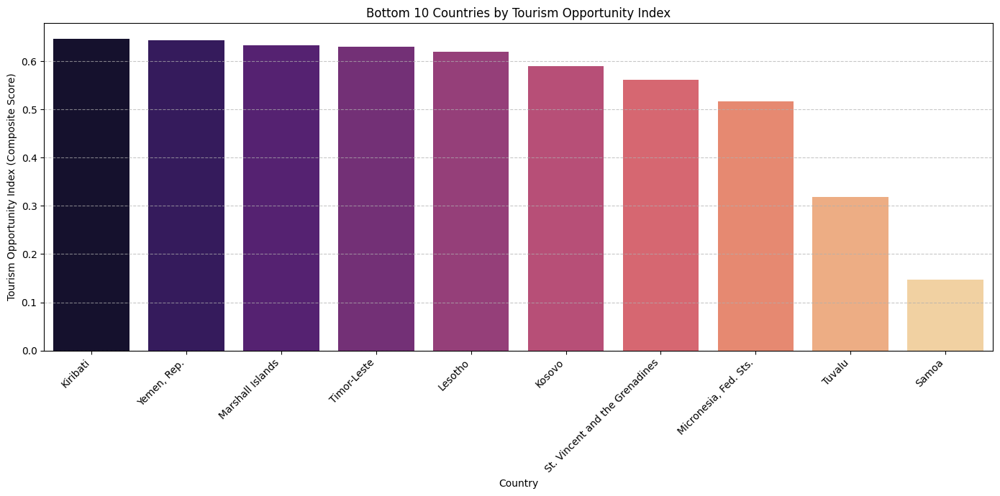

In [109]:
import pandas as pd
from sklearn.preprocessing import MinMaxScaler
import matplotlib.pyplot as plt
import seaborn as sns

# --- Re-create df_sorted with all growth rates to ensure consistency ---
# This section is copied from the primary data preparation cell (41b5b889)
# to ensure 'df_sorted' and its required columns ('gdp_growth') are present.

df = pd.read_csv('/content/world_tourism_economy_data.csv')
df_filled = df.ffill()

values_to_remove = [
    'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
    'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
    'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
    'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
    'Heavily indebted poor countries (HIPPC)', 'IBRD only', 'IDA & IBRD total',
    'IDA total', 'IDA blend', 'IDA only', 'Not classified',
    'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
    'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
    'Macao SAR, China', 'St. Martin (French part)',
    'Middle East & North Africa (excluding high income)', 'OECD members',
    'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
    'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
    'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
    'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
]
first_column_name = df_filled.columns[0]
df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

df = df_filtered.copy() # Ensure df is defined from the cleaned dataframe
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate all year-on-year growth rates
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

# --- End of re-creation of df_sorted ---

# Prepare data for Tourism Opportunity Index
# We'll use inverse of current tourism metrics (receipts/arrivals per GDP) and positive GDP growth.

df_opp = df_sorted.groupby('country').agg(
    avg_tourism_receipts=('tourism_receipts', 'mean'),
    avg_tourism_arrivals=('tourism_arrivals', 'mean'),
    avg_gdp=('gdp', 'mean'),
    avg_gdp_growth=('gdp_growth', 'mean')
).dropna().reset_index()

# Calculate inverse of receipts/arrivals per GDP (low current penetration = high opportunity)
df_opp['receipts_per_gdp'] = df_opp['avg_tourism_receipts'] / (df_opp['avg_gdp'] + 1e-9)
df_opp['arrivals_per_gdp'] = df_opp['avg_tourism_arrivals'] / (df_opp['avg_gdp'] + 1e-9)

scaler = MinMaxScaler()

df_opp['receipts_per_gdp_inv'] = 1 - scaler.fit_transform(df_opp[['receipts_per_gdp']])
df_opp['arrivals_per_gdp_inv'] = 1 - scaler.fit_transform(df_opp[['arrivals_per_gdp']])
df_opp['avg_gdp_growth_norm'] = scaler.fit_transform(df_opp[['avg_gdp_growth']])

# Define weights (equal for now)
weights_opp = {
    'receipts_per_gdp_inv': 0.33,
    'arrivals_per_gdp_inv': 0.33,
    'avg_gdp_growth_norm': 0.34
}

# Calculate the composite Tourism Opportunity Index
df_opp['tourism_opportunity_index'] = (
    df_opp['receipts_per_gdp_inv'] * weights_opp['receipts_per_gdp_inv'] +
    df_opp['arrivals_per_gdp_inv'] * weights_opp['arrivals_per_gdp_inv'] +
    df_opp['avg_gdp_growth_norm'] * weights_opp['avg_gdp_growth_norm']
)

# Sort and display results
tourism_opportunity_ranking = df_opp.sort_values(by='tourism_opportunity_index', ascending=False)

print("Top 10 Countries by Tourism Opportunity Index:")
display(tourism_opportunity_ranking[['country', 'tourism_opportunity_index', 'receipts_per_gdp', 'arrivals_per_gdp', 'avg_gdp_growth']].head(10))

print("\nBottom 10 Countries by Tourism Opportunity Index:")
display(tourism_opportunity_ranking[['country', 'tourism_opportunity_index', 'receipts_per_gdp', 'arrivals_per_gdp', 'avg_gdp_growth']].tail(10))

# Visualize Top 10 Opportunity Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_opportunity_index', data=tourism_opportunity_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Opportunity Index')
plt.xlabel('Country')
plt.ylabel('Tourism Opportunity Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Opportunity Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_opportunity_index', data=tourism_opportunity_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Opportunity Index')
plt.xlabel('Country')
plt.ylabel('Tourism Opportunity Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 7. Tourism Growth Score

This index was previously calculated as the "Tourism Growth Index" in the "Tourism Performance Analysis" section (cell `3308a4b0`). It combines normalized year-on-year growth percentages for tourism receipts, arrivals, exports, and GDP. Below are the results and visualizations for quick reference.

Top 10 Countries by Tourism Growth Index (Re-displayed):


,country,tourism_growth_index,tourism_receipts_growth,tourism_arrivals_growth,tourism_exports_growth,gdp_growth
158,Papua New Guinea,3.834352,11685.870268,67.024323,23639.019878,10.605966
63,Eritrea,3.776079,70503.756832,18126.819815,4.318852,25802.487335
73,French Polynesia,3.622862,11914.479611,13178.676962,50.583892,43340.280981
126,Marshall Islands,3.156186,5426.896013,105651.695188,72.905081,3.558918
205,Tuvalu,1.915820,69482.858055,18483.557734,4.817533,6.586611
130,"Micronesia, Fed. Sts.",1.740345,9083.955163,56273.023285,-5.972150,3.195790
183,Spain,1.382590,70503.756832,-4.653627,4.318852,4.442398
218,"Yemen, Rep.",1.132473,58497.151324,126.187204,42.647236,3.942013
107,Kosovo,1.131118,58458.234034,102.172912,27.423507,40.319465
169,Samoa,1.128644,58458.234034,102.172912,27.423507,5.795935



Bottom 10 Countries by Tourism Growth Index (Re-displayed):


,country,tourism_growth_index,tourism_receipts_growth,tourism_arrivals_growth,tourism_exports_growth,gdp_growth
30,Bulgaria,-0.145895,0.416022,-2.161455,-7.710863,9.283924
14,"Bahamas, The",-0.145954,-2.716803,-2.782715,-4.635905,2.913053
89,Hungary,-0.145958,-1.627896,-2.846325,-6.623795,6.922005
210,United States,-0.146001,-3.300407,-1.132912,-5.905756,4.538215
201,Tunisia,-0.146073,-4.296883,-2.588073,-5.433622,3.410084
36,Cayman Islands,-0.146081,-2.721386,-0.749092,-5.494008,2.180309
12,Austria,-0.146081,-1.789506,-3.624349,-5.897299,3.983979
125,Malta,-0.146274,-3.117120,0.310654,-9.335676,7.600717
51,Curacao,-0.146294,-0.705297,2.668156,-5.924046,-1.884908
52,Cyprus,-0.146547,-4.777029,-1.436383,-9.538237,5.481997


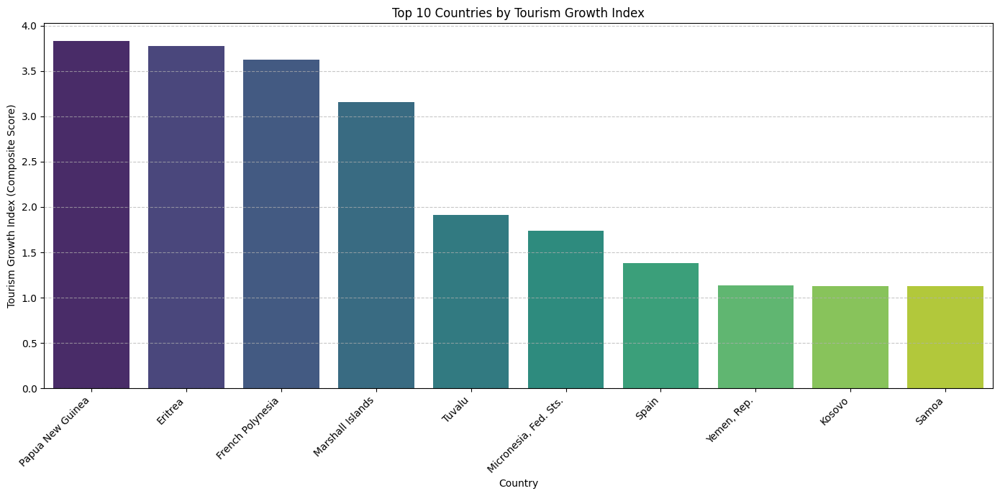

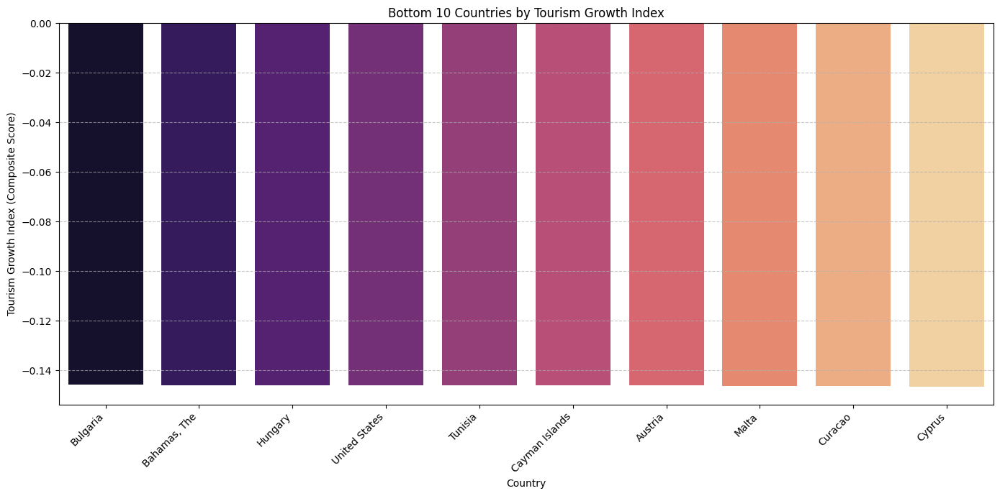

In [110]:
# Re-displaying the Tourism Growth Index from previous calculation (cell 3308a4b0)
# This assumes tourism_growth_ranking is still in memory.

print("Top 10 Countries by Tourism Growth Index (Re-displayed):")
display(tourism_growth_ranking[['country', 'tourism_growth_index'] + growth_metrics_to_normalize].head(10))

print("\nBottom 10 Countries by Tourism Growth Index (Re-displayed):")
display(tourism_growth_ranking[['country', 'tourism_growth_index'] + growth_metrics_to_normalize].tail(10))

# Visualize Top 10 Growth Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_growth_index', data=tourism_growth_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Growth Index')
plt.xlabel('Country')
plt.ylabel('Tourism Growth Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Growth Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='tourism_growth_index', data=tourism_growth_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Growth Index')
plt.xlabel('Country')
plt.ylabel('Tourism Growth Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 8. Economic Health Score

This score provides a broad overview of a country's economic well-being, combining indicators of national output, inflation control, and employment.

Top 10 Countries by Economic Health Score:


,country,economic_health_score,avg_gdp,avg_inflation,avg_unemployment
133,Middle income,0.930097,1.938330e+13,4.700322,4.414584
58,East Asia & Pacific,0.918807,1.827700e+13,2.866777,4.775165
150,North America,0.905714,1.806616e+13,2.374752,5.842087
68,Europe & Central Asia,0.904967,1.986429e+13,3.022633,8.088080
211,United States,0.881754,1.658827e+13,2.545932,5.702600
212,Upper middle income,0.843805,1.540762e+13,4.427053,6.266571
69,European Union,0.797450,1.369136e+13,2.405612,8.830178
67,Euro area,0.765509,1.192299e+13,2.280629,9.111951
42,China,0.753999,8.007898e+12,1.953196,4.764200
101,Japan,0.723276,4.937878e+12,0.290969,3.921760



Bottom 10 Countries by Economic Health Score:


,country,economic_health_score,avg_gdp,avg_inflation,avg_unemployment
114,Lebanon,0.392341,3.260867e+10,35.407971,6.612517
219,"Yemen, Rep.",0.366120,2.090956e+10,8.016039,23.136200
182,South Africa,0.349180,3.230867e+11,5.283036,26.419480
151,North Macedonia,0.340229,9.279161e+09,2.764014,28.052520
190,Sudan,0.334989,4.111199e+10,44.218182,6.858120
108,Kosovo,0.316509,4.724068e+09,2.481081,30.196490
45,"Congo, Dem. Rep.",0.310457,2.938950e+10,53.554682,4.029400
183,South Sudan,0.275057,8.224582e+11,39.471386,15.495880
6,Angola,0.244822,6.631239e+10,51.802081,10.538596
221,Zimbabwe,0.219361,1.696831e+10,49.819556,13.655720


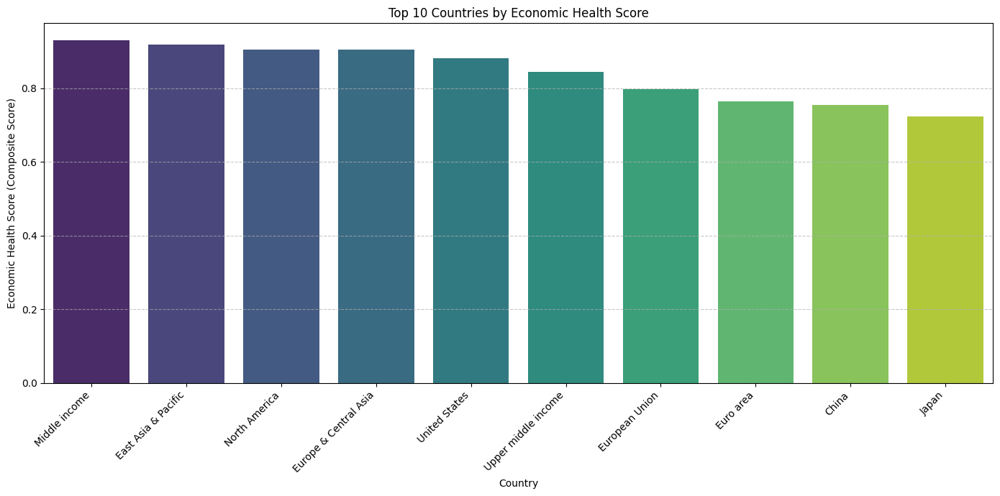

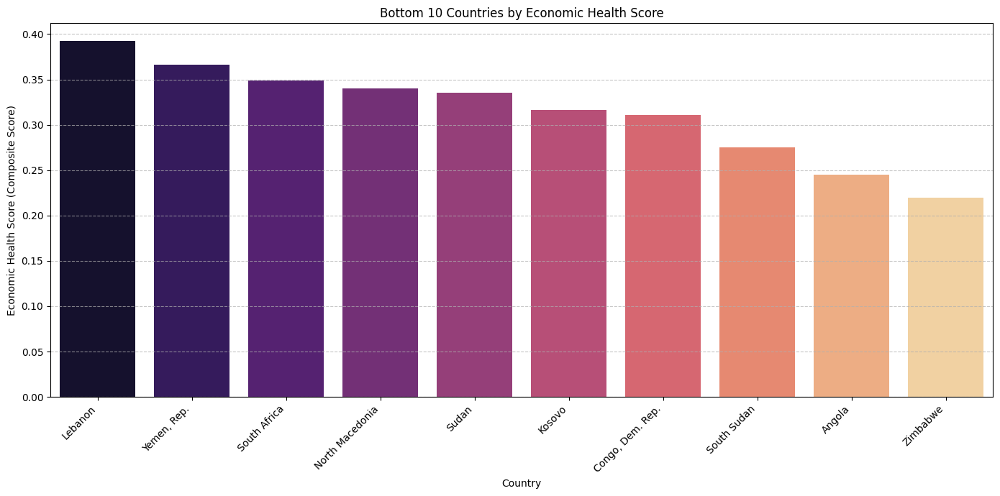

In [111]:
from sklearn.preprocessing import MinMaxScaler

# Prepare data for Economic Health Score
df_econ_health = df_sorted.groupby('country').agg(
    avg_gdp=('gdp', 'mean'),
    avg_inflation=('inflation', 'mean'),
    avg_unemployment=('unemployment', 'mean')
).dropna().reset_index()

scaler = MinMaxScaler()

# Normalize positive indicators
df_econ_health['avg_gdp_norm'] = scaler.fit_transform(df_econ_health[['avg_gdp']])

# Inverse normalize negative indicators
df_econ_health['avg_inflation_inv'] = 1 - scaler.fit_transform(df_econ_health[['avg_inflation']])
df_econ_health['avg_unemployment_inv'] = 1 - scaler.fit_transform(df_econ_health[['avg_unemployment']])

# Define weights (equal for now)
weights_econ_health = {
    'avg_gdp_norm': 0.33,
    'avg_inflation_inv': 0.33,
    'avg_unemployment_inv': 0.34
}

# Calculate the composite Economic Health Score
df_econ_health['economic_health_score'] = (
    df_econ_health['avg_gdp_norm'] * weights_econ_health['avg_gdp_norm'] +
    df_econ_health['avg_inflation_inv'] * weights_econ_health['avg_inflation_inv'] +
    df_econ_health['avg_unemployment_inv'] * weights_econ_health['avg_unemployment_inv']
)

# Sort and display results
economic_health_ranking = df_econ_health.sort_values(by='economic_health_score', ascending=False)

print("Top 10 Countries by Economic Health Score:")
display(economic_health_ranking[['country', 'economic_health_score', 'avg_gdp', 'avg_inflation', 'avg_unemployment']].head(10))

print("\nBottom 10 Countries by Economic Health Score:")
display(economic_health_ranking[['country', 'economic_health_score', 'avg_gdp', 'avg_inflation', 'avg_unemployment']].tail(10))

# Visualize Top 10 Economic Health Score
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='economic_health_score', data=economic_health_ranking.head(10), palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Economic Health Score')
plt.xlabel('Country')
plt.ylabel('Economic Health Score (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Economic Health Score
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='economic_health_score', data=economic_health_ranking.tail(10), palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Economic Health Score')
plt.xlabel('Country')
plt.ylabel('Economic Health Score (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

### 9. Tourism Recovery Score

This score, previously calculated as the "Tourism Resilience Index" in the "Tourism Performance Analysis" section (cell `c2353031`), measures a country's ability to recover from tourism shocks, combining maximum decline in receipts and post-COVID recovery percentage. Below are the results and visualizations for quick reference.

Top 10 Countries by Tourism Resilience Index (Re-displayed):


,country,resilience_index,receipts_recovery_pct,max_receipts_decline
84,Guinea,0.600642,534.615408,-99.879121
127,Mauritania,0.598299,381.751831,-75.000000
65,Eswatini,0.518798,361.538455,-85.567011
23,Bhutan,0.451994,-45.000000,-30.000000
121,Malawi,0.423211,6.451613,-43.548387
62,Equatorial Guinea,0.333340,248.837208,-99.373368
147,Niger,0.291293,-49.230769,-57.419355
190,Suriname,0.267110,3.125000,-70.312500
138,Mozambique,0.218523,-79.629630,-65.123457
215,"Venezuela, RB",0.214915,-74.117647,-66.666667



Bottom 10 Countries by Tourism Resilience Index (Re-displayed):


,country,resilience_index,receipts_recovery_pct,max_receipts_decline
68,Europe & Central Asia,0.000004,-99.988806,-99.991520
73,French Polynesia,0.000011,-99.993405,-99.989608
63,Eritrea,0.000056,-99.981420,-99.983619
183,Spain,0.000056,-99.981420,-99.983619
58,East Asia & Pacific,0.000076,-99.975243,-99.981245
197,Timor-Leste,0.000318,-99.923885,-99.947441
205,Tuvalu,0.000378,-99.840637,-99.950658
210,United States,0.000419,-99.972436,-99.921620
182,South Sudan,0.000533,-99.807373,-99.929068
19,Belgium,0.000609,-99.376240,-99.987064


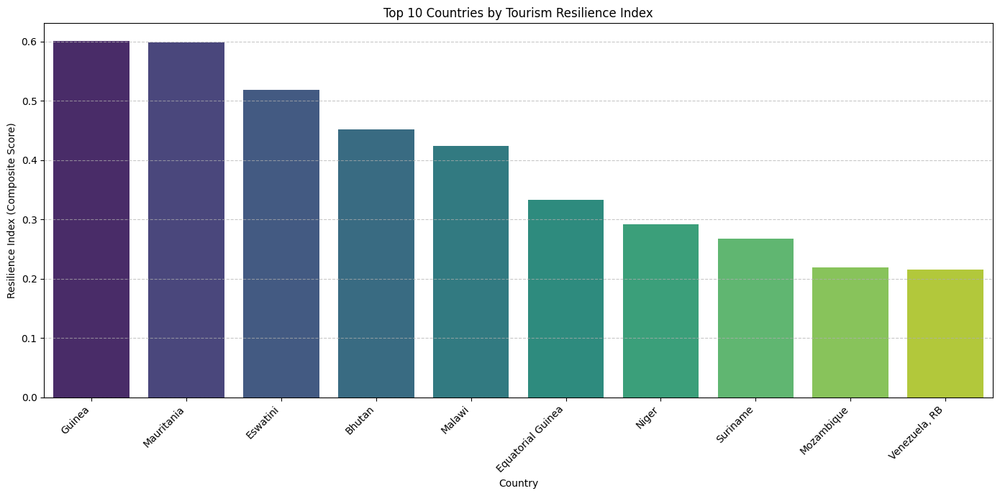

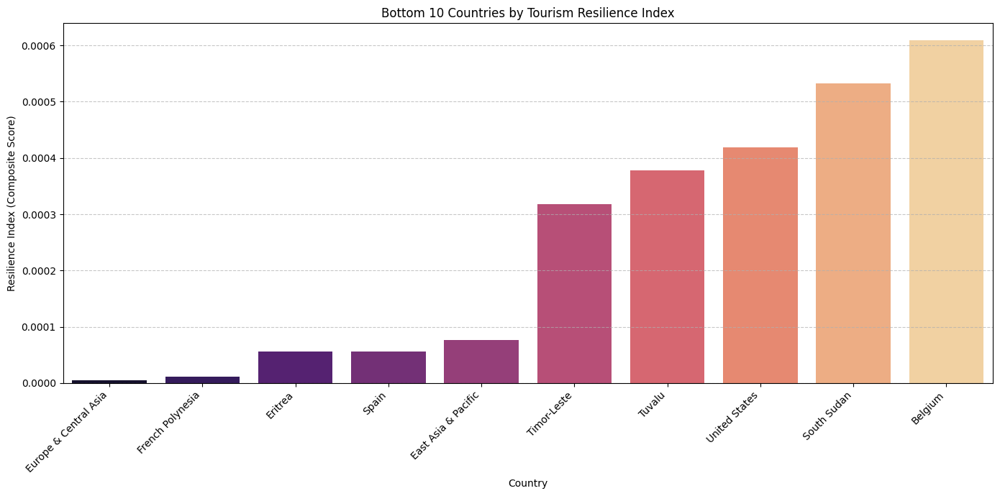

In [112]:
# Re-displaying the Tourism Resilience Index from previous calculation (cell c2353031)
# This assumes df_resilience and top/bottom_resilience are still in memory.

print("Top 10 Countries by Tourism Resilience Index (Re-displayed):")
display(top_resilience[['country', 'resilience_index', 'receipts_recovery_pct', 'max_receipts_decline']])

print("\nBottom 10 Countries by Tourism Resilience Index (Re-displayed):")
display(bottom_resilience[['country', 'resilience_index', 'receipts_recovery_pct', 'max_receipts_decline']])

# Visualize Top 10 Resilience Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='resilience_index', data=top_resilience, palette='viridis', hue='country', legend=False)
plt.title('Top 10 Countries by Tourism Resilience Index')
plt.xlabel('Country')
plt.ylabel('Resilience Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Visualize Bottom 10 Resilience Index
plt.figure(figsize=(14, 7))
sns.barplot(x='country', y='resilience_index', data=bottom_resilience, palette='magma', hue='country', legend=False)
plt.title('Bottom 10 Countries by Tourism Resilience Index')
plt.xlabel('Country')
plt.ylabel('Resilience Index (Composite Score)')
plt.xticks(rotation=45, ha='right')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

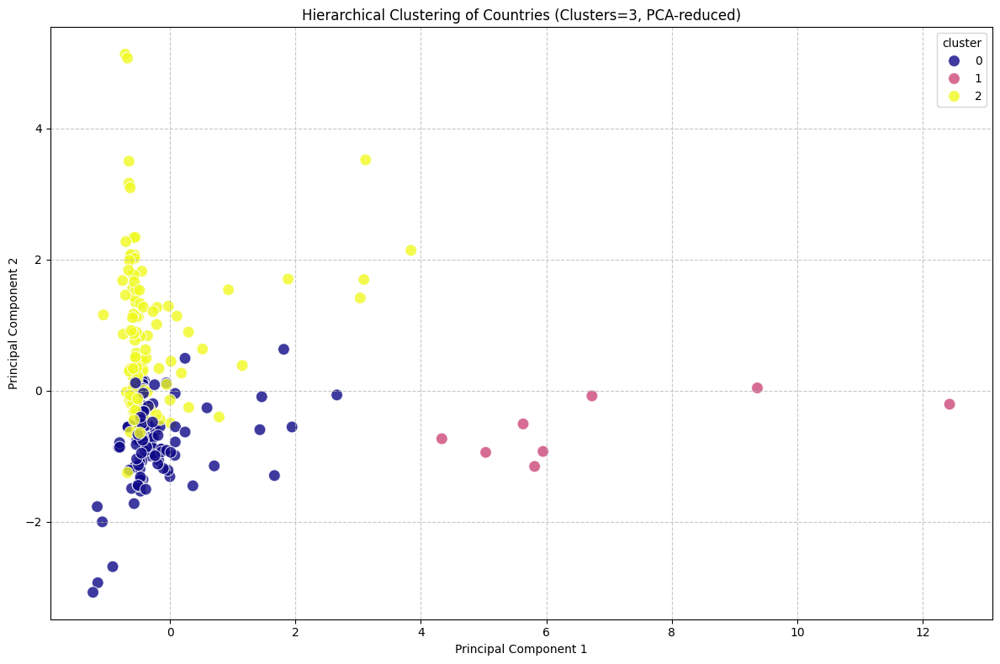

Hierarchical Clustering Results for 3 Clusters:


,gdp,tourism_receipts,tourism_arrivals,tourism_exports,tourism_expenditures,inflation,unemployment
cluster,,,,,,,
0,-0.141978,-0.154258,-0.179670,-0.530031,-0.554018,0.147219,-0.212911
1,4.869424,3.419697,3.697862,-0.546819,-0.124003,-0.424656,-0.356946
2,-0.224187,-0.102377,-0.097719,0.576300,0.568603,-0.116559,0.241858


In [113]:
from sklearn.cluster import AgglomerativeClustering

# Apply Hierarchical Clustering with the chosen number of clusters (e.g., n_clusters=3)
hc_model = AgglomerativeClustering(n_clusters=k, metric='euclidean', linkage='ward')
cluster_labels_hc = hc_model.fit_predict(df_scaled)

# Add cluster labels to the original (but scaled) DataFrame
df_scaled_hc = df_scaled.copy()
df_scaled_hc['cluster'] = cluster_labels_hc

# Visualize the clusters using PCA (re-using df_pca from K-Means as the dimensionality reduction is the same)
df_pca_hc = df_pca.copy()
df_pca_hc['cluster'] = cluster_labels_hc

plt.figure(figsize=(12, 8))
sns.scatterplot(x='PC1', y='PC2', hue='cluster', data=df_pca_hc, palette='plasma', s=100, alpha=0.8)
plt.title(f'Hierarchical Clustering of Countries (Clusters={k}, PCA-reduced)')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.grid(True, linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

print(f"Hierarchical Clustering Results for {k} Clusters:")
display(df_scaled_hc.groupby('cluster').mean())

## Machine Learning Models for Forecasting

This section will implement various machine learning models to forecast key economic indicators for all countries for the years 2024 and 2025. We will then compare these models based on their performance metrics.

### 1. Data Preparation for Machine Learning Models

In [114]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
import pandas as pd
import numpy as np

# Define the target variables for ML forecasting
ml_target_variables = ['tourism_arrivals', 'gdp', 'tourism_receipts', 'tourism_expenditures']

# Define features relevant for forecasting
# We will use 'year' and potentially other economic indicators.
# 'country' will be handled by one-hot encoding to allow a single model across countries.
features = ['year', 'inflation', 'unemployment'] # Example features, can be expanded

# Drop any rows with NaN in the selected features or target variables before processing
df_ml = df_sorted.dropna(subset=features + ml_target_variables).copy()

# Create future years for prediction (2024, 2025)
last_historical_year = df_ml['year'].max()
future_years_list = [last_historical_year + 1, last_historical_year + 2] # 2024, 2025

# Prepare the data for each country individually, as requested by 'for each country'
# This implies training a model per country for the requested indicators.

all_ml_predictions = {} # Re-initialize all_ml_predictions

print(f"Preparing data and training models for {len(df_ml['country'].unique())} countries...")

for country in df_ml['country'].unique():
    country_data = df_ml[df_ml['country'] == country].copy()

    if country_data.shape[0] < 2: # Need at least 2 data points to train even simple models
        continue

    # Store historical data for plotting later
    all_ml_predictions[country] = {'historical': country_data[['year'] + ml_target_variables]}

    # Features (X) and Target (y) for the current country
    X_country = country_data[features]
    y_country = country_data[ml_target_variables]

    # Create future data for prediction for this country
    future_data = pd.DataFrame({'year': future_years_list})
    # Fill other features with the last known value for that country, or an appropriate forecast if available
    for feature in features:
        if feature != 'year':
            future_data[feature] = country_data[feature].iloc[-1] # Use last known value

    all_ml_predictions[country]['future_data'] = future_data
    all_ml_predictions[country]['X_train'] = X_country
    all_ml_predictions[country]['y_train'] = y_country

print("Data preparation for ML models completed.")

Preparing data and training models for 222 countries...
Data preparation for ML models completed.


### 2. Random Forest Regression

Training and predicting with Random Forest Regressor...


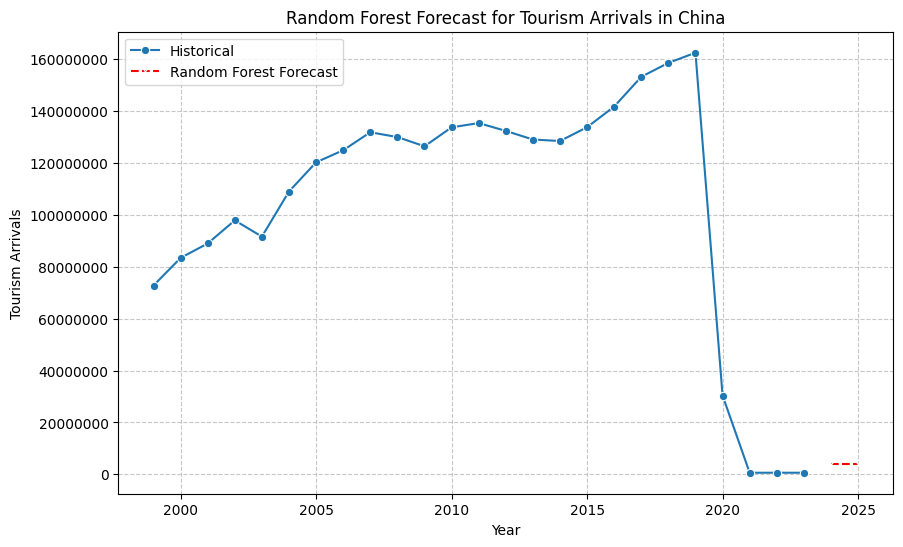

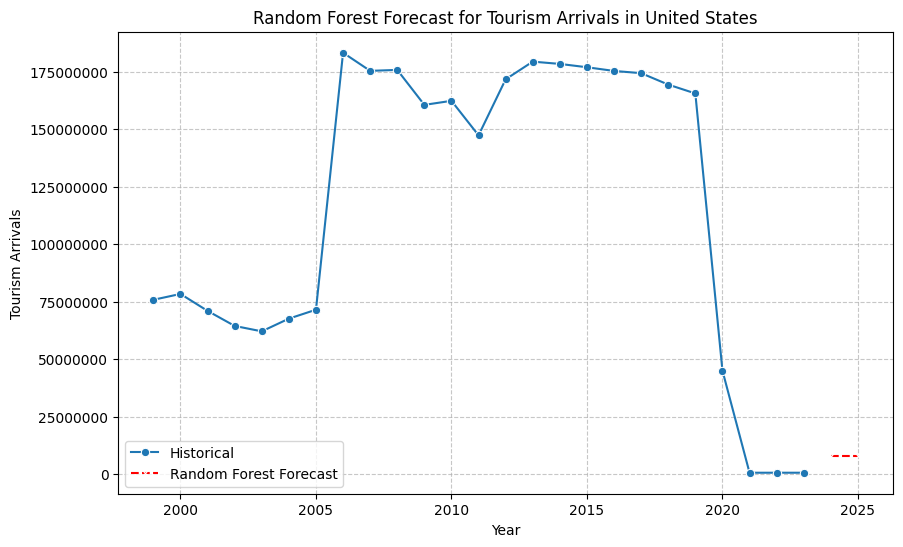

Random Forest Regression completed for all countries and targets.


In [115]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("Training and predicting with Random Forest Regressor...")

for country, data in all_ml_predictions.items():
    X_train_country = data['X_train']
    y_train_country = data['y_train']
    future_data_country = data['future_data']

    # Preprocessor for numerical features (scaling)
    # We only have numerical features here, but this setup is extensible
    preprocessor = StandardScaler()

    for target in ml_target_variables:
        if y_train_country[target].nunique() < 2: # Skip if target has no variance
            all_ml_predictions[country][f'{target}_rf_predictions'] = None
            all_ml_predictions[country][f'{target}_rf_metrics'] = {'r2': np.nan, 'mse': np.nan}
            continue

        # Create a pipeline with preprocessing and the model
        model_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('regressor', RandomForestRegressor(n_estimators=100, random_state=42))])

        # Fit the model
        model_pipeline.fit(X_train_country, y_train_country[target])

        # Predict for future years
        future_predictions = model_pipeline.predict(future_data_country[features])

        # Apply non-negativity constraint for relevant targets
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            future_predictions[future_predictions < 0] = 0

        # Store predictions
        all_ml_predictions[country][f'{target}_rf_predictions'] = pd.DataFrame({
            'year': future_data_country['year'],
            'predicted_value': future_predictions
        })

        # Evaluate model performance on historical data (for comparison/metrics)
        historical_predictions = model_pipeline.predict(X_train_country)
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            historical_predictions[historical_predictions < 0] = 0

        mse = mean_squared_error(y_train_country[target], historical_predictions)
        r2 = r2_score(y_train_country[target], historical_predictions)

        all_ml_predictions[country][f'{target}_rf_metrics'] = {'r2': r2, 'mse': mse}

        # Plotting predictions for a few example countries for illustration
        if country in ['United States', 'China'] and target == 'tourism_arrivals': # Only plot for a subset
            plt.figure(figsize=(10, 6))
            sns.lineplot(x='year', y=target, data=data['historical'], label='Historical', marker='o')
            sns.lineplot(x='year', y='predicted_value', data=all_ml_predictions[country][f'{target}_rf_predictions'], label='Random Forest Forecast', linestyle='--', marker='x', color='red')
            plt.title(f'Random Forest Forecast for {target.replace("_", " ").title()} in {country}')
            plt.xlabel('Year')
            plt.ylabel(target.replace("_", " ").title())
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.legend()
            plt.ticklabel_format(style='plain', axis='y')
            plt.show()
            plt.close()


print("Random Forest Regression completed for all countries and targets.")

### 4. XGBoost Regression

Training and predicting with XGBoost Regressor...


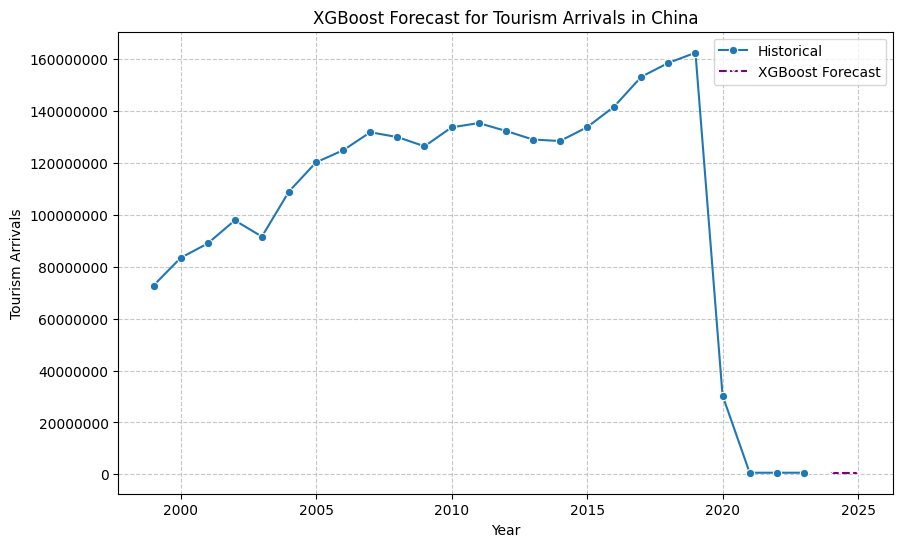

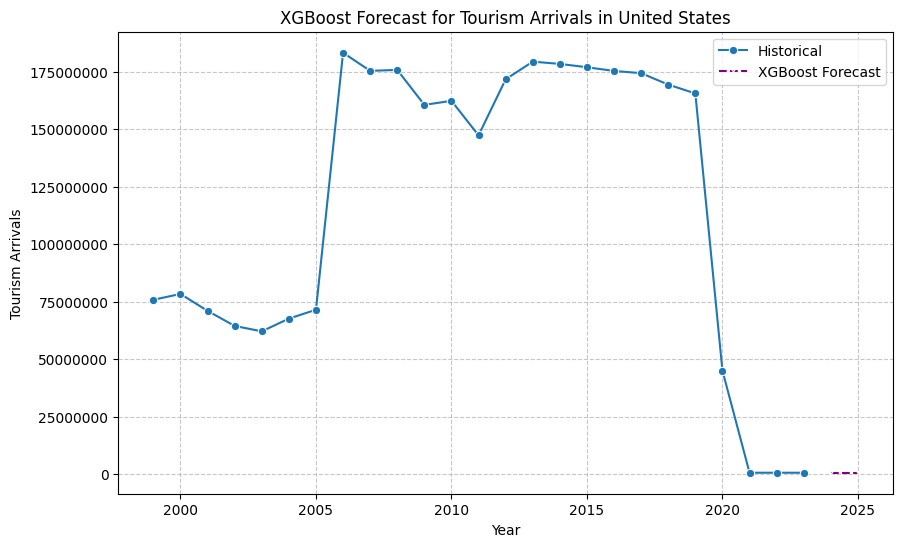

XGBoost Regression completed for all countries and targets.


In [116]:
import xgboost as xgb
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("Training and predicting with XGBoost Regressor...")

for country, data in all_ml_predictions.items():
    X_train_country = data['X_train']
    y_train_country = data['y_train']
    future_data_country = data['future_data']

    # Preprocessor for numerical features (scaling)
    preprocessor = StandardScaler()

    for target in ml_target_variables:
        # Skip if target has no variance or insufficient data points for this model
        if y_train_country[target].nunique() < 2 or X_train_country.shape[0] < 2:
            all_ml_predictions[country][f'{target}_xgb_predictions'] = None
            all_ml_predictions[country][f'{target}_xgb_metrics'] = {'r2': np.nan, 'mse': np.nan}
            continue

        # Create a pipeline with preprocessing and the model
        model_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('regressor', xgb.XGBRegressor(n_estimators=100, random_state=42))])

        # Fit the model
        model_pipeline.fit(X_train_country, y_train_country[target])

        # Predict for future years
        future_predictions = model_pipeline.predict(future_data_country[features])

        # Apply non-negativity constraint for relevant targets
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            future_predictions[future_predictions < 0] = 0

        # Store predictions
        all_ml_predictions[country][f'{target}_xgb_predictions'] = pd.DataFrame({
            'year': future_data_country['year'],
            'predicted_value': future_predictions
        })

        # Evaluate model performance on historical data (for comparison/metrics)
        historical_predictions = model_pipeline.predict(X_train_country)
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            historical_predictions[historical_predictions < 0] = 0

        mse = mean_squared_error(y_train_country[target], historical_predictions)
        r2 = r2_score(y_train_country[target], historical_predictions)

        all_ml_predictions[country][f'{target}_xgb_metrics'] = {'r2': r2, 'mse': mse}

        # Plotting predictions for a few example countries for illustration
        if country in ['United States', 'China'] and target == 'tourism_arrivals': # Only plot for a subset
            plt.figure(figsize=(10, 6))
            sns.lineplot(x='year', y=target, data=data['historical'], label='Historical', marker='o')
            sns.lineplot(x='year', y='predicted_value', data=all_ml_predictions[country][f'{target}_xgb_predictions'], label='XGBoost Forecast', linestyle='--', marker='x', color='purple')
            plt.title(f'XGBoost Forecast for {target.replace("_", " ").title()} in {country}')
            plt.xlabel('Year')
            plt.ylabel(target.replace("_", " ").title())
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.legend()
            plt.ticklabel_format(style='plain', axis='y')
            plt.show()
            plt.close()

print("XGBoost Regression completed for all countries and targets.")

Training and predicting with Decision Tree Regressor...


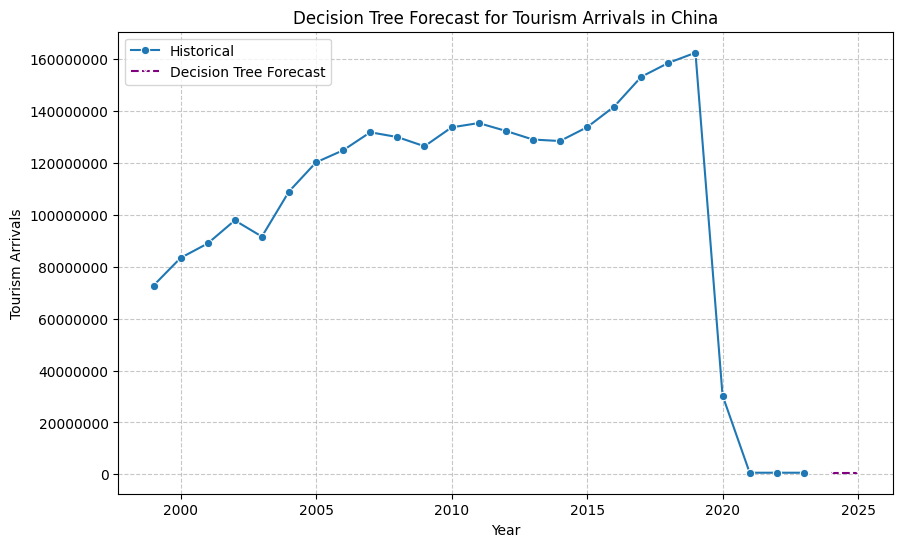

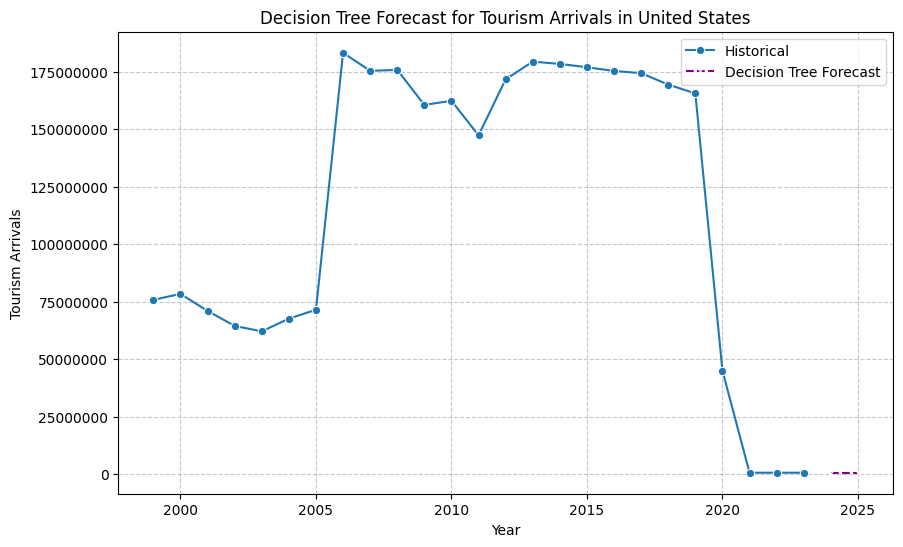

Decision Tree Regression completed for all countries and targets.


In [117]:
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("Training and predicting with Decision Tree Regressor...")

for country, data in all_ml_predictions.items():
    X_train_country = data['X_train']
    y_train_country = data['y_train']
    future_data_country = data['future_data']

    # Preprocessor for numerical features (scaling)
    preprocessor = StandardScaler()

    for target in ml_target_variables:
        # Skip if target has no variance or insufficient data points for this model
        if y_train_country[target].nunique() < 2 or X_train_country.shape[0] < 2:
            all_ml_predictions[country][f'{target}_dt_predictions'] = None
            all_ml_predictions[country][f'{target}_dt_metrics'] = {'r2': np.nan, 'mse': np.nan}
            continue

        # Create a pipeline with preprocessing and the model
        model_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('regressor', DecisionTreeRegressor(random_state=42))])

        # Fit the model
        model_pipeline.fit(X_train_country, y_train_country[target])

        # Predict for future years
        future_predictions = model_pipeline.predict(future_data_country[features])

        # Apply non-negativity constraint for relevant targets
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            future_predictions[future_predictions < 0] = 0

        # Store predictions
        all_ml_predictions[country][f'{target}_dt_predictions'] = pd.DataFrame({
            'year': future_data_country['year'],
            'predicted_value': future_predictions
        })

        # Evaluate model performance on historical data (for comparison/metrics)
        historical_predictions = model_pipeline.predict(X_train_country)
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            historical_predictions[historical_predictions < 0] = 0

        mse = mean_squared_error(y_train_country[target], historical_predictions)
        r2 = r2_score(y_train_country[target], historical_predictions)

        all_ml_predictions[country][f'{target}_dt_metrics'] = {'r2': r2, 'mse': mse}

        # Plotting predictions for a few example countries for illustration
        if country in ['United States', 'China'] and target == 'tourism_arrivals': # Only plot for a subset
            plt.figure(figsize=(10, 6))
            sns.lineplot(x='year', y=target, data=data['historical'], label='Historical', marker='o')
            sns.lineplot(x='year', y='predicted_value', data=all_ml_predictions[country][f'{target}_dt_predictions'], label='Decision Tree Forecast', linestyle='--', marker='x', color='purple')
            plt.title(f'Decision Tree Forecast for {target.replace("_", " ").title()} in {country}')
            plt.xlabel('Year')
            plt.ylabel(target.replace("_", " ").title())
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.legend()
            plt.ticklabel_format(style='plain', axis='y')
            plt.show()
            plt.close()

print("Decision Tree Regression completed for all countries and targets.")

### 3. Gradient Boosting Regression

Training and predicting with Gradient Boosting Regressor...


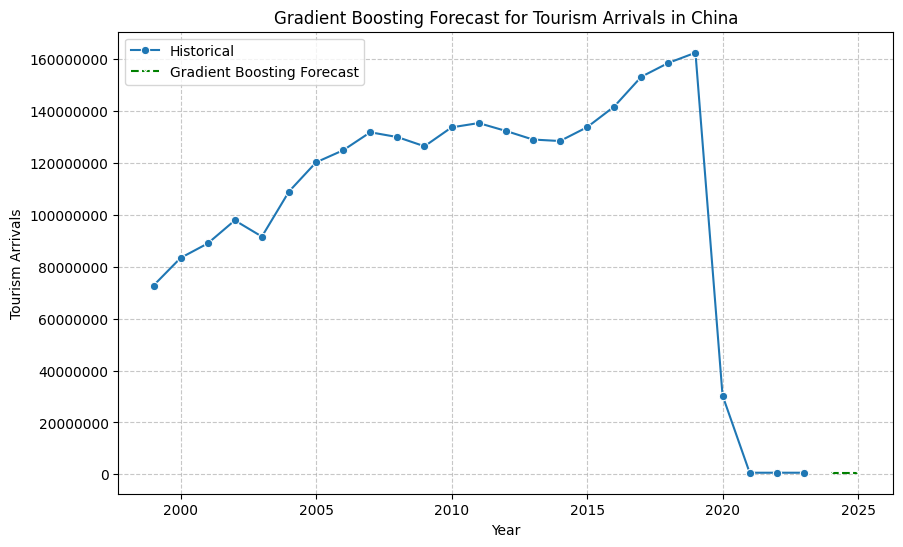

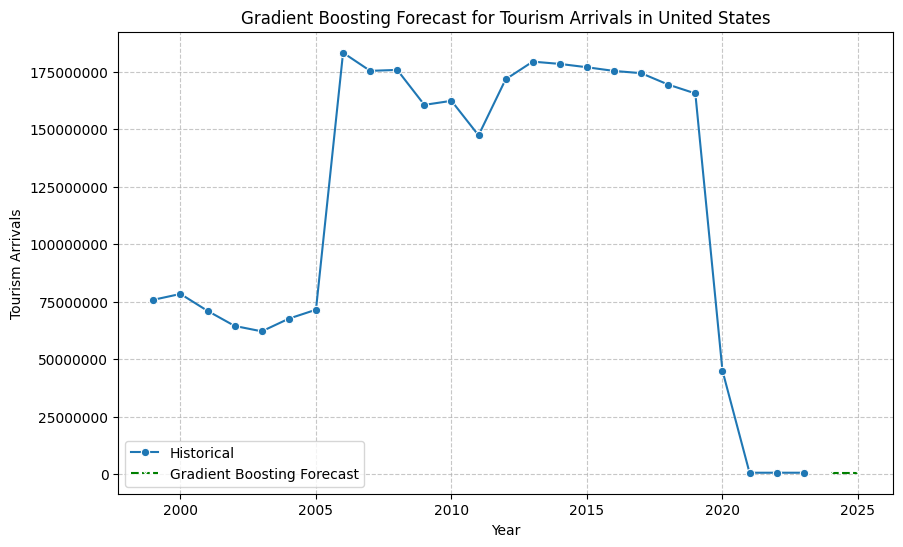

Gradient Boosting Regression completed for all countries and targets.


In [118]:
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.metrics import mean_squared_error, r2_score
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

print("Training and predicting with Gradient Boosting Regressor...")

for country, data in all_ml_predictions.items():
    X_train_country = data['X_train']
    y_train_country = data['y_train']
    future_data_country = data['future_data']

    # Preprocessor for numerical features (scaling)
    preprocessor = StandardScaler()

    for target in ml_target_variables:
        # Skip if target has no variance or insufficient data points for this model
        if y_train_country[target].nunique() < 2 or X_train_country.shape[0] < 2:
            all_ml_predictions[country][f'{target}_gb_predictions'] = None
            all_ml_predictions[country][f'{target}_gb_metrics'] = {'r2': np.nan, 'mse': np.nan}
            continue

        # Create a pipeline with preprocessing and the model
        model_pipeline = Pipeline(steps=[('preprocessor', preprocessor),
                                       ('regressor', GradientBoostingRegressor(n_estimators=100, random_state=42))])

        # Fit the model
        model_pipeline.fit(X_train_country, y_train_country[target])

        # Predict for future years
        future_predictions = model_pipeline.predict(future_data_country[features])

        # Apply non-negativity constraint for relevant targets
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            future_predictions[future_predictions < 0] = 0

        # Store predictions
        all_ml_predictions[country][f'{target}_gb_predictions'] = pd.DataFrame({
            'year': future_data_country['year'],
            'predicted_value': future_predictions
        })

        # Evaluate model performance on historical data (for comparison/metrics)
        historical_predictions = model_pipeline.predict(X_train_country)
        if target in ['tourism_arrivals', 'tourism_receipts', 'tourism_expenditures']:
            historical_predictions[historical_predictions < 0] = 0

        mse = mean_squared_error(y_train_country[target], historical_predictions)
        r2 = r2_score(y_train_country[target], historical_predictions)

        all_ml_predictions[country][f'{target}_gb_metrics'] = {'r2': r2, 'mse': mse}

        # Plotting predictions for a few example countries for illustration
        if country in ['United States', 'China'] and target == 'tourism_arrivals': # Only plot for a subset
            plt.figure(figsize=(10, 6))
            sns.lineplot(x='year', y=target, data=data['historical'], label='Historical', marker='o')
            sns.lineplot(x='year', y='predicted_value', data=all_ml_predictions[country][f'{target}_gb_predictions'], label='Gradient Boosting Forecast', linestyle='--', marker='x', color='green')
            plt.title(f'Gradient Boosting Forecast for {target.replace("_", " ").title()} in {country}')
            plt.xlabel('Year')
            plt.ylabel(target.replace("_", " ").title())
            plt.grid(True, linestyle='--', alpha=0.7)
            plt.legend()
            plt.ticklabel_format(style='plain', axis='y')
            plt.show()
            plt.close()

print("Gradient Boosting Regression completed for all countries and targets.")

## Network Analysis: Tourism and Economic Influence

This section will construct and analyze various networks to understand the relationships and influence among countries based on their tourism and economic characteristics. We will perform:

1.  **Economic Similarity Network**
2.  **Tourism Similarity Network**
3.  **Country Similarity Graph** (Combined)
4.  **Centrality Analysis**
5.  **Community Detection**

### 1. Install Libraries

In [119]:
pip install networkx scipy

### 4. Anomaly Detection: Tourism and Economic Shocks

This section will identify unusual patterns or 'shocks' in tourism and economic indicators for each country. We will use a Z-score based anomaly detection method, which identifies data points that are a certain number of standard deviations away from the mean. This can help pinpoint periods of significant change, such as tourism shocks, economic downturns, or the effects of global events like pandemics.

In [120]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import zscore
from sklearn.preprocessing import StandardScaler

# Ensure df_sorted is available and up-to-date
df = pd.read_csv('/content/world_tourism_economy_data.csv')
df_filled = df.ffill()

values_to_remove = [
    'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
    'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
    'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
    'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
    'Heavily indebted poor countries (HIPPC)', 'IBRD only', 'IDA & IBRD total',
    'IDA total', 'IDA blend', 'IDA only', 'Not classified',
    'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
    'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
    'Macao SAR, China', 'St. Martin (French part)',
    'Middle East & North Africa (excluding high income)', 'OECD members',
    'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
    'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
    'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
    'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
]
first_column_name = df_filled.columns[0]
df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

df = df_filtered.copy()
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate all year-on-year growth rates
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

# Define metrics for anomaly detection
# Tourism shocks: significant deviation in tourism growth rates
tourism_shock_metrics = [
    'tourism_receipts_growth',
    'tourism_arrivals_growth',
    'tourism_exports_growth'
]

# Economic shocks: significant deviation in economic growth rates and key indicators
economic_shock_metrics = [
    'gdp_growth',
    'inflation_pct_change',
    'unemployment_pct_change'
]

# Combine for comprehensive analysis
all_anomaly_metrics = list(set(tourism_shock_metrics + economic_shock_metrics))

# Function to detect anomalies using Z-score per country and metric
def detect_anomalies_zscore(df, country_col, year_col, metric_col, threshold=3.0):
    anomalies = []
    for country in df[country_col].unique():
        country_data = df[df[country_col] == country].copy()
        country_data.dropna(subset=[metric_col], inplace=True)

        # Ensure enough data points to perform rolling calculations meaningfully
        if len(country_data) < 3: # Need at least 3 points for a standard deviation
            continue

        # Store original metric values before scaling for reporting
        original_metric_values = country_data[metric_col].copy()

        # Apply StandardScaler to the metric for this country
        scaler = StandardScaler()
        # Reshape for scaler if it's a Series
        scaled_metric = scaler.fit_transform(country_data[[metric_col]])
        country_data[metric_col + '_scaled'] = scaled_metric

        # Use a fixed window size for rolling mean and std
        fixed_window_size = 5
        # Ensure min_periods is at least 3 for meaningful standard deviation,
        # and not more than the window size or available data.
        min_periods_for_std = min(3, fixed_window_size, len(country_data))

        # Calculate rolling mean and standard deviation on scaled data, using center=False
        # This ensures that anomalies are detected based on *past* data, which is more appropriate for 'shocks'
        mean_scaled = country_data[metric_col + '_scaled'].rolling(window=fixed_window_size, min_periods=min_periods_for_std, center=False).mean()
        std_scaled = country_data[metric_col + '_scaled'].rolling(window=fixed_window_size, min_periods=min_periods_for_std, center=False).std()

        # Handle cases where std is zero or NaN for scaled data.
        # If rolling std is zero/NaN, use the overall country standard deviation for the scaled metric as a fallback.
        overall_std_scaled = country_data[metric_col + '_scaled'].std()

        # If overall_std_scaled is also zero or NaN, no meaningful z-score can be computed for this country/metric.
        if pd.isna(overall_std_scaled) or overall_std_scaled == 0:
            continue

        # Replace rolling std values that are zero or NaN with the overall scaled std.
        std_scaled = std_scaled.replace(0, np.nan).fillna(overall_std_scaled)

        # If after filling, std_scaled still has NaNs (e.g., if data was too sparse), skip.
        if std_scaled.isnull().all():
            continue

        country_data['z_score'] = (country_data[metric_col + '_scaled'] - mean_scaled) / std_scaled
        country_data['is_anomaly'] = (np.abs(country_data['z_score']) > threshold)

        anomalous_rows = country_data[country_data['is_anomaly']]
        for index, row in anomalous_rows.iterrows():
            anomalies.append({
                'country': country,
                'year': row[year_col],
                'metric': metric_col,
                'value': original_metric_values.loc[index],
                'z_score': row['z_score']
            })
    return pd.DataFrame(anomalies)

# --- Perform Anomaly Detection ---
print("Detecting anomalies...")
all_anomalies_df = pd.DataFrame()

for metric in all_anomaly_metrics:
    anomalies_for_metric = detect_anomalies_zscore(df_sorted, 'country', 'year', metric, threshold=2.0) # Lowered threshold to 2.0
    if not anomalies_for_metric.empty:
        all_anomalies_df = pd.concat([all_anomalies_df, anomalies_for_metric], ignore_index=True)

print(f"Detected {len(all_anomalies_df)} anomalies.")

if not all_anomalies_df.empty:
    print("\nSummary of Detected Anomalies:")
    display(all_anomalies_df.head(10))

    # --- Visualize Anomalies for a few example countries ---
    example_countries = ['United States', 'China', 'France', 'Zimbabwe'] # Including Zimbabwe for potential extreme values

    for country in example_countries:
        country_anomalies = all_anomalies_df[all_anomalies_df['country'] == country]
        if not country_anomalies.empty:
            print(f"\n--- Visualizing Anomalies for {country} ---")

            fig_height = 4 * len(all_anomaly_metrics)
            plt.figure(figsize=(15, fig_height))

            for i, metric in enumerate(all_anomaly_metrics):
                ax = plt.subplot(len(all_anomaly_metrics), 1, i + 1)
                plot_data = df_sorted[(df_sorted['country'] == country)][['year', metric]].dropna()

                if not plot_data.empty:
                    sns.lineplot(x='year', y=metric, data=plot_data, label='Value', ax=ax)

                    metric_anomalies = country_anomalies[country_anomalies['metric'] == metric]
                    if not metric_anomalies.empty:
                        ax.scatter(metric_anomalies['year'], metric_anomalies['value'], color='red', s=100, zorder=5, label='Anomaly')

                    ax.set_title(f'{metric.replace("_", " ").title()} with Anomalies for {country}')
                    ax.set_xlabel('Year')
                    ax.set_ylabel(metric.replace("_", " ").title())
                    ax.grid(True, linestyle='--', alpha=0.7)
                    ax.legend()
                    ax.ticklabel_format(style='plain', axis='y') # Prevent scientific notation on y-axis

            plt.tight_layout()
            plt.show()
        else:
            print(f"No anomalies detected for {country} in the selected metrics.")
else:
    print("No anomalies detected across all countries and metrics with the given threshold. You may consider adjusting the threshold.")

Detecting anomalies...
Detected 0 anomalies.
No anomalies detected across all countries and metrics with the given threshold. You may consider adjusting the threshold.


Economic Network: 222 nodes, 21081 edges


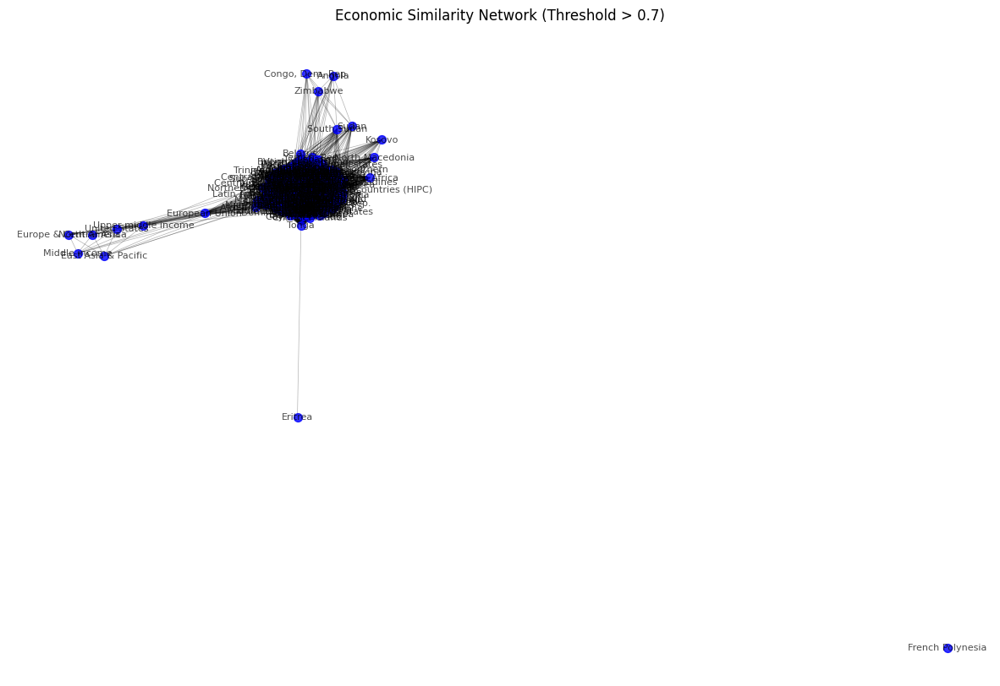

In [121]:
import networkx as nx
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Ensure df_sorted is available and up-to-date
df = pd.read_csv('/content/world_tourism_economy_data.csv')
df_filled = df.ffill()

values_to_remove = [
    'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
    'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
    'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
    'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
    'Heavily indebted poor countries (HIPPC)', 'IBRD only', 'IDA & IBRD total',
    'IDA total', 'IDA blend', 'IDA only', 'Not classified',
    'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
    'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
    'Macao SAR, China', 'St. Martin (French part)',
    'Middle East & North Africa (excluding high income)', 'OECD members',
    'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
    'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
    'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
    'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
]
first_column_name = df_filled.columns[0]
df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

df = df_filtered.copy()
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate all year-on-year growth rates
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

# Aggregate economic features by country (mean across years)
economic_features = ['gdp', 'inflation', 'unemployment', 'gdp_growth']
df_economic = df_sorted.groupby('country')[economic_features].mean().dropna()

# Scale the economic features
scaler = StandardScaler()
df_economic_scaled = pd.DataFrame(scaler.fit_transform(df_economic),
                                   columns=df_economic.columns, index=df_economic.index)

# Calculate Euclidean distance between countries
economic_distances = pdist(df_economic_scaled, metric='euclidean')
economic_similarity_matrix = 1 - (economic_distances / np.max(economic_distances)) # Convert distance to similarity
economic_similarity_square = squareform(economic_similarity_matrix)

# Create a DataFrame for similarity for easier thresholding
economic_similarity_df = pd.DataFrame(economic_similarity_square,
                                      columns=df_economic_scaled.index, index=df_economic_scaled.index)

# Build the graph
G_economic = nx.Graph()

# Add nodes (countries)
G_economic.add_nodes_from(df_economic_scaled.index)

# Add edges based on a similarity threshold
threshold = 0.7 # Adjust this value to control density of the network

for i in range(len(df_economic_scaled.index)):
    for j in range(i + 1, len(df_economic_scaled.index)):
        country1 = df_economic_scaled.index[i]
        country2 = df_economic_scaled.index[j]
        similarity = economic_similarity_df.loc[country1, country2]
        if similarity > threshold:
            G_economic.add_edge(country1, country2, weight=similarity)

print(f"Economic Network: {G_economic.number_of_nodes()} nodes, {G_economic.number_of_edges()} edges")

# Visualize the network
plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G_economic, k=0.15) # k regulates the distance between nodes
nx.draw_networkx_nodes(G_economic, pos, node_size=50, alpha=0.8, node_color="blue")
nx.draw_networkx_edges(G_economic, pos, width=0.5, alpha=0.3)
nx.draw_networkx_labels(G_economic, pos, font_size=8, font_color="black", alpha=0.7)
plt.title('Economic Similarity Network (Threshold > 0.7)')
plt.axis('off')
plt.show()


Tourism Network: 222 nodes, 21047 edges


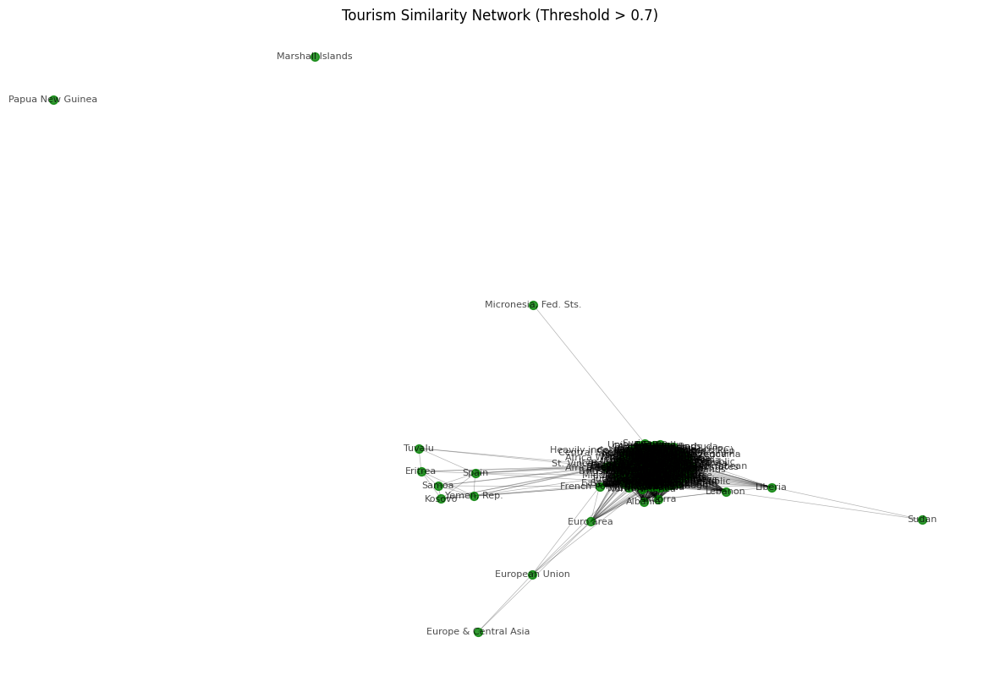

In [122]:
import networkx as nx
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np

# Ensure df_sorted is available and up-to-date
df = pd.read_csv('/content/world_tourism_economy_data.csv')
df_filled = df.ffill()

values_to_remove = [
    'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
    'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
    'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
    'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
    'Heavily indebted poor countries (HIPPC)', 'IBRD only', 'IDA & IBRD total',
    'IDA total', 'IDA blend', 'IDA only', 'Not classified',
    'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
    'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
    'Macao SAR, China', 'St. Martin (French part)',
    'Middle East & North Africa (excluding high income)', 'OECD members',
    'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
    'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
    'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
    'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
]
first_column_name = df_filled.columns[0]
df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

df = df_filtered.copy()
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate all year-on-year growth rates
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

# Aggregate tourism features by country (mean across years)
tourism_features = ['tourism_receipts', 'tourism_arrivals', 'tourism_expenditures', 'tourism_exports',
                    'tourism_receipts_growth', 'tourism_arrivals_growth', 'tourism_expenditures_growth', 'tourism_exports_growth']
df_tourism = df_sorted.groupby('country')[tourism_features].mean().dropna()

# Scale the tourism features
scaler = StandardScaler()
df_tourism_scaled = pd.DataFrame(scaler.fit_transform(df_tourism),
                                   columns=df_tourism.columns, index=df_tourism.index)

# Calculate Euclidean distance between countries
tourism_distances = pdist(df_tourism_scaled, metric='euclidean')
tourism_similarity_matrix = 1 - (tourism_distances / np.max(tourism_distances)) # Convert distance to similarity
tourism_similarity_square = squareform(tourism_similarity_matrix)

# Create a DataFrame for similarity for easier thresholding
tourism_similarity_df = pd.DataFrame(tourism_similarity_square,
                                      columns=df_tourism_scaled.index, index=df_tourism_scaled.index)

# Build the graph
G_tourism = nx.Graph()

# Add nodes (countries)
G_tourism.add_nodes_from(df_tourism_scaled.index)

# Add edges based on a similarity threshold
threshold = 0.7 # Adjust this value to control density of the network

for i in range(len(df_tourism_scaled.index)):
    for j in range(i + 1, len(df_tourism_scaled.index)):
        country1 = df_tourism_scaled.index[i]
        country2 = df_tourism_scaled.index[j]
        similarity = tourism_similarity_df.loc[country1, country2]
        if similarity > threshold:
            G_tourism.add_edge(country1, country2, weight=similarity)

print(f"Tourism Network: {G_tourism.number_of_nodes()} nodes, {G_tourism.number_of_edges()} edges")

# Visualize the network
plt.figure(figsize=(15, 10))
pos = nx.spring_layout(G_tourism, k=0.15) # k regulates the distance between nodes
nx.draw_networkx_nodes(G_tourism, pos, node_size=50, alpha=0.8, node_color="green")
nx.draw_networkx_edges(G_tourism, pos, width=0.5, alpha=0.3)
nx.draw_networkx_labels(G_tourism, pos, font_size=8, font_color="black", alpha=0.7)
plt.title('Tourism Similarity Network (Threshold > 0.7)')
plt.axis('off')
plt.show()

### 1. Propensity Score Matching (PSM)

Propensity Score Matching is a statistical matching technique used to estimate the effect of a treatment, policy, or other intervention by accounting for the covariates that predict receiving the treatment. It aims to reduce confounding and selection bias by equating groups on these covariates, making the comparison between treated and control groups more robust.

We will define a **hypothetical tourism promotion policy** as our 'treatment'. Let's assume that countries with below-average tourism receipts growth in a baseline period (e.g., before 2010) received this `tourism_promotion_policy` starting from 2010. We will then try to estimate its effect on subsequent `tourism_receipts_growth` while controlling for other economic factors.

**Variables Used:**
*   **Outcome:** `tourism_receipts_growth` (post-treatment)
*   **Treatment:** `has_tourism_promotion_policy` (binary: 1 if treated, 0 if control)
*   **Covariates:** `gdp_growth`, `inflation_pct_change`, `unemployment_pct_change` (pre-treatment averages) and `year` for time adjustment.

First, we need to install the `PsmPy` library for easy implementation.

In [123]:
pip install PsmPy

Data for PSM: 222 countries, 210 treated, 12 control.


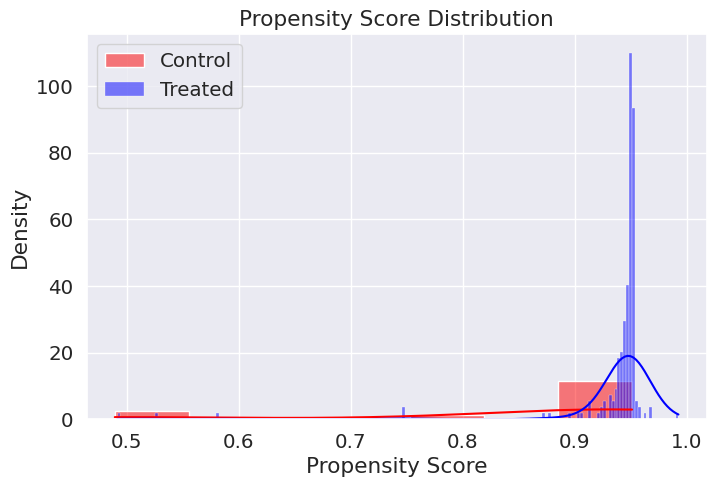

Number of treated units: 210
Number of control units: 12
Number of successful matches (1:1 within caliper): 10
Note: Covariate balance check (e.g., psm.plot_wire()) is currently commented out. Manual balance checks would be performed here.

Average Treatment Effect on the Treated (ATT) for tourism_receipts_growth: -1529.03
This indicates the estimated causal effect of the hypothetical tourism promotion policy on tourism receipts growth.


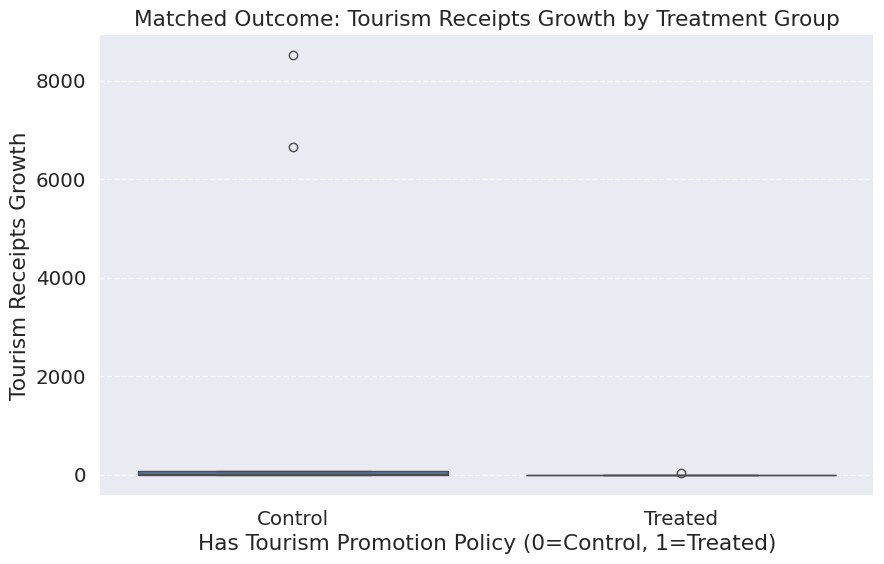

In [124]:
import pandas as pd
import numpy as np
import psmpy as psmpy_lib
from psmpy import PsmPy
from psmpy.functions import cohenD
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression # Import LogisticRegression
from sklearn.neighbors import NearestNeighbors # Import NearestNeighbors for manual matching

# Re-load data and apply initial cleaning steps to ensure df_sorted is defined and up-to-date
df = pd.read_csv('/content/world_tourism_economy_data.csv')
df_filled = df.ffill()

values_to_remove = [
    'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
    'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
    'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
    'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
    'Heavily indebted poor countries (HIPPC)', 'IBRD only', 'IDA & IBRD total',
    'IDA total', 'IDA blend', 'IDA only', 'Not classified',
    'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
    'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
    'Macao SAR, China', 'St. Martin (French part)',
    'Middle East & North Africa (excluding high income)', 'OECD members',
    'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
    'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
    'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
    'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
    'Latin America & the Caribbean (IDA & IBRD countries)',
    'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
    'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
]
first_column_name = df_filled.columns[0]
df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

df = df_filtered.copy()
df_sorted = df.sort_values(by=['country', 'year']).copy()

# Calculate all year-on-year growth rates
df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

# Define the treatment year for the hypothetical policy
treatment_start_year = 2010

# Define a baseline period to identify 'struggling' countries (e.g., pre-treatment_start_year)
baseline_end_year = treatment_start_year - 1

# Identify countries with below-average tourism receipts growth in the baseline period
df_baseline = df_sorted[df_sorted['year'] <= baseline_end_year].copy()
mean_receipts_growth_baseline = df_baseline.groupby('country')['tourism_receipts_growth'].mean()

# Assign 'treatment' to countries that had below-average receipts growth in baseline
below_average_growth_countries = mean_receipts_growth_baseline[mean_receipts_growth_baseline < mean_receipts_growth_baseline.mean()].index.tolist()

df_psm = df_sorted.copy()
df_psm['has_tourism_promotion_policy'] = df_psm['country'].isin(below_average_growth_countries).astype(int)

# Define pre-treatment covariates and post-treatment outcome
# We'll use average values from the baseline period for covariates
# And average values from post-treatment period for the outcome for treated countries

covariate_features = ['gdp_growth', 'inflation_pct_change', 'unemployment_pct_change']
outcome_feature = 'tourism_receipts_growth'

# Prepare data for PSM: one row per country with pre-treatment covariates and post-treatment outcome
# For simplicity, average covariates over the entire pre-treatment period, and outcome over post-treatment period.

df_pre_treatment_avg = df_psm[df_psm['year'] < treatment_start_year].groupby('country')[covariate_features].mean().reset_index()
df_post_treatment_avg = df_psm[df_psm['year'] >= treatment_start_year].groupby('country')[outcome_feature].mean().reset_index()

df_psm_agg = pd.merge(df_pre_treatment_avg, df_post_treatment_avg, on='country', how='inner')

# Add the treatment indicator
df_psm_agg['has_tourism_promotion_policy'] = df_psm_agg['country'].isin(below_average_growth_countries).astype(int)

df_psm_agg.dropna(inplace=True)

print(f"Data for PSM: {len(df_psm_agg)} countries, {df_psm_agg['has_tourism_promotion_policy'].sum()} treated, {len(df_psm_agg) - df_psm_agg['has_tourism_promotion_policy'].sum()} control.")

if df_psm_agg.empty or df_psm_agg['has_tourism_promotion_policy'].nunique() < 2:
    print("Not enough data or unique treatment groups for PSM after aggregation and cleaning.")
    print("Skipping PSM due to insufficient data after preparation.")
elif df_psm_agg['has_tourism_promotion_policy'].sum() == 0 or (len(df_psm_agg) - df_psm_agg['has_tourism_promotion_policy'].sum()) == 0:
    print("Not enough treated or control units for PSM after aggregation and cleaning.")
    print("Skipping PSM due to insufficient data for matching.")
else:
    # Initialize PsmPy object (useful for its data handling, though we do manual PS and matching)
    psm = PsmPy(df_psm_agg, treatment='has_tourism_promotion_policy', indx='country', exclude=[])

    # --- Manual calculation of propensity scores using Logistic Regression ---
    # Prepare X (covariates) and y (treatment) for Logistic Regression
    X_ps = df_psm_agg[covariate_features]
    y_ps = df_psm_agg['has_tourism_promotion_policy']

    # Scale covariates before logistic regression
    scaler_ps = StandardScaler()
    X_ps_scaled = scaler_ps.fit_transform(X_ps)
    X_ps_scaled = pd.DataFrame(X_ps_scaled, columns=covariate_features, index=df_psm_agg.index)

    # Fit Logistic Regression model
    log_reg = LogisticRegression(solver='liblinear', random_state=42) # liblinear is good for small datasets
    log_reg.fit(X_ps_scaled, y_ps)

    # Predict propensity scores (probability of being treated)
    propensity_scores = log_reg.predict_proba(X_ps_scaled)[:, 1] # Probability of class 1 (treated)

    # Add propensity scores to psm.data (which is initially df_psm_agg)
    # Ensure 'propensity_score' column exists for plotting and matching
    psm.data['propensity_score'] = propensity_scores
    # ------------------------------------------------------------------------

    # Manual plot propensity scores
    plt.figure(figsize=(8, 5))
    sns.histplot(psm.data[psm.data['has_tourism_promotion_policy']==0]['propensity_score'], color='red', label='Control', kde=True, stat='density', alpha=0.5)
    sns.histplot(psm.data[psm.data['has_tourism_promotion_policy']==1]['propensity_score'], color='blue', label='Treated', kde=True, stat='density', alpha=0.5)
    plt.title('Propensity Score Distribution')
    plt.xlabel('Propensity Score')
    plt.ylabel('Density')
    plt.legend()
    plt.show()

    # --- Manual K-Nearest Neighbors (KNN) Matching (1:1 without replacement, with caliper) ---
    treated_group = psm.data[psm.data['has_tourism_promotion_policy'] == 1].copy()
    control_group = psm.data[psm.data['has_tourism_promotion_policy'] == 0].copy()

    # Prepare control group propensity scores for KNN fitting (on the full control group initially)
    control_propensity_scores_full = control_group[['propensity_score']]
    nbrs = NearestNeighbors(n_neighbors=1, algorithm='ball_tree').fit(control_propensity_scores_full)

    matched_treated_indices = []
    matched_control_indices = []
    used_control_original_indices = set() # To track which control units have been matched

    caliper = 0.2 * np.std(psm.data['propensity_score'])

    # Sort treated units by propensity score (optional, but can improve greedy matching)
    treated_group_sorted = treated_group.sort_values(by='propensity_score').index

    for treated_original_idx in treated_group_sorted:
        treated_unit_prop_score = psm.data.loc[treated_original_idx, 'propensity_score']

        # Create a DataFrame for the query input to avoid the UserWarning
        query_propensity = pd.DataFrame([[treated_unit_prop_score]], columns=['propensity_score'])

        # Find the nearest control neighbor from the *full* control group, initially
        distances, indices = nbrs.kneighbors(query_propensity)

        # The index returned by kneighbors is relative to control_propensity_scores_full
        closest_control_idx_in_full_control = indices[0][0]
        closest_control_original_idx = control_propensity_scores_full.index[closest_control_idx_in_full_control]
        dist = distances[0][0]

        # Check if this control unit has already been used AND if it satisfies the caliper
        if (closest_control_original_idx not in used_control_original_indices) and (dist <= caliper):
            matched_treated_indices.append(treated_original_idx)
            matched_control_indices.append(closest_control_original_idx)
            used_control_original_indices.add(closest_control_original_idx)

    # Collect matched data
    matched_treated_df = psm.data.loc[matched_treated_indices].copy()
    matched_control_df = psm.data.loc[matched_control_indices].copy()

    # Combine treated and matched control units into a single DataFrame
    matched_df = pd.concat([matched_treated_df, matched_control_df])

    print(f"Number of treated units: {len(treated_group)}")
    print(f"Number of control units: {len(control_group)}")
    print(f"Number of successful matches (1:1 within caliper): {len(matched_treated_df)}")

    # ------------------------------------------------------------------------

    # Plot covariate balance after matching (manual implementation would be complex here)
    # psm.plot_wire() was previously attempted and likely encountered issues with the psmpy library version.
    # If balance diagnostics are crucial, manual plotting of balance metrics (e.g., Cohen's D for covariates) would be needed here.
    print("Note: Covariate balance check (e.g., psm.plot_wire()) is currently commented out. Manual balance checks would be performed here.")

    if matched_df.empty:
        print("No successful matches found after applying caliper.")
    else:
        # Calculate treatment effect (Average Treatment Effect on the Treated - ATT)
        att = matched_df.groupby('has_tourism_promotion_policy')[outcome_feature].mean()

        if 1 in att.index and 0 in att.index:
            treatment_effect = att[1] - att[0]
            print(f"\nAverage Treatment Effect on the Treated (ATT) for {outcome_feature}: {treatment_effect:.2f}")
            print("This indicates the estimated causal effect of the hypothetical tourism promotion policy on tourism receipts growth.")
        else:
            print("Could not calculate ATT: Missing either treated or control group in matched data.")

        # Visualize the matched outcome
        plt.figure(figsize=(10, 6))
        sns.boxplot(x='has_tourism_promotion_policy', y=outcome_feature, data=matched_df)
        plt.title(f'Matched Outcome: {outcome_feature.replace("_", " ").title()} by Treatment Group')
        plt.xlabel('Has Tourism Promotion Policy (0=Control, 1=Treated)')
        plt.ylabel(outcome_feature.replace("_", " ").title())
        plt.xticks([0, 1], ['Control', 'Treated'])
        plt.grid(axis='y', linestyle='--', alpha=0.7)
        plt.show()

In [130]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import os

# --- Re-create df_sorted with all growth rates to ensure consistency ---
# This section is copied from the primary data preparation cell (41b5b889)
# to ensure 'df_sorted' and its required columns are present.

file_path = '/content/world_tourism_economy_data.csv'

if not os.path.exists(file_path):
    print(f"Error: Data file not found at {file_path}. Please upload 'world_tourism_economy_data.csv' to the /content/ directory.")
else:
    df = pd.read_csv(file_path)
    df_filled = df.ffill()

    values_to_remove = [
        'Aruba', 'American Samoa', 'Burundi', 'Burkina Faso',
        'East Asia & Pacific (excluding high income)', 'Early-demographic dividend',
        'Europe & Central Asia (excluding high income)', 'Fragile and conflict affected situations',
        'Faroe Islands', 'Gabon', 'Guinea-Bissau', 'High income',
        'Heavily indebted poor countries (HIPPC)', 'IBRD only', 'IDA & IBRD total',
        'IDA total', 'IDA blend', 'IDA only', 'Not classified',
        'Latin America & Caribbean (excluding high income)', 'Least developed countries: UN classification',
        'Low income', 'Lower middle income', 'Low & middle income', 'Late-demographic dividend',
        'Macao SAR, China', 'St. Martin (French part)',
        'Middle East & North Africa (excluding high income)', 'OECD members',
        'Other small states', 'Pre-demographic dividend', 'Post-demographic dividend',
        'South Asia', 'Sierra Leone', 'Sub-Saharan Africa (excluding high income)',
        'Sao Tome and Principe', 'Sint Maarten (Dutch part)',
        'East Asia & Pacific (IDA & IBRD countries)', 'Europe & Central Asia (IDA & IBRD countries)',
        'Latin America & the Caribbean (IDA & IBRD countries)',
        'Middle East & North Africa (IDA & IBRD countries)', 'South Asia (IDA & IBRD)',
        'Sub-Saharan Africa (IDA & IBRD countries)', 'Virgin Islands (U.S.)', 'World'
    ]
    first_column_name = df_filled.columns[0]
    df_filtered = df_filled[~df_filled[first_column_name].isin(values_to_remove)]

    df = df_filtered.copy() # Ensure df is defined from the cleaned dataframe
    df_sorted = df.sort_values(by=['country', 'year']).copy()

    # Calculate all year-on-year growth rates
    df_sorted['tourism_receipts_growth'] = df_sorted.groupby('country')['tourism_receipts'].pct_change(fill_method=None) * 100
    df_sorted['gdp_growth'] = df_sorted.groupby('country')['gdp'].pct_change(fill_method=None) * 100
    df_sorted['tourism_arrivals_growth'] = df_sorted.groupby('country')['tourism_arrivals'].pct_change(fill_method=None) * 100
    df_sorted['tourism_expenditures_growth'] = df_sorted.groupby('country')['tourism_expenditures'].pct_change(fill_method=None) * 100
    df_sorted['tourism_exports_growth'] = df_sorted.groupby('country')['tourism_exports'].pct_change(fill_method=None) * 100
    df_sorted['inflation_pct_change'] = df_sorted.groupby('country')['inflation'].pct_change(fill_method=None) * 100
    df_sorted['unemployment_pct_change'] = df_sorted.groupby('country')['unemployment'].pct_change(fill_method=None) * 100

    # --- End of re-creation of df_sorted ---

    # Aggregate global data
    global_data = df_sorted.groupby('year')[['tourism_receipts', 'tourism_arrivals', 'tourism_exports']].sum().reset_index()

    # Create subplots for the global overview
    fig = make_subplots(rows=3, cols=1,
                        subplot_titles=('Global Tourism Receipts Over Time',
                                        'Global Tourist Arrivals Over Time',
                                        'Global Tourism Exports Over Time'))

    # Plot Global Tourism Receipts
    fig.add_trace(go.Scatter(x=global_data['year'], y=global_data['tourism_receipts'], mode='lines+markers', name='Tourism Receipts'),
                  row=1, col=1)
    fig.update_yaxes(title_text='Total Tourism Receipts', row=1, col=1)

    # Plot Global Tourist Arrivals
    fig.add_trace(go.Scatter(x=global_data['year'], y=global_data['tourism_arrivals'], mode='lines+markers', name='Tourism Arrivals', marker_color='red'),
                  row=2, col=1)
    fig.update_yaxes(title_text='Total Tourist Arrivals', row=2, col=1)

    # Plot Global Tourism Exports
    fig.add_trace(go.Scatter(x=global_data['year'], y=global_data['tourism_exports'], mode='lines+markers', name='Tourism Exports', marker_color='green'),
                  row=3, col=1)
    fig.update_yaxes(title_text='Total Tourism Exports', row=3, col=1)

    fig.update_layout(height=900, title_text='Global Tourism Key Indicators Over Time', showlegend=False)
    fig.show()